# Autoencoder

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
mydrive = "/content/drive/My Drive/Colab Notebooks/NNDL/HW2/"

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import KFold, train_test_split, ShuffleSplit, ParameterGrid
import torch.nn.functional as F
import seaborn as sns
import random
import os
import imageio
from sklearn.decomposition import PCA
import torchvision
from sklearn.metrics import confusion_matrix
from tqdm import tqdm 
from pprint import pprint
import plotly.express as px
import matplotlib.gridspec as gridspec
from sklearn.manifold import TSNE
sns.set_theme()
sns.set_style("whitegrid")
torch.manual_seed(0)
np.random.seed(0)
torch.backends.cudnn.deterministic = True
random.seed(0)
torch.cuda.manual_seed_all(0)

In [ ]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Training device: {device}")

Training device: cuda


In [ ]:
### Download the data and create dataset
data_dir = 'dataset'

train_dataset = torchvision.datasets.MNIST('classifier_data', train=True, download=True,transform=transforms.ToTensor())
test_dataset  = torchvision.datasets.MNIST('classifier_data', train=False, download=True,transform=transforms.ToTensor())

Extracting classifier_data/MNIST/raw/train-images-idx3-ubyte.gz to classifier_data/MNIST/raw


Extracting classifier_data/MNIST/raw/train-labels-idx1-ubyte.gz to classifier_data/MNIST/raw


Extracting classifier_data/MNIST/raw/t10k-images-idx3-ubyte.gz to classifier_data/MNIST/raw


Extracting classifier_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to classifier_data/MNIST/raw
Processing...
Done!





/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning:

The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)



In [ ]:
rs = ShuffleSplit(n_splits=1, test_size=.2, random_state=42)
for train_index, val_index in rs.split(train_dataset):
  Train = torch.utils.data.Subset(train_dataset,train_index)
  Val = torch.utils.data.Subset(train_dataset,val_index)
  train_loader = torch.utils.data.DataLoader(Train, batch_size = 256, shuffle = False, num_workers= 8)
  valid_loader = torch.utils.data.DataLoader(Val, batch_size = 256, shuffle = False, num_workers= 8)
  
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size = 256, shuffle = False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size = 256, shuffle = True)

Display some samples

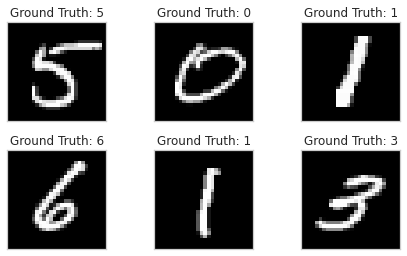

In [ ]:
examples = enumerate(train_loader)
batch_idx, (example_data, example_targets) = next(examples)

fig = plt.figure()
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.tight_layout()
  plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
  plt.title("Ground Truth: {}".format(example_targets[i]))
  plt.xticks([])
  plt.yticks([])
fig.savefig('train_data.png')

Apply Xavier distribution

In [ ]:
def init_weights(m):
  if type(m) == nn.Linear:
    torch.nn.init.xavier_uniform_(m.weight)
    m.bias.data.fill_(0.01)

## Encoder

In [ ]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim,Nh1):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            # First convolutional layer
            nn.Conv2d(1, 8, 3, stride=2, padding=1),
            nn.ReLU(True),
            # Second convolutional layer
            nn.Conv2d(8, 16, 3, stride=2, padding=1),
            nn.ReLU(True),
            # Third convolutional layer
            nn.Conv2d(16, 32, 3, stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        self.encoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(3 * 3 * 32, Nh1),
            nn.ReLU(True),
            # Second linear layer
            nn.Linear(Nh1, encoded_space_dim)
        )
        
    def forward(self, x):
        # Apply convolutions
        x = self.encoder_cnn(x)
        # Flatten
        x = self.flatten(x)
        # # Apply linear layers
        x = self.encoder_lin(x)
        return x

sample = next(iter(train_loader))
sample = sample[0]
print(sample.shape)

encoded_space_dim = 2
enc = Encoder(encoded_space_dim,64)
out = enc(sample)
print(out.shape)

torch.Size([256, 1, 28, 28])
torch.Size([256, 2])


## Decoder

In [ ]:
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim,Nh1):
        super().__init__()

        ### Linear section
        self.decoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(encoded_space_dim, Nh1),
            nn.ReLU(True),
            # Second linear layer
            nn.Linear(Nh1, 3 * 3 * 32),
            nn.ReLU(True)
        )

        ### Unflatten
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        ### Convolutional section
        self.decoder_conv = nn.Sequential(
            # First transposed convolution
            nn.ConvTranspose2d(32, 16, 3, stride=2, output_padding=0),
            nn.ReLU(True),
            # Second transposed convolution
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            # Third transposed convolution
            nn.ConvTranspose2d(8, 1, 3, stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        # Apply linear layers
        x = self.decoder_lin(x)
        # Unflatten
        x = self.unflatten(x)
        # Apply transposed convolutions
        x = self.decoder_conv(x)
        # Apply a sigmoid to force the output to be between 0 and 1 (valid pixel values)
        x = torch.sigmoid(x)
        return x

In [ ]:
def train(encoder, decoder, train, valid, epochs, optimizer, loss_fn, encoded_space_dim):
  train_loss_log = []
  val_loss_log = []
  for epoch_num in range(epochs):
    print("Epoch:",epoch_num+1)
    train_loss= []
    encoder.train()
    decoder.train()
    for sample_batched, _ in train:
      x_batch = sample_batched.to(device)
    
      encoded_data = encoder(x_batch)
      decoded_data = decoder(encoded_data)
      
      loss = loss_fn(decoded_data, x_batch)

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_batch = loss.detach().cpu().numpy()
      train_loss.append(loss_batch)

    train_loss = np.mean(train_loss)
    print(f"AVERAGE TRAIN LOSS: {train_loss}")
    train_loss_log.append(train_loss)

    val_loss= []
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
      for sample_batched, _ in valid:
        x_batch = sample_batched.to(device)
        
        encoded_data = encoder(x_batch)
        decoded_data = decoder(encoded_data)
        
        loss = loss_fn(decoded_data, x_batch)

        loss_batch = loss.detach().cpu().numpy()
        val_loss.append(loss_batch)
        
      val_loss = np.mean(val_loss)
      print(f"AVERAGE VAL LOSS: {np.mean(val_loss)}")
      val_loss_log.append(val_loss)
  

    img = test_dataset[0][0].unsqueeze(0).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
    # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(12,6))
    axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[0].set_title('Original image')
    axs[0].grid()
    axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[1].set_title('Reconstructed image (Epoch: %d)' % (epoch_num + 1))
    axs[1].grid()
    plt.tight_layout()
    plt.pause(0.1)
    # Save figures
    os.makedirs(mydrive+'imgs/autoencoder_progress_%d_features' % encoded_space_dim, exist_ok=True)
    fig.savefig(mydrive+'imgs/autoencoder_progress_%d_features/epoch_%d.jpg' % (encoded_space_dim, epoch_num + 1))
    plt.show()
    plt.close()

    #scheduler.step()
  return train_loss_log, val_loss_log

In [ ]:
def GridSearch(grid, n, e):
  res = pd.DataFrame(columns=["Encoded space dim","L2","Optimizer","Epochs", "Learning rate","Valid_Loss"])
  np.random.seed(420)
  it = 1
  for i in np.random.choice(grid,n):
    print("Nh1 = ", i["Nh1"],
          "| Optimizer = ", i["optimizer"] , 
          "| Lr = ", "{:.2e}".format(abs(i["lr"])), 
          "| weight_dec = ", "{:.2e}".format(abs(i["weight_dec"])),
          "| Encoded_space_dim = ", i["encoded_space_dim"], 
          "| Iter = ", it,"/", n)
    encoder = Encoder(encoded_space_dim=i["encoded_space_dim"], Nh1 = i["Nh1"])
    decoder = Decoder(encoded_space_dim=i["encoded_space_dim"], Nh1 = i["Nh1"])
    encoder.apply(init_weights)
    decoder.apply(init_weights)
    encoder.to(device)
    decoder.to(device)
    params_to_optimize = [{'params': encoder.parameters()},{'params': decoder.parameters()}]
    optimizer = {"Adam":torch.optim.Adam, "RMSprop":torch.optim.RMSprop}
    opti = optimizer[i["optimizer"]](params_to_optimize, abs(i["lr"]), weight_decay = abs(i["weight_dec"]))
    loss_fn = torch.nn.MSELoss()
    t_l , v_l = train(encoder,decoder,train_loader,valid_loader,e,opti,loss_fn,i["encoded_space_dim"])
    data = pd.Series({"Nh1" : int(i["Nh1"]),
                      "Encoded space dim": i["encoded_space_dim"],
                      "Optimizer" : i["optimizer"], 
                      "Epochs" : e,
                      "Learning rate": abs(i["lr"]),
                      "L2": abs(i["weight_dec"]),
                      "Valid_Loss"  : v_l[-1]},
                    name=it)        
    res = res.append(data)
    it +=1
  return res.sort_values("Valid_Loss")

## Random Search

In [ ]:
combination = 50
epochs = 50
np.random.seed(0)

param_grid = {'weight_dec': list([0]) + list(np.random.normal(1e-5, 0.0001,10)), 
              'optimizer': {"Adam": torch.optim.Adam, "RMSprop":torch.optim.RMSprop}, 
              'encoded_space_dim': [a for a in range(2,10)],
              'Nh1': list(np.random.randint(50, 150, size=10)),
              'lr': list(np.random.normal(0.001, 0.001,10))}
grid = list(ParameterGrid(param_grid))

print("Combinations:",len(grid))
pprint(param_grid)

Combinations: 17600
{'Nh1': [89, 137, 96, 138, 131, 87, 75, 127, 122, 59],
 'encoded_space_dim': [2, 3, 4, 5, 6, 7, 8, 9],
 'lr': [-0.0002781491177030154,
        0.002437370680421205,
        0.0009222954334911607,
        0.0020896301649283022,
        0.0010965426675932735,
        0.0024186671084676296,
        0.0021682731374280057,
        0.0019471859464018728,
        0.0020854870347559815,
        0.0033822244479133983],
 'optimizer': {'Adam': <class 'torch.optim.adam.Adam'>,
               'RMSprop': <class 'torch.optim.rmsprop.RMSprop'>},
 'weight_dec': [0,
                0.0001864052345967664,
                5.001572083672233e-05,
                0.00010787379841057393,
                0.00023408931992014578,
                0.00019675579901499675,
                -8.77277879876411e-05,
                0.00010500884175255894,
                -5.135720829769789e-06,
                -3.218851793557843e-07,
                5.1059850193837234e-05]}


In [ ]:
results = GridSearch(grid, combination, epochs)
results.to_csv(mydrive+"GridSearch.csv", index=False)

In [ ]:
head = results.head()
head

,Encoded space dim,L2,Optimizer,Epochs,Learning rate,Valid_Loss,Nh1
4,9,5.105985e-05,Adam,50,0.000922,0.017216,87.0
31,8,5.001572e-05,Adam,50,0.001947,0.017491,122.0
42,9,3.218852e-07,RMSprop,50,0.001947,0.018125,75.0
12,8,3.218852e-07,RMSprop,50,0.001947,0.018290,137.0
41,9,3.218852e-07,Adam,50,0.000278,0.018386,137.0


In [ ]:
best_model= pd.read_csv(mydrive+"GridSearch.csv").loc[0]
best_model

Encoded space dim              9
L2                   5.10599e-05
Optimizer                   Adam
Epochs                        50
Learning rate        0.000922295
Valid_Loss             0.0172155
Nh1                           87
Name: 0, dtype: object

In [ ]:
pd.read_csv(mydrive+"GridSearch.csv").head().to_latex(index=False)

'\\begin{tabular}{rrlrrrr}\n\\toprule\n Encoded space dim &            L2 & Optimizer &  Epochs &  Learning rate &  Valid\\_Loss &    Nh1 \\\\\n\\midrule\n                 9 &  5.105985e-05 &      Adam &      50 &       0.000922 &    0.017216 &   87.0 \\\\\n                 8 &  5.001572e-05 &      Adam &      50 &       0.001947 &    0.017491 &  122.0 \\\\\n                 9 &  3.218852e-07 &   RMSprop &      50 &       0.001947 &    0.018125 &   75.0 \\\\\n                 8 &  3.218852e-07 &   RMSprop &      50 &       0.001947 &    0.018290 &  137.0 \\\\\n                 9 &  3.218852e-07 &      Adam &      50 &       0.000278 &    0.018386 &  137.0 \\\\\n\\bottomrule\n\\end{tabular}\n'

## Final train

Epoch: 1
AVERAGE TRAIN LOSS: 0.09538765251636505
AVERAGE VAL LOSS: 0.06377299129962921


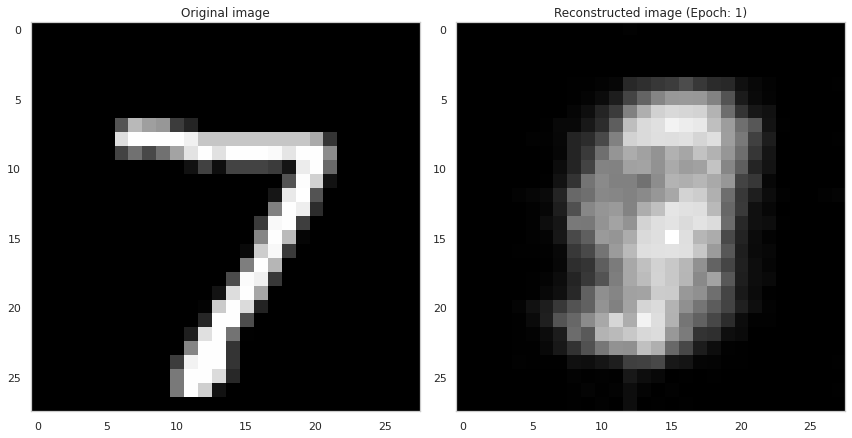

Epoch: 2
AVERAGE TRAIN LOSS: 0.05957633629441261
AVERAGE VAL LOSS: 0.052697788923978806


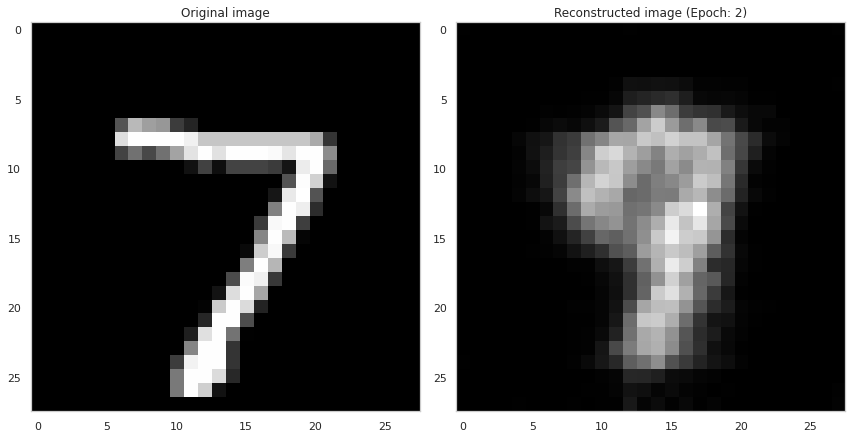

Epoch: 3
AVERAGE TRAIN LOSS: 0.04617403820157051
AVERAGE VAL LOSS: 0.04044530168175697


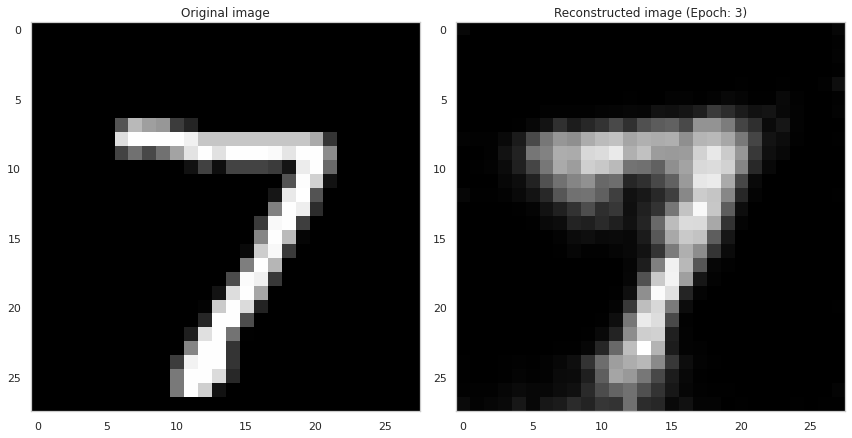

Epoch: 4
AVERAGE TRAIN LOSS: 0.03671766072511673
AVERAGE VAL LOSS: 0.03343934565782547


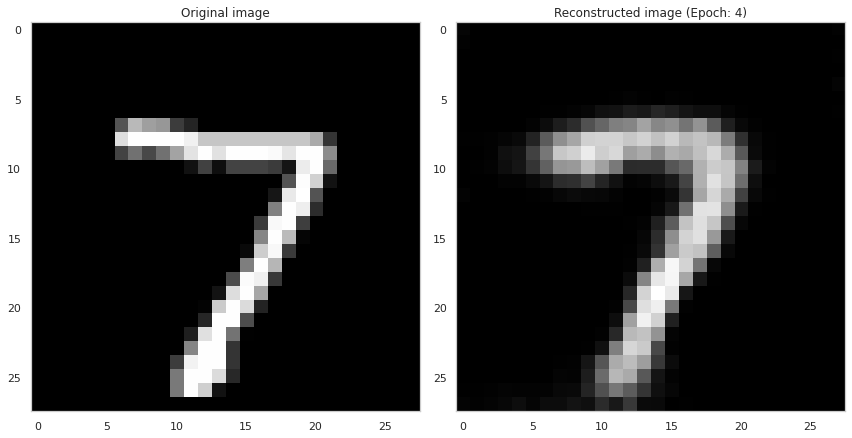

Epoch: 5
AVERAGE TRAIN LOSS: 0.0307390708476305
AVERAGE VAL LOSS: 0.02938467264175415


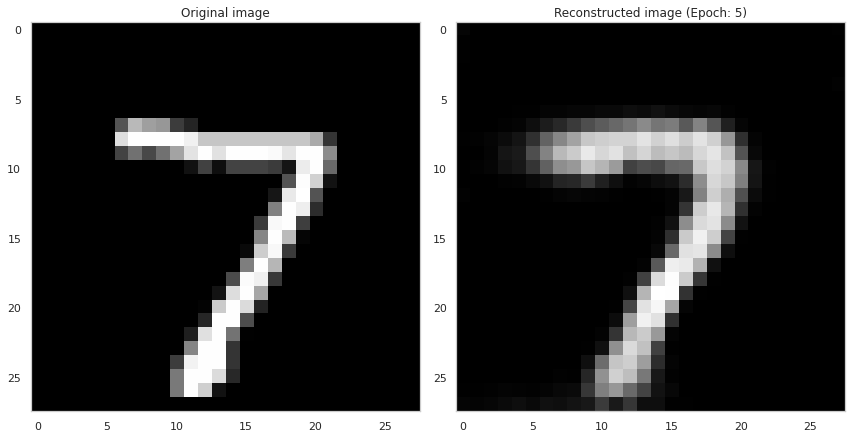

Epoch: 6
AVERAGE TRAIN LOSS: 0.027650954201817513
AVERAGE VAL LOSS: 0.02636445127427578


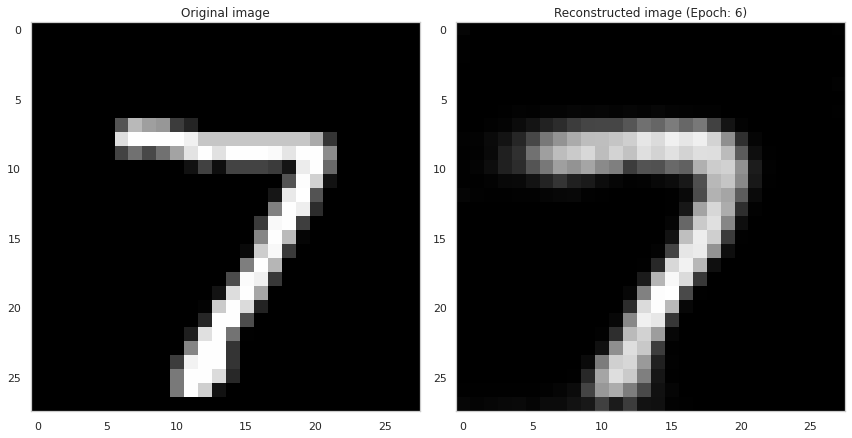

Epoch: 7
AVERAGE TRAIN LOSS: 0.025062963366508484
AVERAGE VAL LOSS: 0.024320179596543312


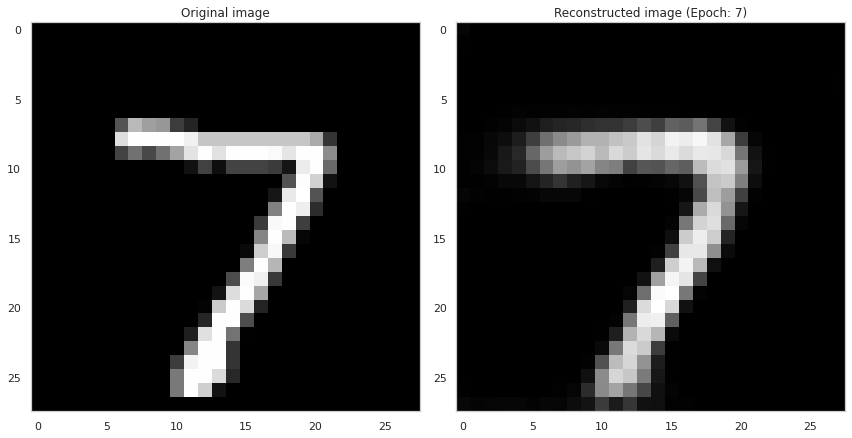

Epoch: 8
AVERAGE TRAIN LOSS: 0.02325449511408806
AVERAGE VAL LOSS: 0.02286519482731819


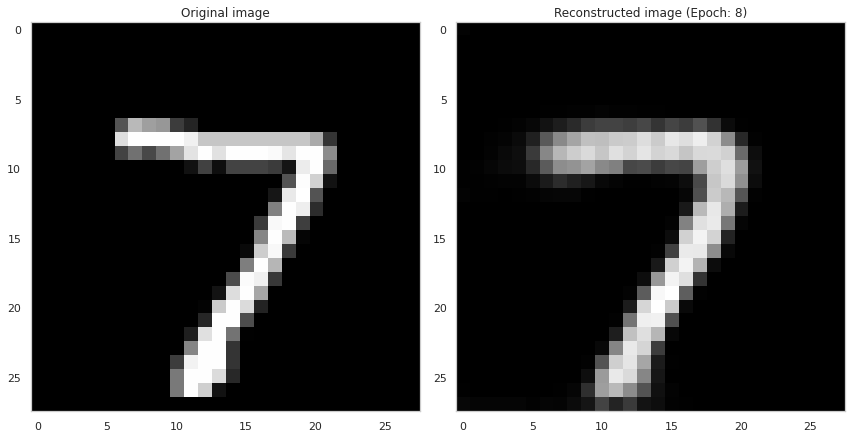

Epoch: 9
AVERAGE TRAIN LOSS: 0.02199980802834034
AVERAGE VAL LOSS: 0.02159055694937706


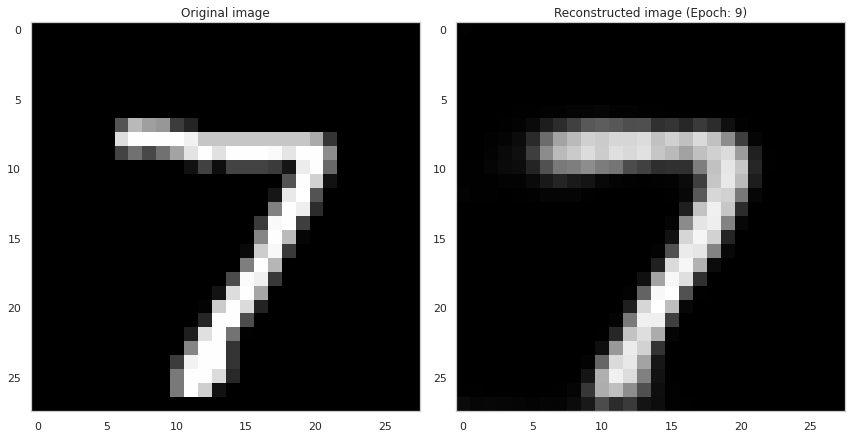

Epoch: 10
AVERAGE TRAIN LOSS: 0.021160539239645004
AVERAGE VAL LOSS: 0.02065781131386757


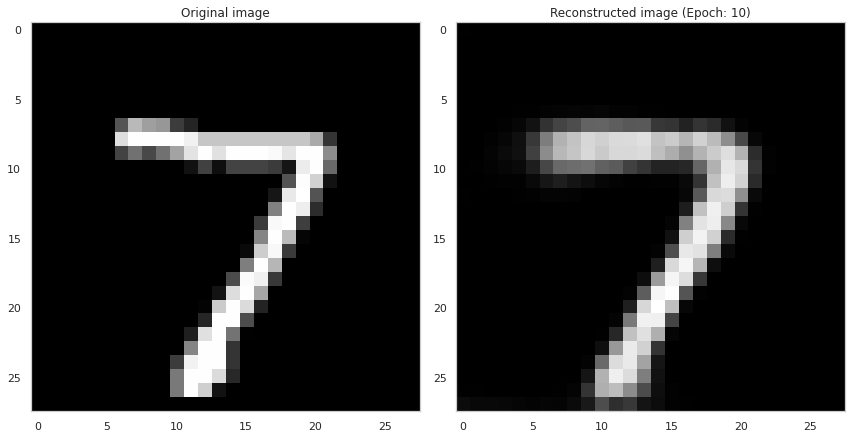

Epoch: 11
AVERAGE TRAIN LOSS: 0.020531384274363518
AVERAGE VAL LOSS: 0.020131094381213188


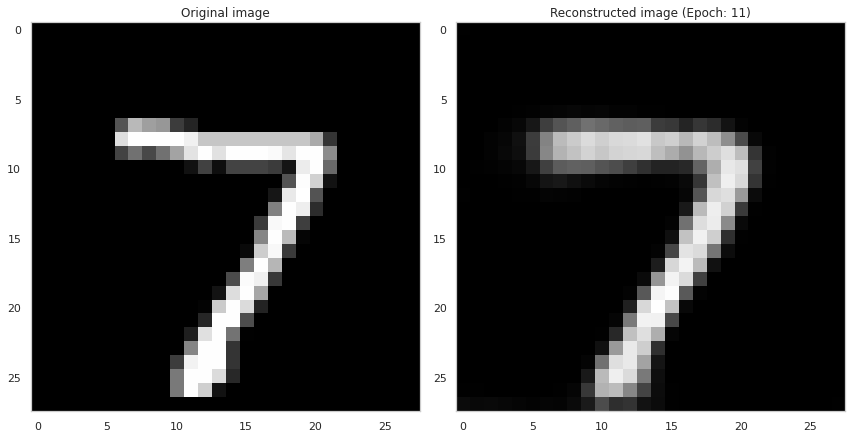

Epoch: 12
AVERAGE TRAIN LOSS: 0.02005104348063469
AVERAGE VAL LOSS: 0.019637104123830795


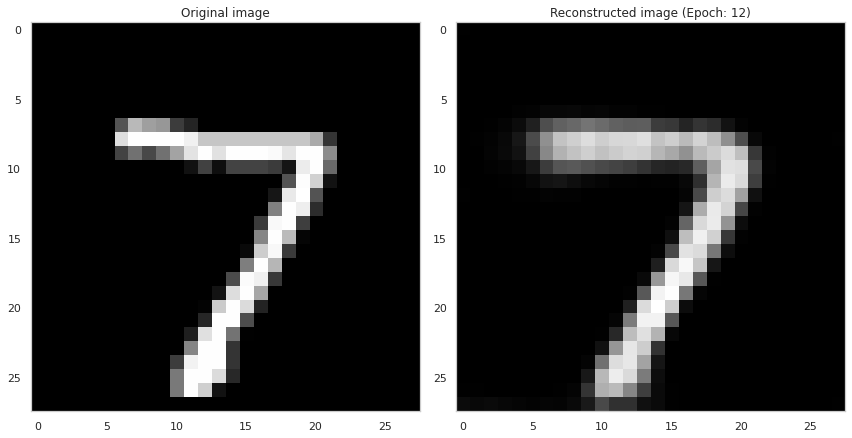

Epoch: 13
AVERAGE TRAIN LOSS: 0.019654322415590286
AVERAGE VAL LOSS: 0.01934148743748665


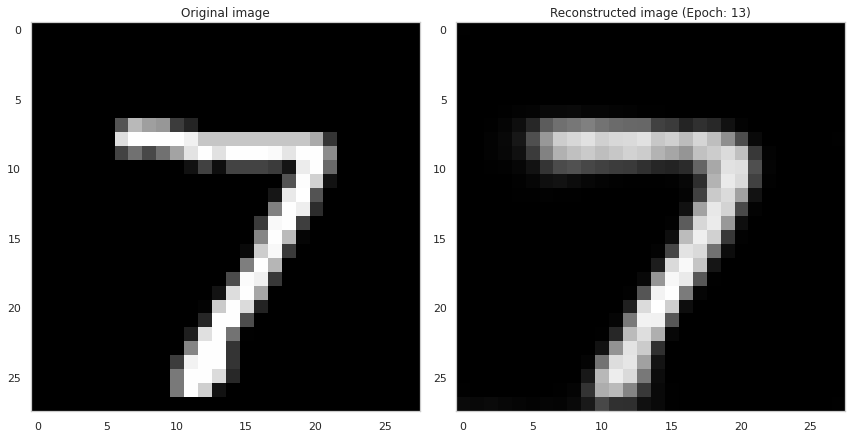

Epoch: 14
AVERAGE TRAIN LOSS: 0.019317038357257843
AVERAGE VAL LOSS: 0.019052455201745033


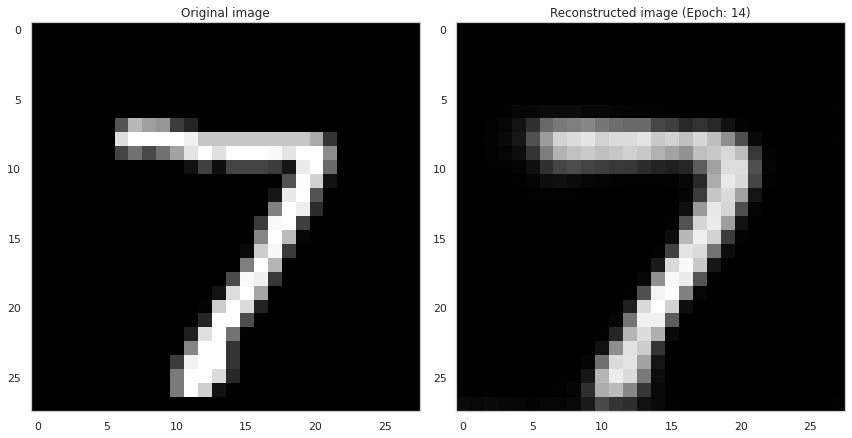

Epoch: 15
AVERAGE TRAIN LOSS: 0.019028229638934135
AVERAGE VAL LOSS: 0.018797075375914574


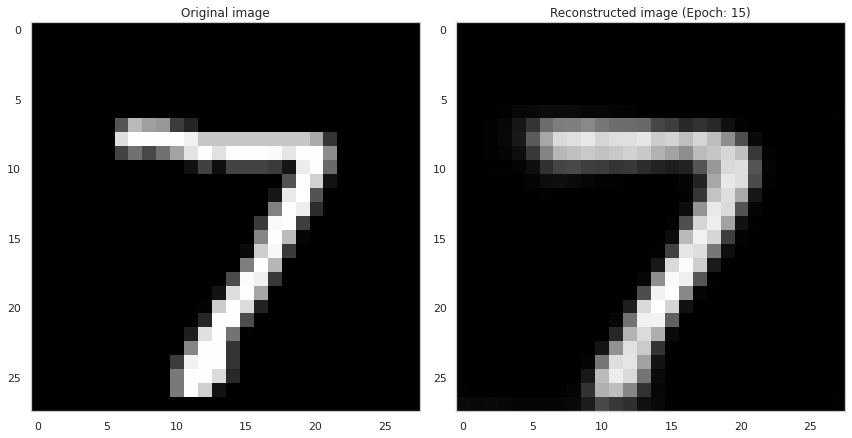

Epoch: 16
AVERAGE TRAIN LOSS: 0.018774213269352913
AVERAGE VAL LOSS: 0.018542960286140442


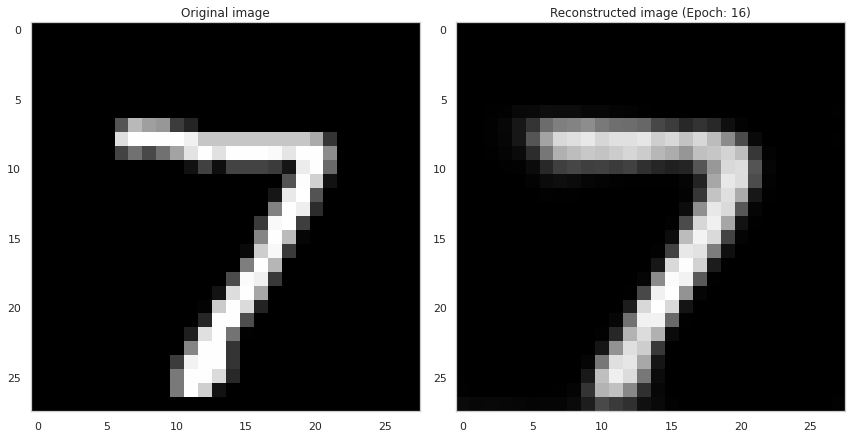

Epoch: 17
AVERAGE TRAIN LOSS: 0.018558528274297714
AVERAGE VAL LOSS: 0.018429597839713097


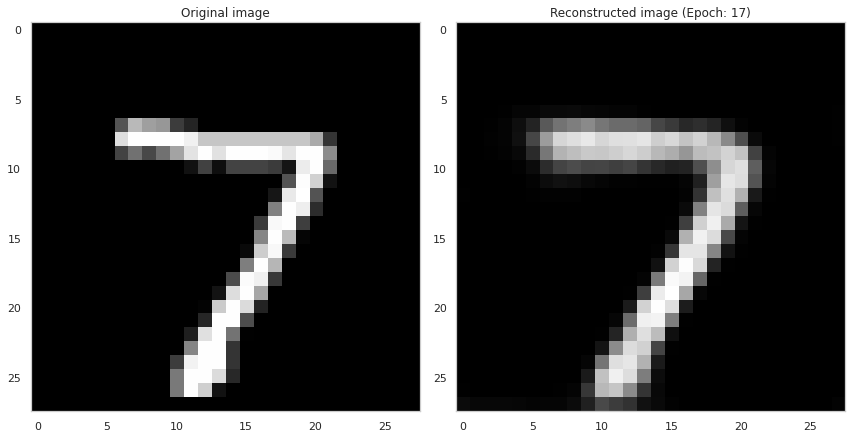

Epoch: 18
AVERAGE TRAIN LOSS: 0.018359411507844925
AVERAGE VAL LOSS: 0.018218854442238808


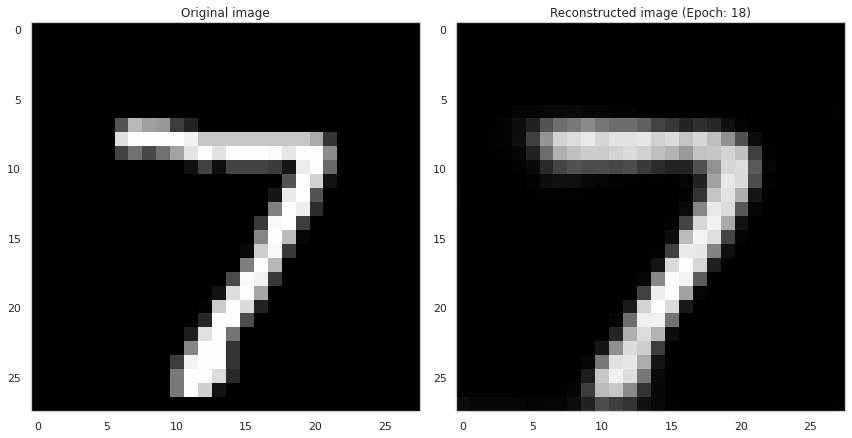

Epoch: 19
AVERAGE TRAIN LOSS: 0.018182119354605675
AVERAGE VAL LOSS: 0.01803462579846382


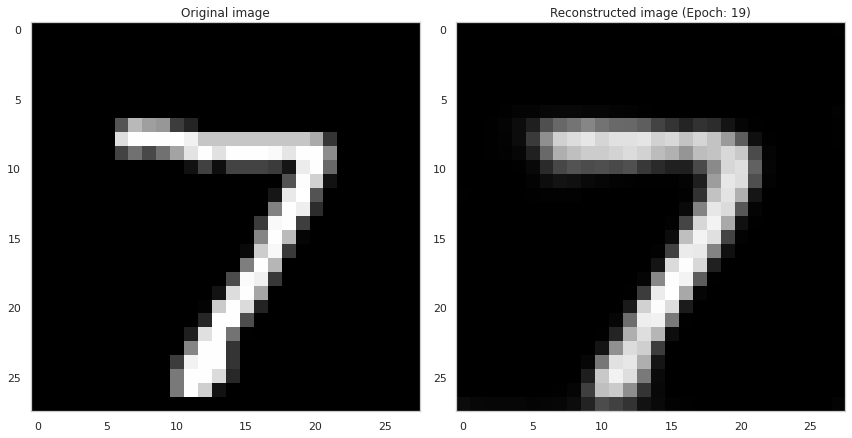

Epoch: 20
AVERAGE TRAIN LOSS: 0.018025869503617287
AVERAGE VAL LOSS: 0.01806747540831566


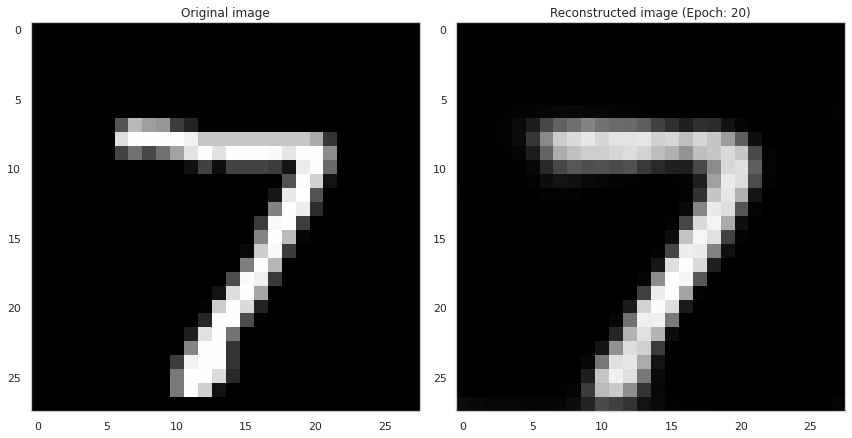

Epoch: 21
AVERAGE TRAIN LOSS: 0.01788453944027424
AVERAGE VAL LOSS: 0.01786768063902855


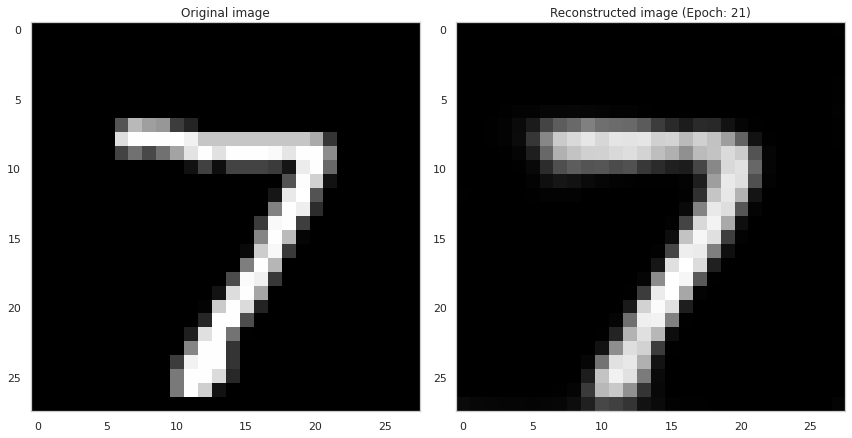

Epoch: 22
AVERAGE TRAIN LOSS: 0.01775773987174034
AVERAGE VAL LOSS: 0.01771422289311886


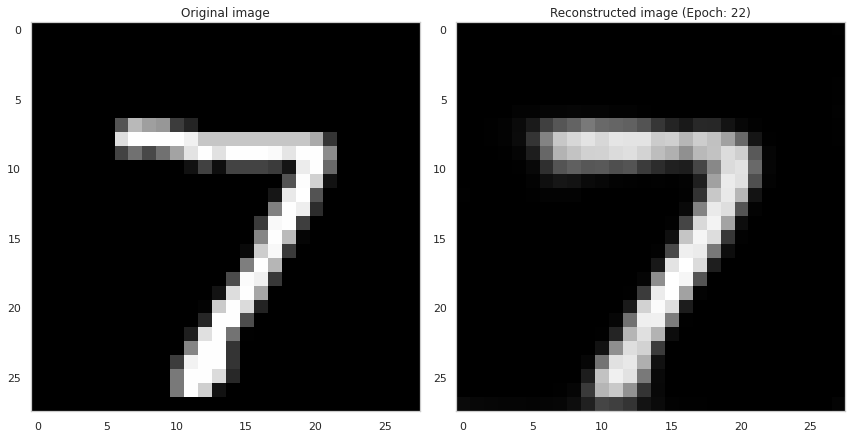

Epoch: 23
AVERAGE TRAIN LOSS: 0.017638681456446648
AVERAGE VAL LOSS: 0.01753431186079979


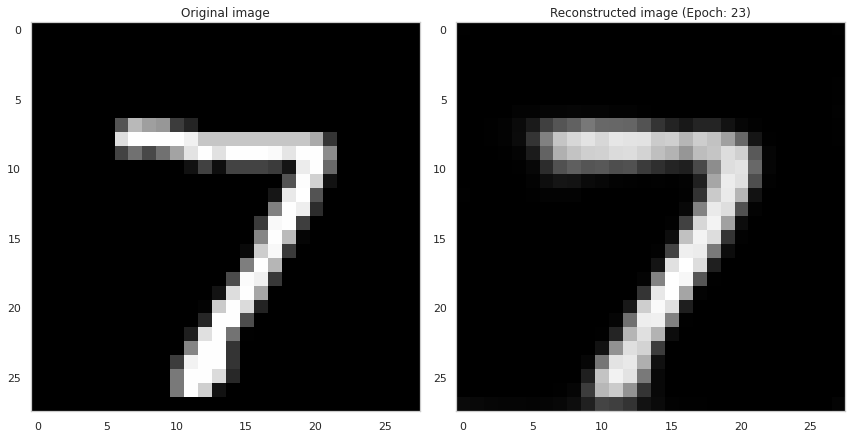

Epoch: 24
AVERAGE TRAIN LOSS: 0.017530230805277824
AVERAGE VAL LOSS: 0.01746445707976818


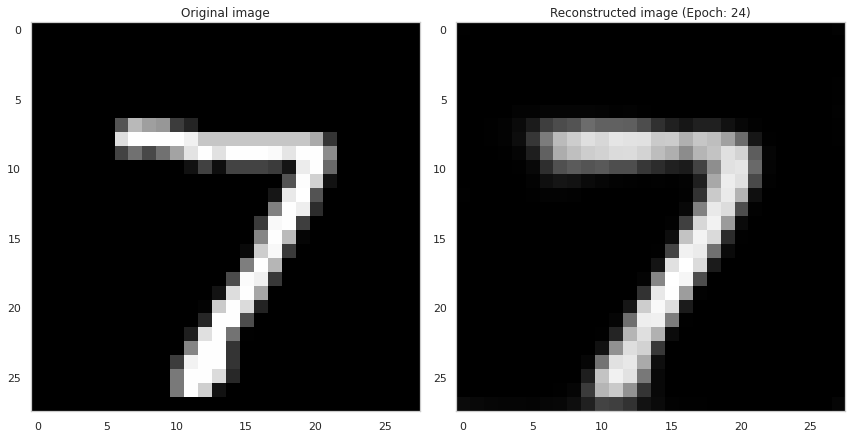

Epoch: 25
AVERAGE TRAIN LOSS: 0.01743251644074917
AVERAGE VAL LOSS: 0.017514582723379135


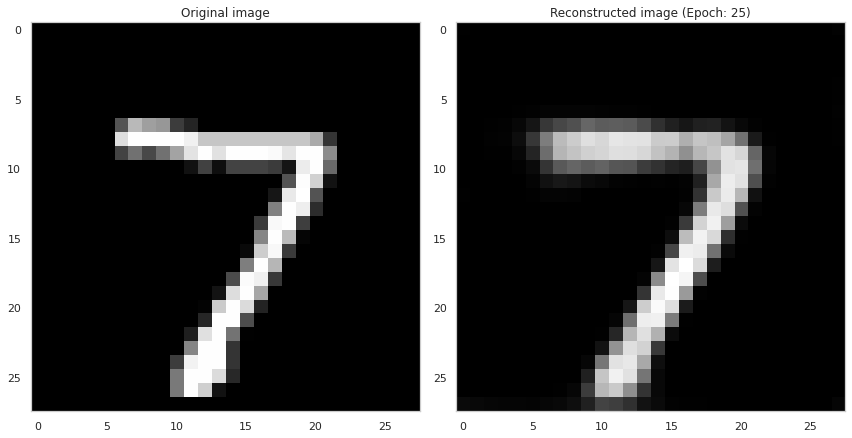

Epoch: 26
AVERAGE TRAIN LOSS: 0.01734776794910431
AVERAGE VAL LOSS: 0.01728435978293419


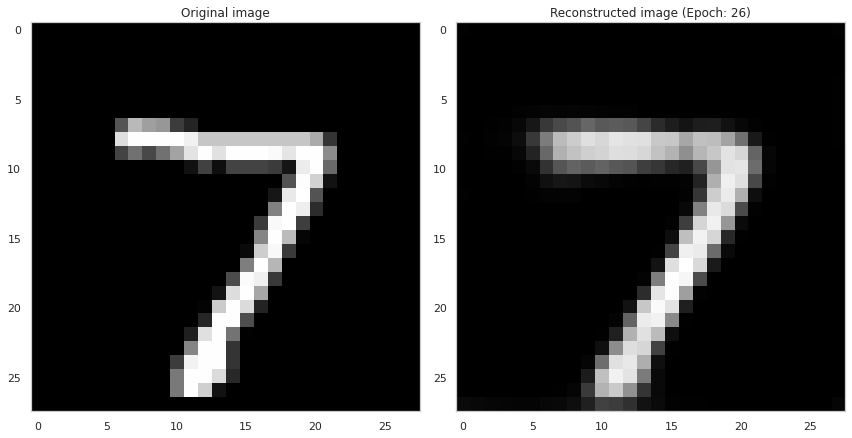

Epoch: 27
AVERAGE TRAIN LOSS: 0.01725323498249054
AVERAGE VAL LOSS: 0.017122309654951096


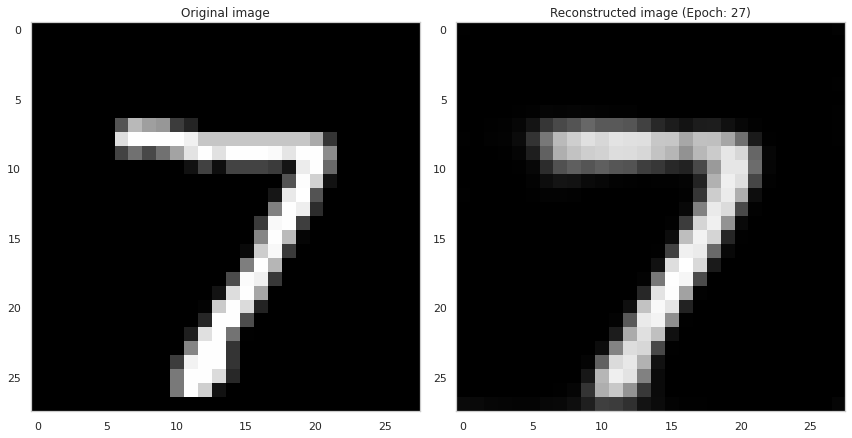

Epoch: 28
AVERAGE TRAIN LOSS: 0.017178772017359734
AVERAGE VAL LOSS: 0.01706361025571823


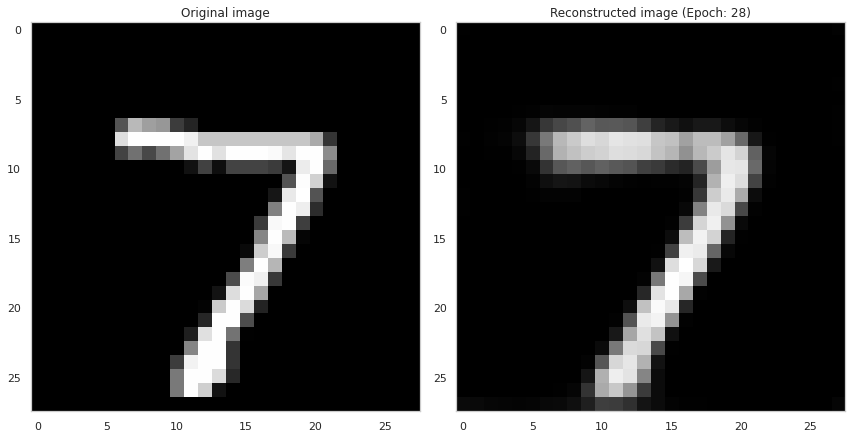

Epoch: 29
AVERAGE TRAIN LOSS: 0.01709669455885887
AVERAGE VAL LOSS: 0.016888216137886047


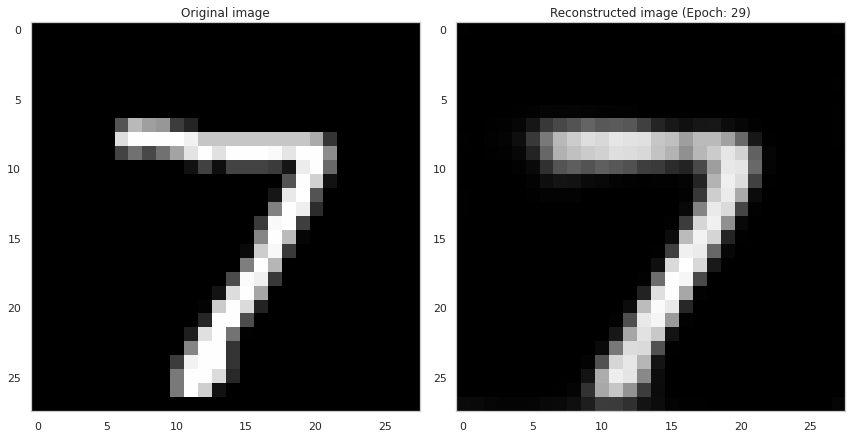

Epoch: 30
AVERAGE TRAIN LOSS: 0.0170204546302557
AVERAGE VAL LOSS: 0.01692233420908451


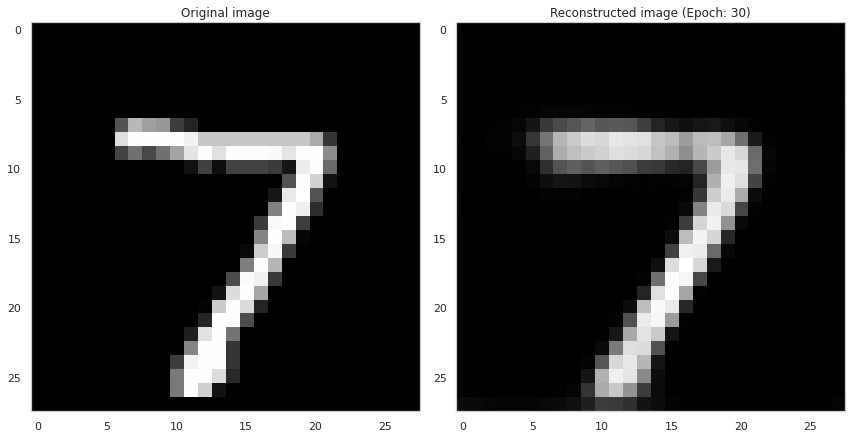

Epoch: 31
AVERAGE TRAIN LOSS: 0.016960367560386658
AVERAGE VAL LOSS: 0.01700573042035103


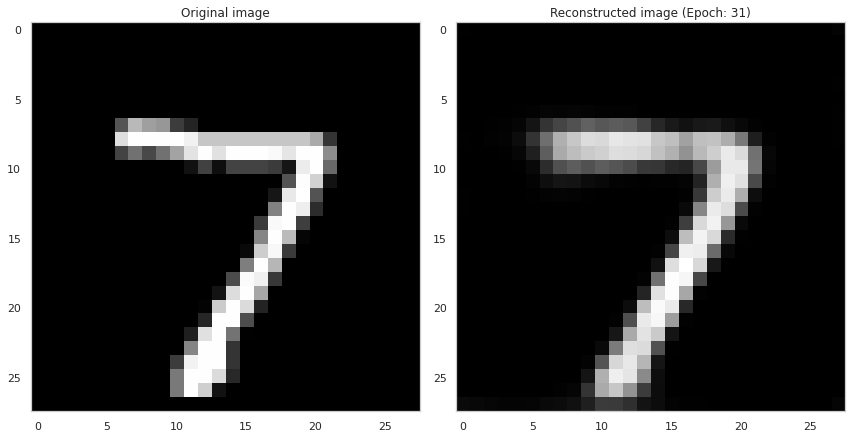

Epoch: 32
AVERAGE TRAIN LOSS: 0.016912175342440605
AVERAGE VAL LOSS: 0.016886714845895767


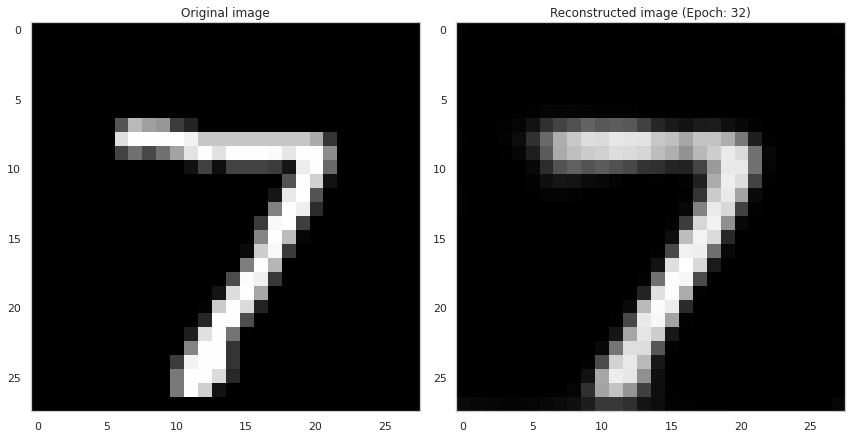

Epoch: 33
AVERAGE TRAIN LOSS: 0.01685463823378086
AVERAGE VAL LOSS: 0.016895076259970665


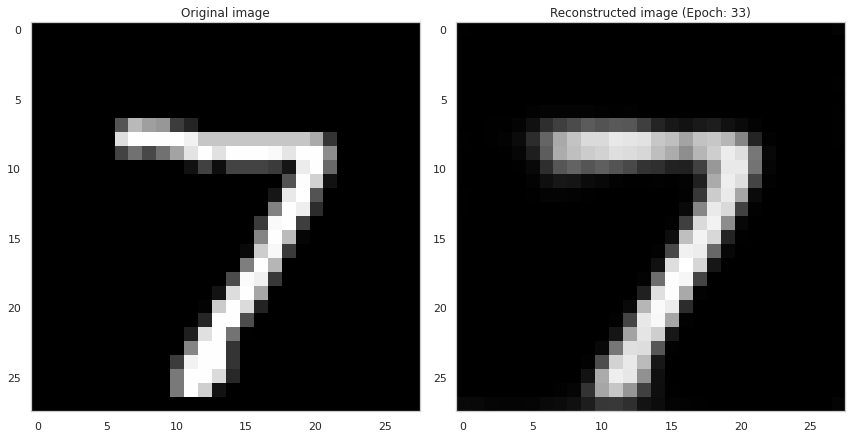

Epoch: 34
AVERAGE TRAIN LOSS: 0.016800791025161743
AVERAGE VAL LOSS: 0.016895225271582603


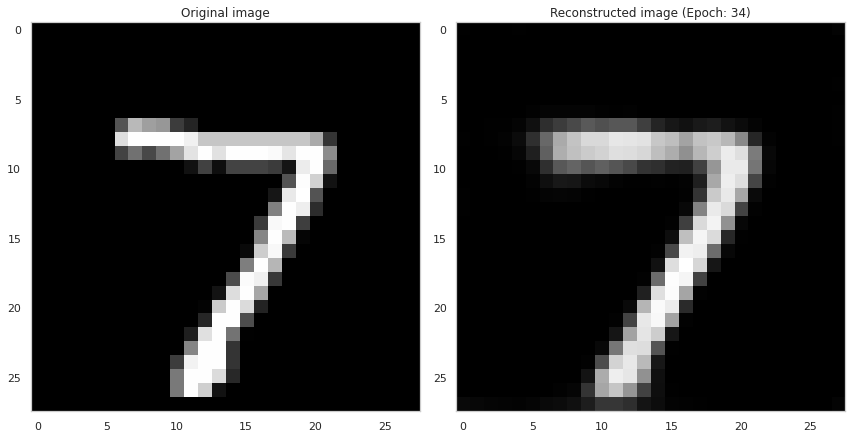

Epoch: 35
AVERAGE TRAIN LOSS: 0.016745049506425858
AVERAGE VAL LOSS: 0.016852837055921555


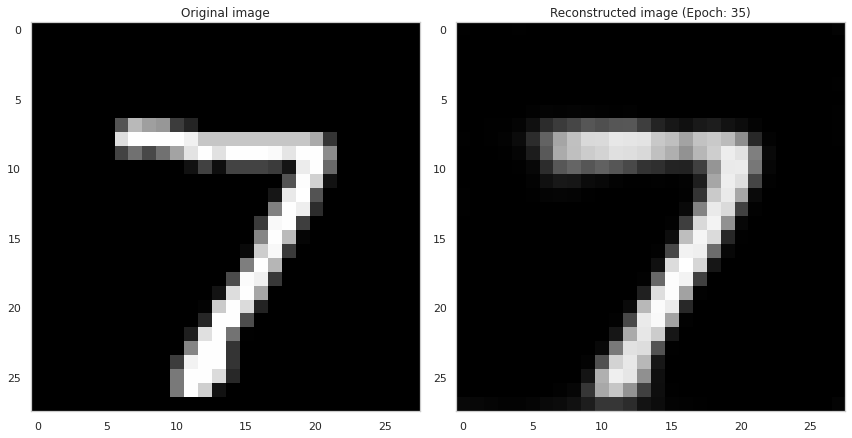

Epoch: 36
AVERAGE TRAIN LOSS: 0.01669512689113617
AVERAGE VAL LOSS: 0.016736341640353203


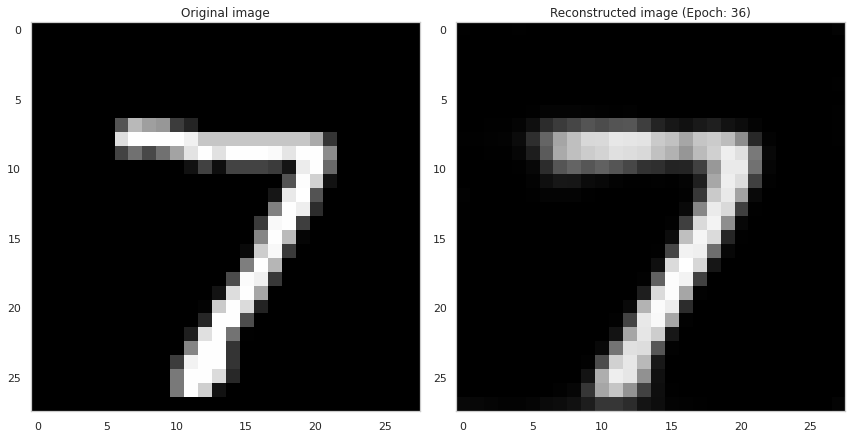

Epoch: 37
AVERAGE TRAIN LOSS: 0.016643792390823364
AVERAGE VAL LOSS: 0.016846830025315285


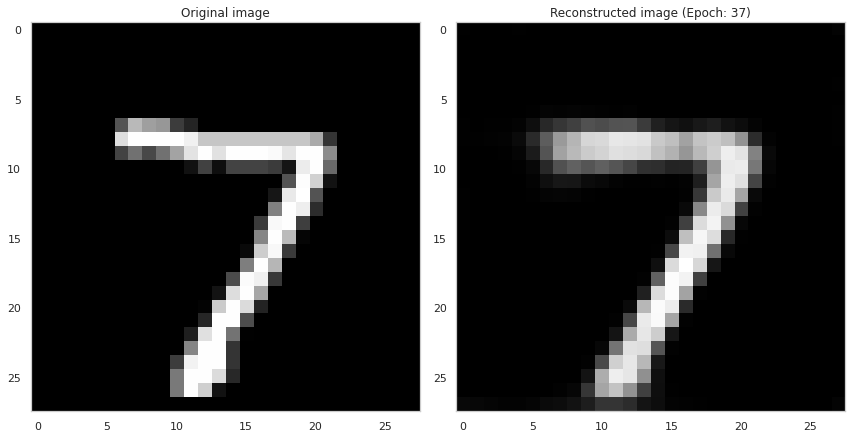

Epoch: 38
AVERAGE TRAIN LOSS: 0.016614405438303947
AVERAGE VAL LOSS: 0.016815699636936188


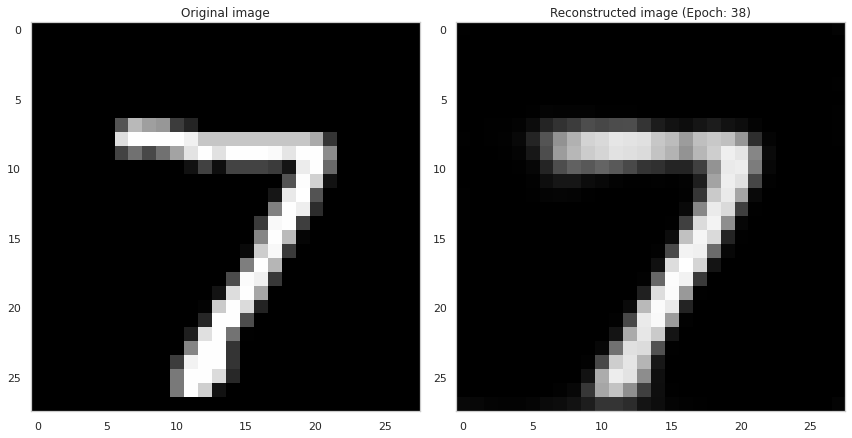

Epoch: 39
AVERAGE TRAIN LOSS: 0.01656452566385269
AVERAGE VAL LOSS: 0.016670366749167442


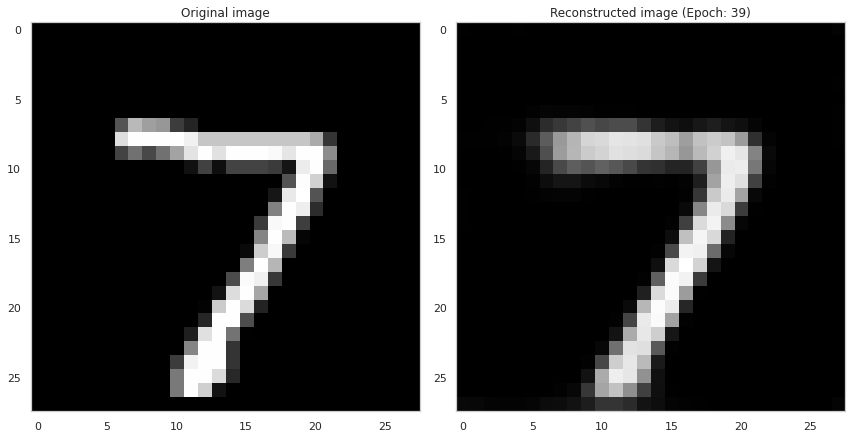

Epoch: 40
AVERAGE TRAIN LOSS: 0.016522880643606186
AVERAGE VAL LOSS: 0.01661280170083046


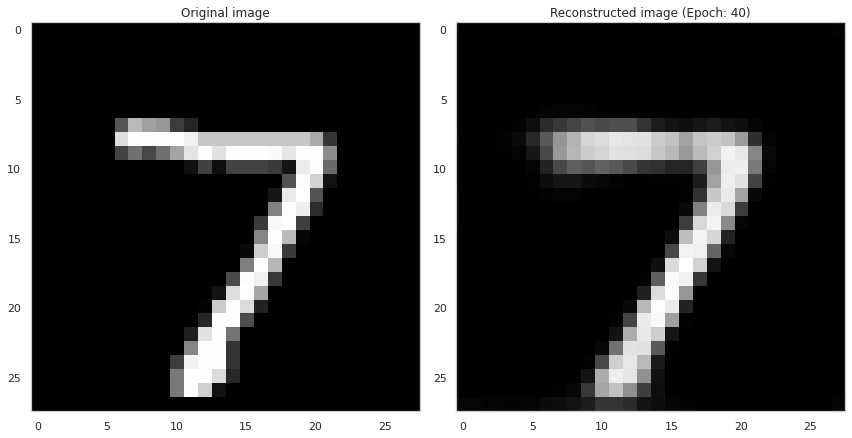

Epoch: 41
AVERAGE TRAIN LOSS: 0.016494259238243103
AVERAGE VAL LOSS: 0.016681285575032234


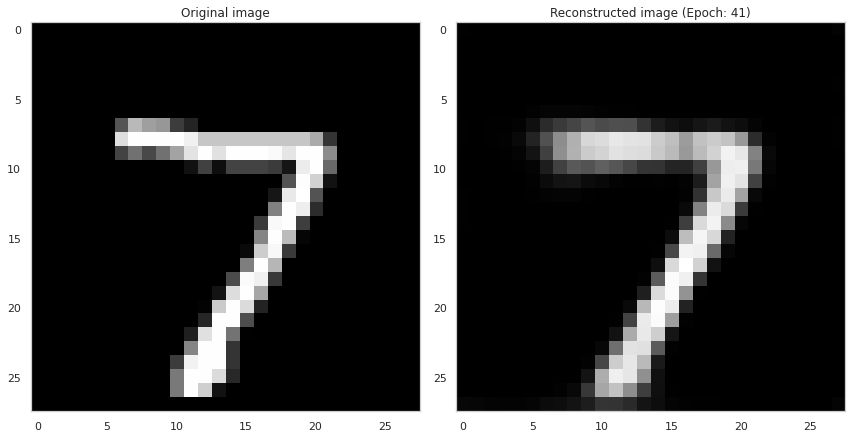

Epoch: 42
AVERAGE TRAIN LOSS: 0.0164614450186491
AVERAGE VAL LOSS: 0.016674920916557312


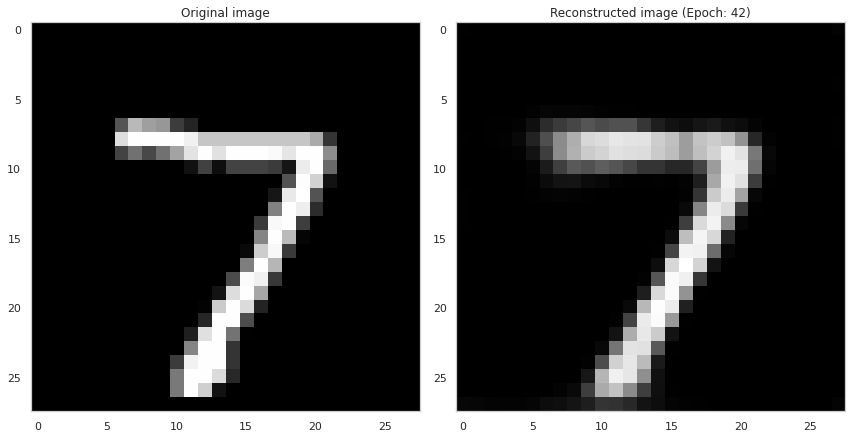

Epoch: 43
AVERAGE TRAIN LOSS: 0.0164168830960989
AVERAGE VAL LOSS: 0.016692832112312317


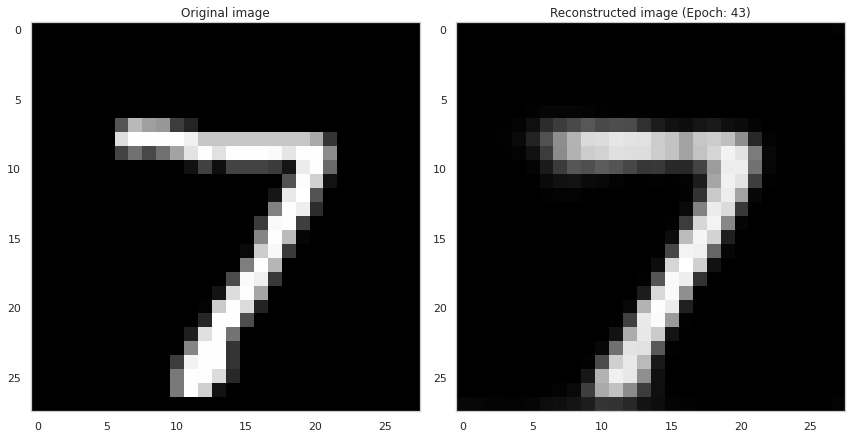

Epoch: 44
AVERAGE TRAIN LOSS: 0.016381390392780304
AVERAGE VAL LOSS: 0.016469812020659447


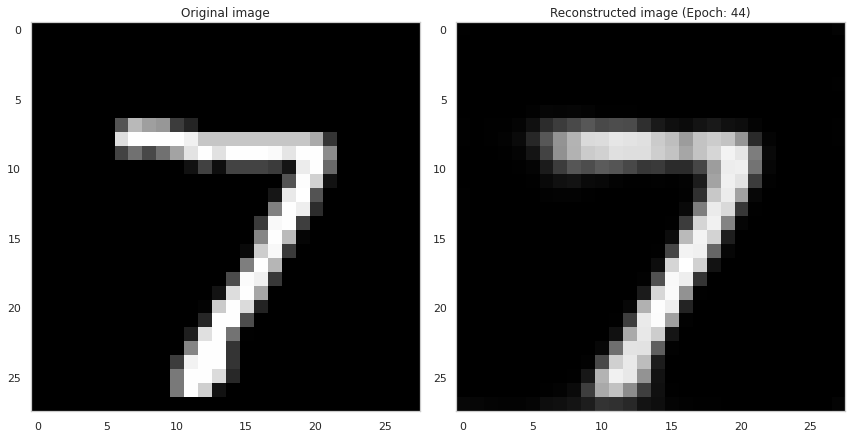

Epoch: 45
AVERAGE TRAIN LOSS: 0.016346760094165802
AVERAGE VAL LOSS: 0.016538375988602638


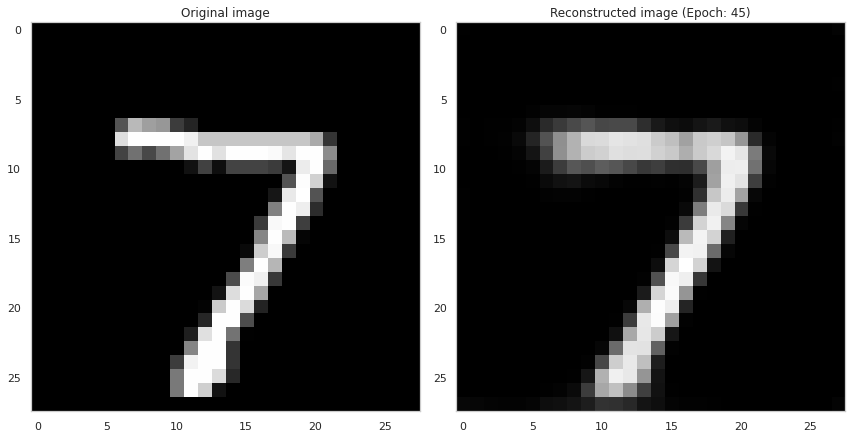

Epoch: 46
AVERAGE TRAIN LOSS: 0.016316166147589684
AVERAGE VAL LOSS: 0.016556954011321068


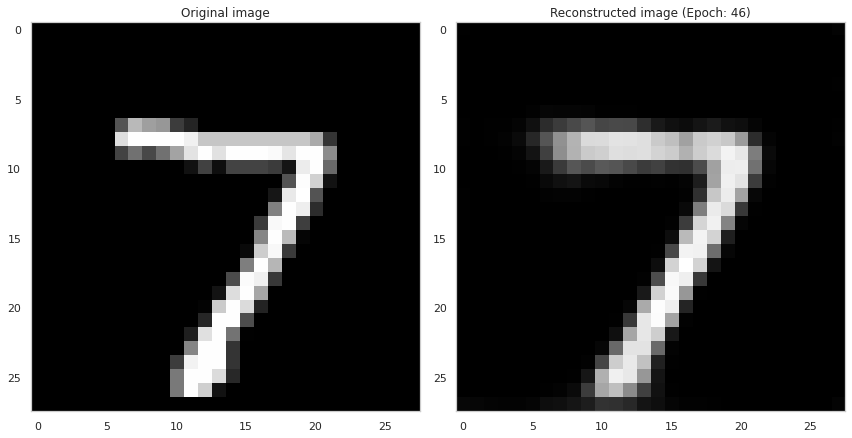

Epoch: 47
AVERAGE TRAIN LOSS: 0.01628413051366806
AVERAGE VAL LOSS: 0.016323797404766083


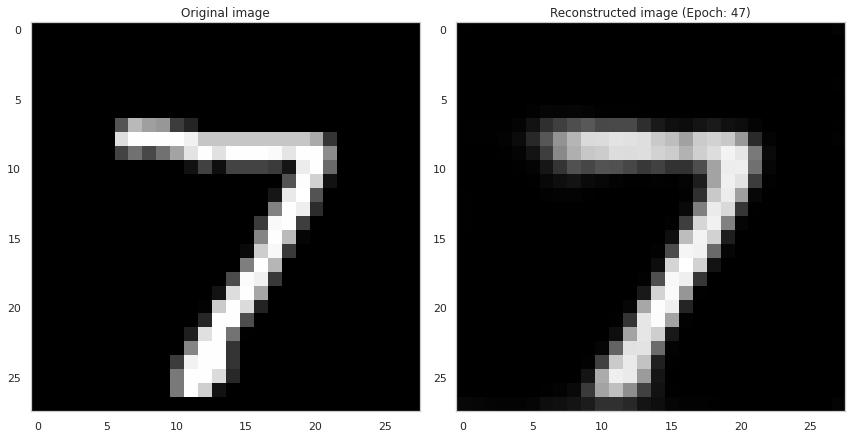

Epoch: 48
AVERAGE TRAIN LOSS: 0.016254503279924393
AVERAGE VAL LOSS: 0.016301587224006653


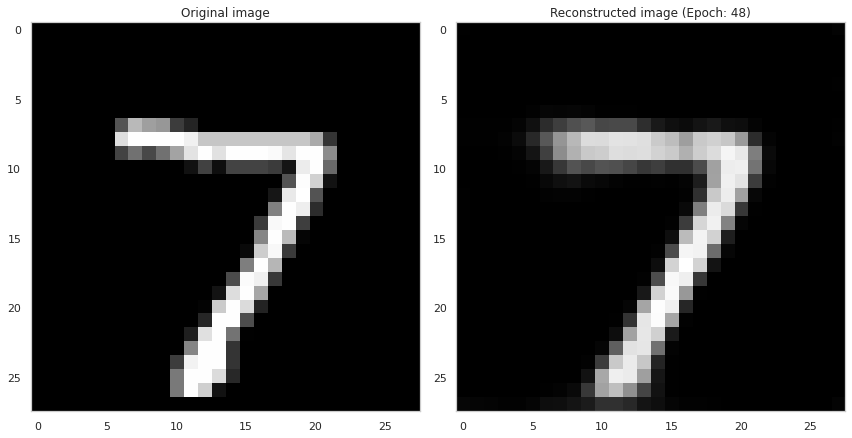

Epoch: 49
AVERAGE TRAIN LOSS: 0.01622900180518627
AVERAGE VAL LOSS: 0.01639443263411522


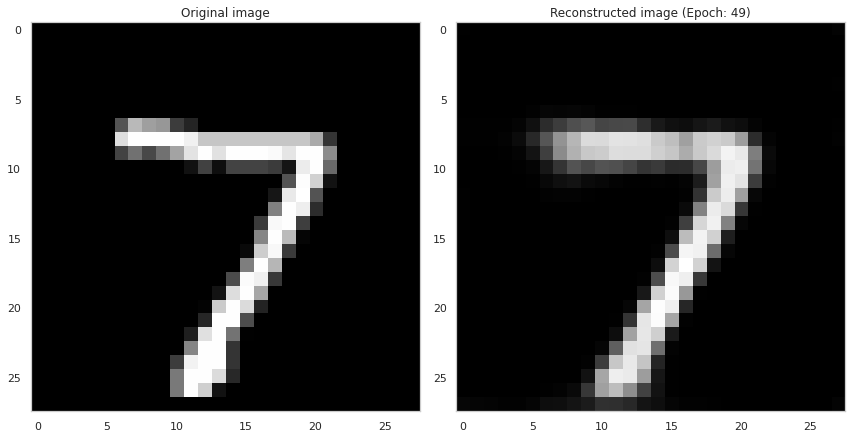

Epoch: 50
AVERAGE TRAIN LOSS: 0.016209356486797333
AVERAGE VAL LOSS: 0.016301248222589493


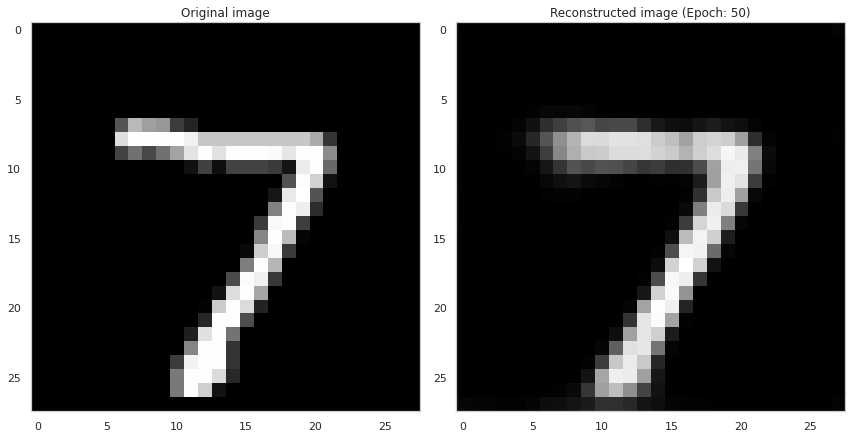

In [ ]:
encoder = Encoder(encoded_space_dim=best_model["Encoded space dim"], Nh1 = int(best_model["Nh1"]))
decoder = Decoder(encoded_space_dim=best_model["Encoded space dim"], Nh1 = int(best_model["Nh1"]))
encoder.apply(init_weights)
decoder.apply(init_weights)
encoder.to(device)
decoder.to(device)
params_to_optimize = [{'params': encoder.parameters()},{'params': decoder.parameters()}]
optimizer = {"Adam":torch.optim.Adam, "RMSprop":torch.optim.RMSprop}
opti = optimizer[best_model["Optimizer"]](params_to_optimize, best_model["Learning rate"], weight_decay = best_model["L2"])
loss_fn = torch.nn.MSELoss()
e = 50
t_l , v_l = train(encoder,decoder,train_dataloader,test_loader,e,opti,loss_fn,best_model["Encoded space dim"])
torch.save(encoder,mydrive + "encoder.pt")
torch.save(encoder,mydrive + "decoder.pt")
torch.save(encoder.state_dict(),mydrive+ 'encoder_params.pth')
torch.save(decoder.state_dict(),mydrive+ 'decoder_params.pth')

In [ ]:
print("Test Loss = {}".format(v_l[-1]))

Test Loss = 0.016301248222589493


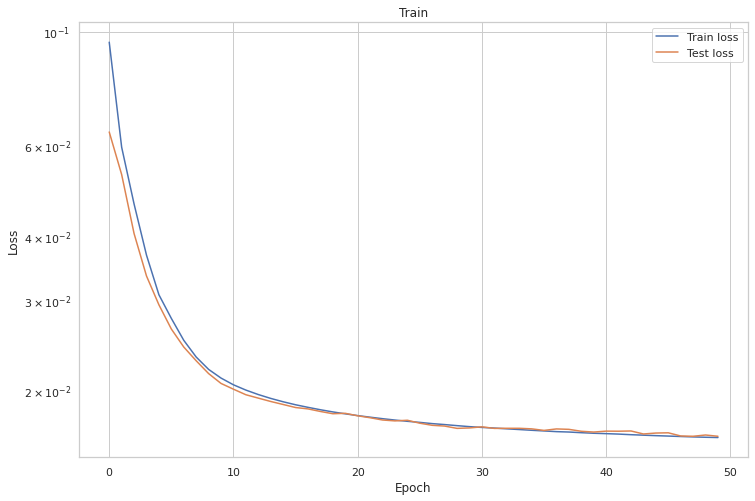

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.semilogy(t_l, label='Train loss')
plt.semilogy(v_l, label='Test loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train')
plt.legend()
plt.show()
fig.savefig('loss final AE.png')
fig.savefig(mydrive+'loss final AE.png')

# Latent Space

In [ ]:
encoder = Encoder(encoded_space_dim=best_model["Encoded space dim"], Nh1 = int(best_model["Nh1"]))
encoder.to(device)
encoder.load_state_dict(torch.load(mydrive+'encoder_params.pth'))
decoder = Decoder(encoded_space_dim=best_model["Encoded space dim"], Nh1 = int(best_model["Nh1"]))
decoder.to(device)
decoder.load_state_dict(torch.load(mydrive+'decoder_params.pth'))

<All keys matched successfully>

In [ ]:
### Get the encoded representation of the train samples
encoded_samples = []
for sample in tqdm(train_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples.to_csv(mydrive+"encoded_data_train.csv")

100%|██████████| 60000/60000 [00:44<00:00, 1349.58it/s]


In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

100%|██████████| 10000/10000 [00:07<00:00, 1314.25it/s]


In [ ]:
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples.to_csv(mydrive+"encoded_data_test.csv")
encoded_samples

In [ ]:
encoded_samples = pd.read_csv(mydrive+"encoded_data_test.csv")

In [ ]:
pd.read_csv(mydrive+"encoded_data_test.csv").head().to_latex(index=False)

'\\begin{tabular}{rrrrrrrrrrr}\n\\toprule\n Unnamed: 0 &  Enc. Variable 0 &  Enc. Variable 1 &  Enc. Variable 2 &  Enc. Variable 3 &  Enc. Variable 4 &  Enc. Variable 5 &  Enc. Variable 6 &  Enc. Variable 7 &  Enc. Variable 8 &  label \\\\\n\\midrule\n          0 &         8.353384 &         6.062208 &         6.882480 &       -23.443331 &       -41.030186 &        15.353236 &       -19.266520 &         8.581726 &        13.493169 &      7 \\\\\n          1 &         0.835941 &       -20.711342 &         5.206129 &       -45.665855 &        16.590822 &        27.288141 &        11.172687 &       -24.107357 &       -23.720579 &      2 \\\\\n          2 &        12.370504 &        -6.326145 &        25.866806 &       -14.534688 &         2.658181 &        21.562832 &         7.883648 &         2.671305 &        17.432297 &      1 \\\\\n          3 &         0.243718 &        16.727535 &        -5.982775 &       -50.432438 &       -26.678438 &        12.678731 &        33.965645 &        

In [ ]:
conv = PCA(n_components=2).fit_transform(encoded_samples)
enc = pd.DataFrame(conv)
enc["label"]=encoded_samples["label"]
enc = enc.rename(columns={0: "1st component", 1:"2nd component"})
enc.to_csv(mydrive+"PCA2.csv", index=False)

In [ ]:
enc = pd.read_csv(mydrive+"PCA2.csv")
enc

,1st component,2nd component,label
0,31.411027,5.034445,7
1,-34.016432,-26.181760,2
2,16.505082,-29.101734,1
3,-18.866637,23.837732,0
4,16.382798,22.245363,4
...,...,...,...
9995,-18.762814,-21.091896,2
9996,-26.940600,-7.546002,3
9997,27.916183,0.343706,4
9998,4.991063,-3.040888,5


In [ ]:
enc.head().to_latex()

'\\begin{tabular}{lrrr}\n\\toprule\n{} &  1st component &  2nd component &  label \\\\\n\\midrule\n0 &      31.411027 &       5.034445 &      7 \\\\\n1 &     -34.016432 &     -26.181760 &      2 \\\\\n2 &      16.505082 &     -29.101734 &      1 \\\\\n3 &     -18.866637 &      23.837732 &      0 \\\\\n4 &      16.382798 &      22.245363 &      4 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [ ]:
px.scatter(enc, x="1st component", y="2nd component", color=encoded_samples.label.astype(str), opacity=0.7)

In [ ]:
conv = PCA(n_components=3).fit_transform(encoded_samples)
enc = pd.DataFrame(conv)
enc["label"]=encoded_samples["label"]
enc = enc.rename(columns={0: "1st component", 1:"2nd component", 2 : "3rd component"})
enc.to_csv(mydrive+"PCA3.csv", index=False)

In [ ]:
enc = pd.read_csv(mydrive+"PCA3.csv")
enc

,1st component,2nd component,3rd component,label
0,31.411027,5.034445,18.910366,7
1,-34.016432,-26.181760,6.760781,2
2,16.505082,-29.101734,-15.136595,1
3,-18.866637,23.837732,-6.747324,0
4,16.382798,22.245363,-15.864093,4
...,...,...,...,...
9995,-18.762814,-21.091896,3.160821,2
9996,-26.940600,-7.546002,30.865741,3
9997,27.916183,0.343706,-15.616644,4
9998,4.991063,-3.040888,2.567491,5


In [ ]:
enc.head().to_latex()

'\\begin{tabular}{lrrrr}\n\\toprule\n{} &  1st component &  2nd component &  3rd component &  label \\\\\n\\midrule\n0 &      31.411027 &       5.034445 &      18.910366 &      7 \\\\\n1 &     -34.016432 &     -26.181760 &       6.760781 &      2 \\\\\n2 &      16.505082 &     -29.101734 &     -15.136595 &      1 \\\\\n3 &     -18.866637 &      23.837732 &      -6.747324 &      0 \\\\\n4 &      16.382798 &      22.245363 &     -15.864093 &      4 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [ ]:
px.scatter_3d(enc, x="1st component", y="2nd component", z="3rd component",color=encoded_samples.label.astype(str), opacity=0.7)

In [ ]:
conv = TSNE(n_components=2).fit_transform(encoded_samples)
enc = pd.DataFrame(conv)
enc["label"]=encoded_samples["label"]
enc = enc.rename(columns={0: "1st component", 1:"2nd component"})
enc.to_csv(mydrive+"TSNE2.csv", index=False)

In [ ]:
enc = pd.read_csv(mydrive+"TSNE2.csv")
enc

,1st component,2nd component,label
0,-34.046734,-63.499770,7
1,12.624299,-58.958607,2
2,-37.343720,61.921260,1
3,58.909565,20.864223,0
4,-70.048960,5.594162,4
...,...,...,...
9995,20.768460,-61.022682,2
9996,56.852005,-17.541586,3
9997,-41.522450,-2.692845,4
9998,-9.720195,19.620377,5


In [ ]:
enc.head().to_latex()

'\\begin{tabular}{lrrr}\n\\toprule\n{} &  1st component &  2nd component &  label \\\\\n\\midrule\n0 &     -34.046734 &     -63.499770 &      7 \\\\\n1 &      12.624299 &     -58.958607 &      2 \\\\\n2 &     -37.343720 &      61.921260 &      1 \\\\\n3 &      58.909565 &      20.864223 &      0 \\\\\n4 &     -70.048960 &       5.594162 &      4 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [ ]:
px.scatter(enc, x="1st component", y="2nd component", color=encoded_samples.label.astype(str), opacity=0.7)

In [ ]:
conv = TSNE(n_components=3).fit_transform(encoded_samples)
enc = pd.DataFrame(conv)
enc["label"]=encoded_samples["label"]
enc = enc.rename(columns={0: "1st component", 1:"2nd component", 2 : "3rd component"})
enc.to_csv(mydrive+"TSNE3.csv", index=False)

In [ ]:
enc = pd.read_csv(mydrive+"TSNE3.csv")
enc

,1st component,2nd component,3rd component,label
0,13.128443,4.792585,14.315826,7
1,22.358284,-0.612849,-2.837053,2
2,7.348108,-16.928250,6.750977,1
3,-5.094752,-8.883758,-16.724998,0
4,-15.775781,1.969815,12.316291,4
...,...,...,...,...
9995,15.009766,-5.636618,-1.027265,2
9996,4.048960,8.265561,-19.386618,3
9997,-7.693838,-5.385743,19.422396,4
9998,-16.261375,9.914435,-1.924153,5


In [ ]:
enc.head().to_latex()

In [ ]:
px.scatter_3d(enc, x="1st component", y="2nd component", z="3rd component", color=encoded_samples.label.astype(str), opacity=0.7)

tensor([[50.2235,  5.4904, 33.9232, 33.0258,  4.1061, 14.8340, 14.3816, 31.7234,
         -6.4751]], device='cuda:0')
tensor([[61.7200, 18.7758, 34.5757, 33.0286, 24.2546, 22.2386,  1.4093, 20.8944,
         13.7927]], device='cuda:0')
tensor([[59.7147, 30.8431, 14.1329, 29.0289, 21.6310, 14.5576, 34.1545, 28.5190,
          3.8502]], device='cuda:0')
tensor([[38.8823, -7.1213,  9.4377, 27.0799, 13.9252, 10.9597, 33.3279, 22.5565,
         13.6832]], device='cuda:0')
tensor([[54.2817,  1.2240, 40.6869, 24.5654, -5.0651, 36.1882,  5.5030, 40.1379,
         -1.4574]], device='cuda:0')
tensor([[56.5178, 23.2124, 20.9857, 44.6559, 13.8457,  0.2818,  0.5372, 31.6870,
         10.5496]], device='cuda:0')
tensor([[49.6098, 20.1270, 39.5877, 30.3727, 14.9051, 24.3414,  6.9051, 35.8320,
          1.3216]], device='cuda:0')
tensor([[39.5133, 10.7523, 42.4647, 31.5349,  5.4074, 23.6909, 29.0638, 36.7602,
         10.3364]], device='cuda:0')
tensor([[44.6767, 20.1046, 36.1066, 34.7939, 30.9717, 16

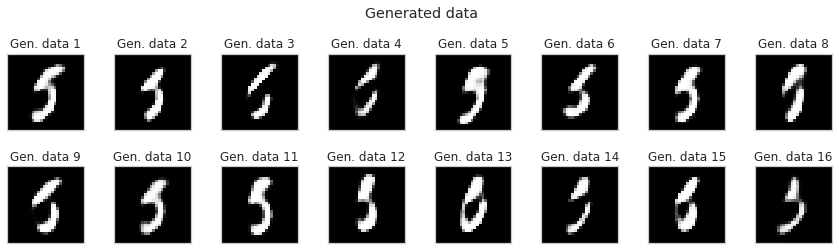

In [ ]:
fig, axs = plt.subplots(2, 8, figsize=(12,4.1))
axs = axs.ravel()
fig.suptitle("Generated data")
fig.subplots_adjust(top=0.85)
for i in range(16):
  custom_encoded_sample = [36.6995,  5.0179, 24.1506, 32.8095, 13.2052, 15.0151,  8.3004, 28.9463,2.2977]#40*torch.rand((9))
  encoded_value = (torch.tensor(custom_encoded_sample)+torch.randn(9)* (10) +5).float().unsqueeze(0).to(device)
  decoder.eval()
  with torch.no_grad():
    test_images = decoder(encoded_value)
  print(encoded_value.data)
  axs[i].imshow(test_images.cpu().squeeze().numpy(), cmap='gray', interpolation='none')
  axs[i].set_title('Gen. data {}'.format(i+1))
  axs[i].grid()
  axs[i].xaxis.set_major_locator(plt.NullLocator())
  axs[i].yaxis.set_major_locator(plt.NullLocator())
  plt.tight_layout()
      
os.makedirs(mydrive+'imgs/latent', exist_ok=True)
fig.savefig(mydrive+'imgs/latent.jpg')
plt.show()
plt.close()

# Denoising Autoencoder

In [ ]:
def train(encoder, decoder, train, valid, epochs, optimizer, loss_fn, encoded_space_dim, mean, std):
  train_loss_log = []
  val_loss_log = []
  for epoch_num in range(epochs):
    print("Epoch:",epoch_num+1)
    train_loss= []
    encoder.train()
    decoder.train()
    for sample_batched, _ in train:
      noise = (sample_batched + torch.randn(sample_batched.size()) * std + mean).to(device)
      
      x_batch = sample_batched.to(device)
    
      encoded_data = encoder(noise)
      decoded_data = decoder(encoded_data)
      
      loss = loss_fn(decoded_data, x_batch)

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_batch = loss.detach().cpu().numpy()
      train_loss.append(loss_batch)

    train_loss = np.mean(train_loss)
    print(f"AVERAGE TRAIN LOSS: {train_loss}")
    train_loss_log.append(train_loss)

    val_loss= []
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
      for sample_batched, _ in valid:
        noise = (sample_batched + torch.randn(sample_batched.size()) * std + mean).to(device)
        x_batch = sample_batched.to(device)
        
        encoded_data = encoder(noise)
        decoded_data = decoder(encoded_data)
        
        loss = loss_fn(decoded_data, x_batch)

        loss_batch = loss.detach().cpu().numpy()
        val_loss.append(loss_batch)
        
      val_loss = np.mean(val_loss)
      print(f"AVERAGE VAL LOSS: {np.mean(val_loss)}")
      val_loss_log.append(val_loss)
  

    img = (test_dataset[0][0].unsqueeze(0)+ torch.randn(test_dataset[0][0].size()) * std + mean).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
    # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(12,6))
    axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[0].set_title('Original image')
    axs[0].grid()
    axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[1].set_title('Reconstructed image (Epoch: %d)' % (epoch_num + 1))
    axs[1].grid()
    plt.tight_layout()
    plt.pause(0.1)
    # Save figures
    os.makedirs(mydrive+'imgs/noise/autoencoder_progress_%d_features' % encoded_space_dim, exist_ok=True)
    fig.savefig(mydrive+'imgs/noise/autoencoder_progress_%d_features/epoch_%d.jpg' % (encoded_space_dim, epoch_num + 1))
    plt.show()
    plt.close()

    #scheduler.step()
  return train_loss_log, val_loss_log

In [ ]:
def GridSearch(grid, n, e):
  res = pd.DataFrame(columns=["Encoded space dim","L2","Optimizer","Epochs", "Learning rate","Valid_Loss"])
  np.random.seed(420)
  it = 1
  for i in np.random.choice(grid,n):
    print("Nh1 = ", i["Nh1"],
          "| Optimizer = ", i["optimizer"] , 
          "| Lr = ", "{:.2e}".format(abs(i["lr"])), 
          "| weight_dec = ", "{:.2e}".format(abs(i["weight_dec"])),
          "| Encoded_space_dim = ", i["encoded_space_dim"], 
          "| Iter = ", it,"/", n)
    encoder = Encoder(encoded_space_dim=i["encoded_space_dim"], Nh1 = i["Nh1"])
    decoder = Decoder(encoded_space_dim=i["encoded_space_dim"], Nh1 = i["Nh1"])
    encoder.apply(init_weights)
    decoder.apply(init_weights)
    encoder.to(device)
    decoder.to(device)
    params_to_optimize = [{'params': encoder.parameters()},{'params': decoder.parameters()}]
    optimizer = {"Adam":torch.optim.Adam, "RMSprop":torch.optim.RMSprop}
    opti = optimizer[i["optimizer"]](params_to_optimize, abs(i["lr"]), weight_decay = abs(i["weight_dec"]))
    loss_fn = torch.nn.MSELoss()
    t_l , v_l = train(encoder,decoder,train_loader,valid_loader,e,opti,loss_fn,i["encoded_space_dim"],0,0.1)
    data = pd.Series({"Nh1" : int(i["Nh1"]),
                      "Encoded space dim": i["encoded_space_dim"],
                      "Optimizer" : i["optimizer"], 
                      "Epochs" : e,
                      "Learning rate": abs(i["lr"]),
                      "L2": abs(i["weight_dec"]),
                      "Valid_Loss"  : v_l[-1]},
                    name=it)        
    res = res.append(data)
    it +=1
  return res.sort_values("Valid_Loss")

## Random Search

In [ ]:
combination = 50
epochs = 50
np.random.seed(1)

param_grid = {'weight_dec': list([0]) + list(np.random.normal(1e-5, 0.0001,10)), 
              'optimizer': {"Adam": torch.optim.Adam, "RMSprop":torch.optim.RMSprop}, 
              'encoded_space_dim': [a for a in range(2,10)],
              'Nh1': list(np.random.randint(50, 150, size=10)),
              'lr': list(np.random.normal(0.001, 0.001,10))}
grid = list(ParameterGrid(param_grid))

print("Combinations:",len(grid))
pprint(param_grid)

Combinations: 17600
{'Nh1': [79, 64, 100, 118, 137, 137, 144, 146, 136, 63],
 'encoded_space_dim': [2, 3, 4, 5, 6, 7, 8, 9],
 'lr': [0.0018858294019971026,
        0.0016319018703788795,
        0.0010402603509354295,
        9.68771164188355e-05,
        0.0011753226729488545,
        0.0011944308903563117,
        0.00046475097688375867,
        0.0017773512055030874,
        0.0011713384529479238,
        0.000557148560525665],
 'optimizer': {'Adam': <class 'torch.optim.adam.Adam'>,
               'RMSprop': <class 'torch.optim.rmsprop.RMSprop'>},
 'weight_dec': [0,
                0.00017243453636632417,
                -5.117564136500754e-05,
                -4.281717522634557e-05,
                -9.729686221561706e-05,
                9.654076293246786e-05,
                -0.00022015386968802828,
                0.000184481176421648,
                -6.612069008951029e-05,
                4.190390960570986e-05,
                -1.493703754774101e-05]}


In [ ]:
results = GridSearch(grid, combination, epochs)
results.to_csv(mydrive+"GridSearch_denoise.csv", index=False)

In [ ]:
head = results.head()
head

,Encoded space dim,L2,Optimizer,Epochs,Learning rate,Valid_Loss,Nh1
4,9,0.000015,Adam,50,0.001040,0.015008,137.0
41,9,0.000042,Adam,50,0.001886,0.017017,64.0
31,8,0.000051,Adam,50,0.001777,0.017290,136.0
23,9,0.000015,RMSprop,50,0.001632,0.017637,137.0
42,9,0.000042,RMSprop,50,0.001777,0.020240,144.0


In [ ]:
best_model= pd.read_csv(mydrive+"GridSearch_denoise.csv").loc[0]
best_model

Encoded space dim             9
L2                   1.4937e-05
Optimizer                  Adam
Epochs                       50
Learning rate        0.00104026
Valid_Loss            0.0150078
Nh1                         137
Name: 0, dtype: object

In [ ]:
pd.read_csv(mydrive+"GridSearch_denoise.csv").head().to_latex(index=False)

'\\begin{tabular}{rrlrrrr}\n\\toprule\n Encoded space dim &        L2 & Optimizer &  Epochs &  Learning rate &  Valid\\_Loss &    Nh1 \\\\\n\\midrule\n                 9 &  0.000015 &      Adam &      50 &       0.001040 &    0.015008 &  137.0 \\\\\n                 9 &  0.000042 &      Adam &      50 &       0.001886 &    0.017017 &   64.0 \\\\\n                 8 &  0.000051 &      Adam &      50 &       0.001777 &    0.017290 &  136.0 \\\\\n                 9 &  0.000015 &   RMSprop &      50 &       0.001632 &    0.017637 &  137.0 \\\\\n                 9 &  0.000042 &   RMSprop &      50 &       0.001777 &    0.020240 &  144.0 \\\\\n\\bottomrule\n\\end{tabular}\n'

## Final train

Epoch: 1
AVERAGE TRAIN LOSS: 0.1142411082983017
AVERAGE VAL LOSS: 0.06509437412023544


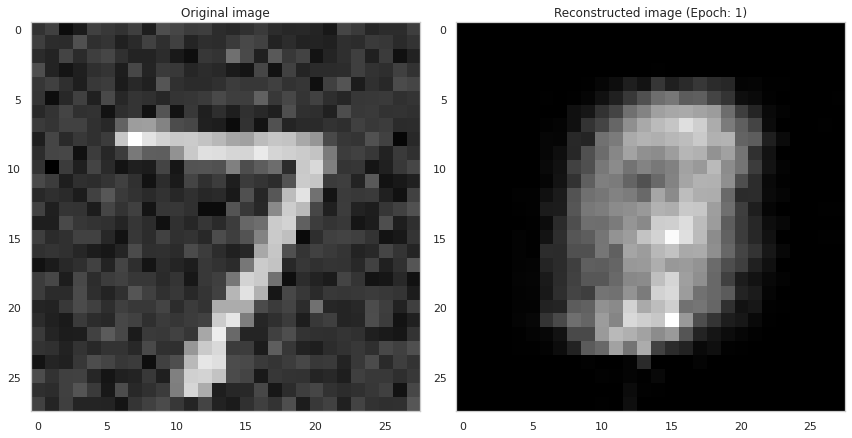

Epoch: 2
AVERAGE TRAIN LOSS: 0.06372623890638351
AVERAGE VAL LOSS: 0.06286776810884476


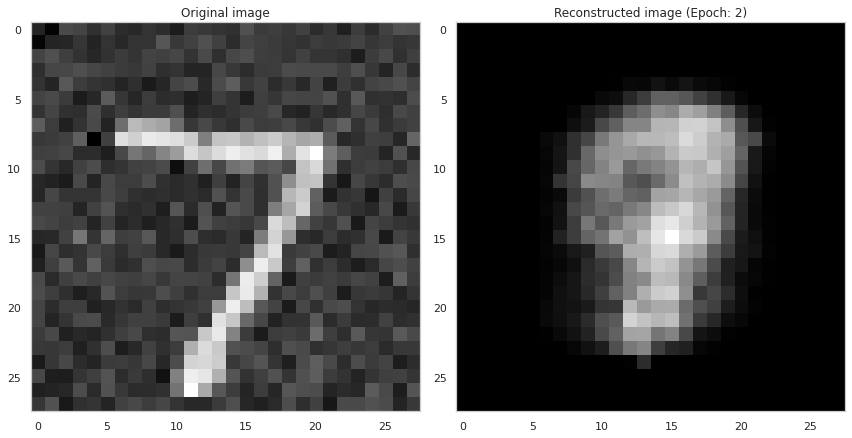

Epoch: 3
AVERAGE TRAIN LOSS: 0.056372400373220444
AVERAGE VAL LOSS: 0.05202369764447212


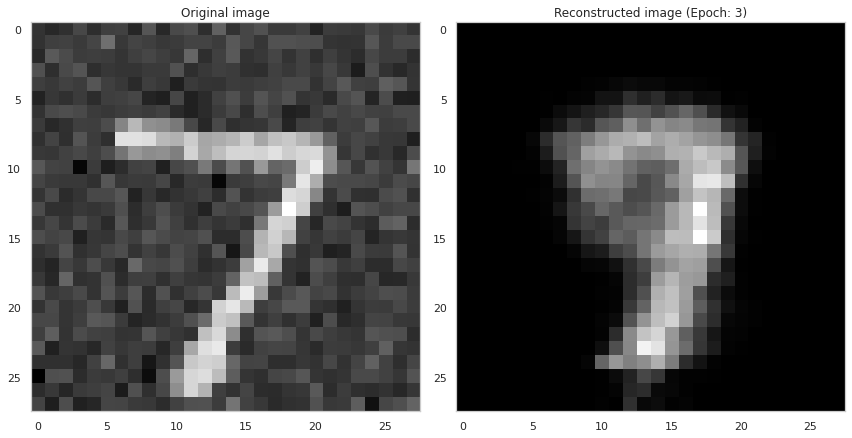

Epoch: 4
AVERAGE TRAIN LOSS: 0.046254534274339676
AVERAGE VAL LOSS: 0.040536973625421524


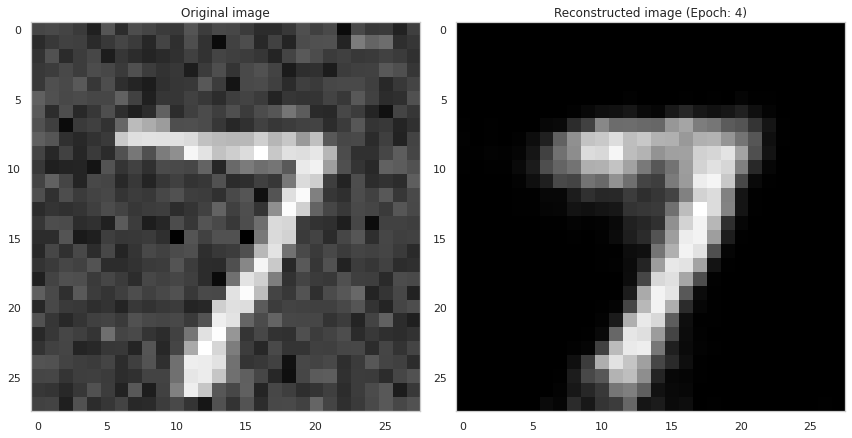

Epoch: 5
AVERAGE TRAIN LOSS: 0.03731295093894005
AVERAGE VAL LOSS: 0.034354545176029205


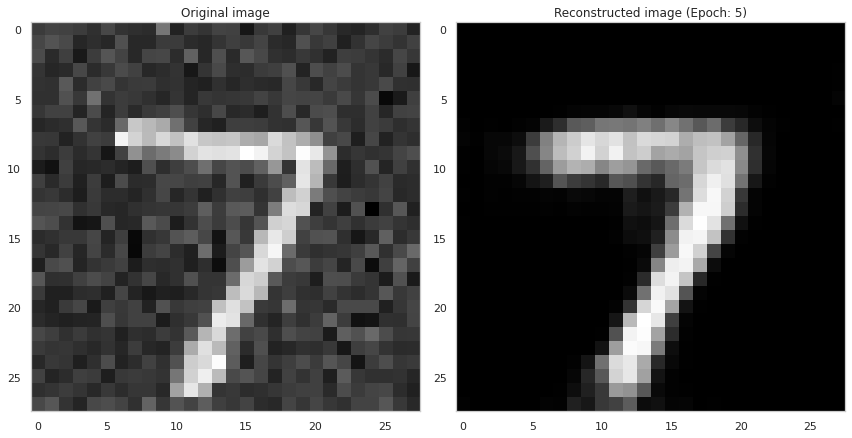

Epoch: 6
AVERAGE TRAIN LOSS: 0.032386768609285355
AVERAGE VAL LOSS: 0.029574144631624222


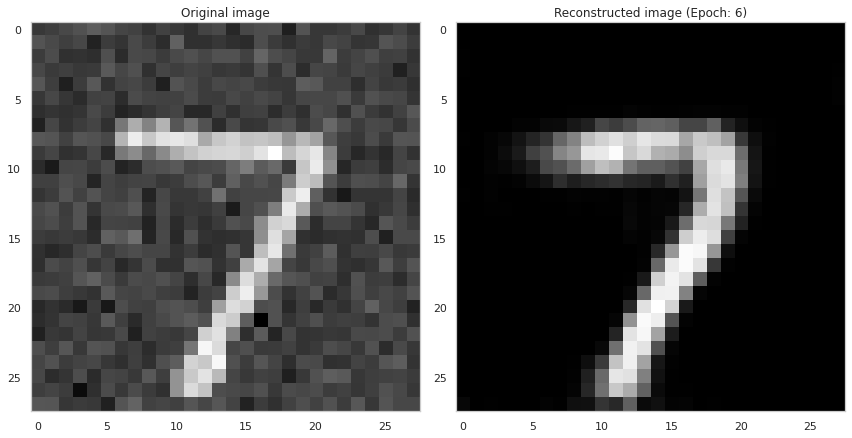

Epoch: 7
AVERAGE TRAIN LOSS: 0.028723806142807007
AVERAGE VAL LOSS: 0.027692651376128197


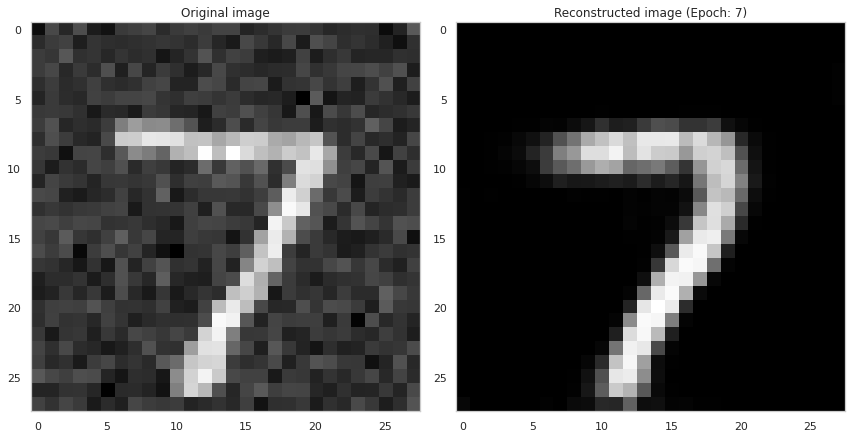

Epoch: 8
AVERAGE TRAIN LOSS: 0.026909414678812027
AVERAGE VAL LOSS: 0.02587032876908779


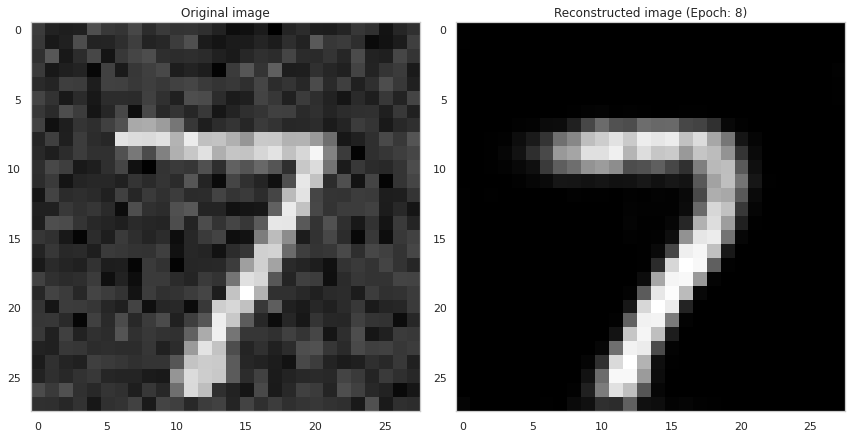

Epoch: 9
AVERAGE TRAIN LOSS: 0.024809038266539574
AVERAGE VAL LOSS: 0.02407313697040081


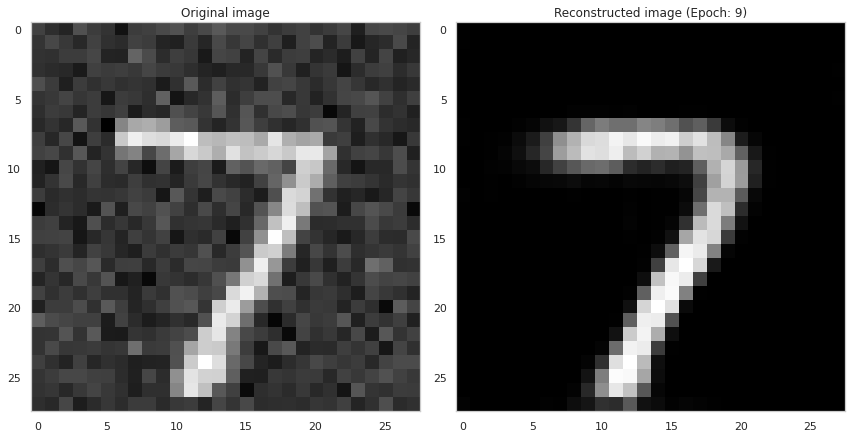

Epoch: 10
AVERAGE TRAIN LOSS: 0.023378567770123482
AVERAGE VAL LOSS: 0.023021558299660683


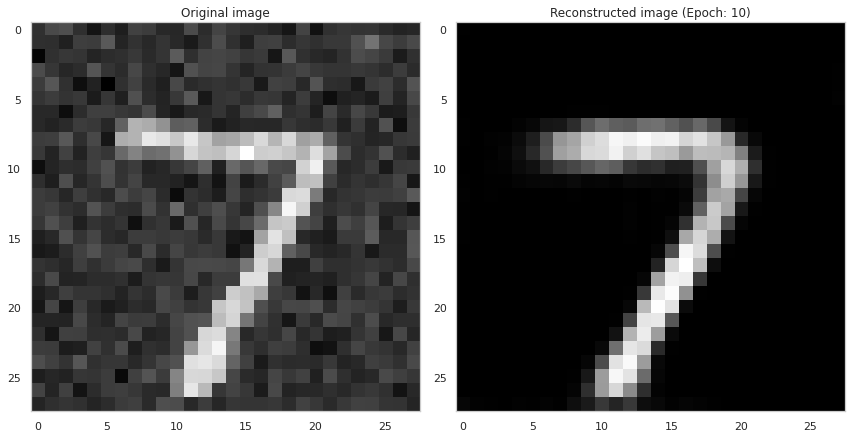

Epoch: 11
AVERAGE TRAIN LOSS: 0.02225043997168541
AVERAGE VAL LOSS: 0.021719392389059067


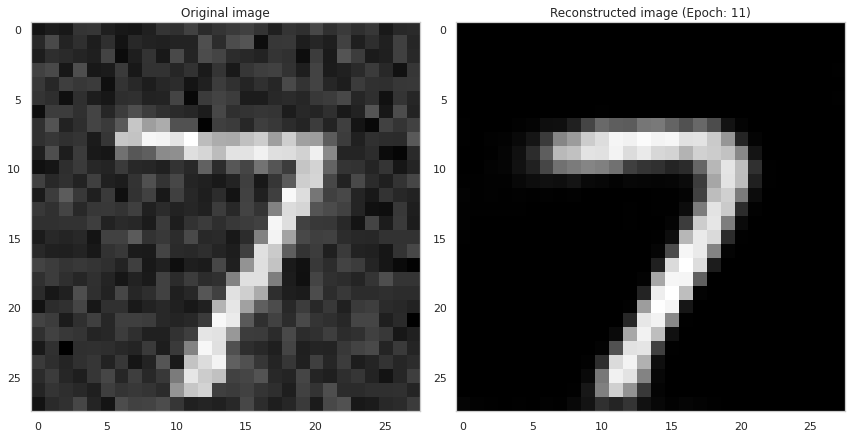

Epoch: 12
AVERAGE TRAIN LOSS: 0.02114223688840866
AVERAGE VAL LOSS: 0.02075980231165886


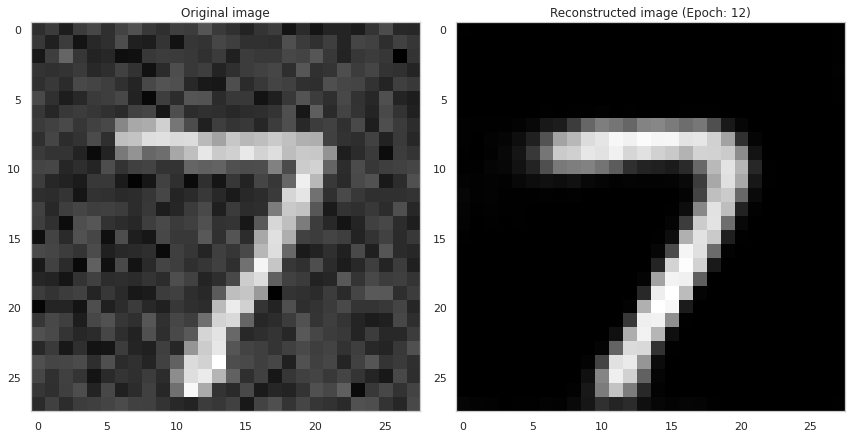

Epoch: 13
AVERAGE TRAIN LOSS: 0.02036120556294918
AVERAGE VAL LOSS: 0.020278168842196465


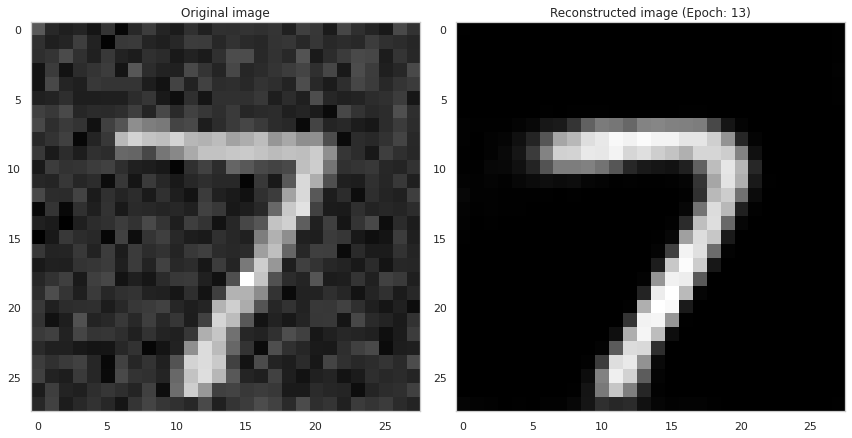

Epoch: 14
AVERAGE TRAIN LOSS: 0.019779205322265625
AVERAGE VAL LOSS: 0.01965620554983616


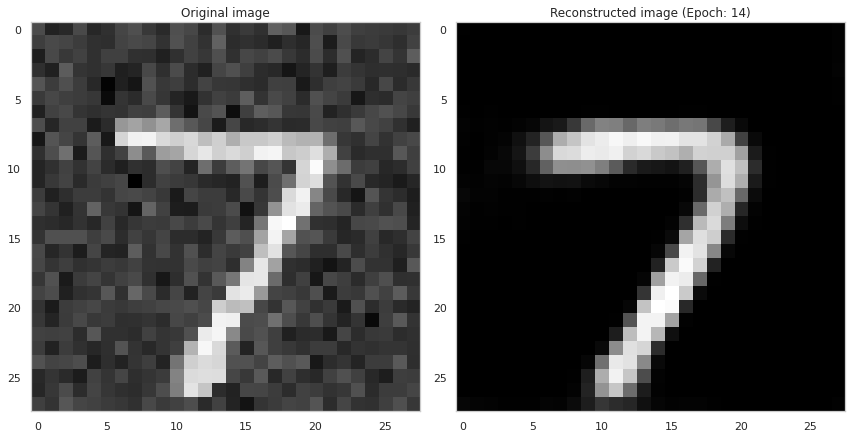

Epoch: 15
AVERAGE TRAIN LOSS: 0.019302522763609886
AVERAGE VAL LOSS: 0.019208285957574844


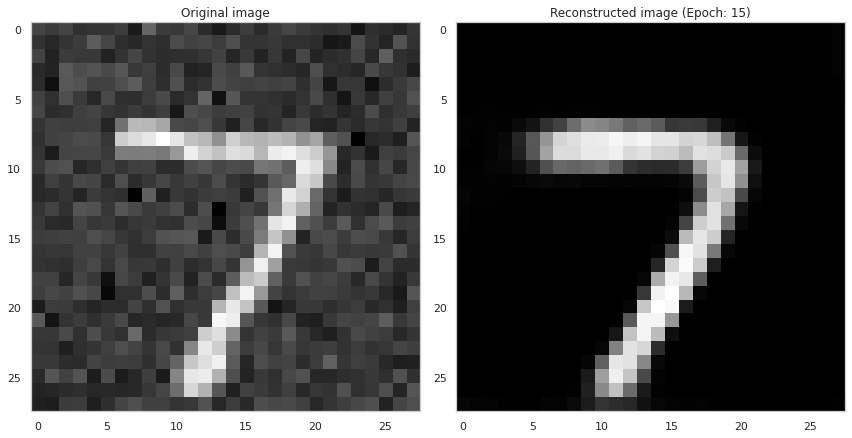

Epoch: 16
AVERAGE TRAIN LOSS: 0.018913809210062027
AVERAGE VAL LOSS: 0.018909331411123276


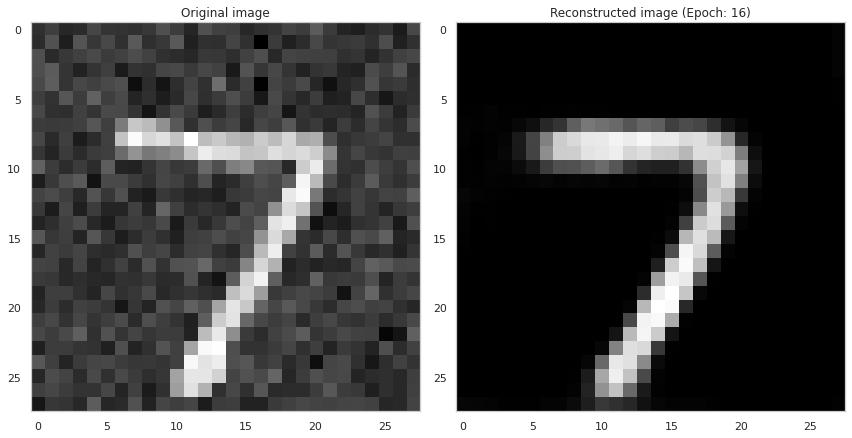

Epoch: 17
AVERAGE TRAIN LOSS: 0.01858917996287346
AVERAGE VAL LOSS: 0.018605714663863182


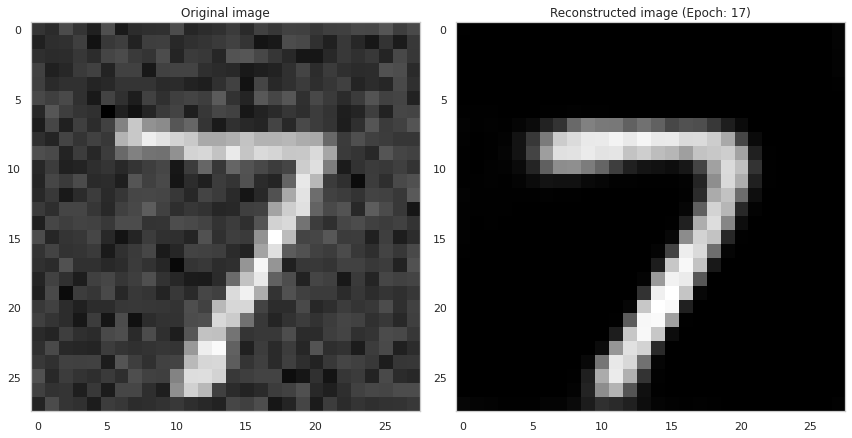

Epoch: 18
AVERAGE TRAIN LOSS: 0.01829688623547554
AVERAGE VAL LOSS: 0.01816573366522789


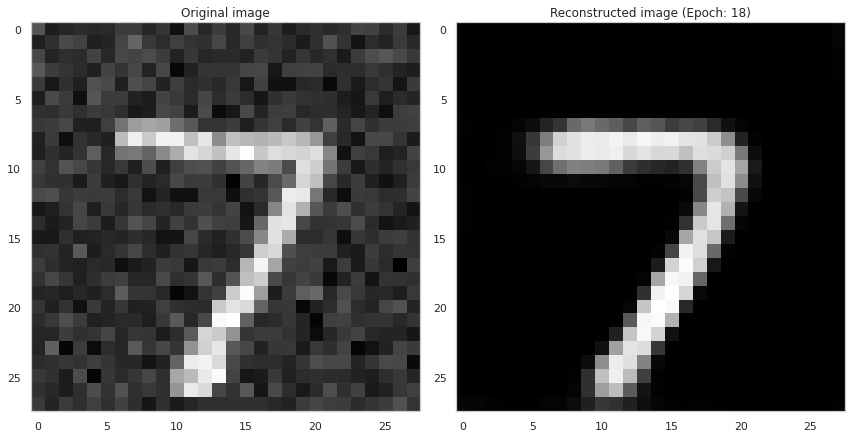

Epoch: 19
AVERAGE TRAIN LOSS: 0.01805616356432438
AVERAGE VAL LOSS: 0.018058419227600098


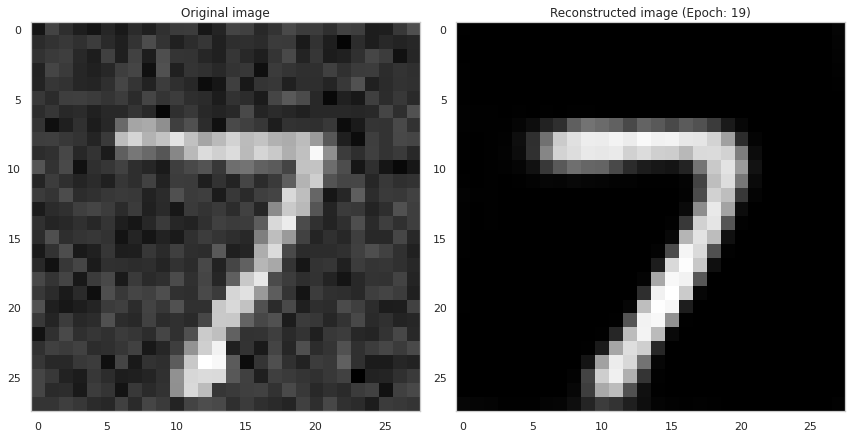

Epoch: 20
AVERAGE TRAIN LOSS: 0.01785449869930744
AVERAGE VAL LOSS: 0.017839249223470688


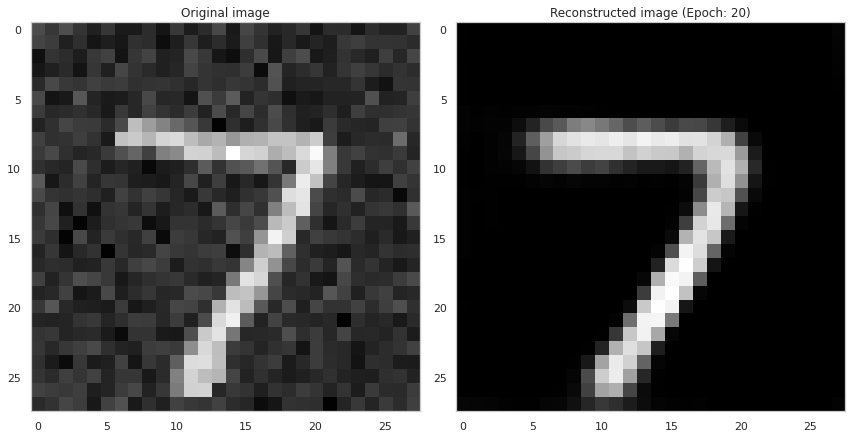

Epoch: 21
AVERAGE TRAIN LOSS: 0.01764817349612713
AVERAGE VAL LOSS: 0.01772673800587654


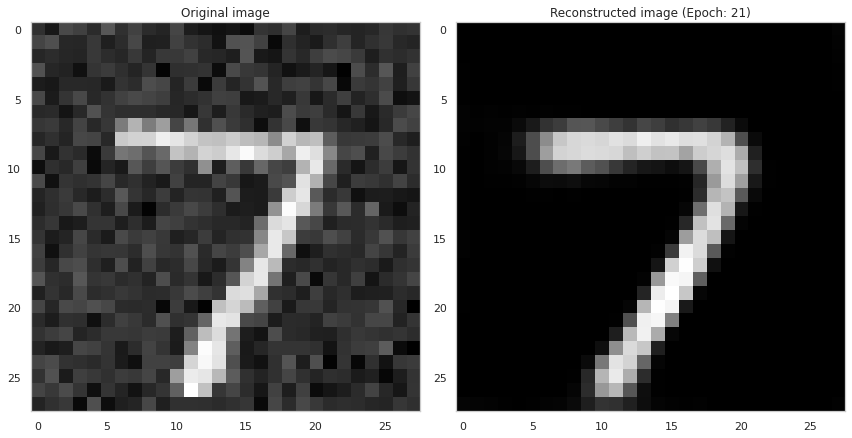

Epoch: 22
AVERAGE TRAIN LOSS: 0.01749325543642044
AVERAGE VAL LOSS: 0.017437350004911423


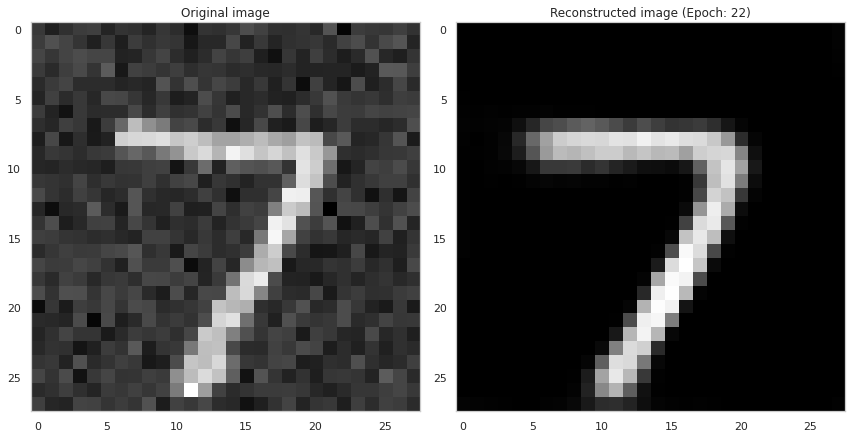

Epoch: 23
AVERAGE TRAIN LOSS: 0.017332084476947784
AVERAGE VAL LOSS: 0.017434880137443542


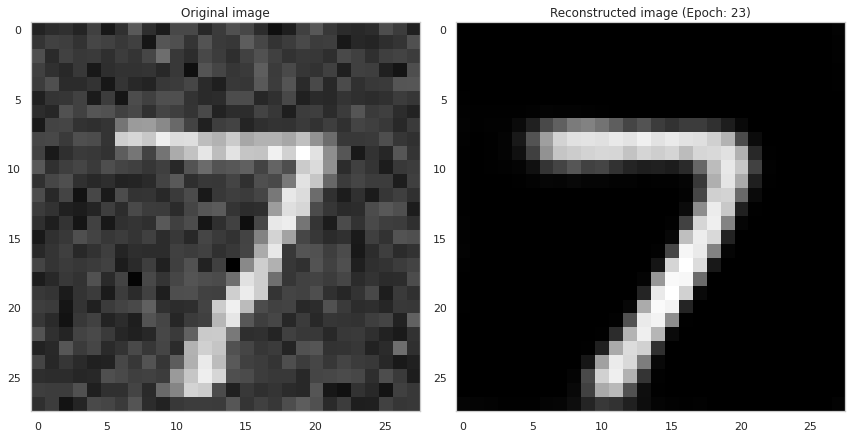

Epoch: 24
AVERAGE TRAIN LOSS: 0.017184045165777206
AVERAGE VAL LOSS: 0.017243731766939163


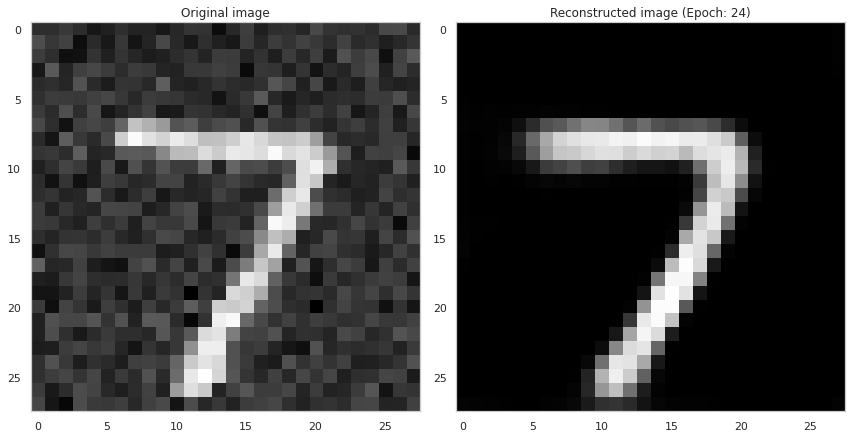

Epoch: 25
AVERAGE TRAIN LOSS: 0.017032258212566376
AVERAGE VAL LOSS: 0.01706269383430481


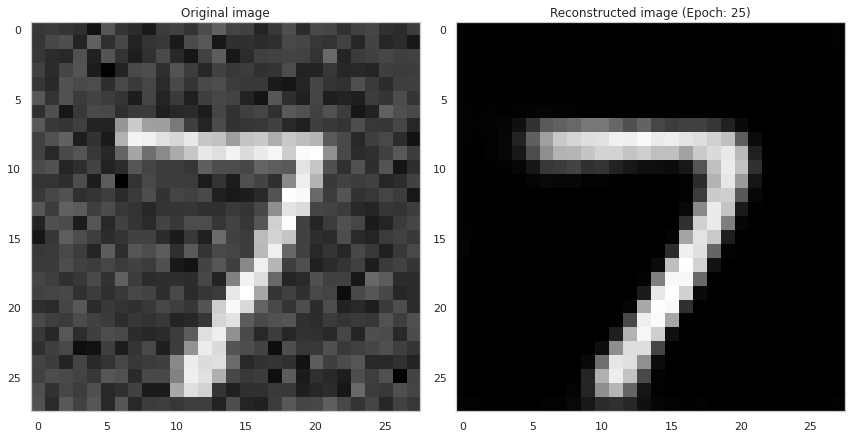

Epoch: 26
AVERAGE TRAIN LOSS: 0.016908857971429825
AVERAGE VAL LOSS: 0.017088036984205246


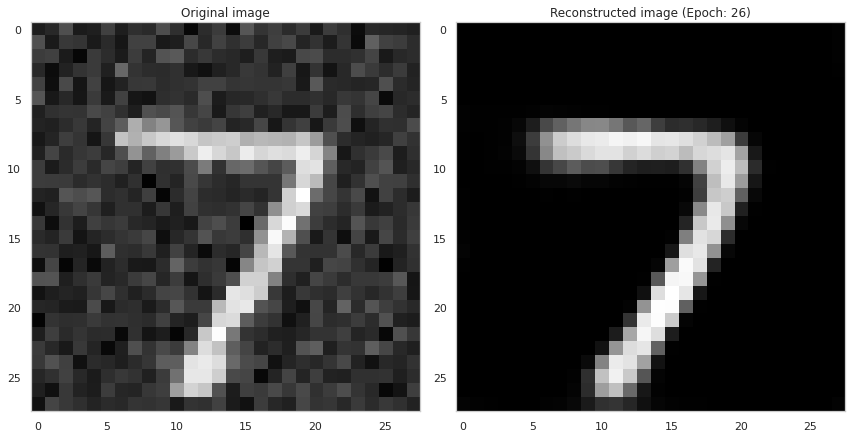

Epoch: 27
AVERAGE TRAIN LOSS: 0.016801321879029274
AVERAGE VAL LOSS: 0.017019569873809814


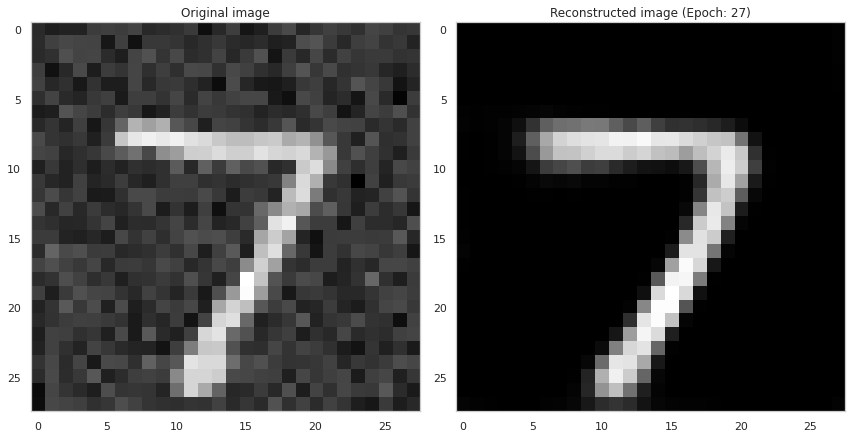

Epoch: 28
AVERAGE TRAIN LOSS: 0.01669284515082836
AVERAGE VAL LOSS: 0.016796287149190903


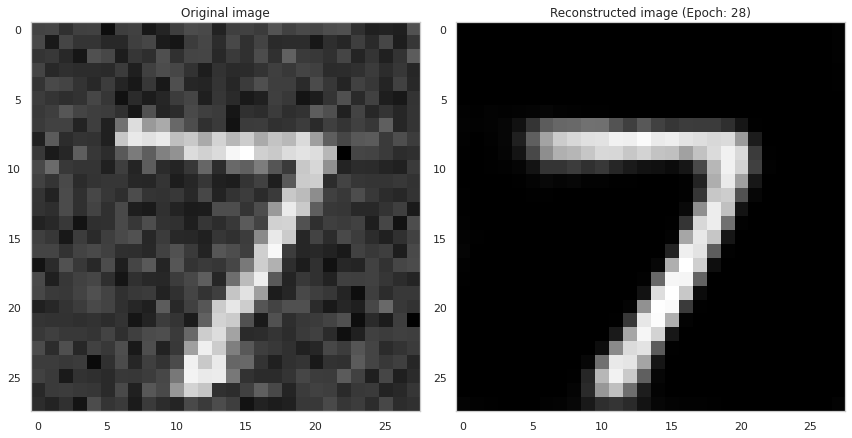

Epoch: 29
AVERAGE TRAIN LOSS: 0.016590306535363197
AVERAGE VAL LOSS: 0.016740377992391586


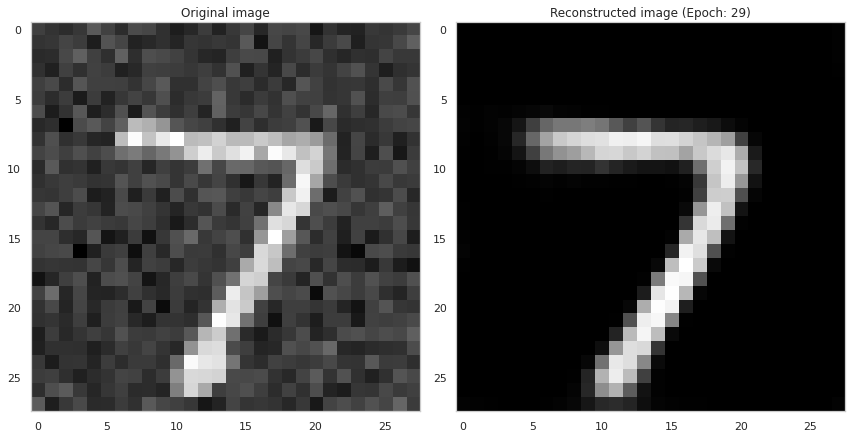

Epoch: 30
AVERAGE TRAIN LOSS: 0.01649731770157814
AVERAGE VAL LOSS: 0.016679733991622925


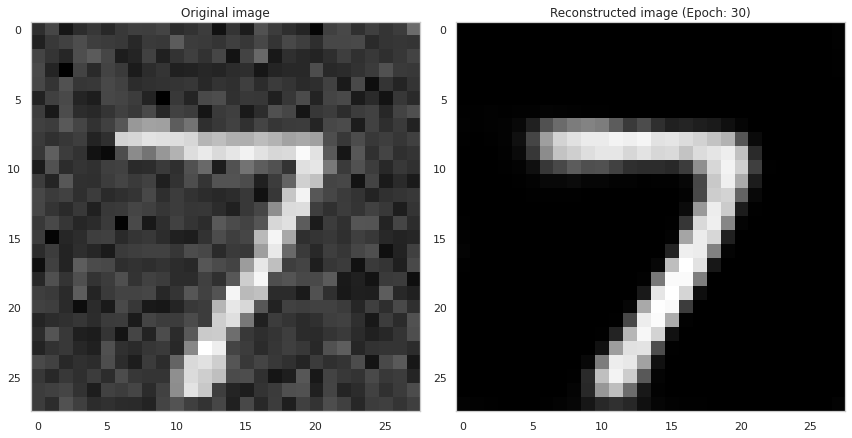

Epoch: 31
AVERAGE TRAIN LOSS: 0.016411785036325455
AVERAGE VAL LOSS: 0.01660008914768696


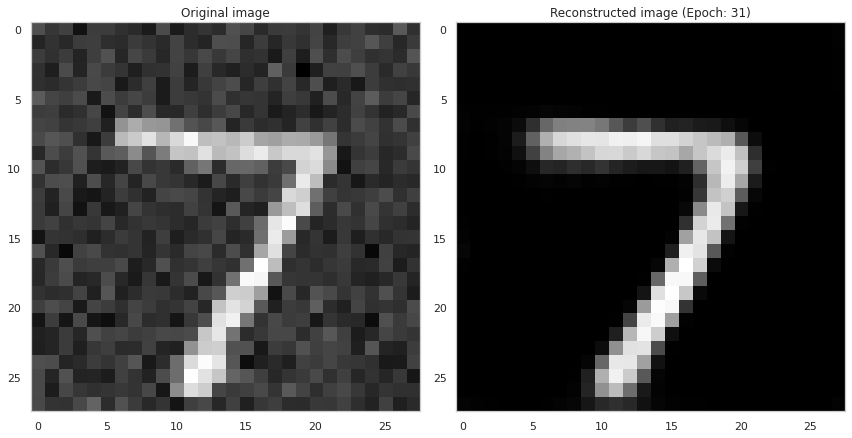

Epoch: 32
AVERAGE TRAIN LOSS: 0.01632329821586609
AVERAGE VAL LOSS: 0.01661861501634121


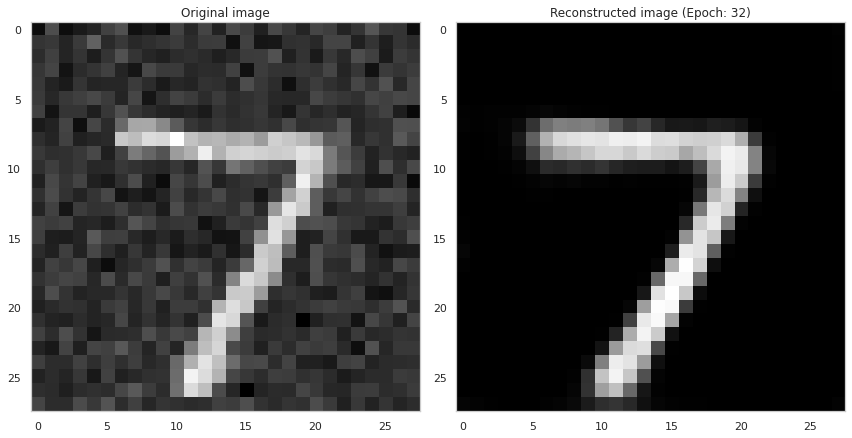

Epoch: 33
AVERAGE TRAIN LOSS: 0.016241928562521935
AVERAGE VAL LOSS: 0.016445424407720566


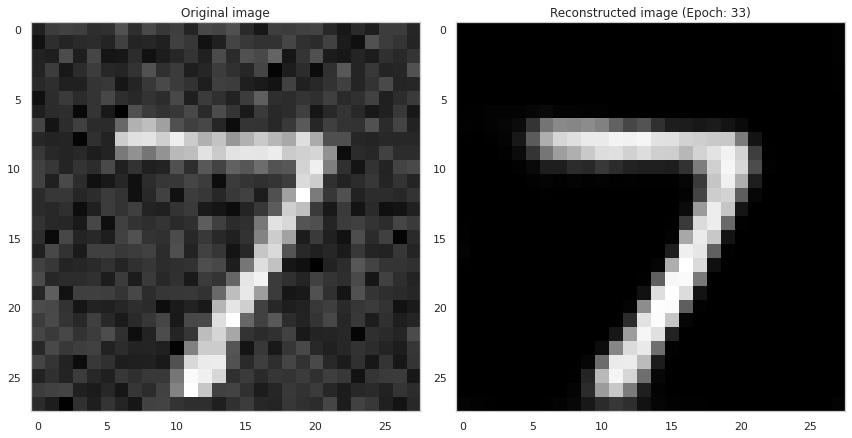

Epoch: 34
AVERAGE TRAIN LOSS: 0.016170164570212364
AVERAGE VAL LOSS: 0.016303110867738724


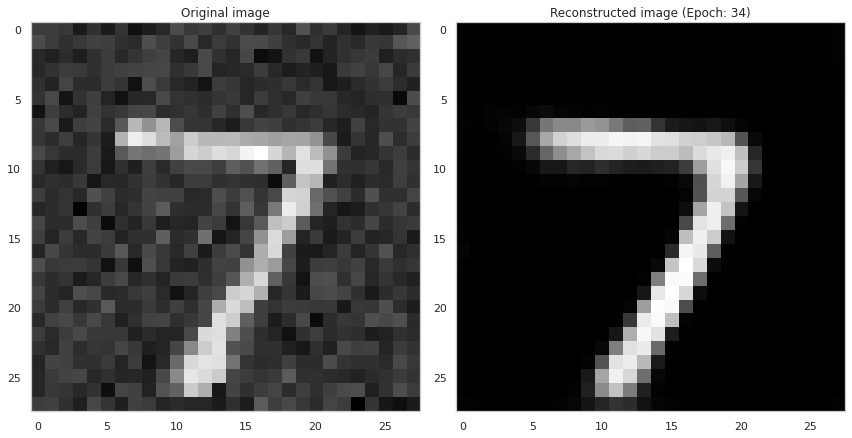

Epoch: 35
AVERAGE TRAIN LOSS: 0.01609005779027939
AVERAGE VAL LOSS: 0.01627381145954132


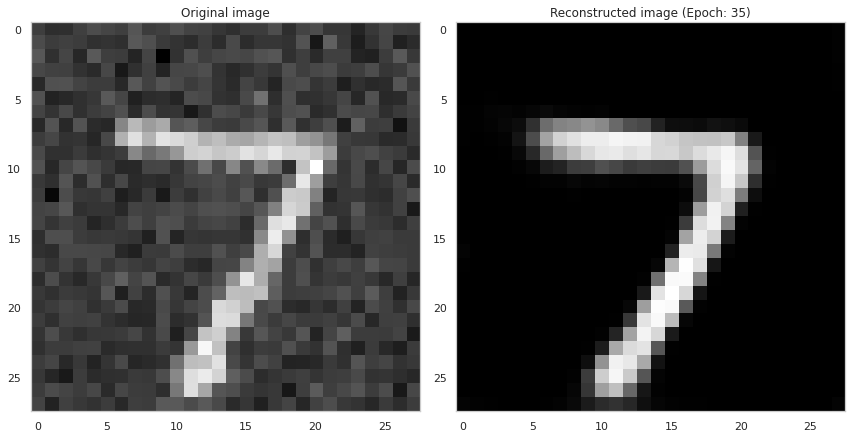

Epoch: 36
AVERAGE TRAIN LOSS: 0.01602967269718647
AVERAGE VAL LOSS: 0.016388148069381714


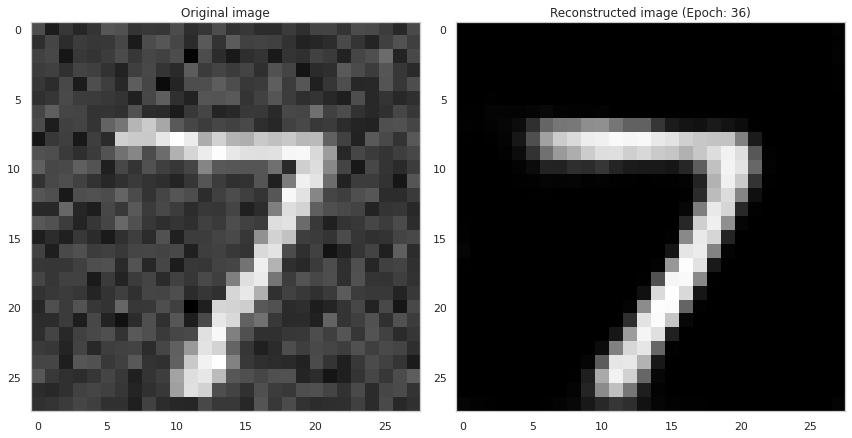

Epoch: 37
AVERAGE TRAIN LOSS: 0.015959203243255615
AVERAGE VAL LOSS: 0.01629098318517208


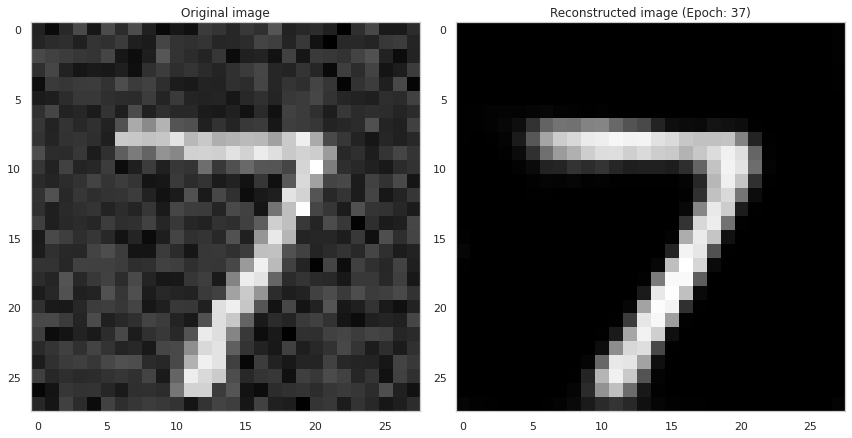

Epoch: 38
AVERAGE TRAIN LOSS: 0.015896230936050415
AVERAGE VAL LOSS: 0.016133960336446762


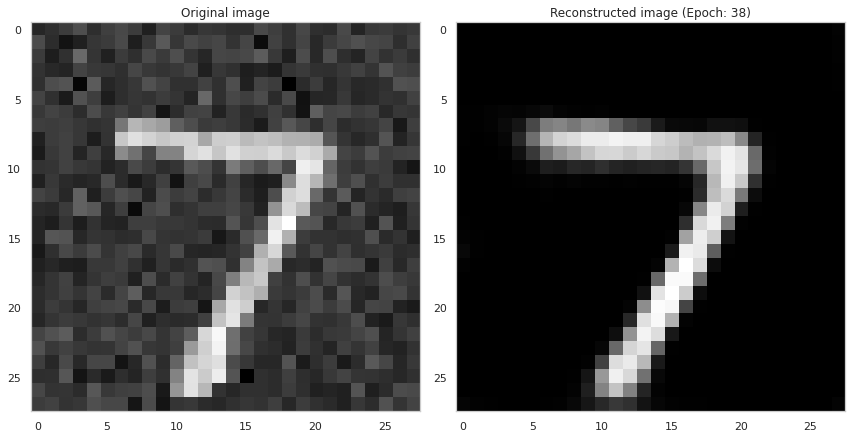

Epoch: 39
AVERAGE TRAIN LOSS: 0.0158443134278059
AVERAGE VAL LOSS: 0.01623452827334404


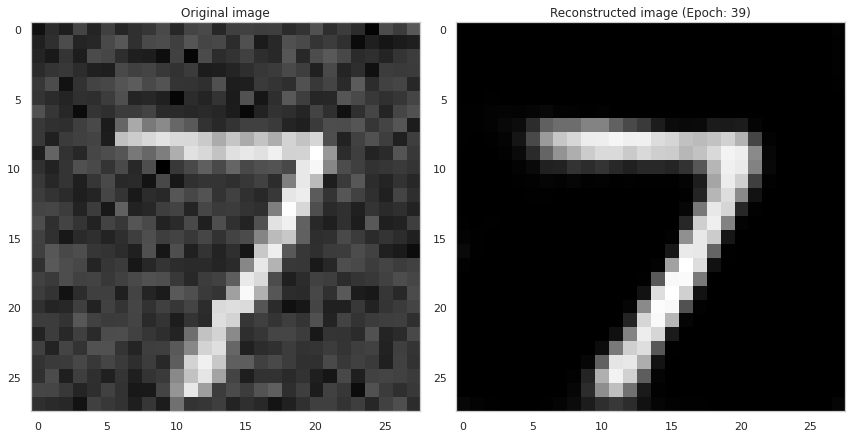

Epoch: 40
AVERAGE TRAIN LOSS: 0.015785586088895798
AVERAGE VAL LOSS: 0.01601000502705574


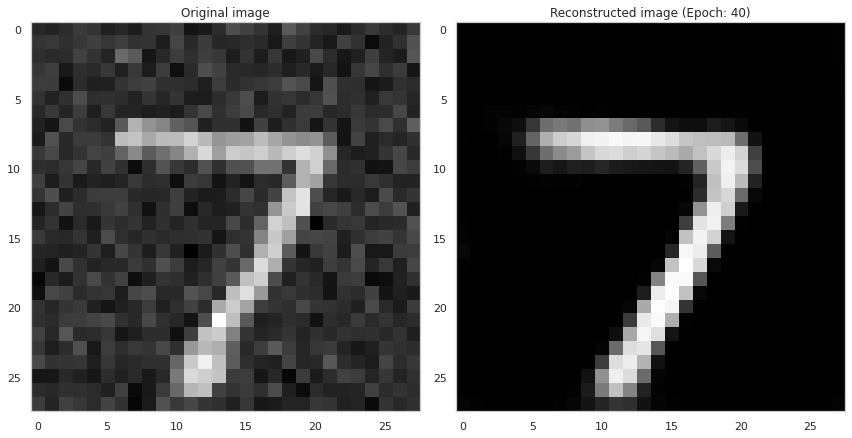

Epoch: 41
AVERAGE TRAIN LOSS: 0.015731915831565857
AVERAGE VAL LOSS: 0.016278419643640518


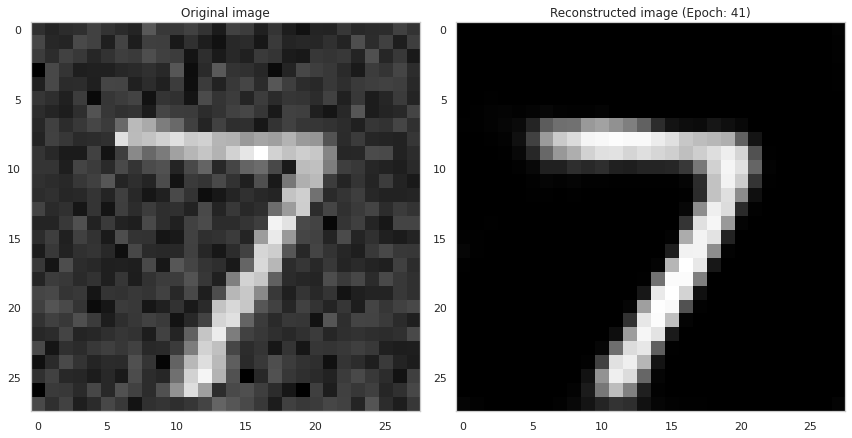

Epoch: 42
AVERAGE TRAIN LOSS: 0.015676910057663918
AVERAGE VAL LOSS: 0.016206197440624237


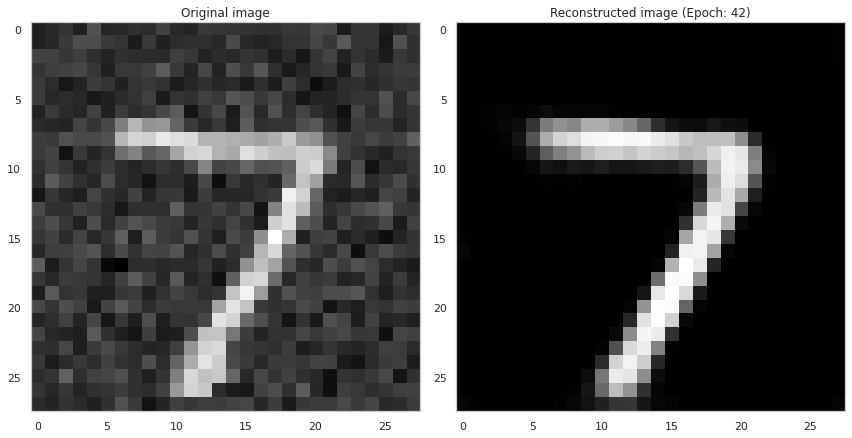

Epoch: 43
AVERAGE TRAIN LOSS: 0.015618580393493176
AVERAGE VAL LOSS: 0.016116859391331673


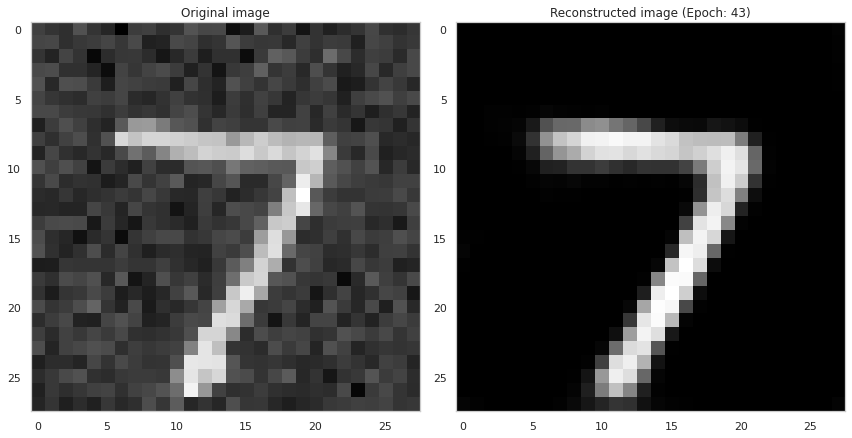

Epoch: 44
AVERAGE TRAIN LOSS: 0.015581821091473103
AVERAGE VAL LOSS: 0.01592825911939144


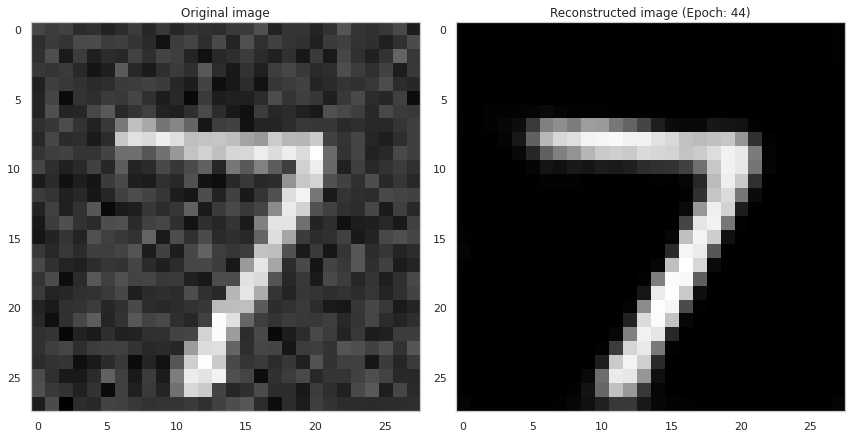

Epoch: 45
AVERAGE TRAIN LOSS: 0.015519737266004086
AVERAGE VAL LOSS: 0.01596752554178238


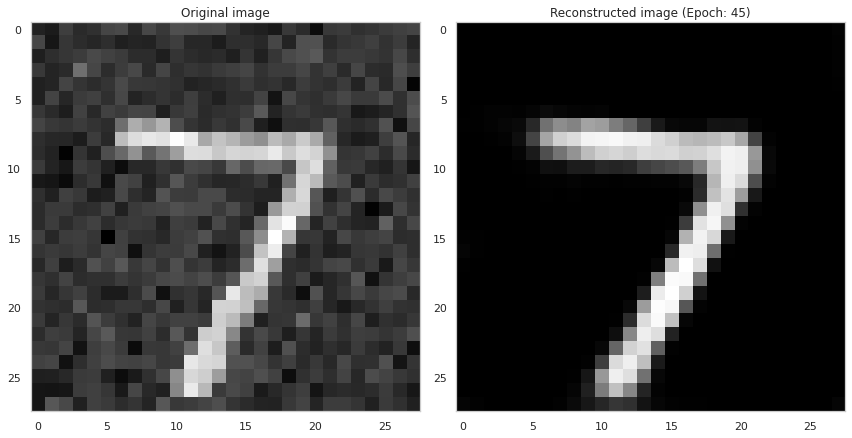

Epoch: 46
AVERAGE TRAIN LOSS: 0.015479412861168385
AVERAGE VAL LOSS: 0.016091587021946907


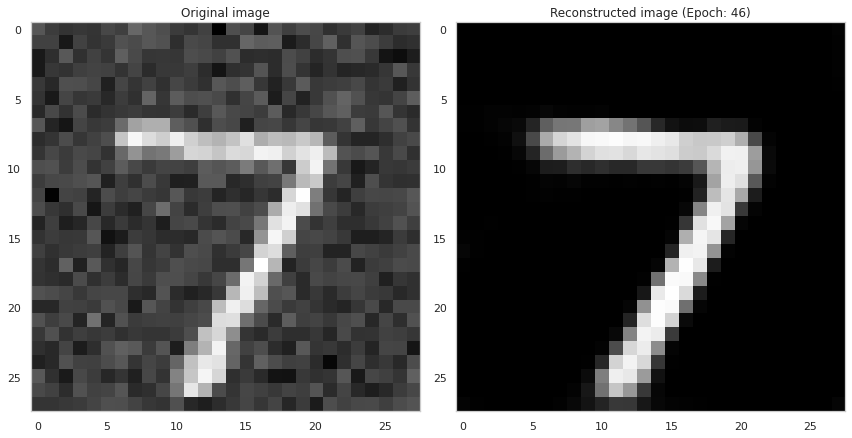

Epoch: 47
AVERAGE TRAIN LOSS: 0.015428970567882061
AVERAGE VAL LOSS: 0.0158360805362463


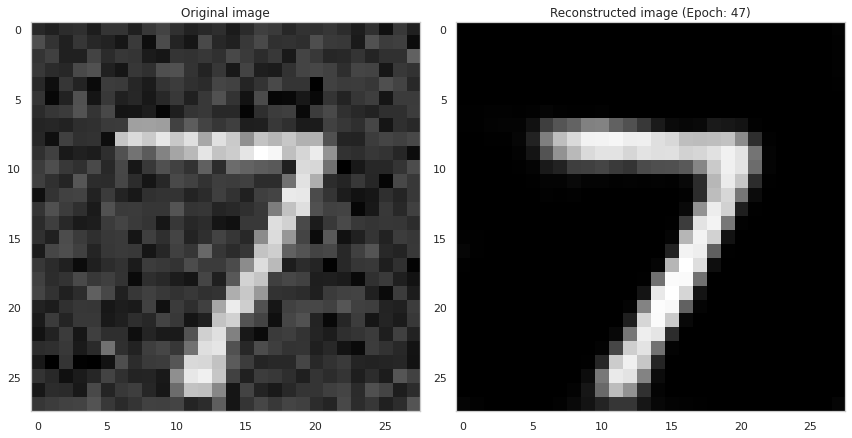

Epoch: 48
AVERAGE TRAIN LOSS: 0.01537947915494442
AVERAGE VAL LOSS: 0.015752075240015984


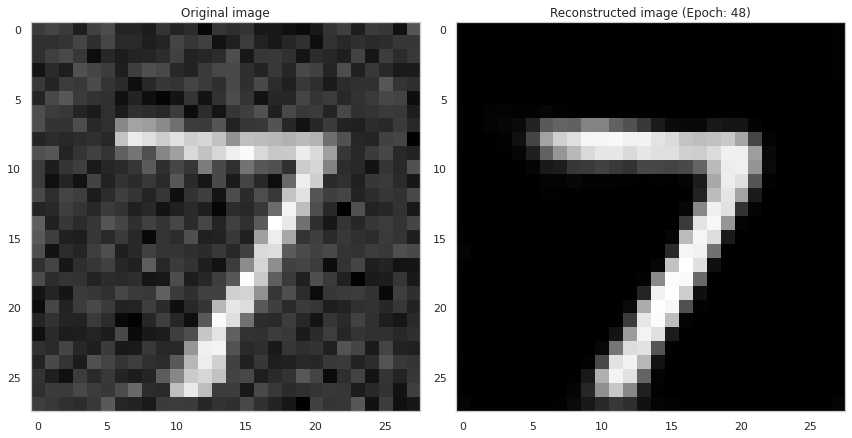

Epoch: 49
AVERAGE TRAIN LOSS: 0.015349218621850014
AVERAGE VAL LOSS: 0.01574576459825039


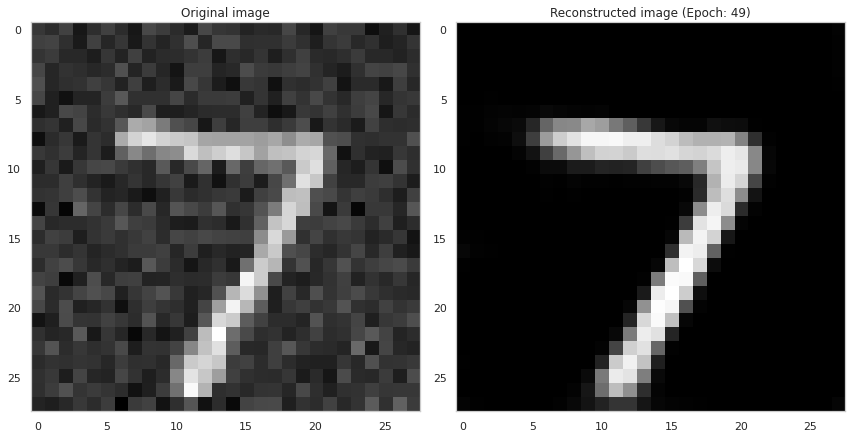

Epoch: 50
AVERAGE TRAIN LOSS: 0.015297631733119488
AVERAGE VAL LOSS: 0.015728231519460678


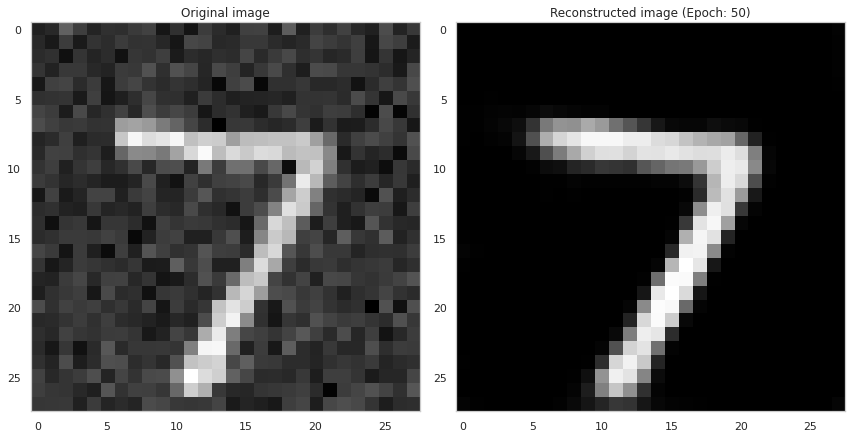

In [ ]:
encoder = Encoder(encoded_space_dim=best_model["Encoded space dim"], Nh1 = int(best_model["Nh1"]))
decoder = Decoder(encoded_space_dim=best_model["Encoded space dim"], Nh1 = int(best_model["Nh1"]))
encoder.apply(init_weights)
decoder.apply(init_weights)
encoder.to(device)
decoder.to(device)
params_to_optimize = [{'params': encoder.parameters()},{'params': decoder.parameters()}]
optimizer = {"Adam":torch.optim.Adam, "RMSprop":torch.optim.RMSprop}
opti = optimizer[best_model["Optimizer"]](params_to_optimize, best_model["Learning rate"], weight_decay = best_model["L2"])
loss_fn = torch.nn.MSELoss()
e = 50
t_l , v_l = train(encoder,decoder,train_dataloader,test_loader,e,opti,loss_fn,best_model["Encoded space dim"],0,0.1)
torch.save(encoder,mydrive + "encoder_denoise.pt")
torch.save(encoder,mydrive + "decoder_denoise.pt")
torch.save(encoder.state_dict(),mydrive+ 'encoder_params_denoise.pth')
torch.save(decoder.state_dict(),mydrive+ 'decoder_params_denoise.pth')

In [ ]:
print("Test Loss = {}".format(v_l[-1]))

Test Loss = 0.015728231519460678


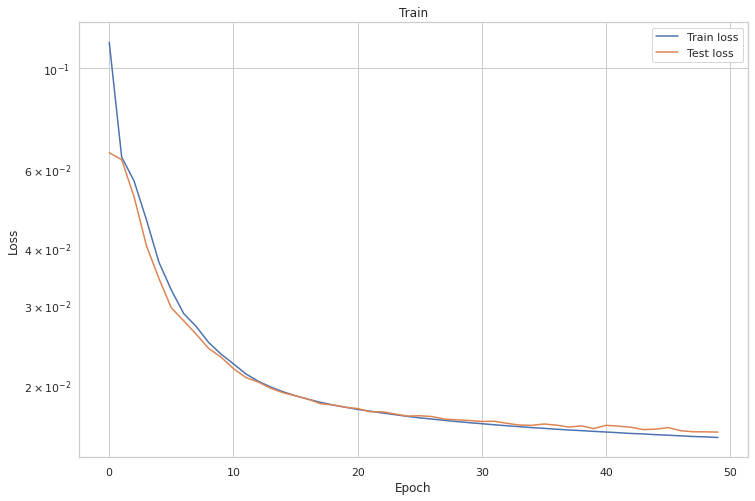

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.semilogy(t_l, label='Train loss')
plt.semilogy(v_l, label='Test loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train')
plt.legend()
plt.show()
fig.savefig('loss final_denoise.png')
fig.savefig(mydrive+'loss final_denoise.png')

# Classifier

In [ ]:
best_model= pd.read_csv(mydrive+"GridSearch.csv").loc[0]

In [ ]:
encoder = Encoder(encoded_space_dim=best_model["Encoded space dim"], Nh1 = int(best_model["Nh1"]))
encoder.load_state_dict(torch.load(mydrive+'encoder_params.pth'))

<All keys matched successfully>

In [ ]:
train = pd.read_csv(mydrive+"encoded_data_train.csv",index_col=0)
test = pd.read_csv(mydrive+"encoded_data_test.csv",index_col=0)

train_dataset = torch.utils.data.TensorDataset(torch.Tensor(np.array(train.iloc[:,:-1])), torch.Tensor(np.array(train.iloc[:,-1])).long())
test_dataset = torch.utils.data.TensorDataset(torch.Tensor(np.array(test.iloc[:,:-1])), torch.Tensor(np.array(test.iloc[:,-1])).long())
rs = ShuffleSplit(n_splits=1, test_size=.2, random_state=42)
for train_index, val_index in rs.split(train_dataset):
  Train = torch.utils.data.Subset(train_dataset,train_index)
  Val = torch.utils.data.Subset(train_dataset,val_index)
  train_loader = torch.utils.data.DataLoader(Train, batch_size = 256, shuffle = False, num_workers= 1)
  valid_loader = torch.utils.data.DataLoader(Val, batch_size = 256, shuffle = False, num_workers= 1)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size = 256, shuffle = False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size = 256, shuffle = True)

In [ ]:
class Net(nn.Module):
  def __init__(self, Ni, Nh1, No, p1):
    super().__init__()
    self.fc1 = nn.Linear(in_features=Ni, out_features=Nh1)
    self.out = nn.Linear(Nh1, No)
    self.act = nn.ReLU()
    self.dropout1 = nn.Dropout(p1)

  def forward(self, x, additional_out=False):
      x   = self.act(self.fc1(x))
      x   = self.dropout1(x)
      x = self.out(x)
      return x

In [ ]:
def train(net, train, valid, epochs, optimizer, loss_fn):
  train_loss_log = []
  val_loss_log = []
  for epoch_num in range(epochs):
    #print(epoch_num)
    train_loss= []
    net.train() 
    for sample_batched in train:
      x_batch = sample_batched[0].to(device)
      label_batch = sample_batched[1].to(device)
      out = net(x_batch)
      loss = loss_fn(out, label_batch)
      net.zero_grad()
      loss.backward()
      optimizer.step()
      loss_batch = loss.detach().cpu().numpy()
      train_loss.append(loss_batch)

    train_loss = np.mean(train_loss)
    #print(f"AVERAGE TRAIN LOSS: {train_loss}")
    train_loss_log.append(train_loss)

    val_loss= []
    net.eval()
    with torch.no_grad(): 
      for sample_batched in valid:
        x_batch = sample_batched[0].to(device)
        label_batch = sample_batched[1].to(device)
        out = net(x_batch)
        loss = loss_fn(out, label_batch)
        loss_batch = loss.detach().cpu().numpy()
        val_loss.append(loss_batch)
        
      val_loss = np.mean(val_loss)
      #print(f"AVERAGE VAL LOSS: {np.mean(val_loss)}")
      val_loss_log.append(val_loss)
  return train_loss_log, val_loss_log

In [ ]:
def GridSearch(Ni, Nh1, No, optimizer, epochs, lr, prob1, weight_dec):
  res = pd.DataFrame(columns=["Nh1","Optimizer","Epochs", "Learning rate","Prob1","Weight_dec","Valid_Loss"])
  
  niter = len(Nh1)*len(optimizer)*len(lr)*len(prob1)*len(weight_dec)
  it = 1
  for i in Nh1:
    for opt_name, opt in optimizer.items():
      for l_r in lr:
        for p1 in prob1:
          for w in weight_dec:
            print("Nh1 = ", i ,
                  "| Optimizer = ", opt_name, 
                  "| Lr = ", l_r, 
                  "| p1 = ", p1,
                  "| weight_dec = ", w, 
                  "| Iter = ", it,"/", niter)
            net = Net(Ni,i,No,p1)
            net.apply(init_weights)
            net.to(device)
            opti = opt(net.parameters(), l_r, weight_decay = w)
            loss_fn = nn.CrossEntropyLoss()
            t_l , v_l = train(net, train_loader, valid_loader, epochs, opti, loss_fn)
            data = pd.Series({"Nh1" : i,
                                "Optimizer" : opt_name, 
                                "Epochs" : epochs,
                                "Learning rate": l_r,
                                "Prob1": p1,
                                "Weight_dec": w,
                                "Valid_Loss"  : v_l[-1]},
                            name=it)        
            res = res.append(data)
            it +=1
  return res.sort_values("Valid_Loss")

## Grid search

In [ ]:
Ni = 9
np.random.seed(0)
Nh1 = list(np.random.randint(50, 300, size=6))
No = 10
optimizer = {"Adam":torch.optim.Adam, "RMSprop":torch.optim.RMSprop}
l_r = [0.001, 0.005]
prob1 = [0, 0.05, 0.1]
weight_d = [0, 1e-03, 1e-05]
e = 20
results = GridSearch(Ni, Nh1, No, optimizer, e, l_r, prob1, weight_d)
results.to_csv(mydrive+"GridSearch1_ae.csv", index=False)

Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0 | weight_dec =  0 | Iter =  1 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0 | weight_dec =  0.001 | Iter =  2 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0 | weight_dec =  1e-05 | Iter =  3 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0.05 | weight_dec =  0 | Iter =  4 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0.05 | weight_dec =  0.001 | Iter =  5 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0.05 | weight_dec =  1e-05 | Iter =  6 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0.1 | weight_dec =  0 | Iter =  7 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0.1 | weight_dec =  0.001 | Iter =  8 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.001 | p1 =  0.1 | weight_dec =  1e-05 | Iter =  9 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.005 | p1 =  0 | weight_dec =  0 | Iter =  10 / 216
Nh1 =  227 | Optimizer =  Adam | Lr =  0.005 | p1 

In [ ]:
head = results.head()
head

,Nh1,Optimizer,Epochs,Learning rate,Prob1,Weight_dec,Valid_Loss
99,184,RMSprop,20,0.001,0.1,1e-05,0.147498
6,227,Adam,20,0.001,0.05,1e-05,0.148291
4,227,Adam,20,0.001,0.05,0,0.148330
25,227,RMSprop,20,0.001,0.1,0,0.148773
7,227,Adam,20,0.001,0.1,0,0.149088


In [ ]:
best_model= pd.read_csv(mydrive+"GridSearch1_ae.csv").loc[0]
best_model

Nh1                   184
Optimizer         RMSprop
Epochs                 20
Learning rate       0.001
Prob1                 0.1
Weight_dec          1e-05
Valid_Loss       0.147498
Name: 0, dtype: object

In [ ]:
pd.read_csv(mydrive+"GridSearch1_ae.csv").head().to_latex(index=False)

'\\begin{tabular}{rlrrrrr}\n\\toprule\n Nh1 & Optimizer &  Epochs &  Learning rate &  Prob1 &  Weight\\_dec &  Valid\\_Loss \\\\\n\\midrule\n 184 &   RMSprop &      20 &          0.001 &   0.10 &     0.00001 &    0.147498 \\\\\n 227 &      Adam &      20 &          0.001 &   0.05 &     0.00001 &    0.148291 \\\\\n 227 &      Adam &      20 &          0.001 &   0.05 &     0.00000 &    0.148330 \\\\\n 227 &   RMSprop &      20 &          0.001 &   0.10 &     0.00000 &    0.148773 \\\\\n 227 &      Adam &      20 &          0.001 &   0.10 &     0.00000 &    0.149088 \\\\\n\\bottomrule\n\\end{tabular}\n'

## Best Model

In [ ]:
net = Net(9,best_model["Nh1"],10, best_model["Prob1"])
net.apply(init_weights)
net.to(device)
optimizer = {"Adam":torch.optim.Adam, "RMSprop":torch.optim.RMSprop}
o = optimizer[best_model["Optimizer"]]
o = o(net.parameters(),best_model["Learning rate"],weight_decay = best_model["Weight_dec"])
loss_fn = nn.CrossEntropyLoss()
t, v = train(net,train_loader,valid_loader, 20 , o ,loss_fn)

In [ ]:
print("Validation loss:",v[-1])

Validation loss: 0.15070847


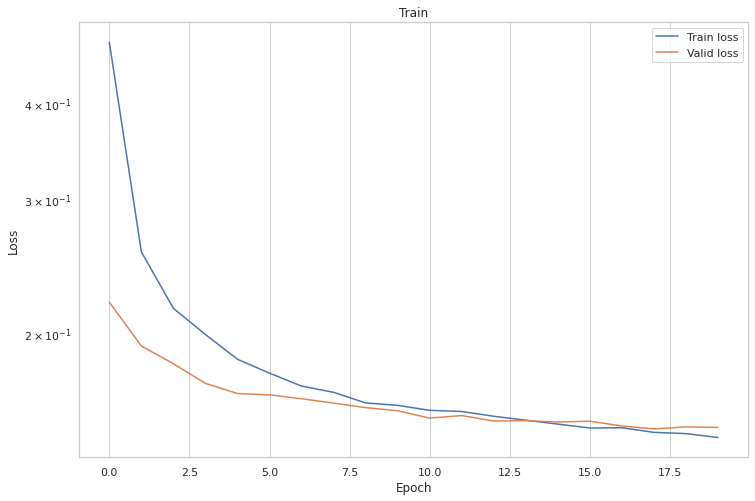

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.semilogy(t, label='Train loss')
plt.semilogy(v, label='Valid loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Train")
plt.legend()
plt.show()
fig.savefig('Train KCV.png')
fig.savefig(mydrive+'Train KCV class.png')

## Final train

Test Loss = 0.156792551279068


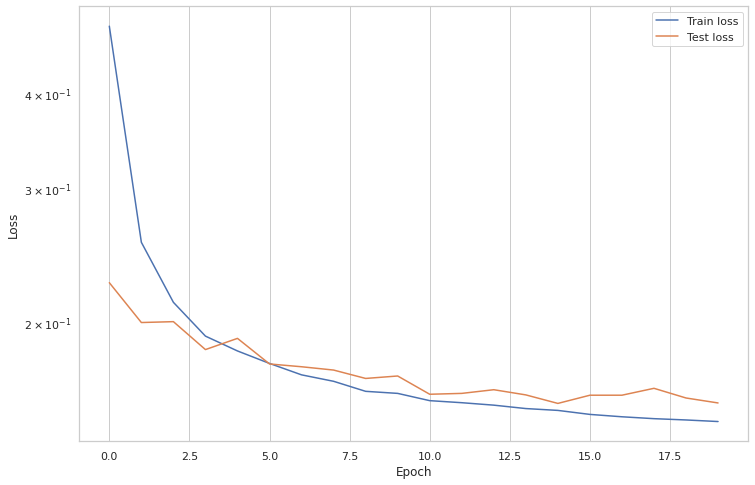

In [ ]:
net = Net(9,best_model["Nh1"],10, best_model["Prob1"])
net.apply(init_weights)
net.to(device)
optimizer = {"Adam":torch.optim.Adam, "RMSprop":torch.optim.RMSprop}
o = optimizer[best_model["Optimizer"]]
o = o(net.parameters(),best_model["Learning rate"],weight_decay = best_model["Weight_dec"])
loss_fn = nn.CrossEntropyLoss()
t, v = train(net,train_dataloader,test_loader, 20 , o ,loss_fn)

print("Test Loss = {}".format(v[-1]))

fig = plt.figure(figsize=(12,8))
plt.semilogy(t, label='Train loss')
plt.semilogy(v, label='Test loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
fig.savefig('loss final class.png')
fig.savefig(mydrive+'loss final class.png')

In [ ]:
all_inputs = []
all_outputs = []
all_labels = []
net.eval()
with torch.no_grad():
    for sample_batched in test_loader:
      x_batch = sample_batched[0].to(device)
      label_batch = sample_batched[1].to(device)
      out = net(x_batch)
      all_inputs.append(x_batch)
      all_outputs.append(out)
      all_labels.append(label_batch)

#all_inputs  = torch.cat(all_inputs).cpu().numpy()
all_outputs = torch.cat(all_outputs)
all_labels  = torch.cat(all_labels).cpu().numpy()
all_outputs = F.log_softmax(all_outputs, dim=1)

_, y_class = all_outputs.max(1)
np_Y_test = all_labels
np_y_pred = y_class.cpu().numpy()
correct = np.sum(np_Y_test == np_y_pred)
print("Accuracy = {:.3f} %".format(correct*100/np_Y_test.shape[0]))

Accuracy = 94.850 %


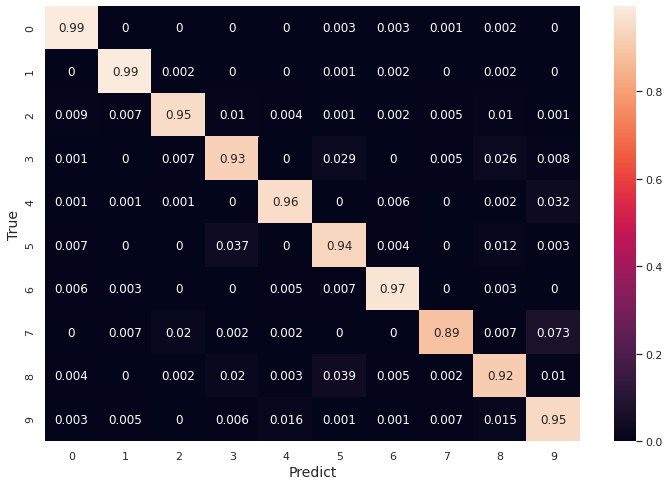

In [ ]:
# confusion matrix (normalized over rows, e.g. true labels)
confusion = confusion_matrix(np_Y_test, np_y_pred, normalize="true")
df_confusion = pd.DataFrame(confusion, index = [i for i in range(10)], columns = [i for i in range(10)])
df_confusion = df_confusion.round(3)
# plot entire confusion matrix
plt.figure(figsize = (12,8))
sns.heatmap(df_confusion, annot=True)
plt.xlabel("Predict", fontsize=14)
plt.ylabel("True", fontsize=14)
plt.savefig(mydrive+"Confusion_complete.png")
plt.show()

# GAN

In [ ]:
compose = transforms.Compose([transforms.ToTensor(),transforms.Normalize((.5), (.5))])

In [ ]:
train_dataset1 = torchvision.datasets.MNIST('classifier_data', train=True, download=True,transform = compose)
test_dataset1  = torchvision.datasets.MNIST('classifier_data', train=False, download=True,transform = compose)

Extracting classifier_data/MNIST/raw/train-images-idx3-ubyte.gz to classifier_data/MNIST/raw



Extracting classifier_data/MNIST/raw/train-labels-idx1-ubyte.gz to classifier_data/MNIST/raw


Extracting classifier_data/MNIST/raw/t10k-images-idx3-ubyte.gz to classifier_data/MNIST/raw


Extracting classifier_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to classifier_data/MNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning:

The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)



check that Max = 1 and Min = -1

In [ ]:
print("Max:",train_dataset1[0][0].max())
print("Min:",train_dataset1[0][0].min())

Max: tensor(1.)
Min: tensor(-1.)


In [ ]:
rs = ShuffleSplit(n_splits=1, test_size=.2, random_state=42)
for train_index, val_index in rs.split(train_dataset1):
  Train = torch.utils.data.Subset(train_dataset1,train_index)
  Val = torch.utils.data.Subset(train_dataset1,val_index)
  train_loader = torch.utils.data.DataLoader(Train, batch_size = 256, shuffle = False, num_workers= 1)
  valid_loader = torch.utils.data.DataLoader(Val, batch_size = 256, shuffle = False, num_workers= 1)
  
train_dataloader = torch.utils.data.DataLoader(train_dataset1, batch_size = 256, shuffle = False)
test_loader = torch.utils.data.DataLoader(test_dataset1, batch_size = 256, shuffle = True)

## Discriminator

In [ ]:
class Discriminator(nn.Module):
  def __init__(self, Nh1, Nh2, p1, p2):
    super().__init__()
    self.fc1 = nn.Linear(in_features=784, out_features=Nh1)
    self.fc2 = nn.Linear(Nh1, Nh2)
    self.fc3 = nn.Linear(Nh2, 1)
    self.act = nn.LeakyReLU(0.2)
    self.dropout1 = nn.Dropout(p1)
    self.dropout2 = nn.Dropout(p2)

  def forward(self, x, additional_out=False):
      x   = self.act(self.fc1(x))
      x   = self.dropout1(x)
      x   = self.act(self.fc2(x))
      x   = self.dropout2(x)
      out = torch.sigmoid(self.fc3(x))
      return out

## Generator

In [ ]:
class Generator(nn.Module):
  def __init__(self, Ni, Nh1, Nh2, p1, p2):
    super().__init__()
    self.fc1 = nn.Linear(in_features=Ni, out_features=Nh1)
    self.fc2 = nn.Linear(Nh1, Nh2)
    self.fc3 = nn.Linear(Nh2, 784)
    self.act = nn.LeakyReLU(0.2)
    self.dropout1 = nn.Dropout(p1)
    self.dropout2 = nn.Dropout(p2)

  def forward(self, x, additional_out=False):
      x   = self.act(self.fc1(x))
      x   = self.dropout1(x)
      x   = self.act(self.fc2(x))
      x   = self.dropout2(x)
      out = torch.tanh(self.fc3(x))
      return out

In [ ]:
def gen_data(n_samples, Ni):
  return torch.randn(n_samples,Ni).to(device)

In [ ]:
discriminator = Discriminator(512,256,0.3,0.3)
generator = Generator(100,256,512,0.3,0.3)

In [ ]:
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0005)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002)

In [ ]:
loss = nn.BCELoss()

In [ ]:
discriminator.to(device)
generator.to(device)

Generator(
  (fc1): Linear(in_features=100, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=521, bias=True)
  (fc3): Linear(in_features=521, out_features=784, bias=True)
  (act): LeakyReLU(negative_slope=0.2)
  (dropout1): Dropout(p=0.3, inplace=False)
  (dropout2): Dropout(p=0.3, inplace=False)
)

In [ ]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, torch.ones(N, 1).to(device))
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, torch.zeros(N, 1).to(device))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [ ]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, torch.ones(N, 1).to(device))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

## Train

epoch: 1


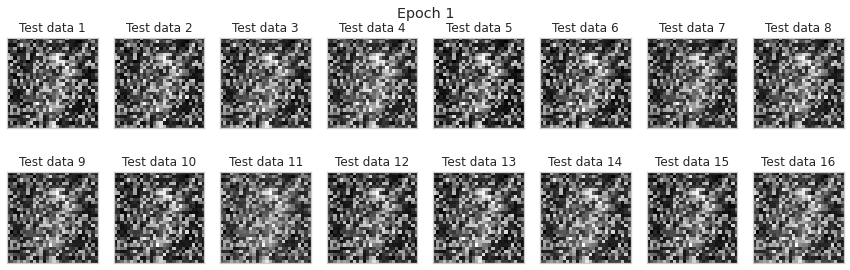

epoch: 2


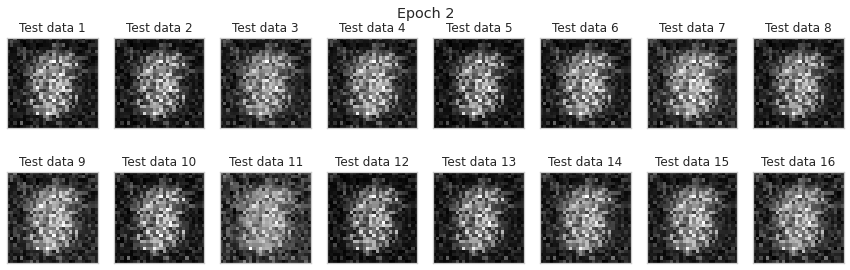

epoch: 3


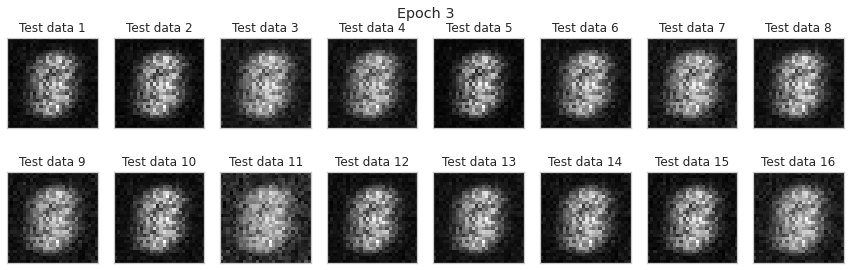

epoch: 4


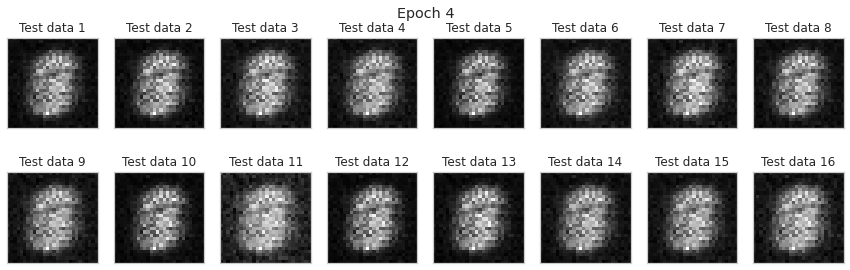

epoch: 5


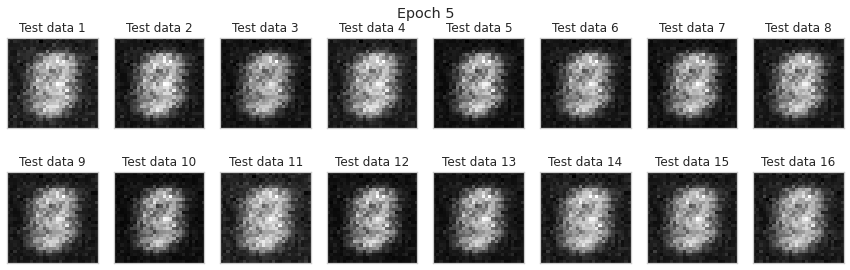

epoch: 6


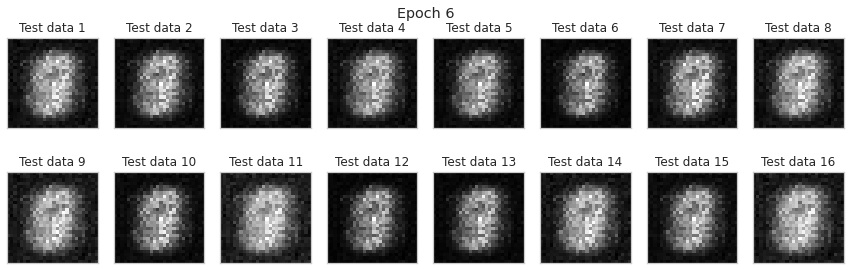

epoch: 7


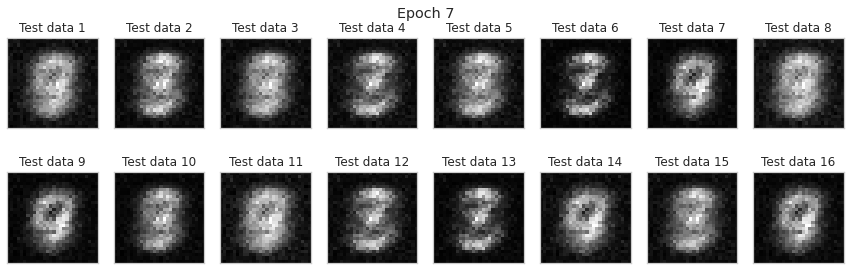

epoch: 8


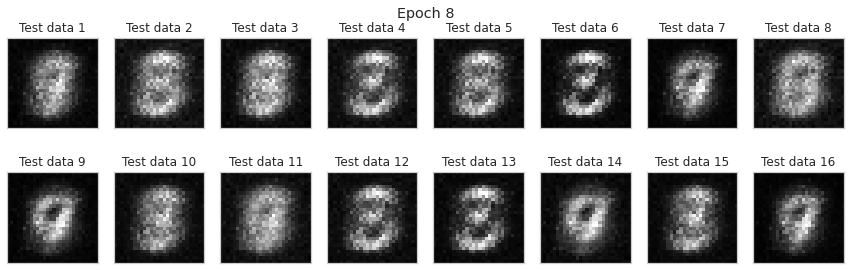

epoch: 9


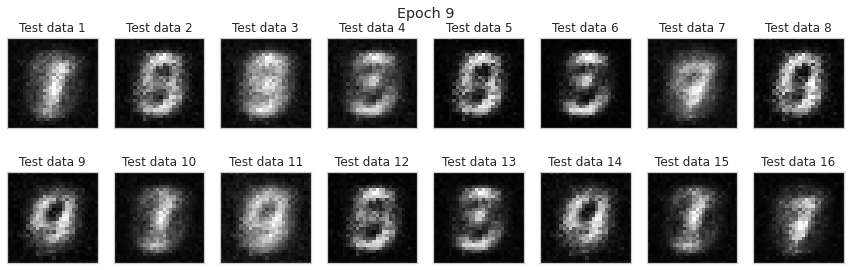

epoch: 10


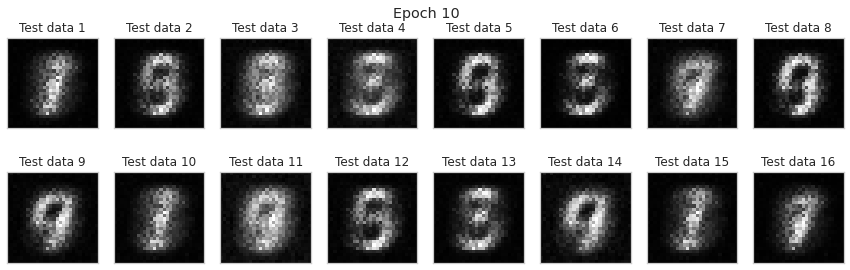

epoch: 11


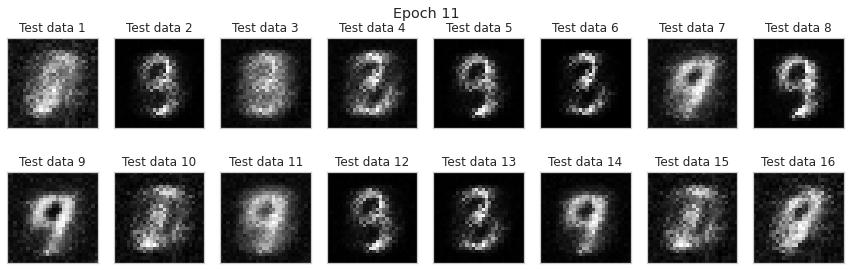

epoch: 12


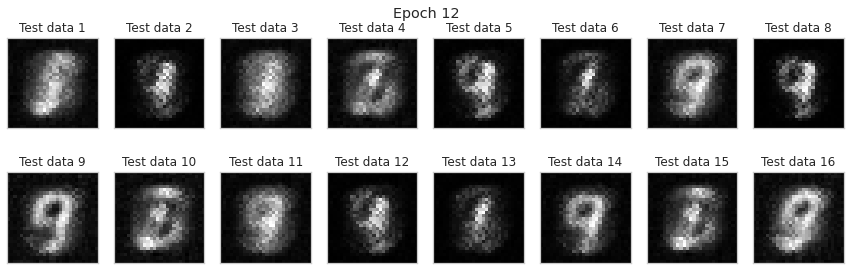

epoch: 13


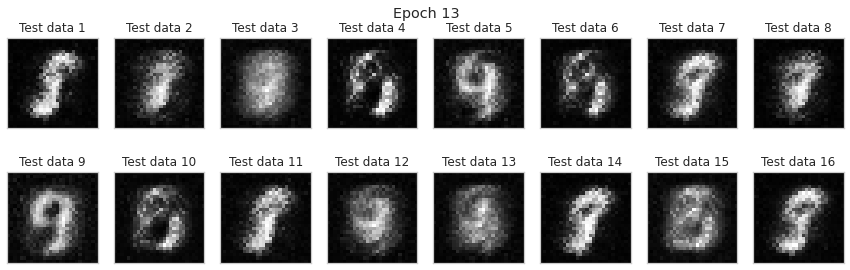

epoch: 14


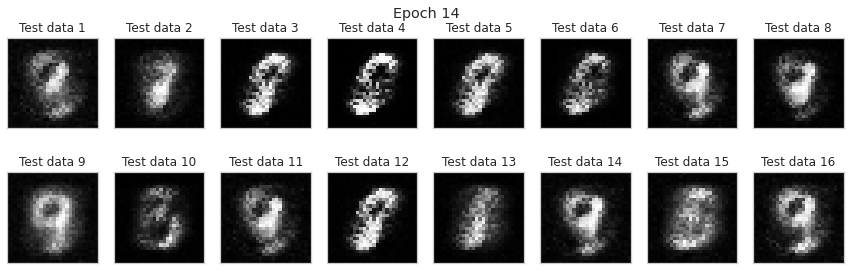

epoch: 15


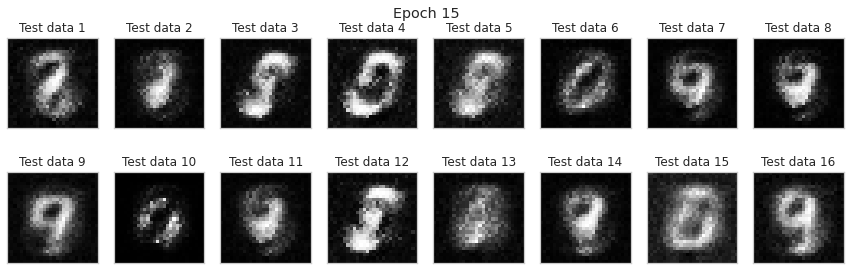

epoch: 16


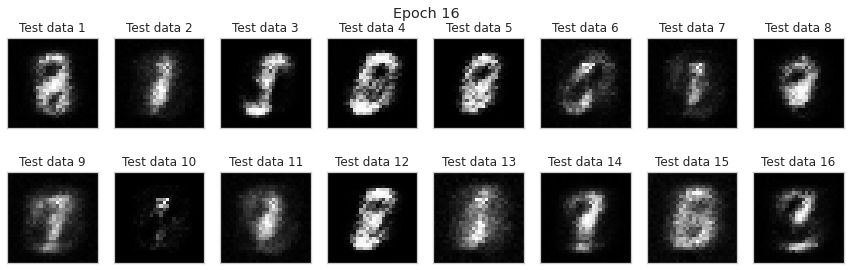

epoch: 17


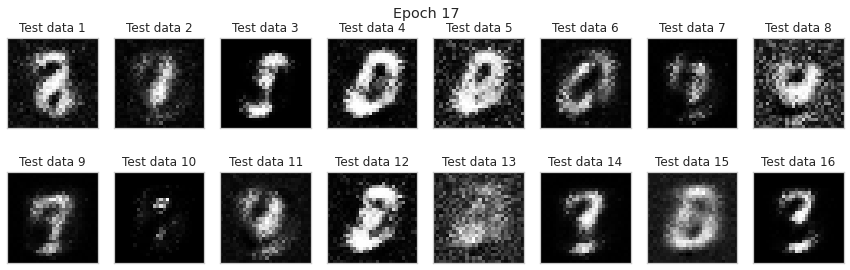

epoch: 18


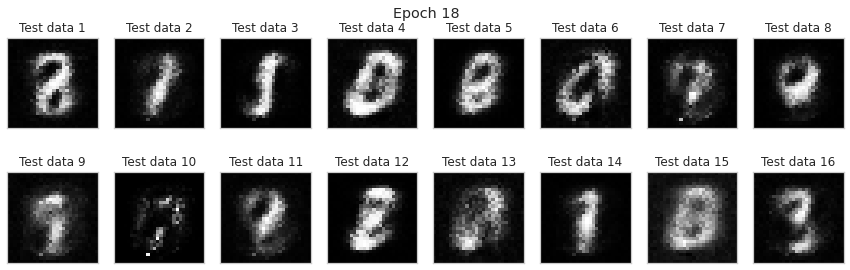

epoch: 19


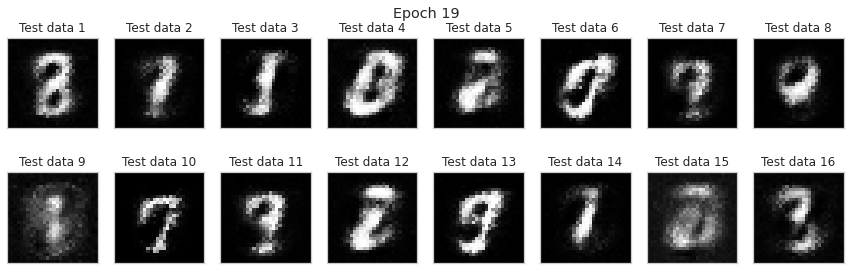

epoch: 20


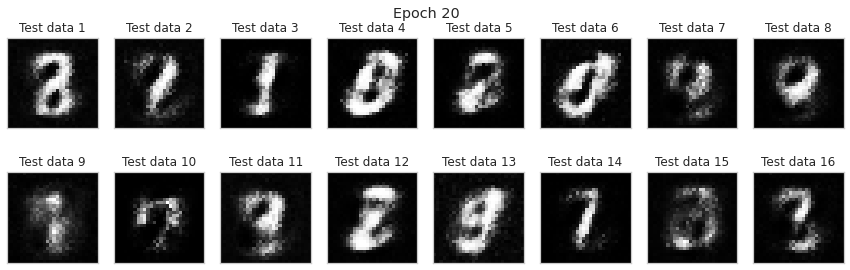

epoch: 21


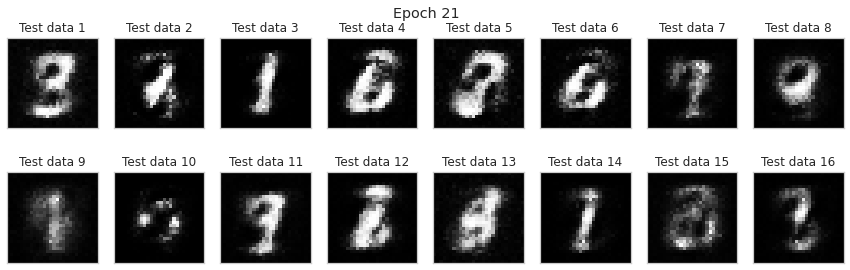

epoch: 22


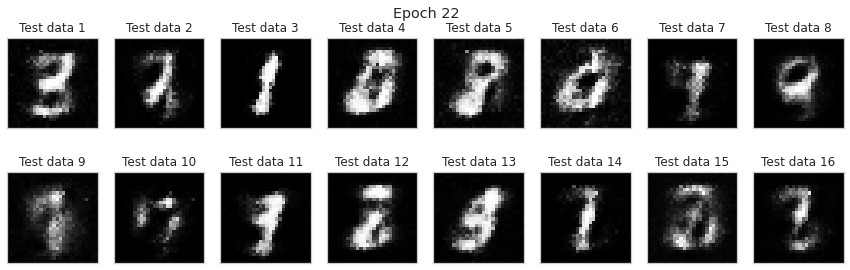

epoch: 23


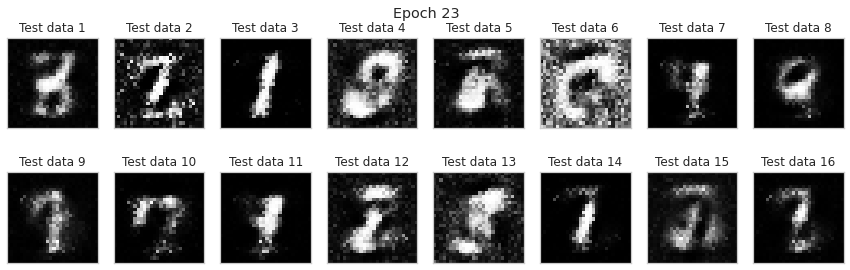

epoch: 24


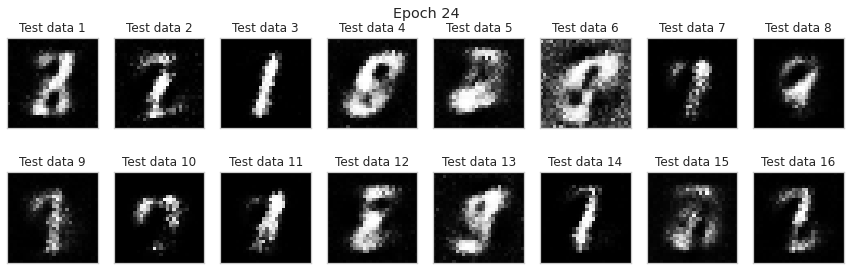

epoch: 25


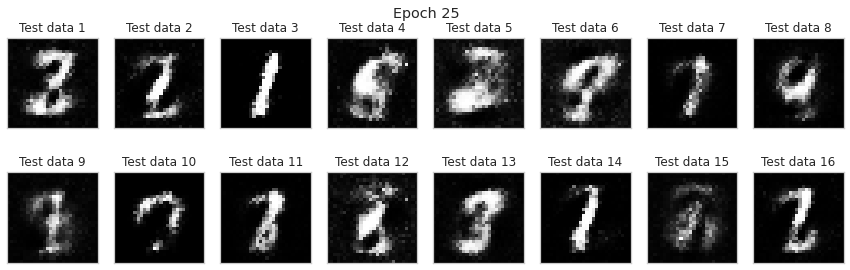

epoch: 26


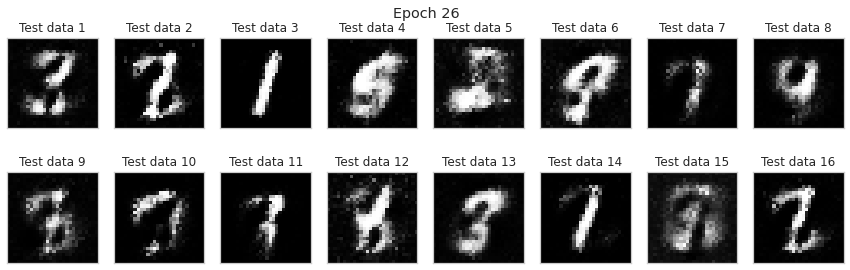

epoch: 27


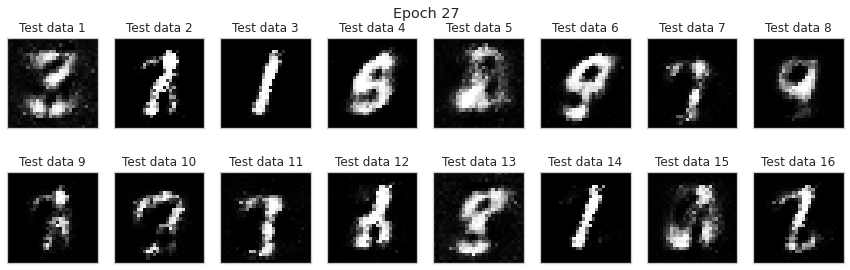

epoch: 28


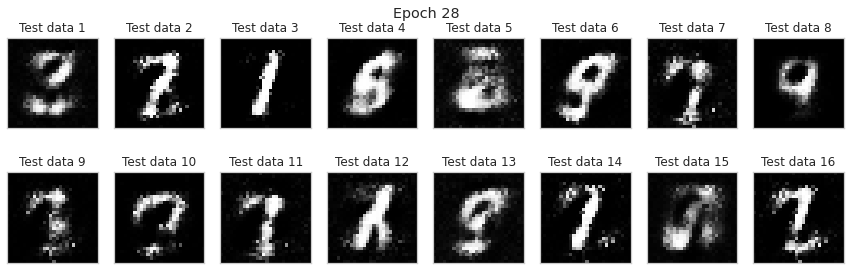

epoch: 29


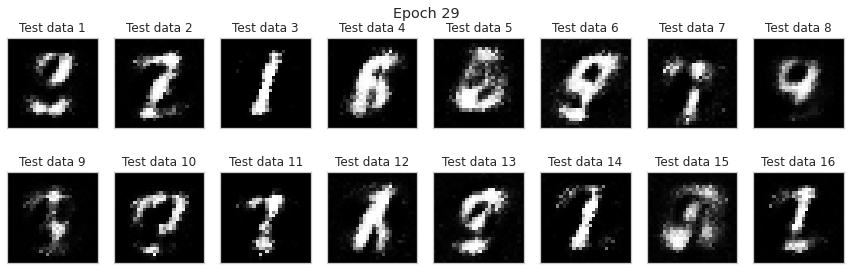

epoch: 30


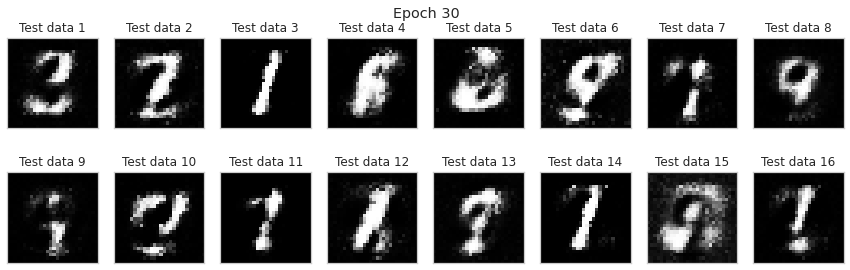

epoch: 31


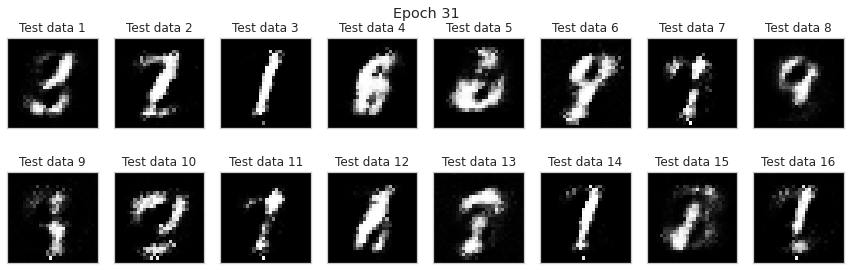

epoch: 32


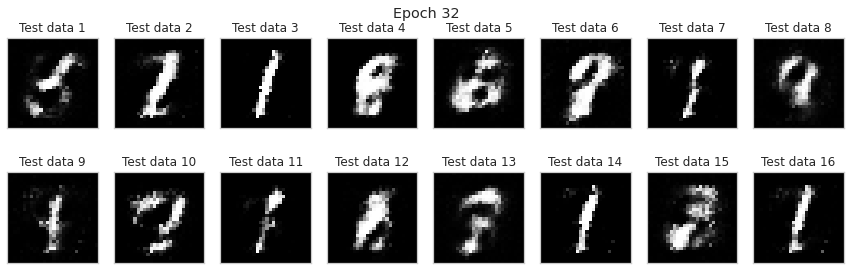

epoch: 33


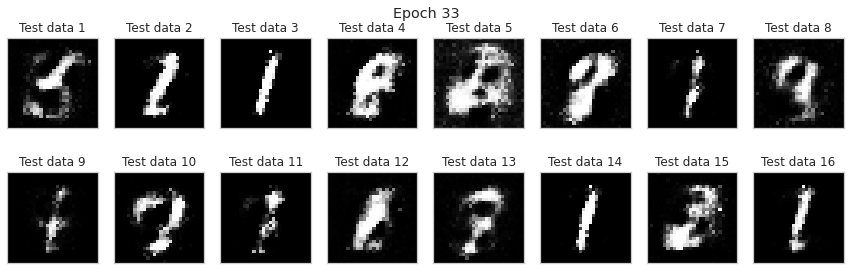

epoch: 34


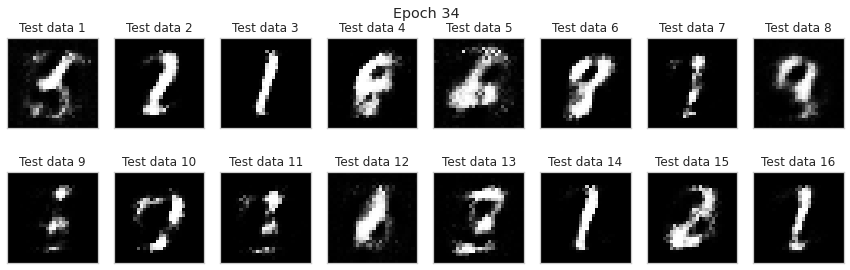

epoch: 35


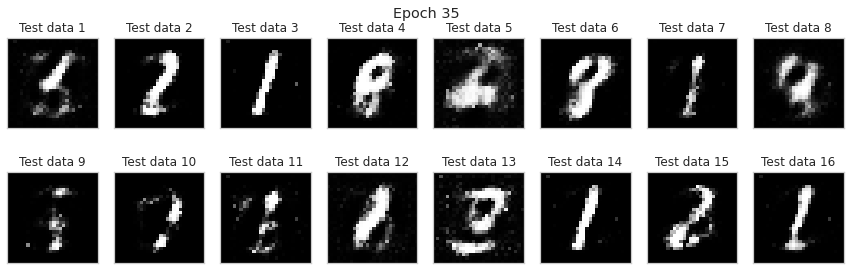

epoch: 36


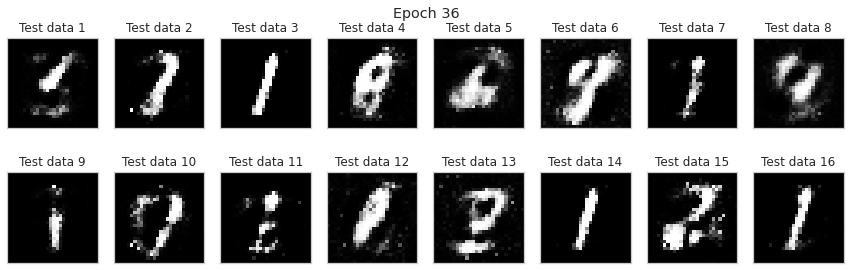

epoch: 37


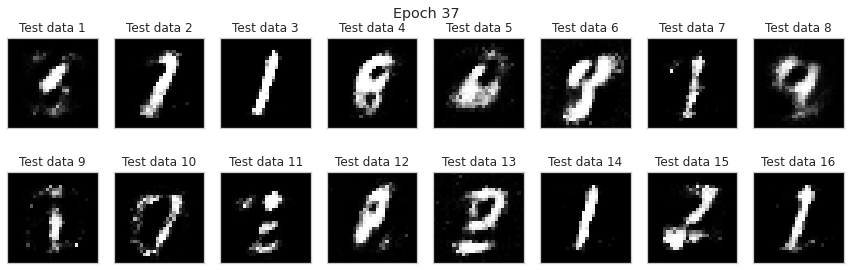

epoch: 38


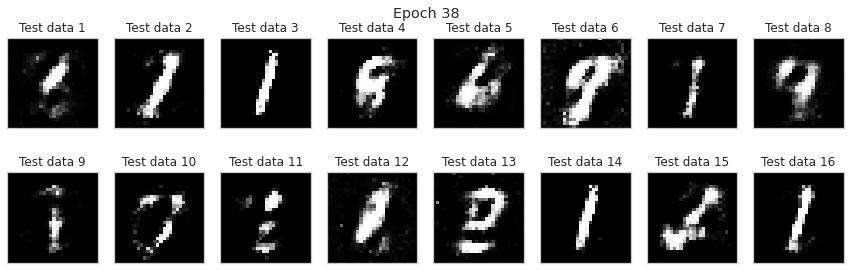

epoch: 39


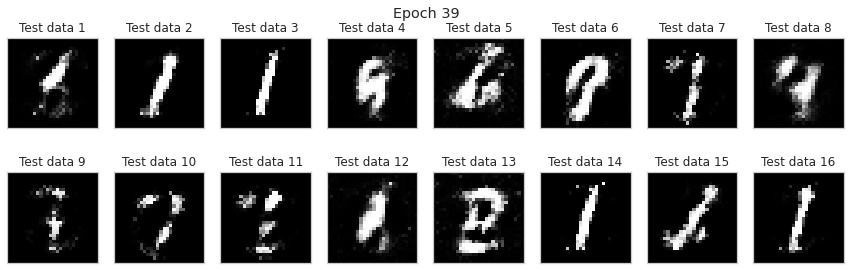

epoch: 40


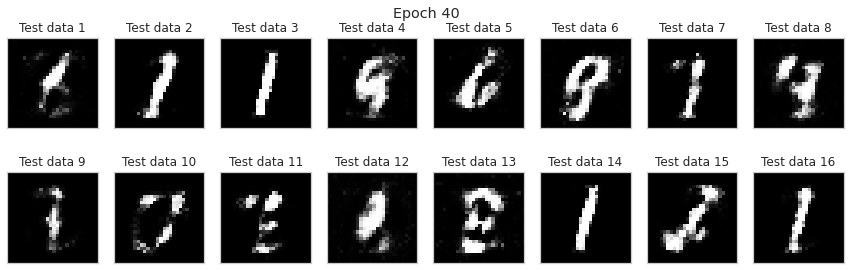

epoch: 41


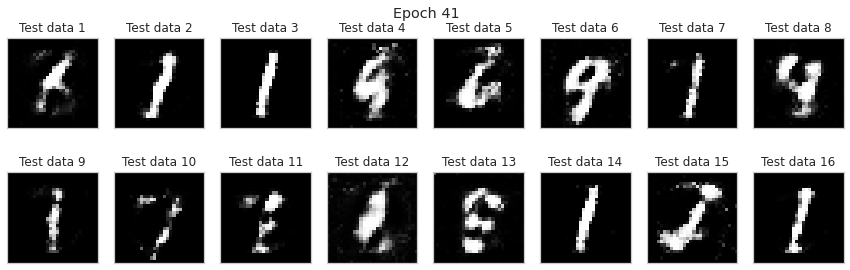

epoch: 42


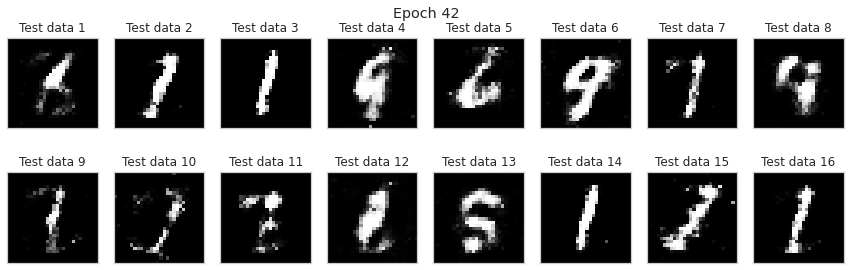

epoch: 43


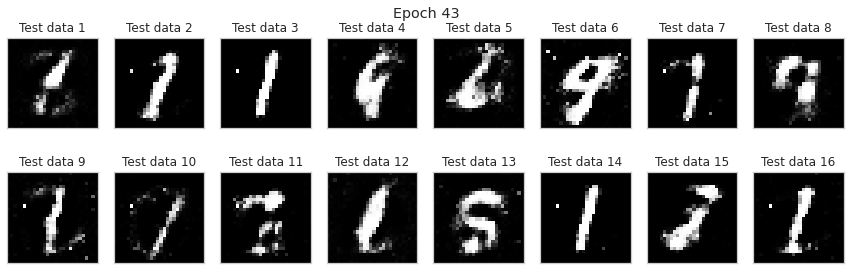

epoch: 44


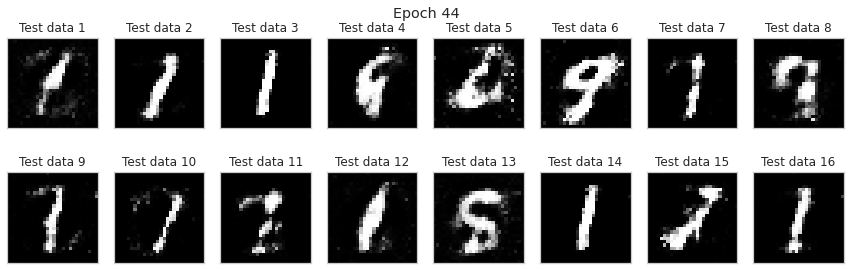

epoch: 45


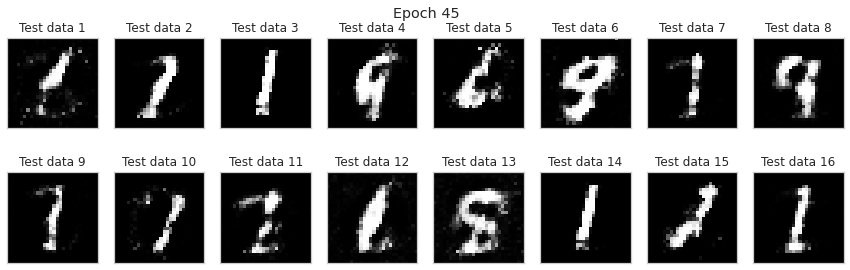

epoch: 46


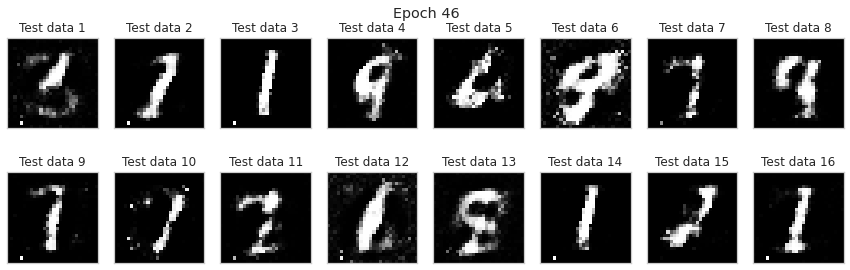

epoch: 47


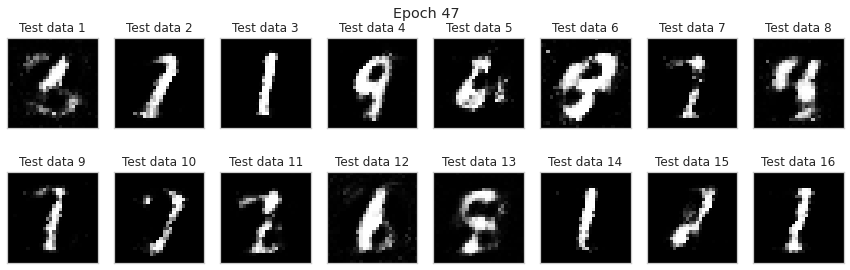

epoch: 48


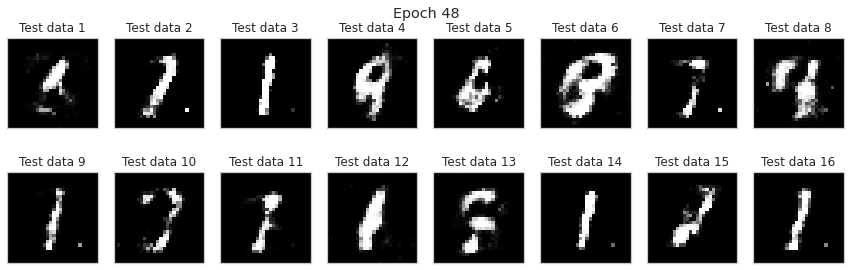

epoch: 49


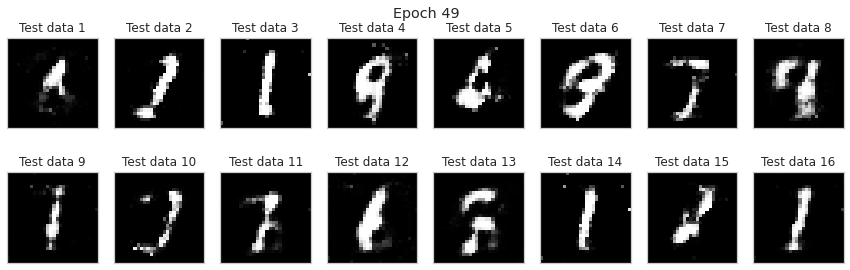

epoch: 50


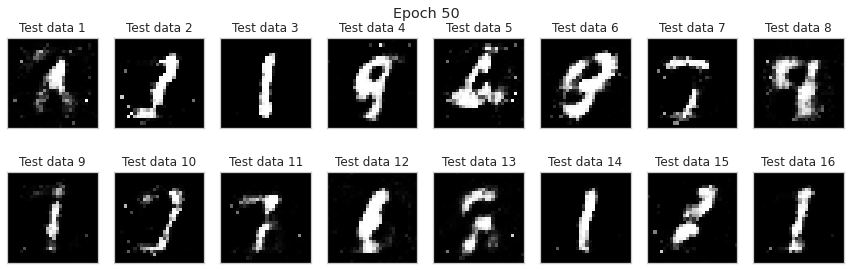

epoch: 51


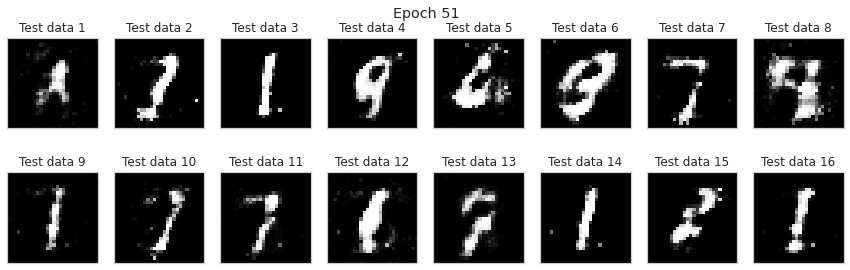

epoch: 52


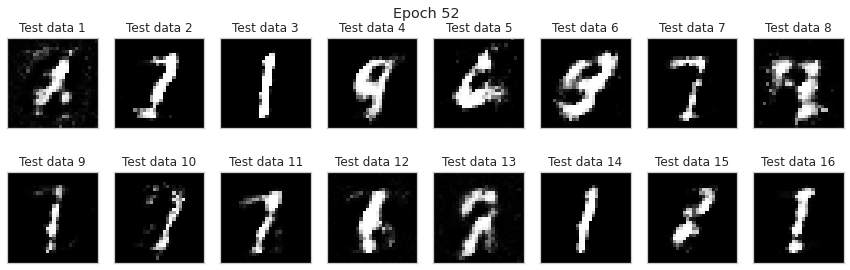

epoch: 53


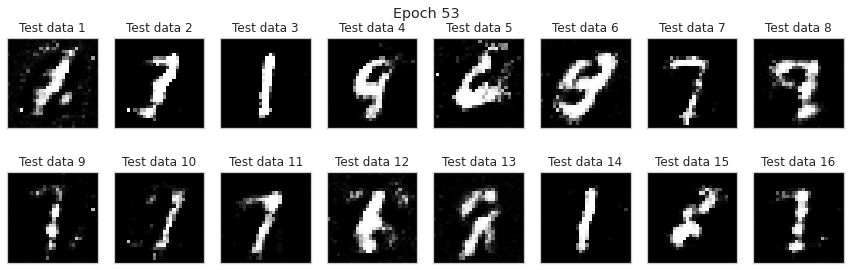

epoch: 54


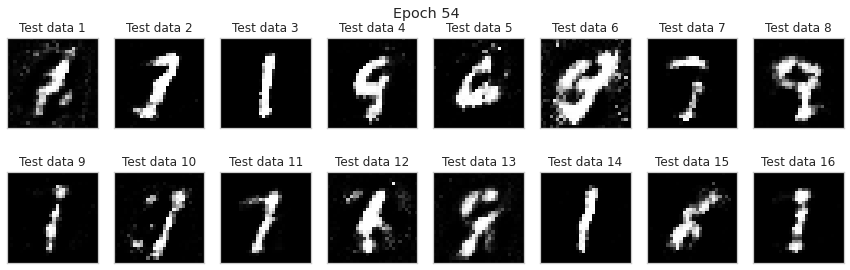

epoch: 55


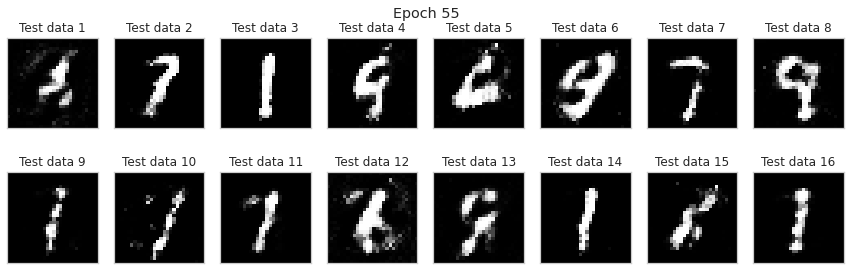

epoch: 56


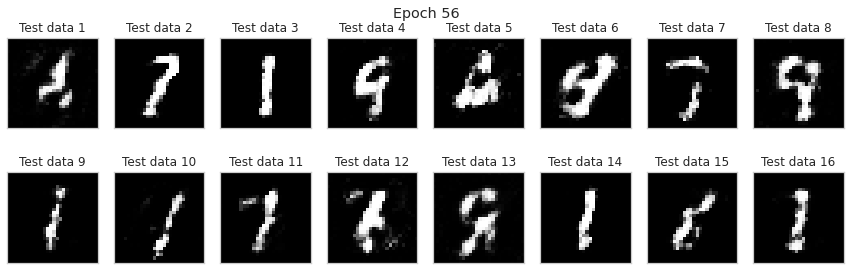

epoch: 57


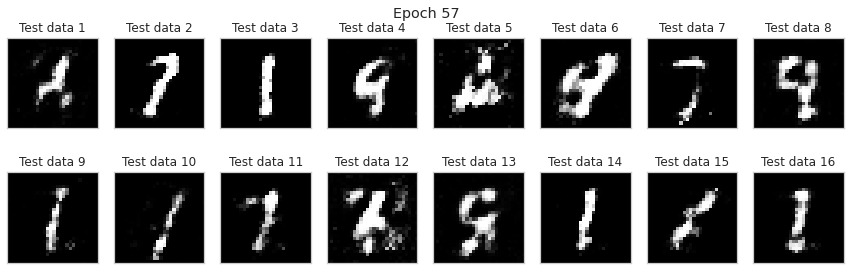

epoch: 58


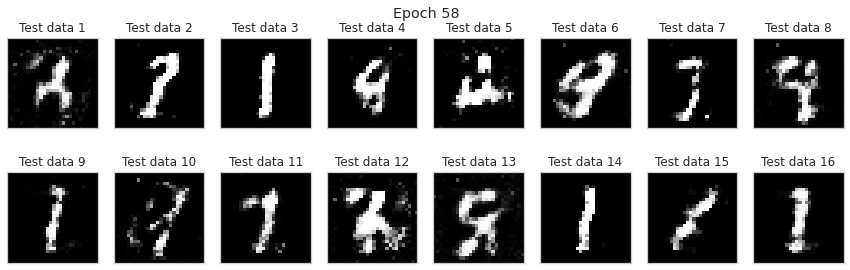

epoch: 59


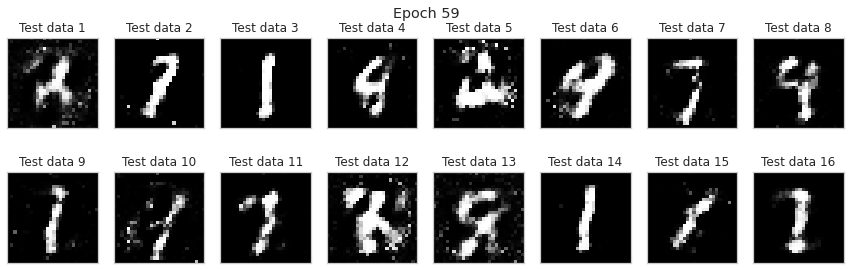

epoch: 60


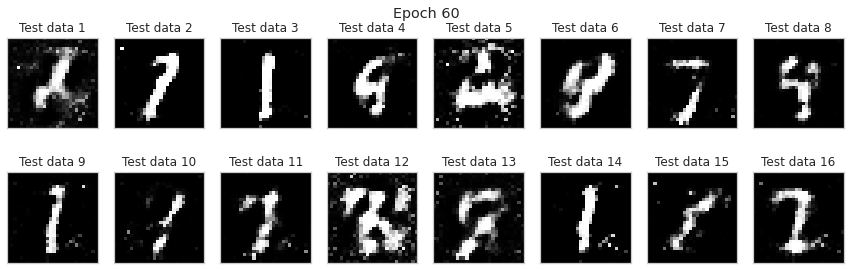

epoch: 61


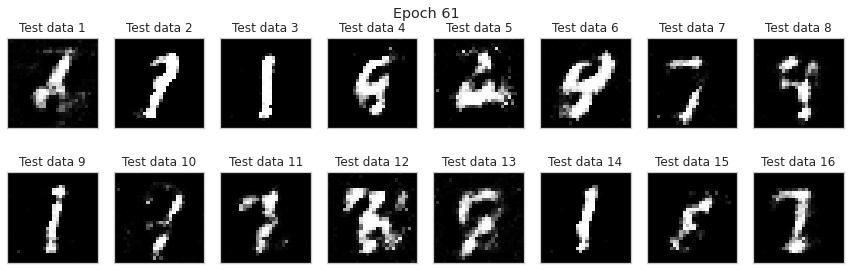

epoch: 62


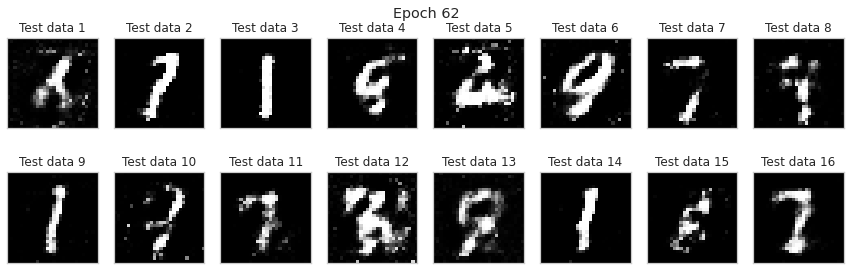

epoch: 63


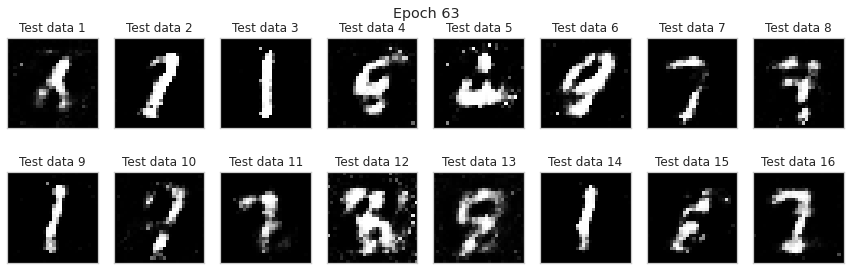

epoch: 64


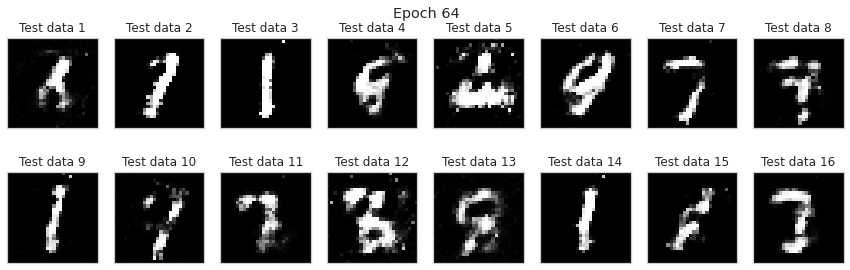

epoch: 65


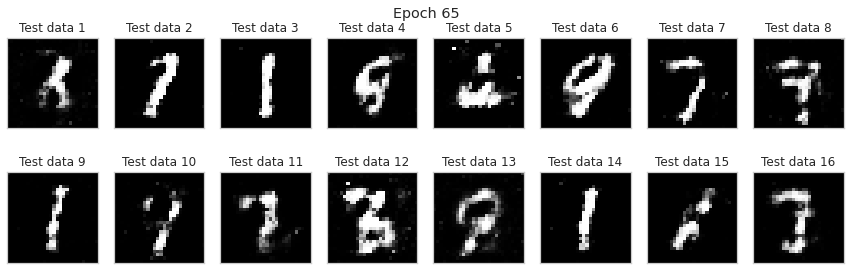

epoch: 66


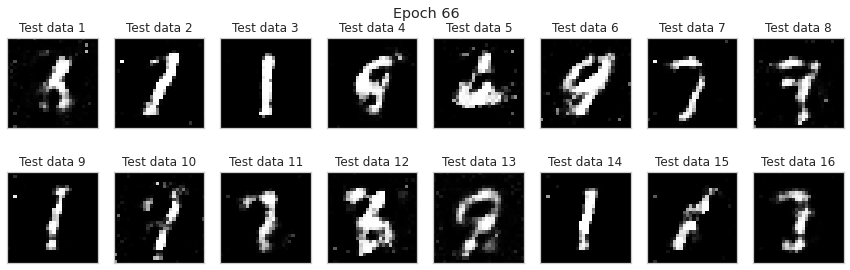

epoch: 67


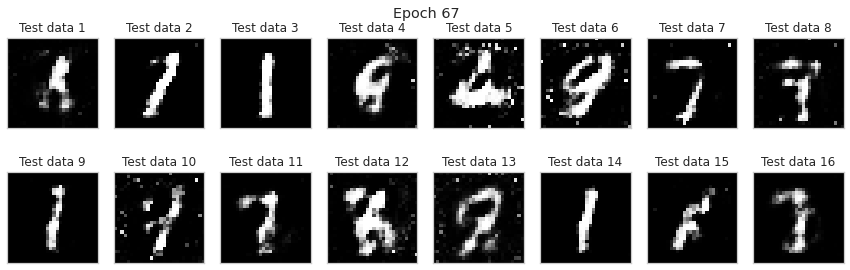

epoch: 68


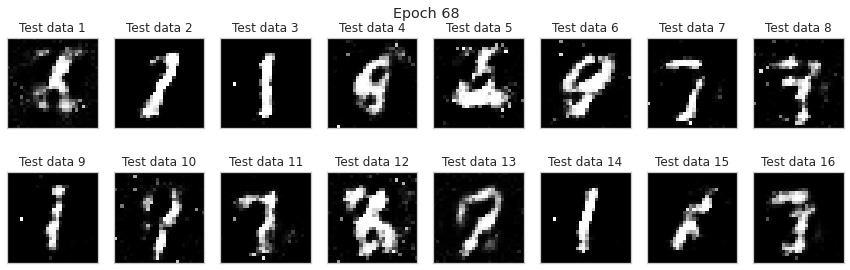

epoch: 69


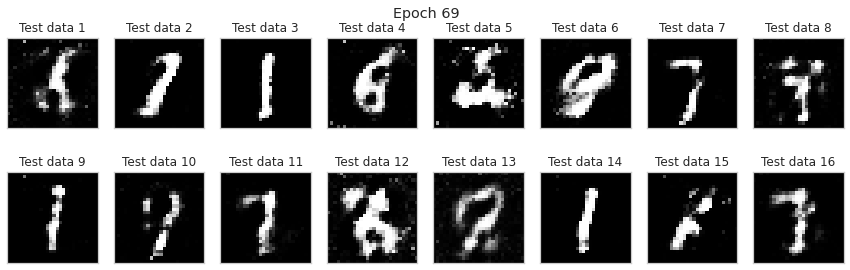

epoch: 70


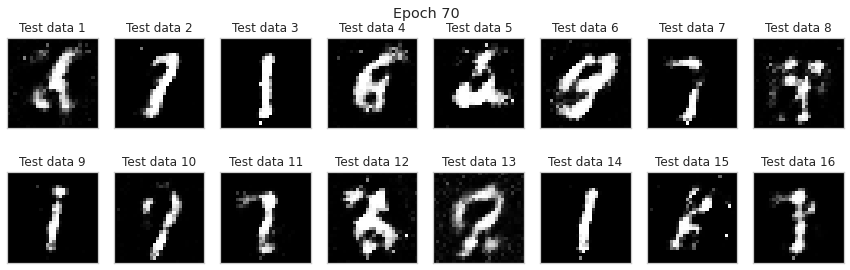

epoch: 71


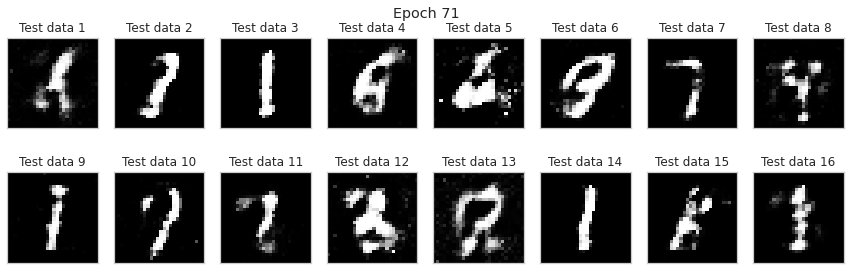

epoch: 72


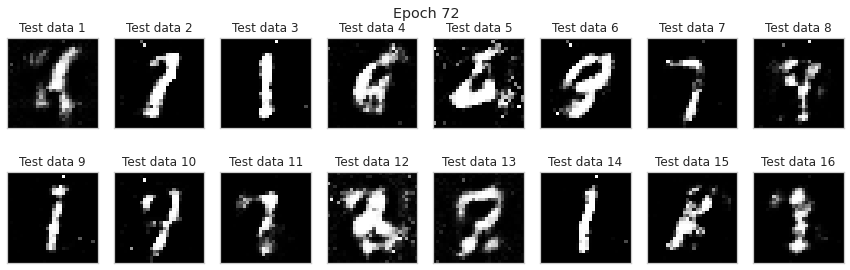

epoch: 73


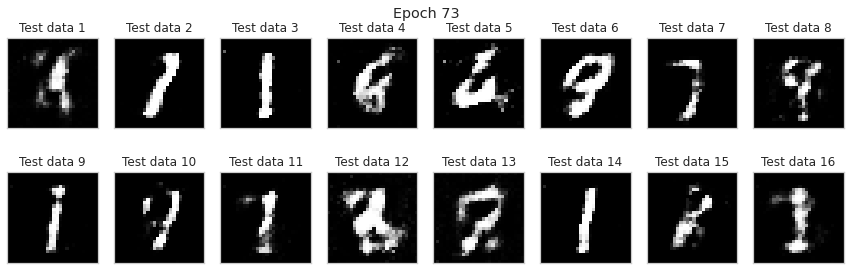

epoch: 74


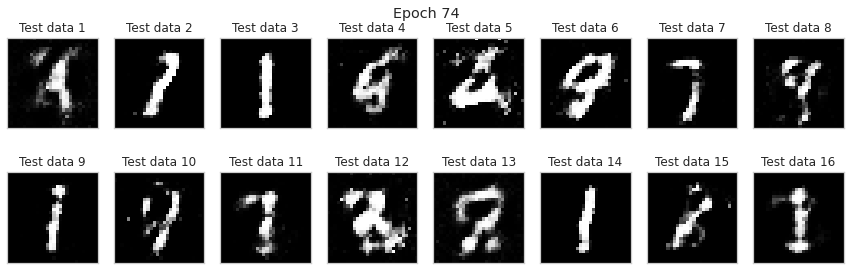

epoch: 75


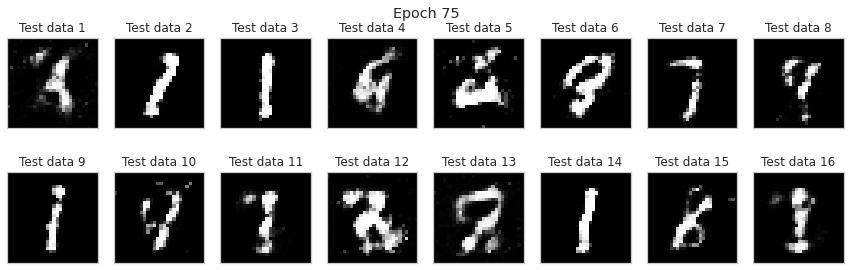

epoch: 76


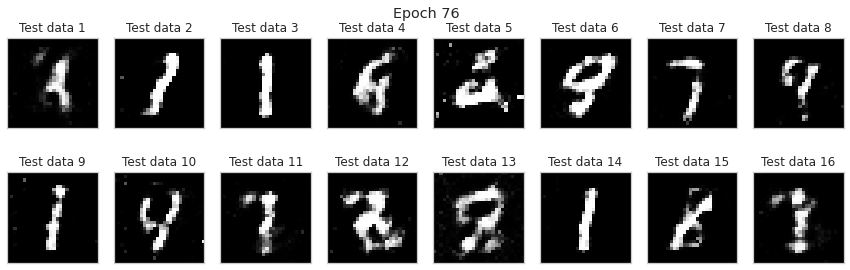

epoch: 77


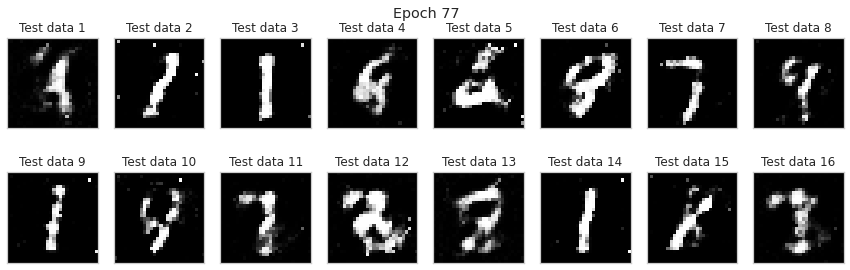

epoch: 78


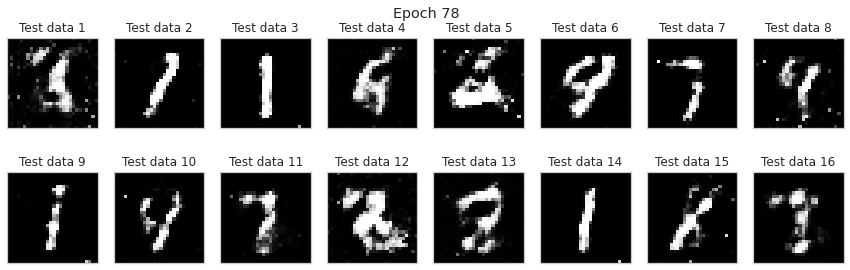

epoch: 79


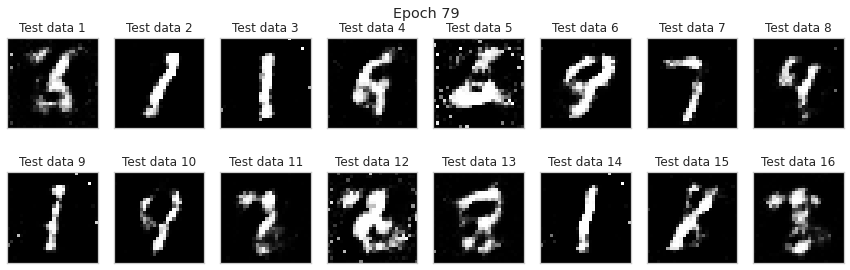

epoch: 80


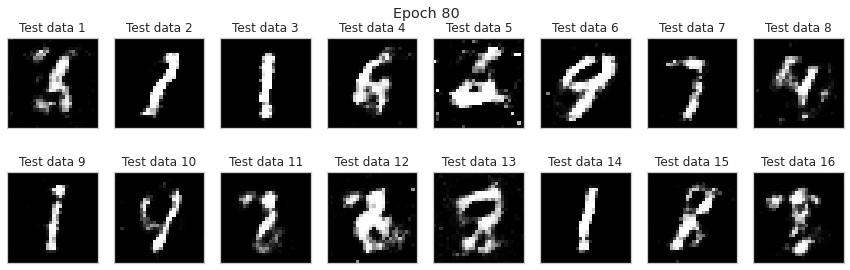

epoch: 81


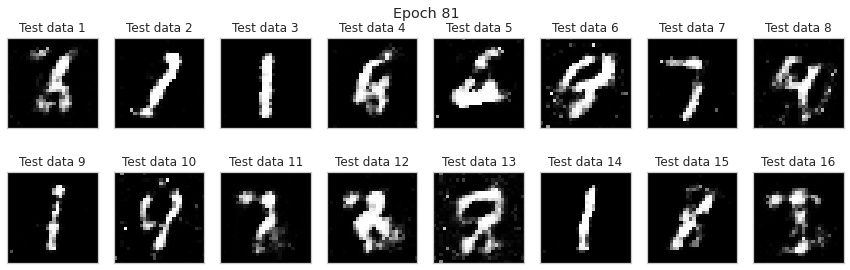

epoch: 82


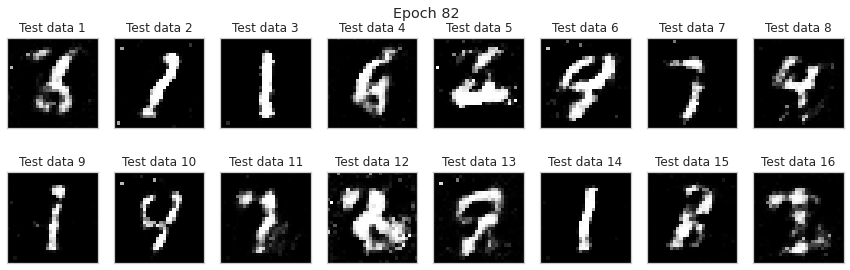

epoch: 83


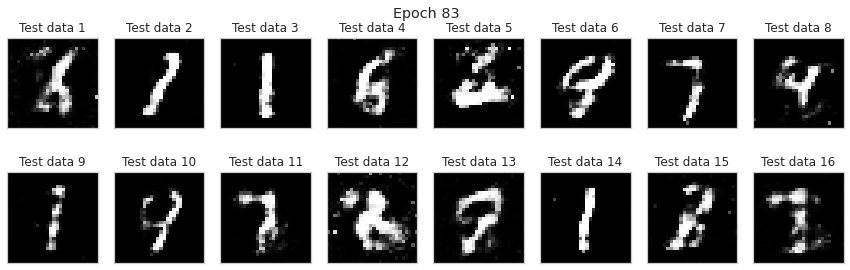

epoch: 84


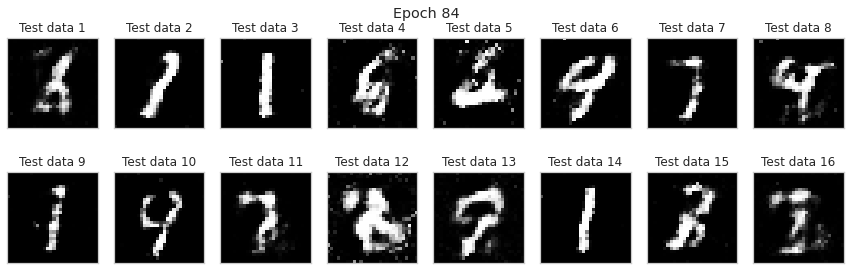

epoch: 85


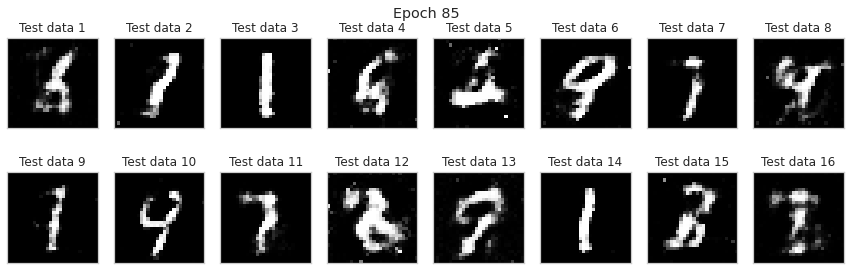

epoch: 86


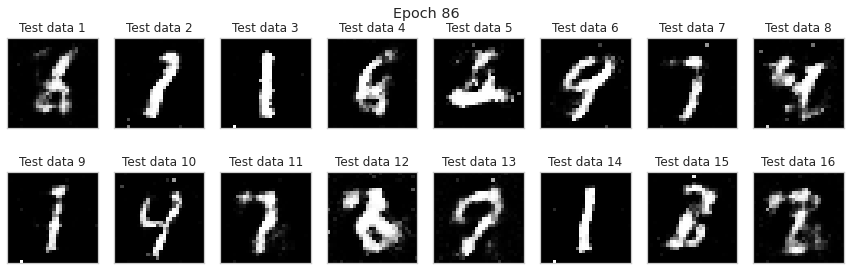

epoch: 87


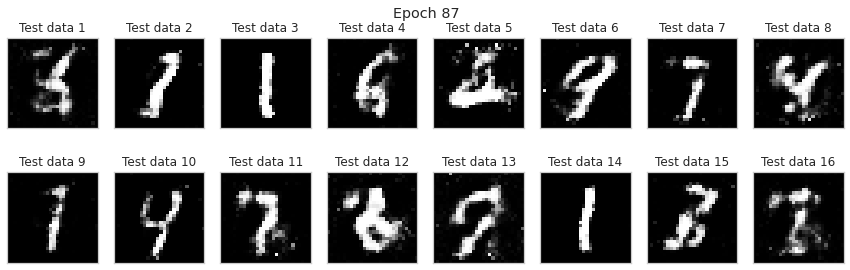

epoch: 88


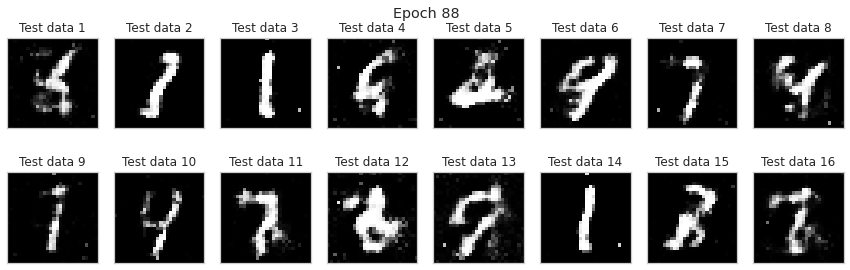

epoch: 89


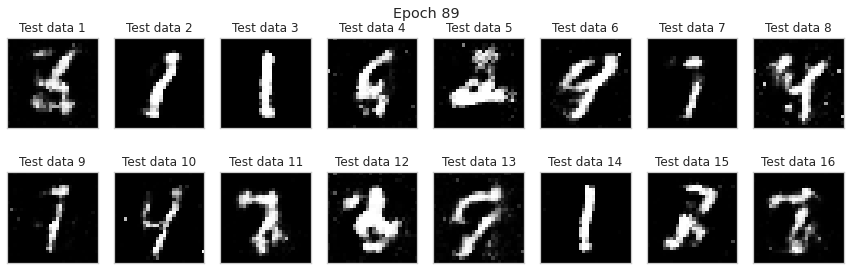

epoch: 90


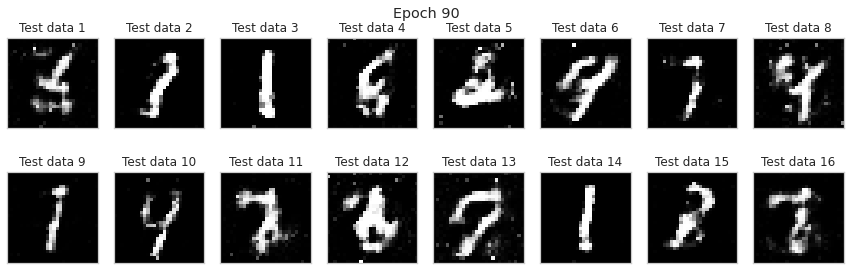

epoch: 91


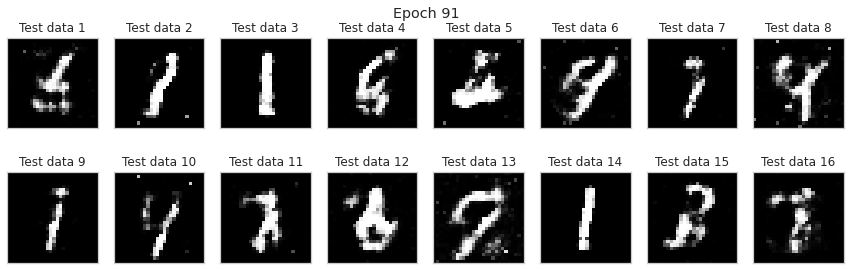

epoch: 92


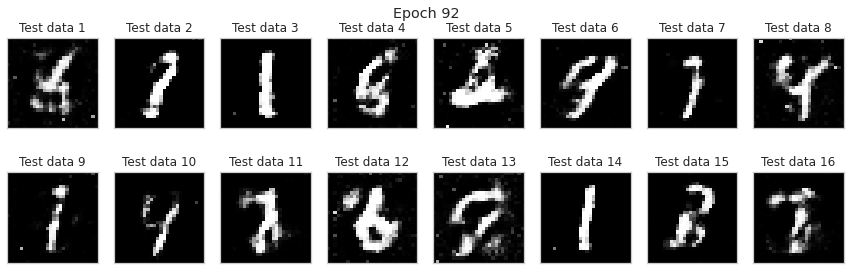

epoch: 93


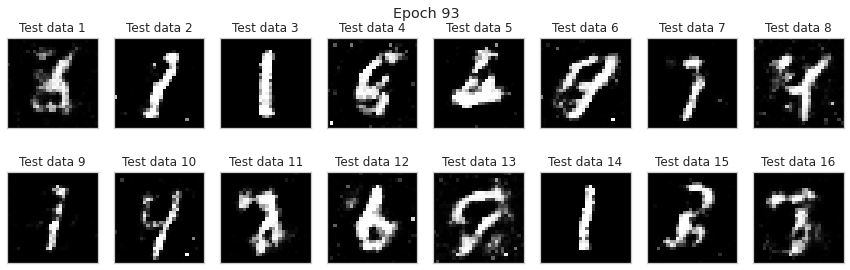

epoch: 94


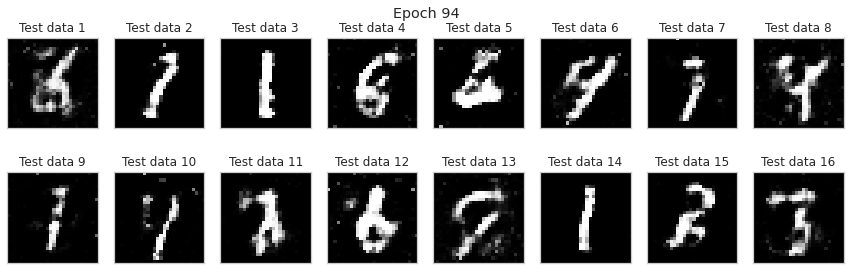

epoch: 95


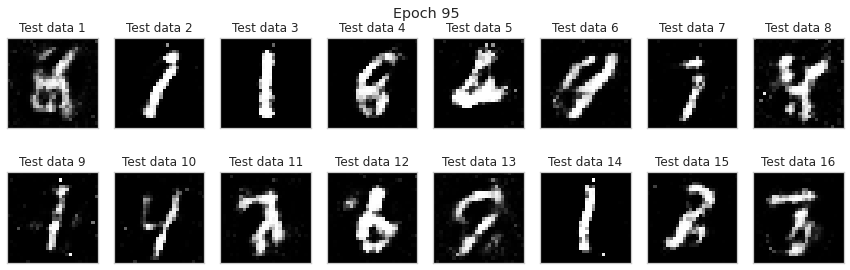

epoch: 96


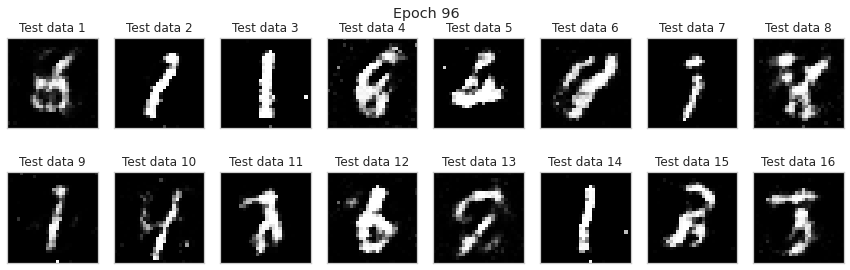

epoch: 97


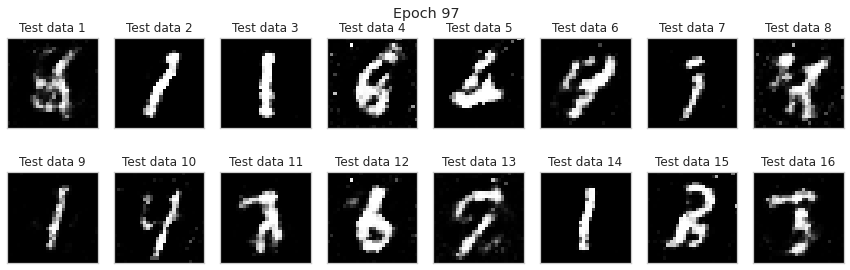

epoch: 98


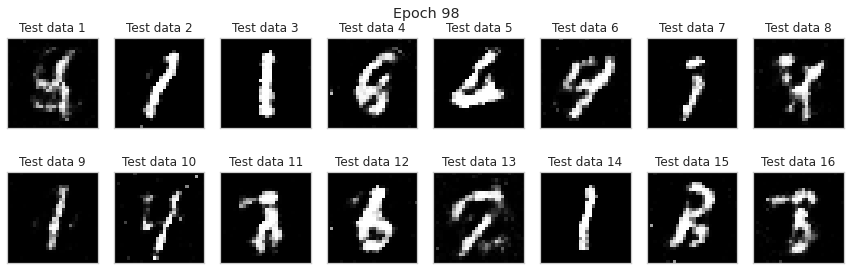

epoch: 99


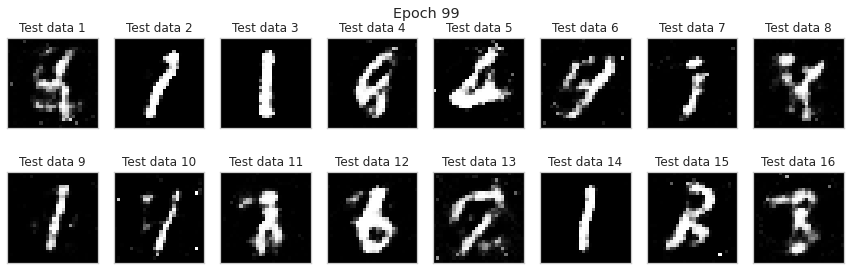

epoch: 100


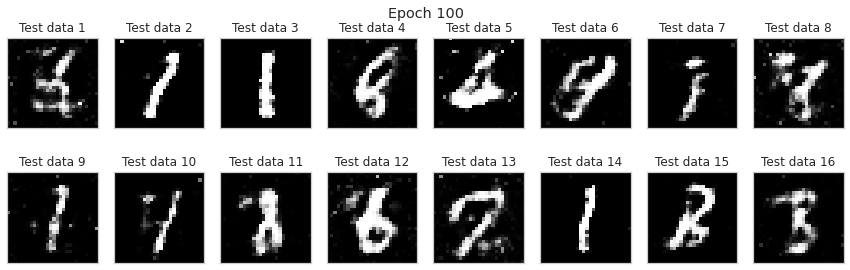

epoch: 101


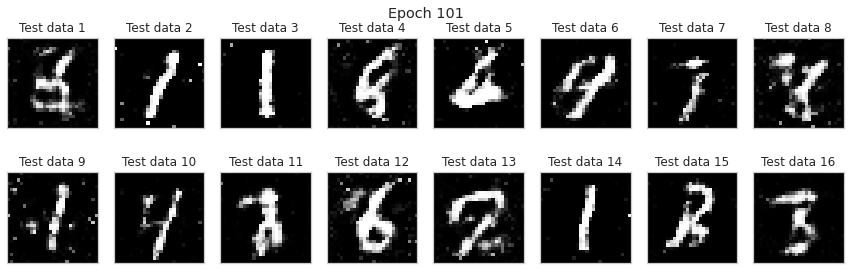

epoch: 102


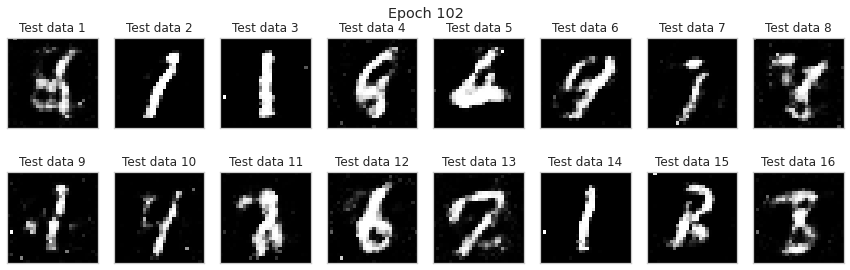

epoch: 103


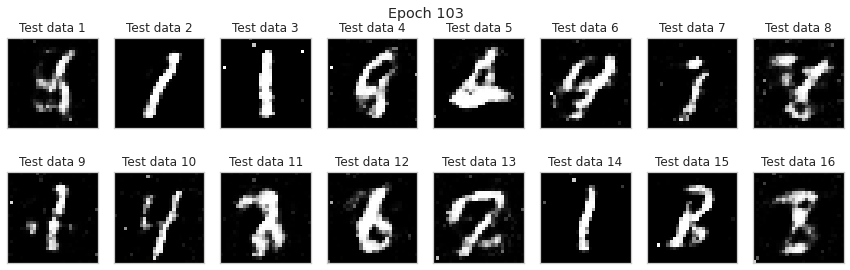

epoch: 104


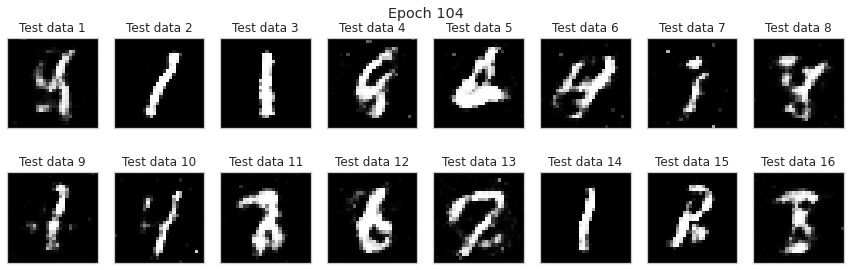

epoch: 105


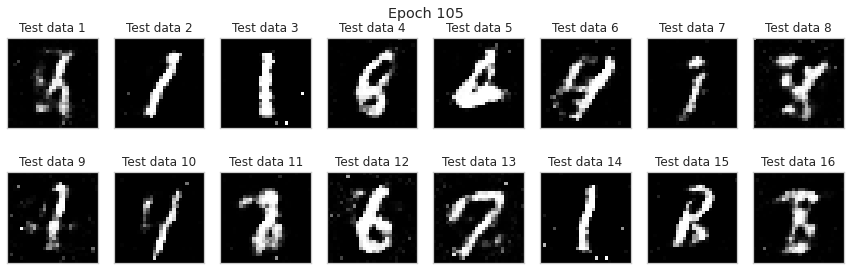

epoch: 106


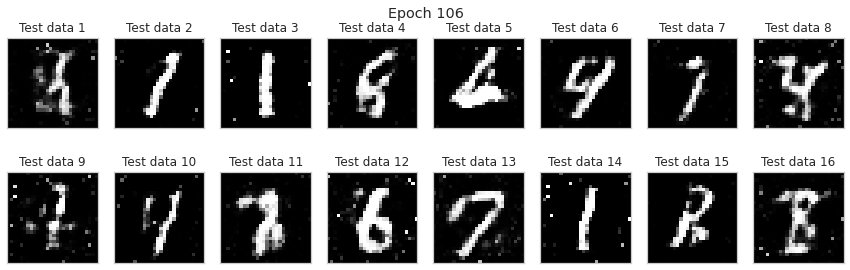

epoch: 107


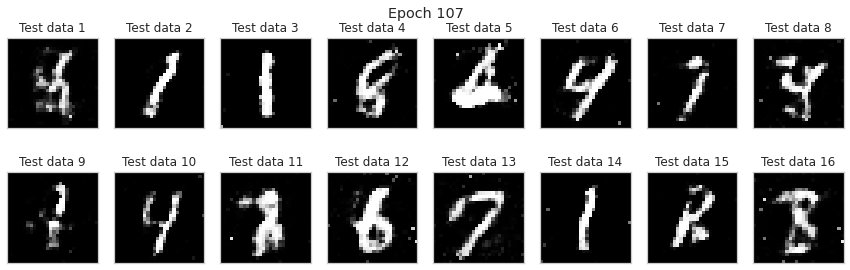

epoch: 108


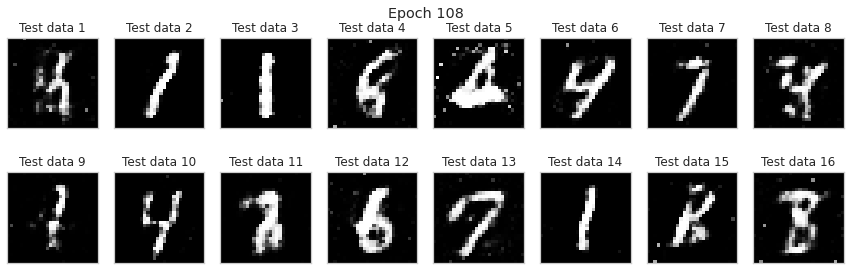

epoch: 109


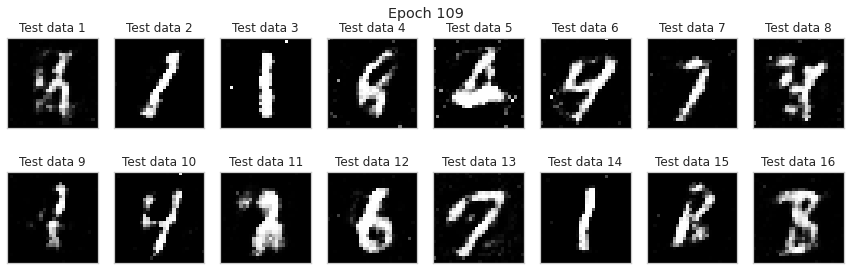

epoch: 110


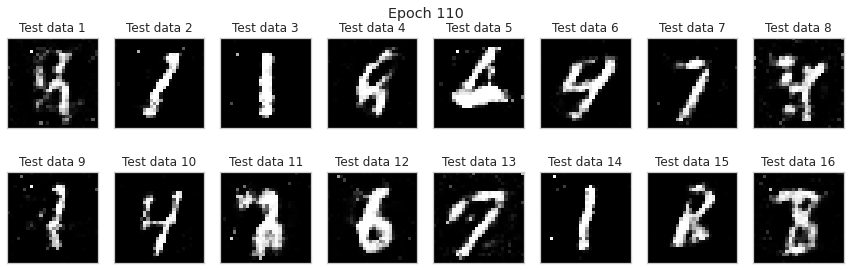

epoch: 111


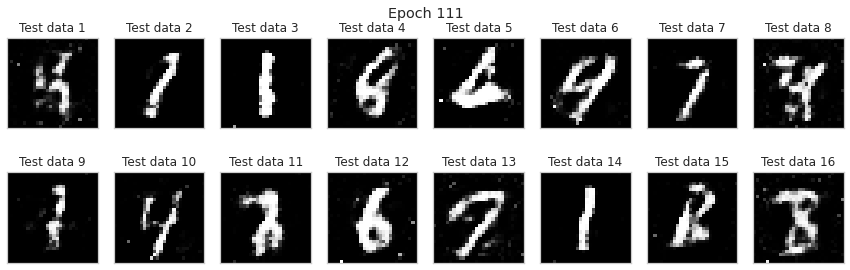

epoch: 112


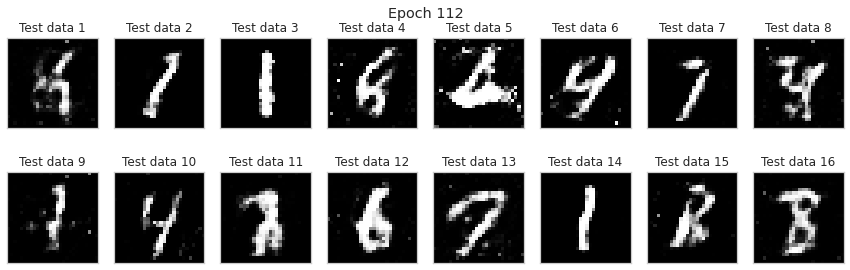

epoch: 113


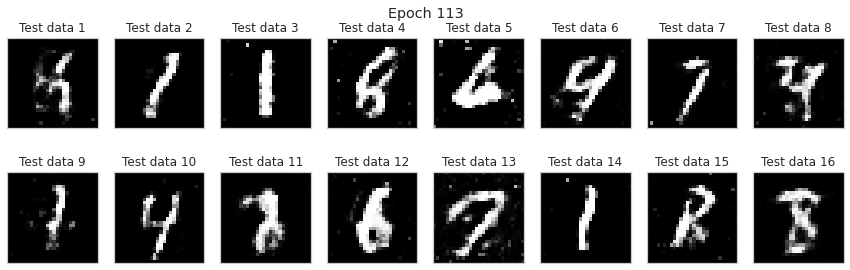

epoch: 114


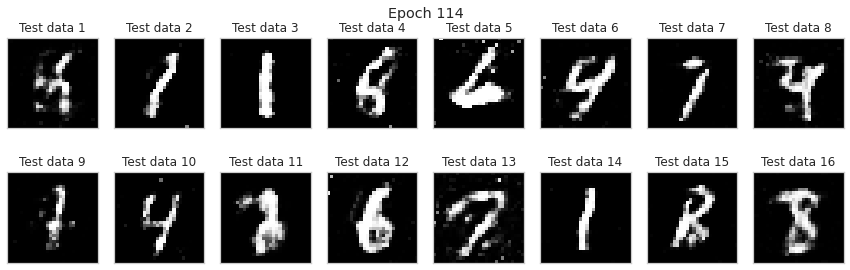

epoch: 115


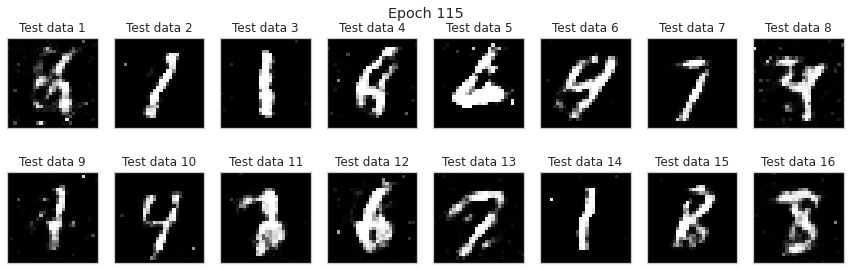

epoch: 116


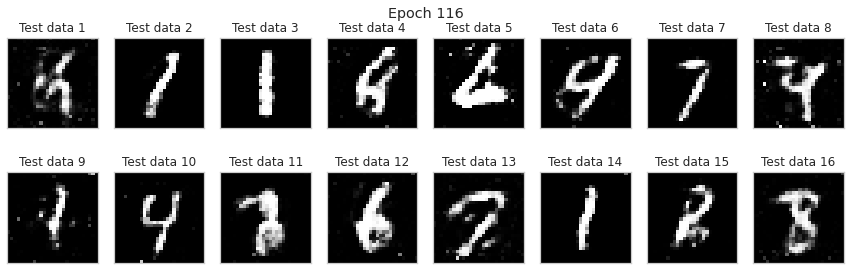

epoch: 117


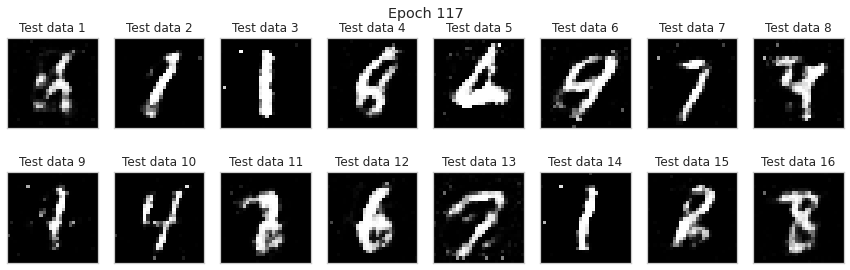

epoch: 118


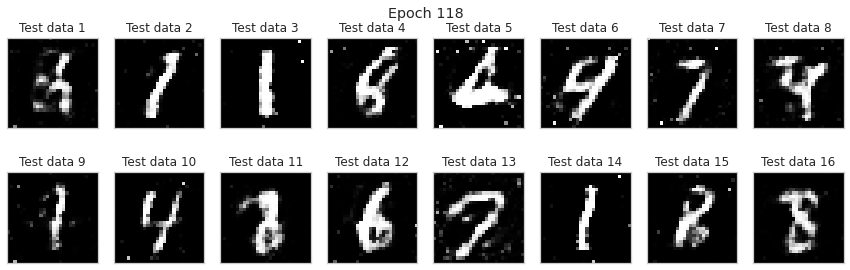

epoch: 119


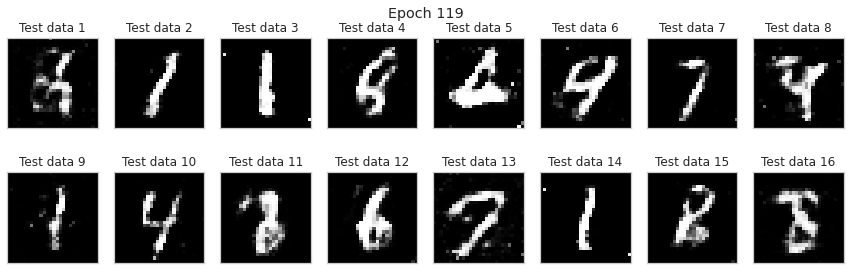

epoch: 120


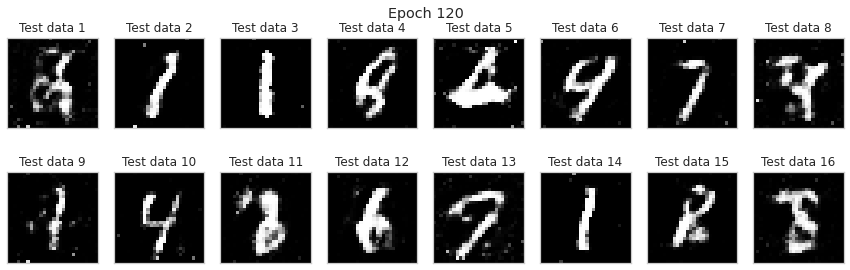

epoch: 121


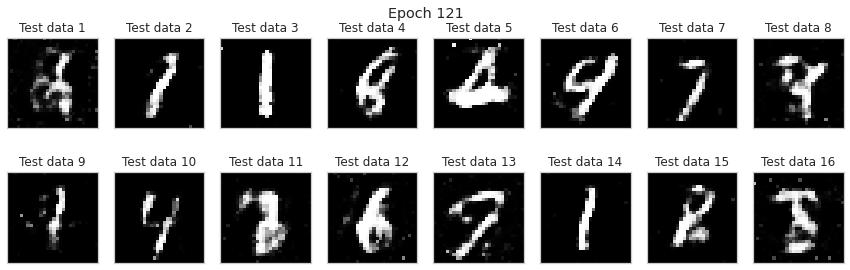

epoch: 122


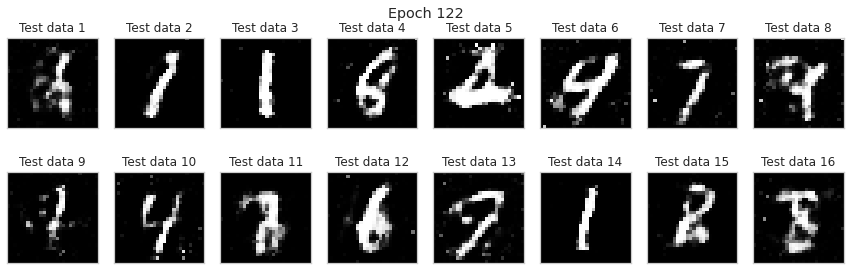

epoch: 123


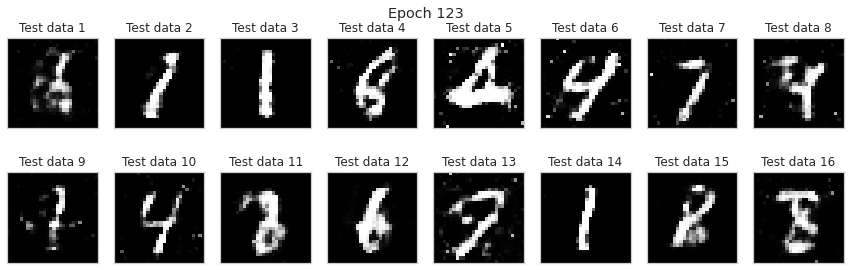

epoch: 124


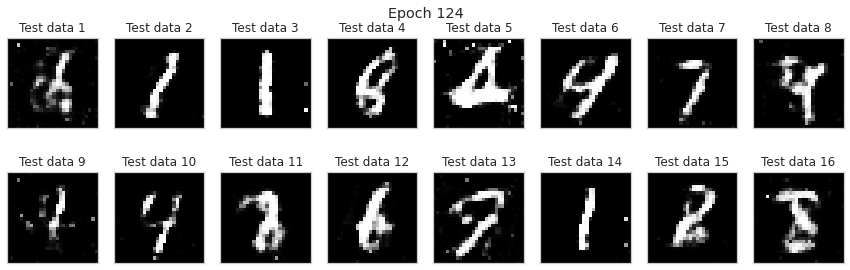

epoch: 125


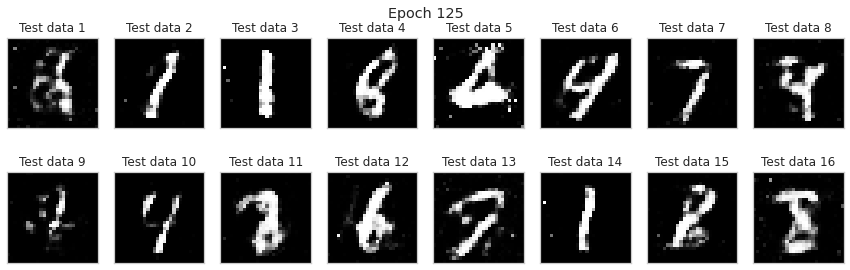

epoch: 126


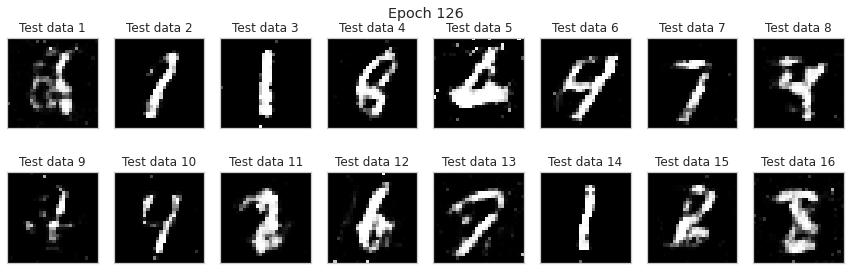

epoch: 127


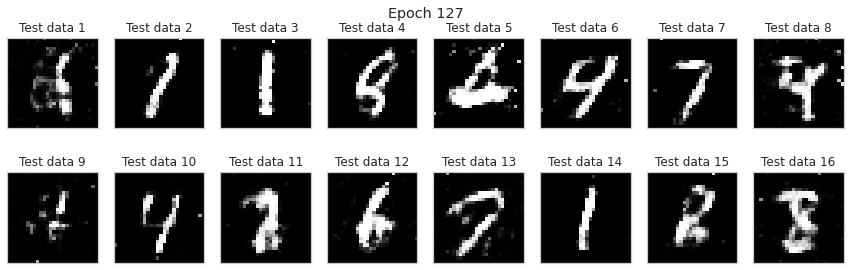

epoch: 128


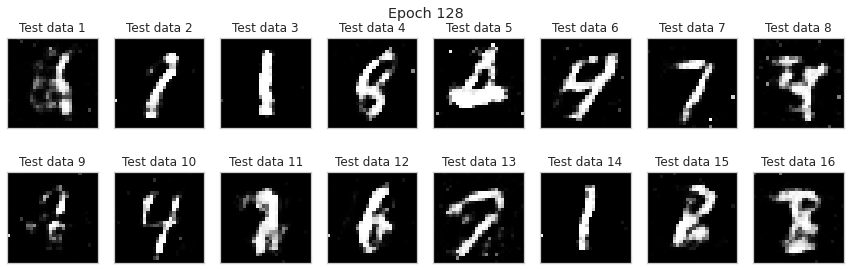

epoch: 129


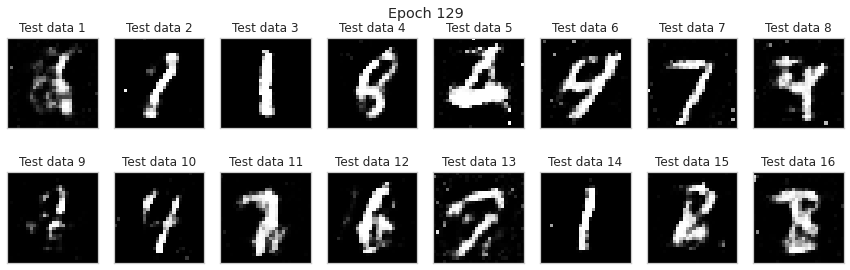

epoch: 130


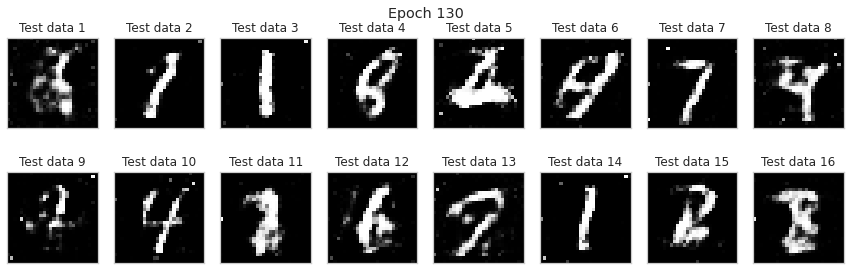

epoch: 131


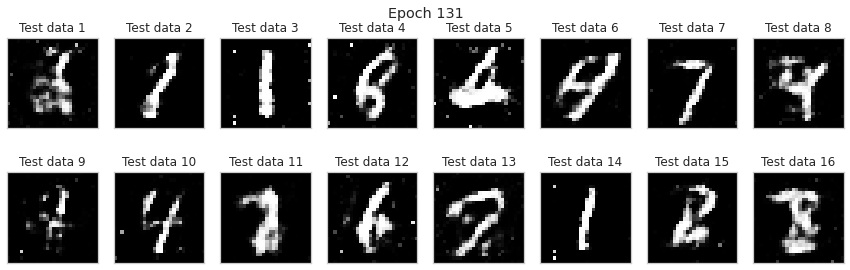

epoch: 132


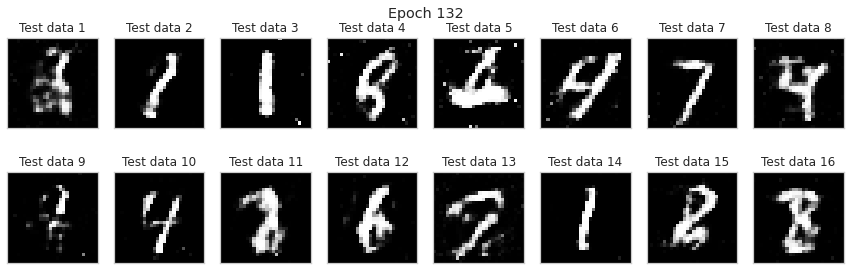

epoch: 133


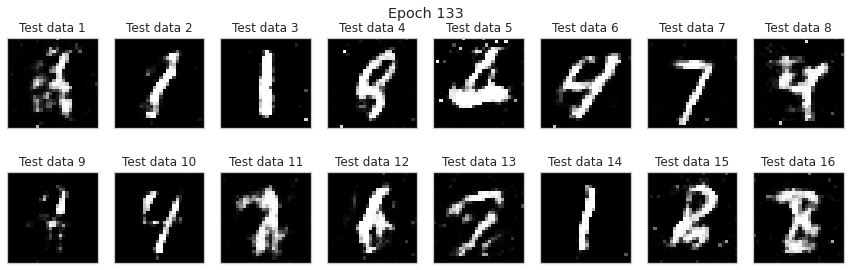

epoch: 134


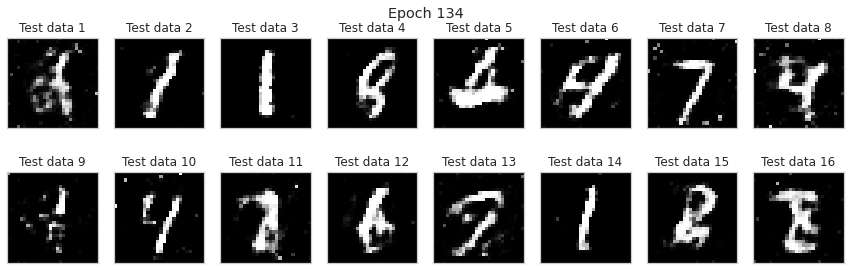

epoch: 135


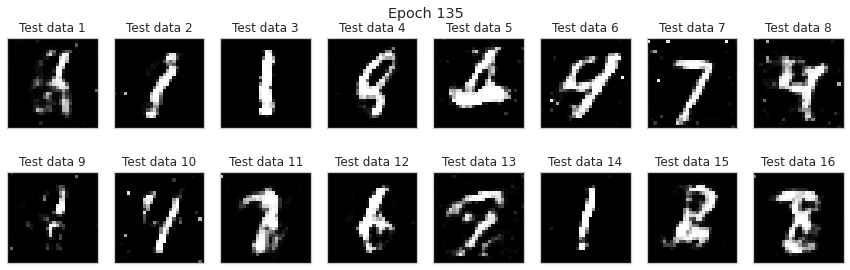

epoch: 136


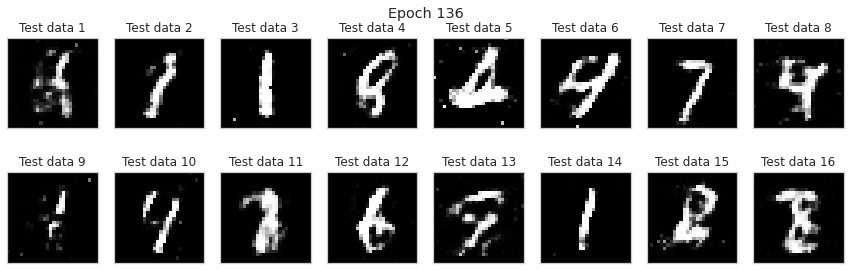

epoch: 137


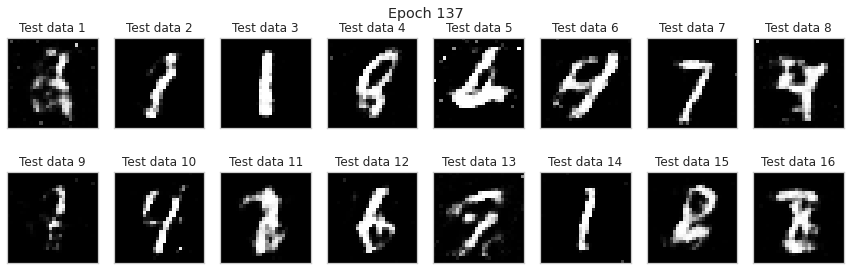

epoch: 138


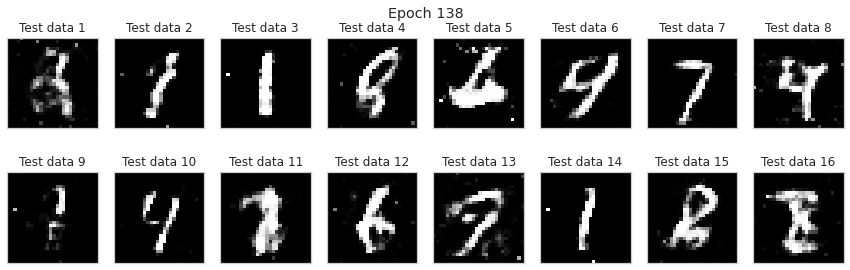

epoch: 139


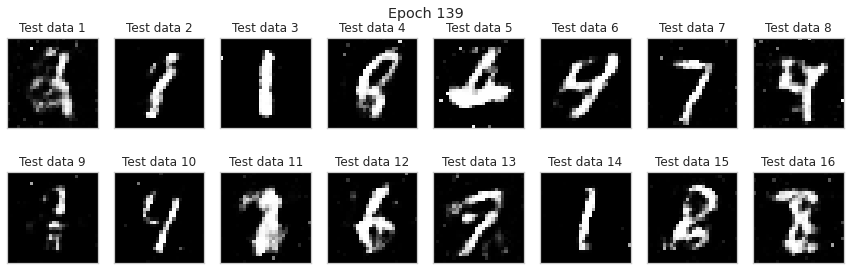

epoch: 140


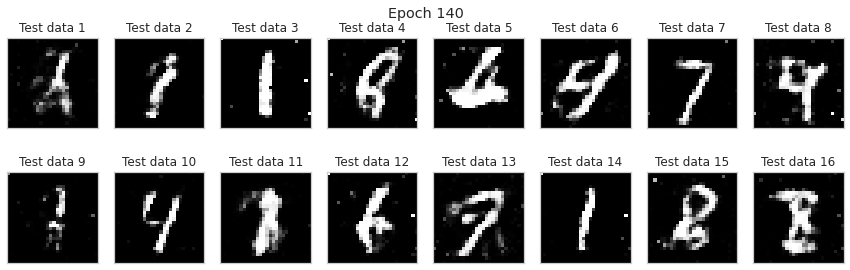

epoch: 141


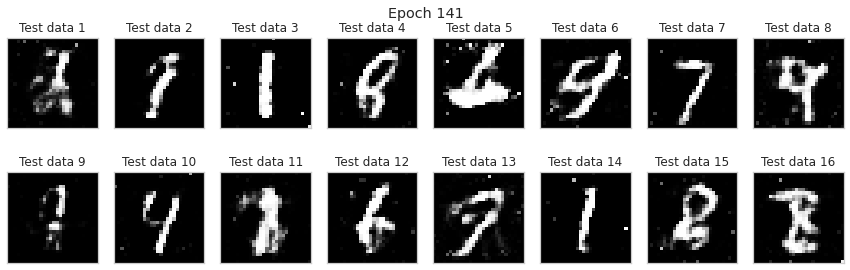

epoch: 142


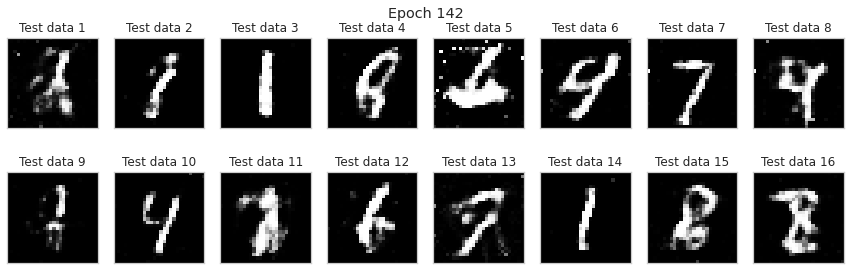

epoch: 143


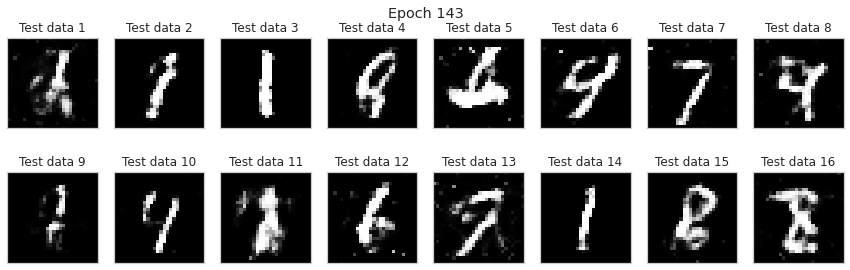

epoch: 144


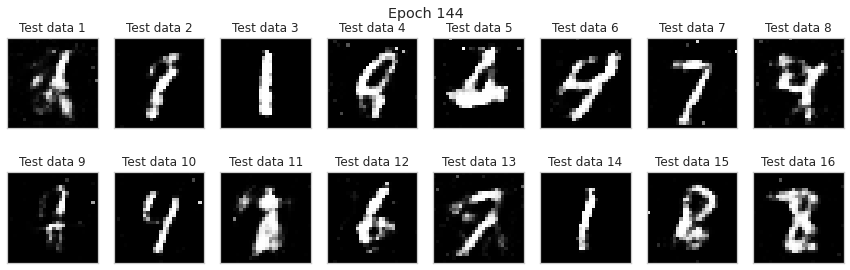

epoch: 145


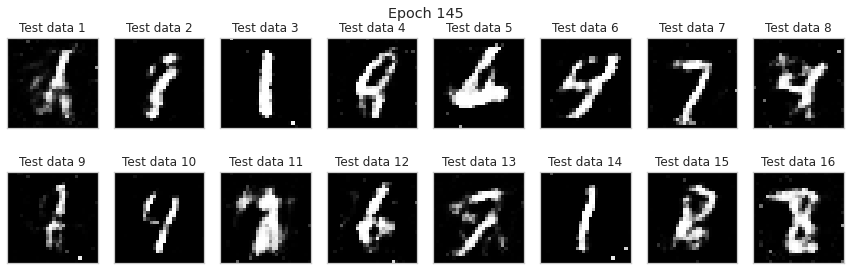

epoch: 146


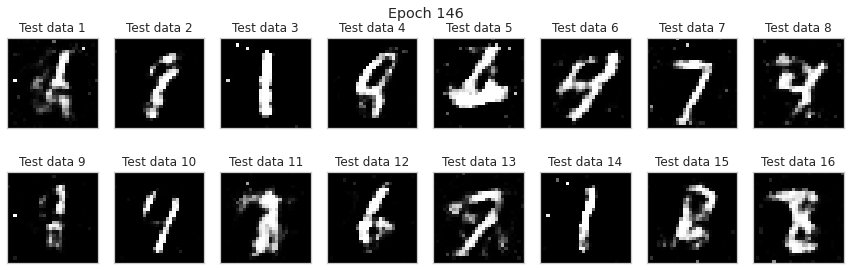

epoch: 147


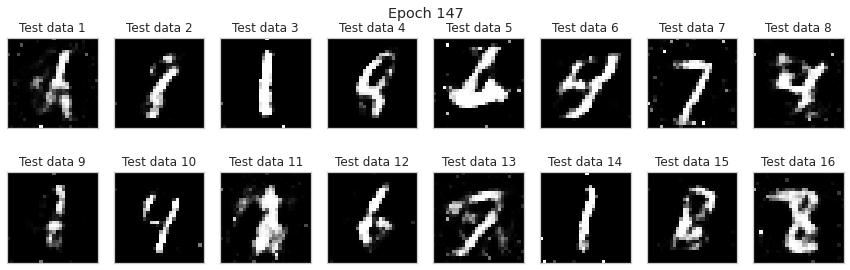

epoch: 148


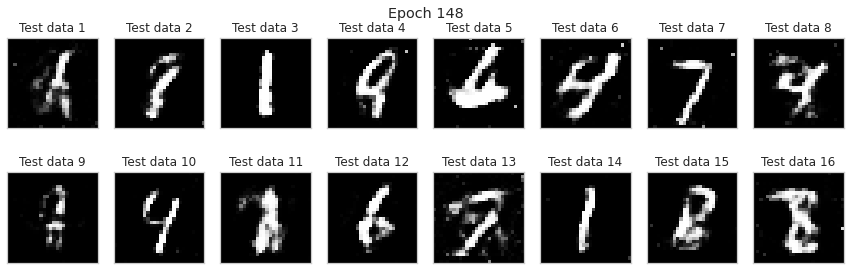

epoch: 149


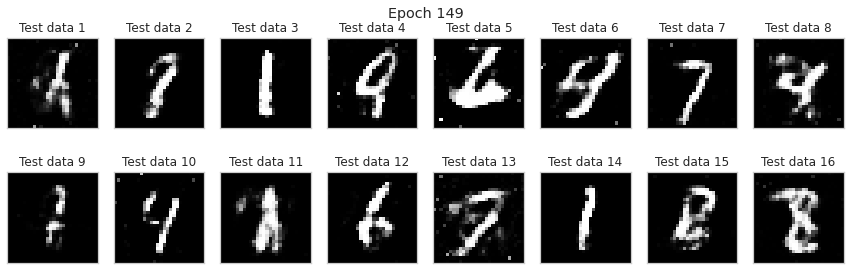

epoch: 150


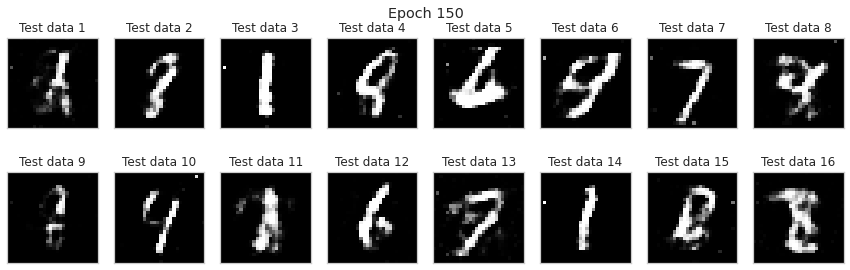

epoch: 151


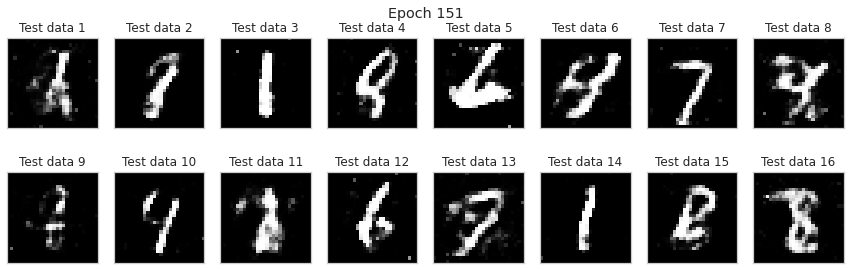

epoch: 152


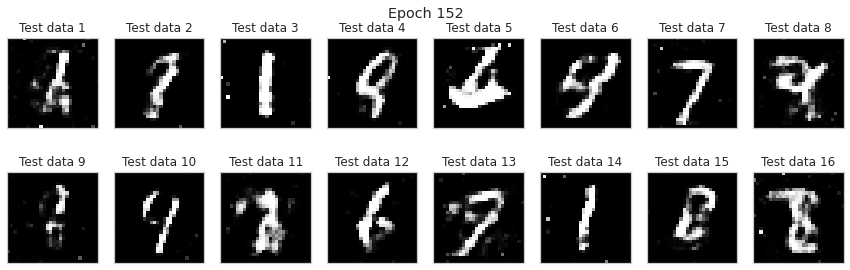

epoch: 153


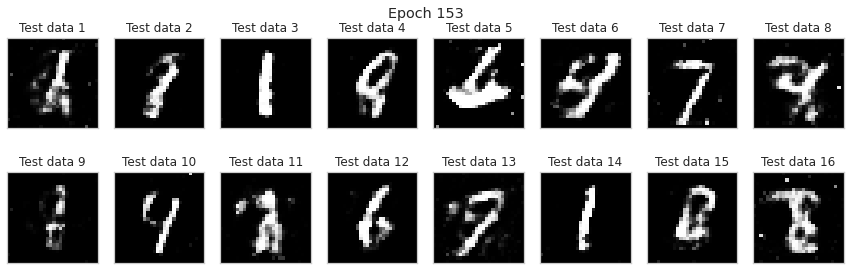

epoch: 154


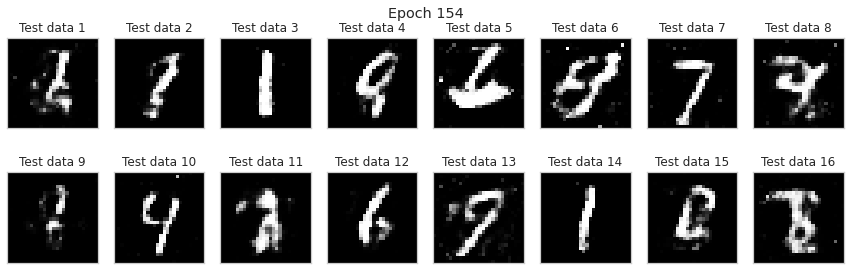

epoch: 155


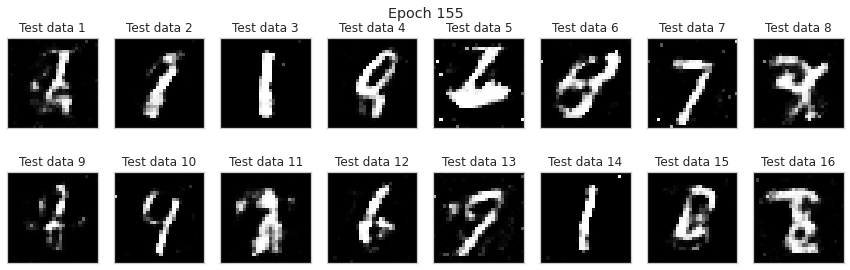

epoch: 156


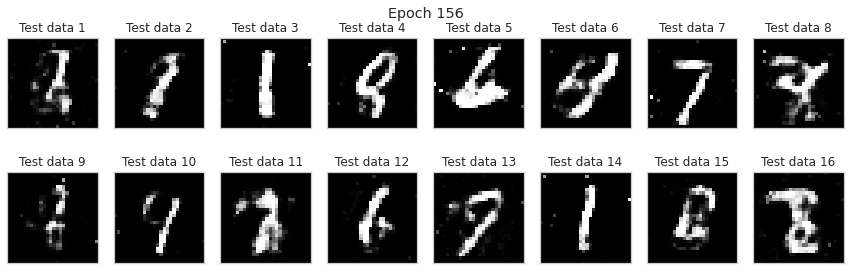

epoch: 157


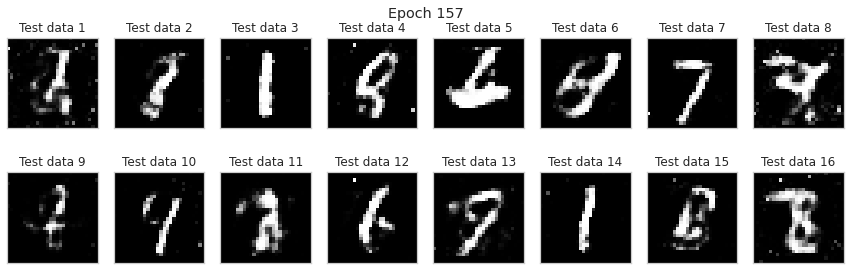

epoch: 158


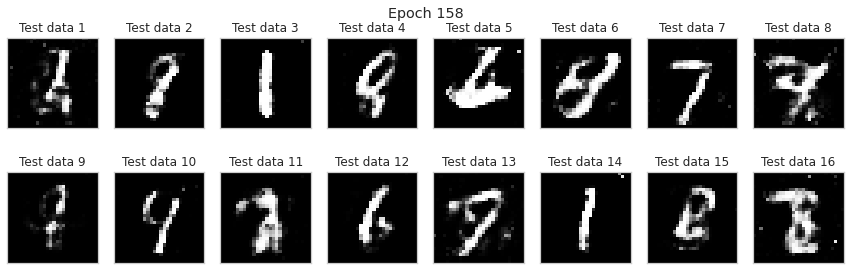

epoch: 159


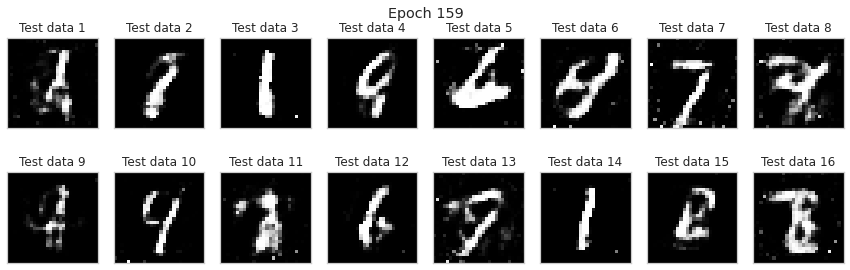

epoch: 160


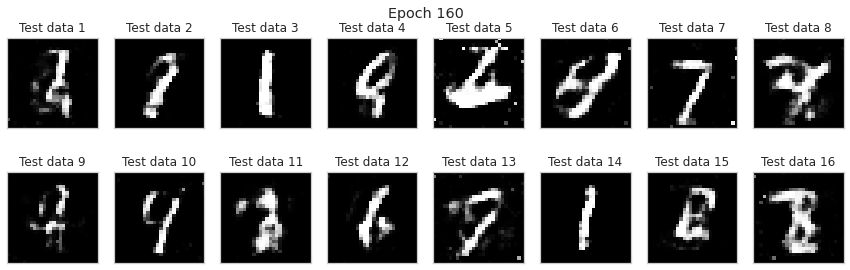

epoch: 161


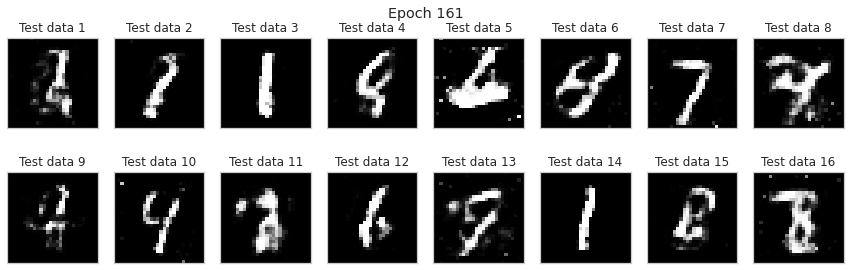

epoch: 162


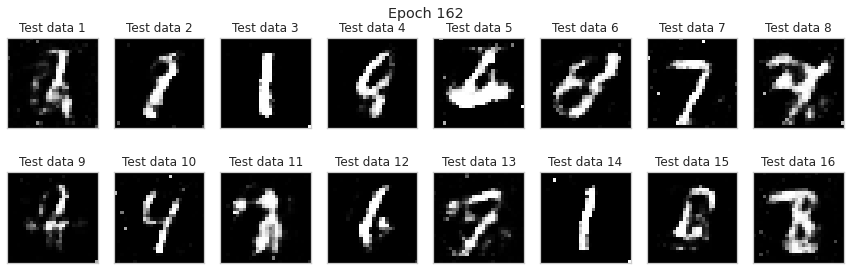

epoch: 163


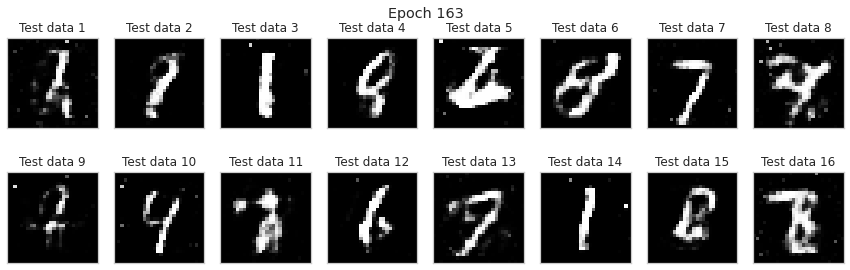

epoch: 164


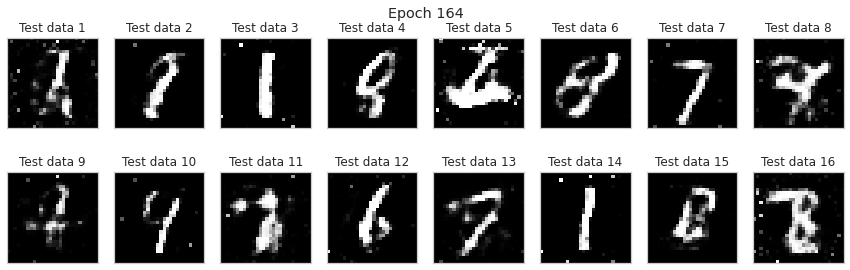

epoch: 165


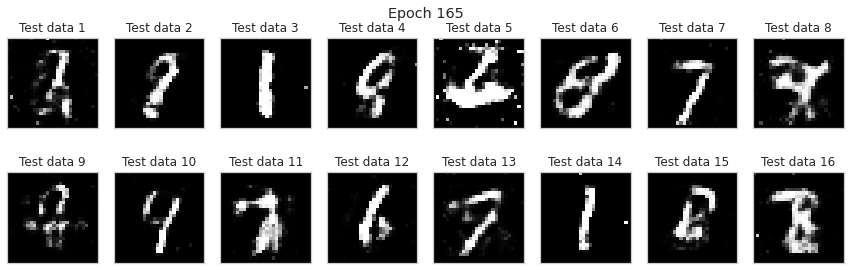

epoch: 166


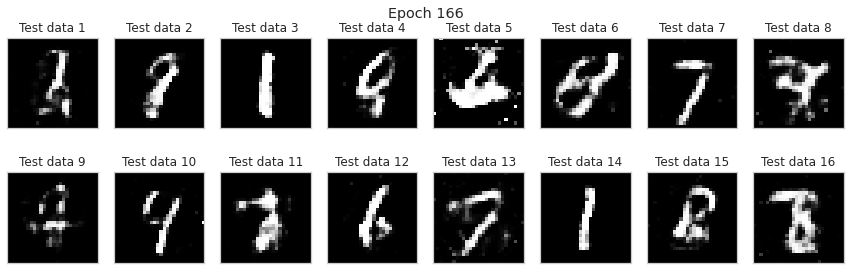

epoch: 167


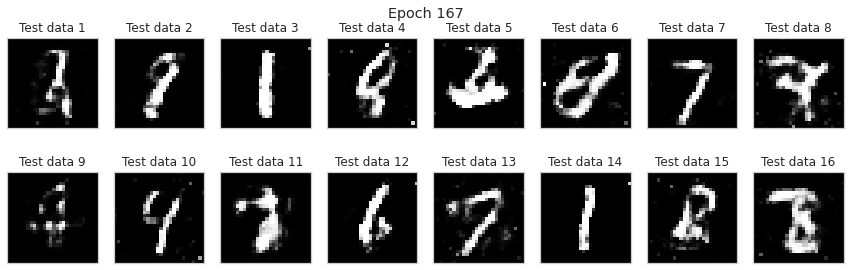

epoch: 168


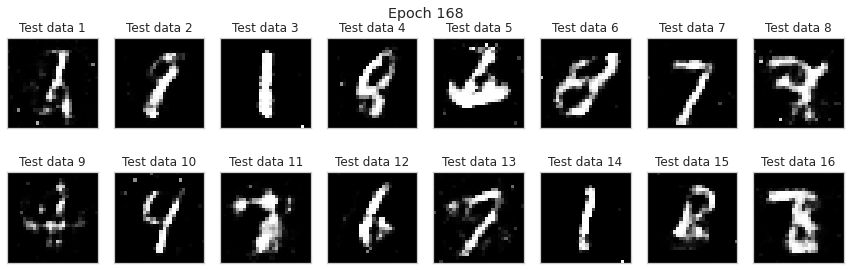

epoch: 169


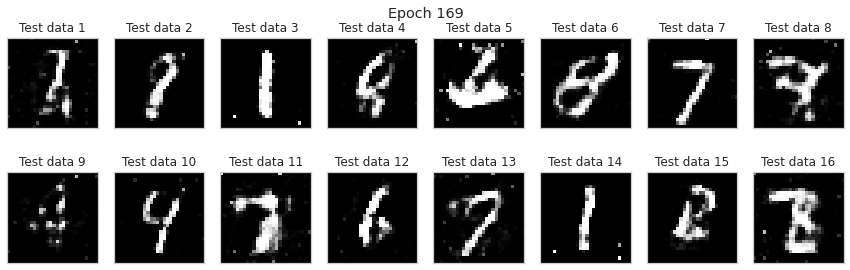

epoch: 170


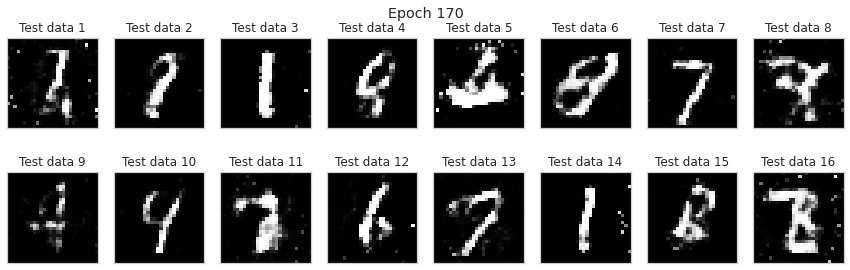

epoch: 171


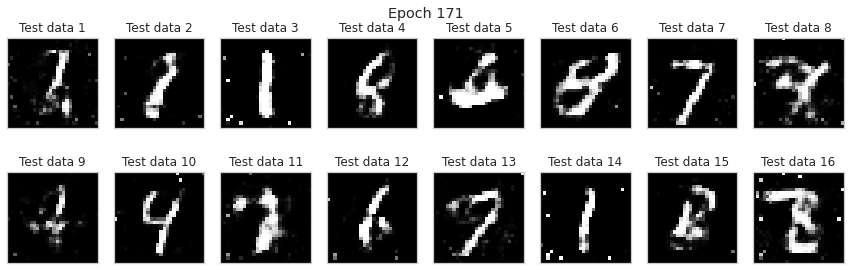

epoch: 172


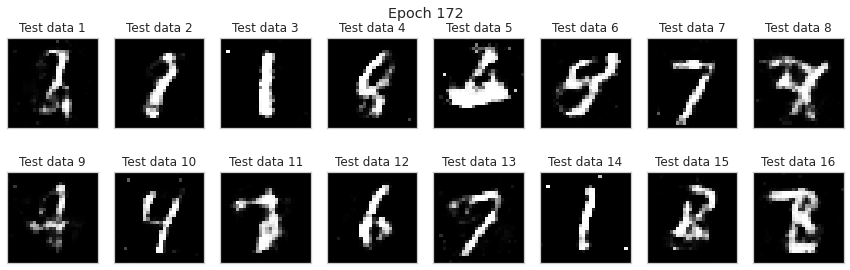

epoch: 173


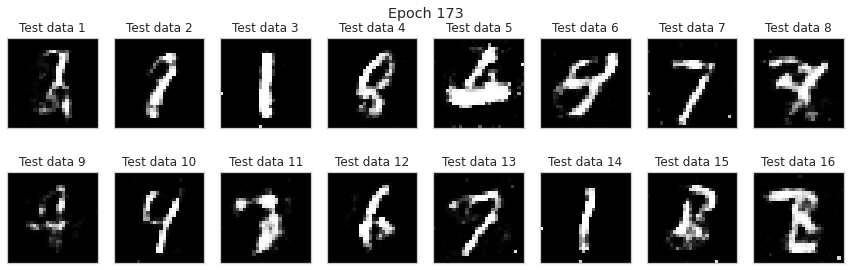

epoch: 174


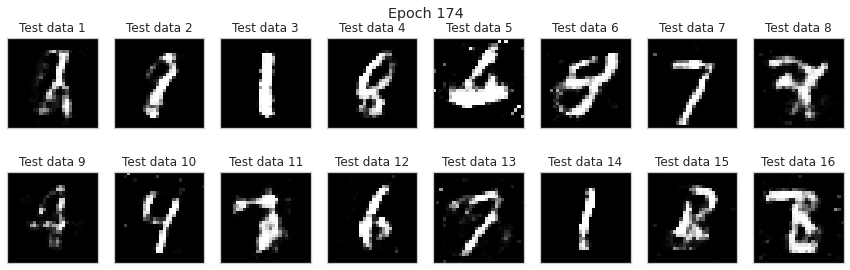

epoch: 175


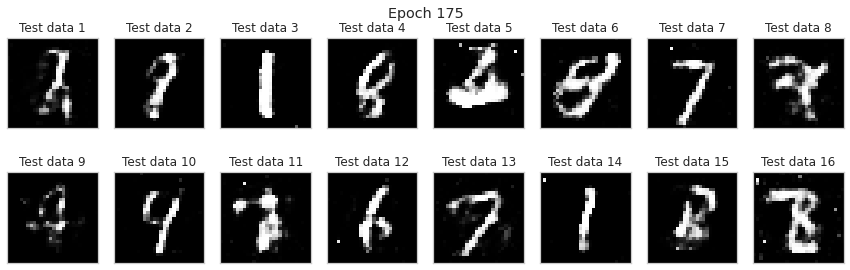

epoch: 176


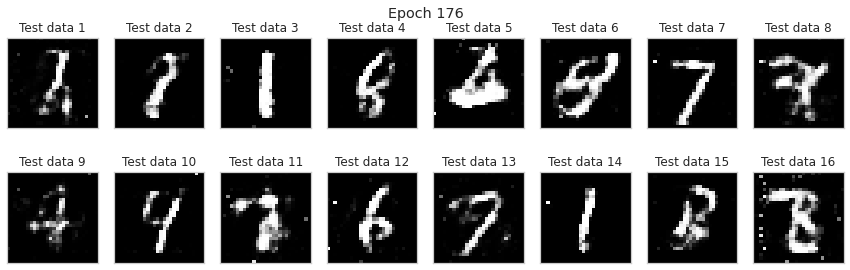

epoch: 177


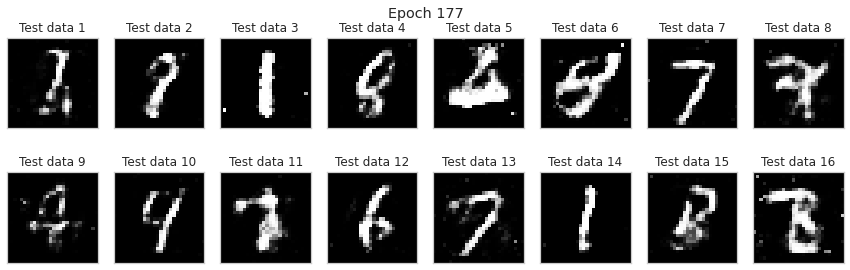

epoch: 178


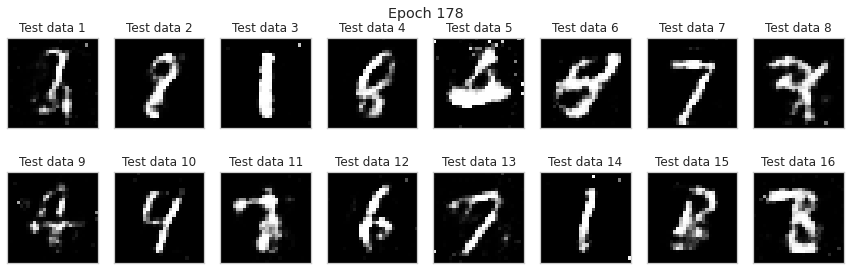

epoch: 179


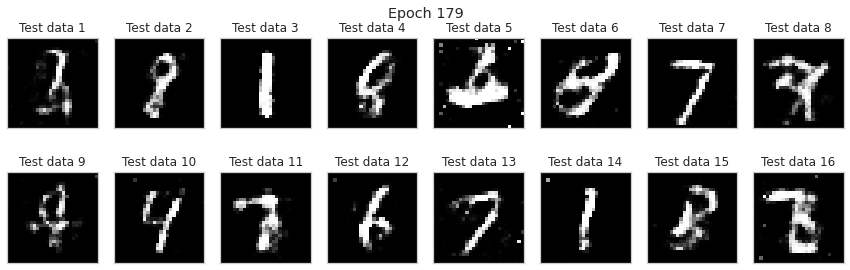

epoch: 180


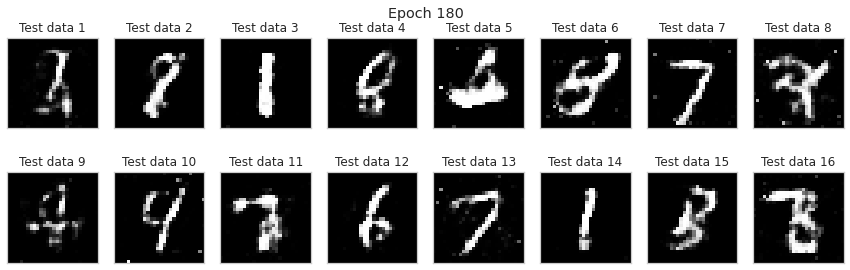

epoch: 181


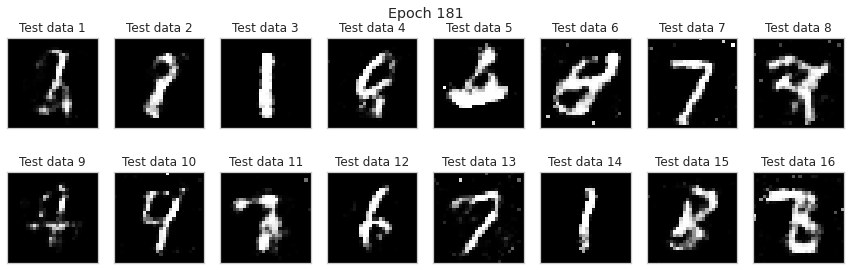

epoch: 182


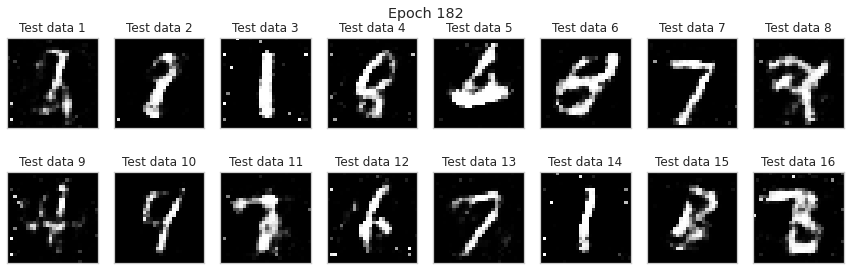

epoch: 183


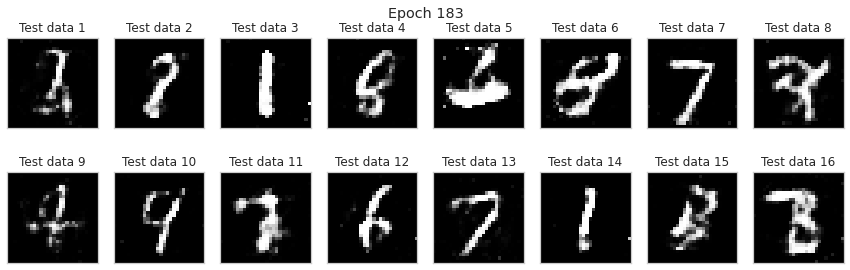

epoch: 184


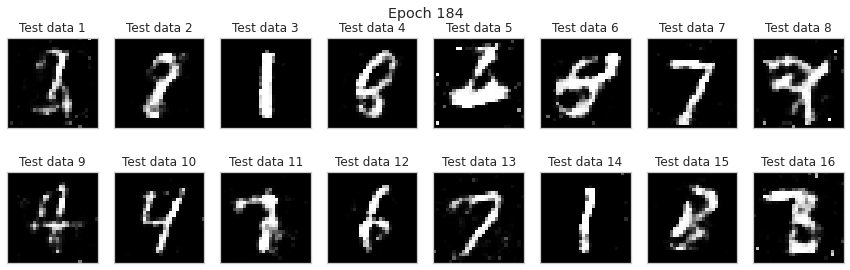

epoch: 185


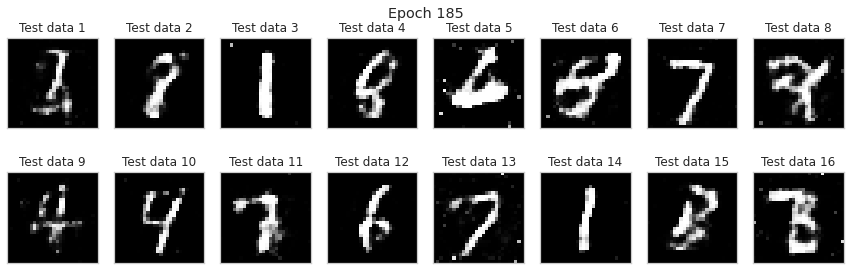

epoch: 186


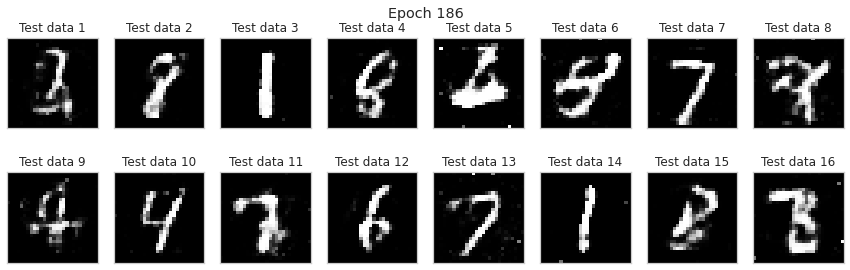

epoch: 187


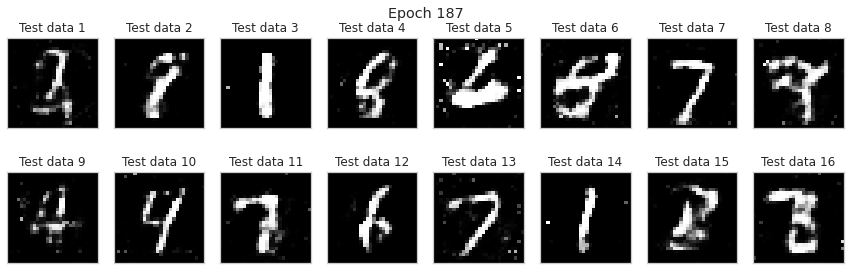

epoch: 188


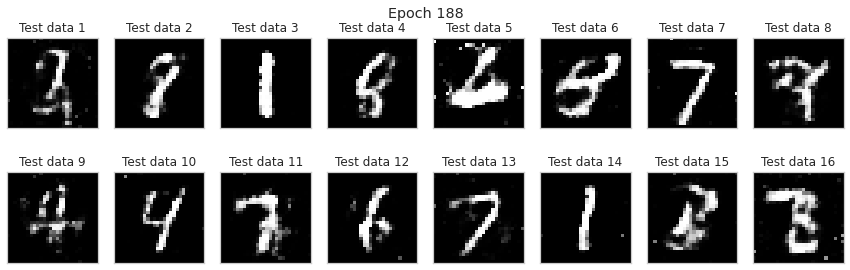

epoch: 189


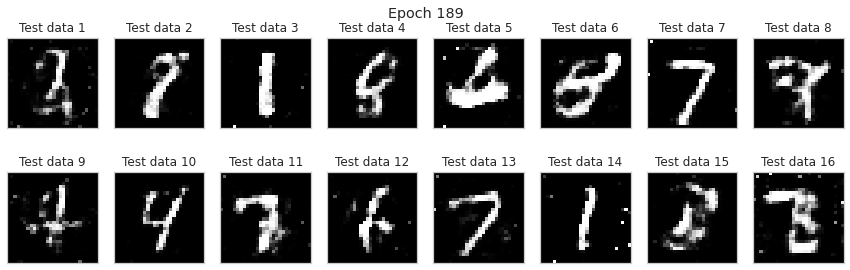

epoch: 190


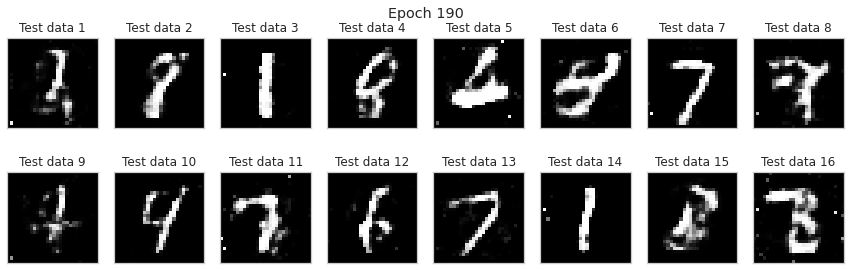

epoch: 191


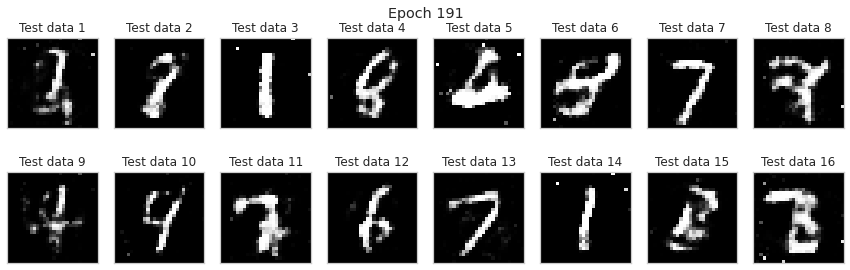

epoch: 192


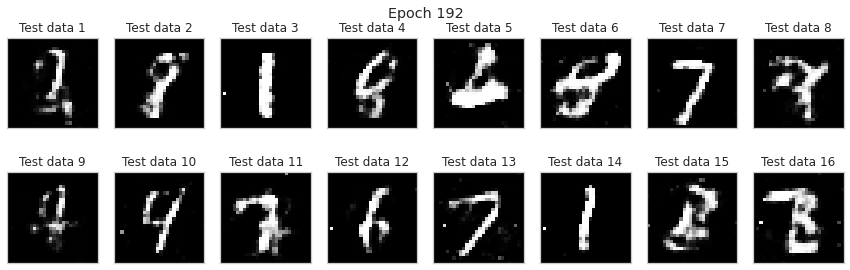

epoch: 193


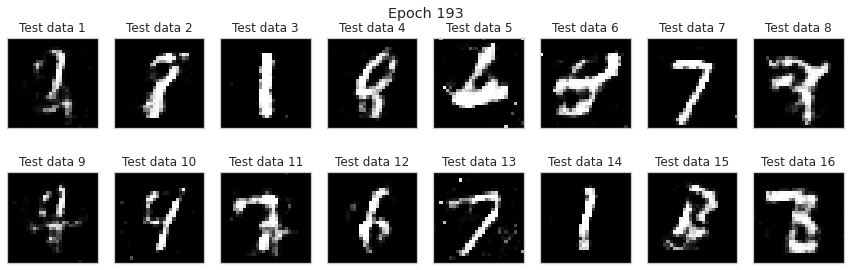

epoch: 194


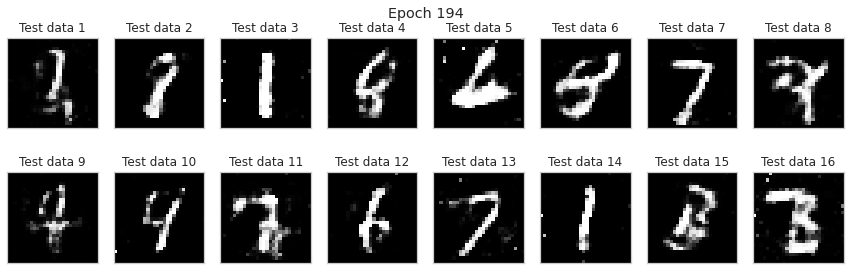

epoch: 195


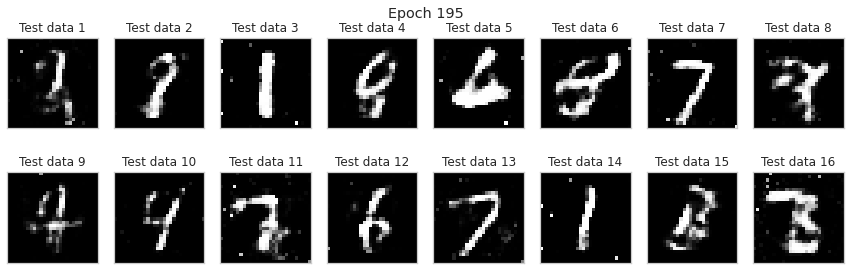

epoch: 196


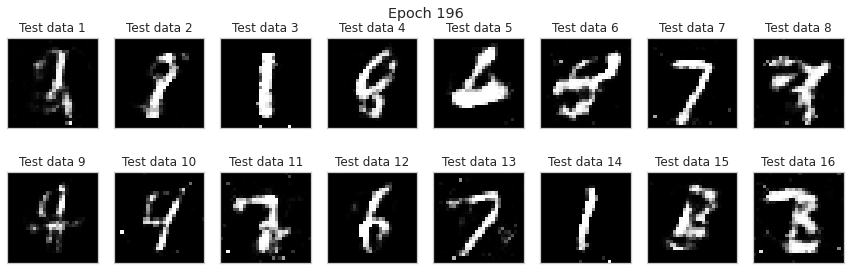

epoch: 197


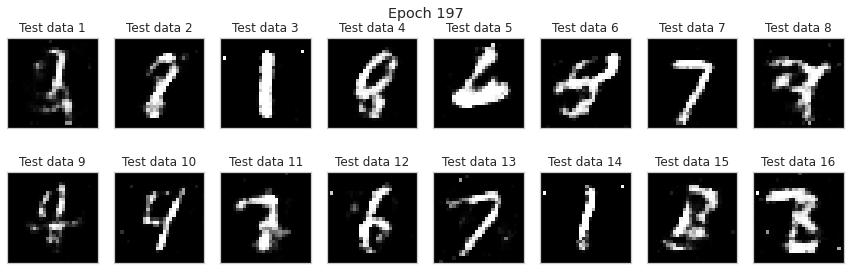

epoch: 198


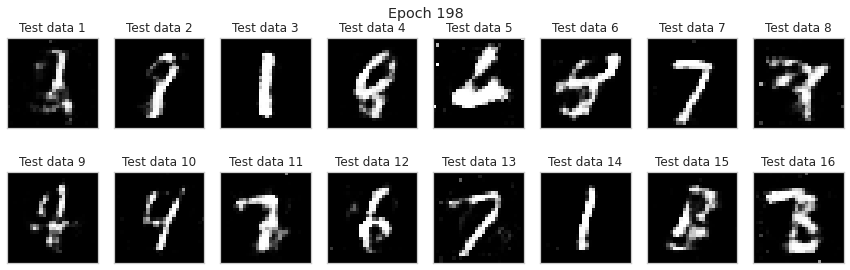

epoch: 199


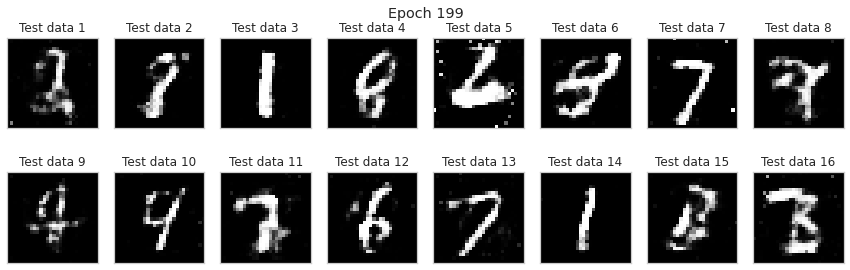

epoch: 200


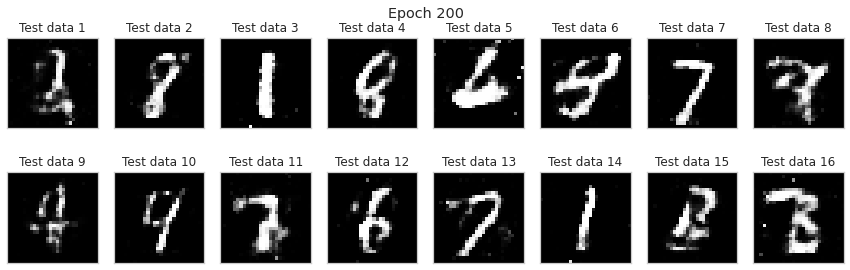

epoch: 201


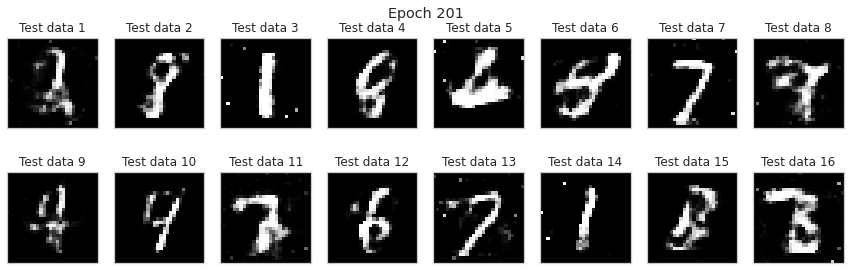

epoch: 202


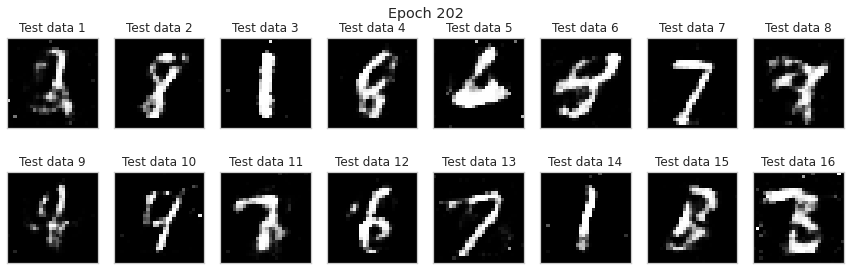

epoch: 203


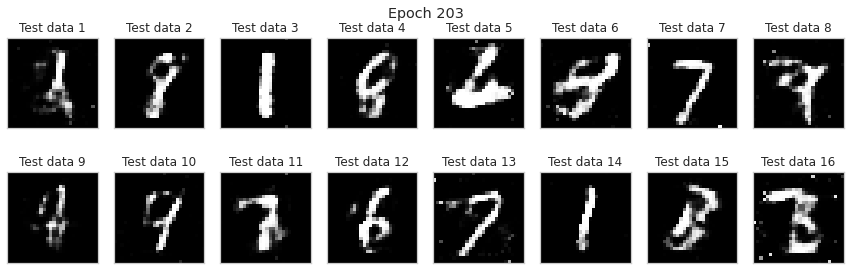

epoch: 204


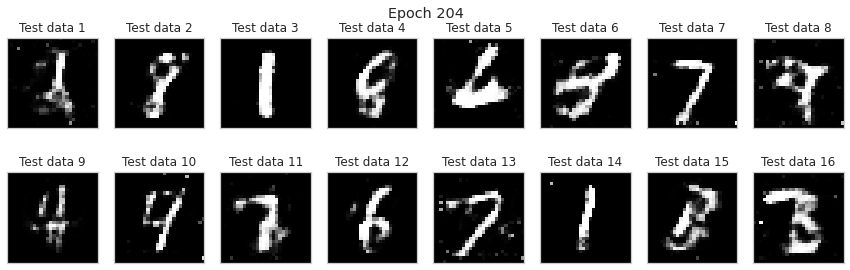

epoch: 205


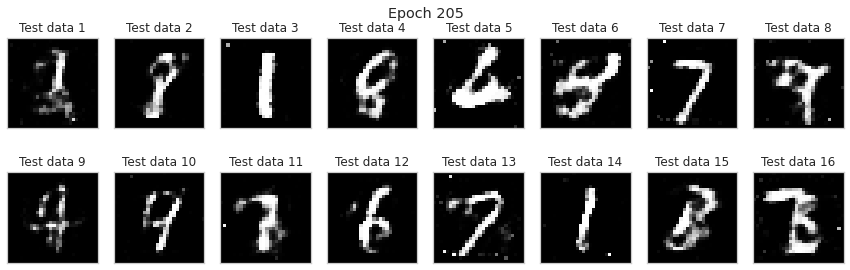

epoch: 206


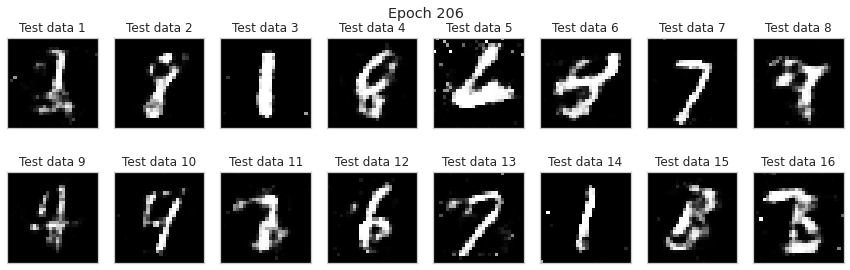

epoch: 207


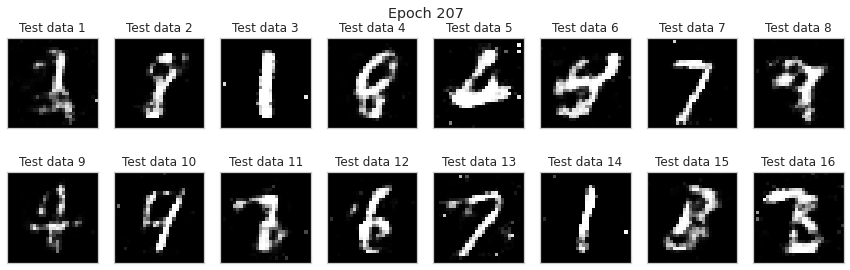

epoch: 208


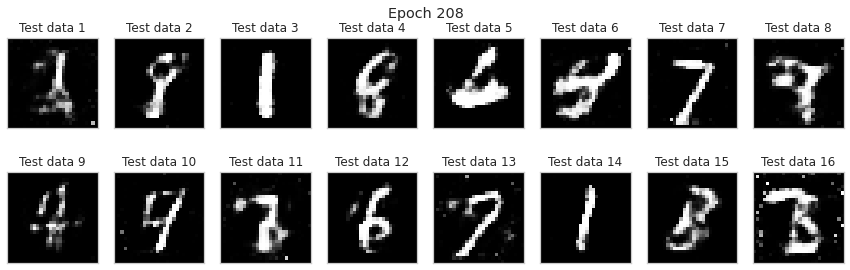

epoch: 209


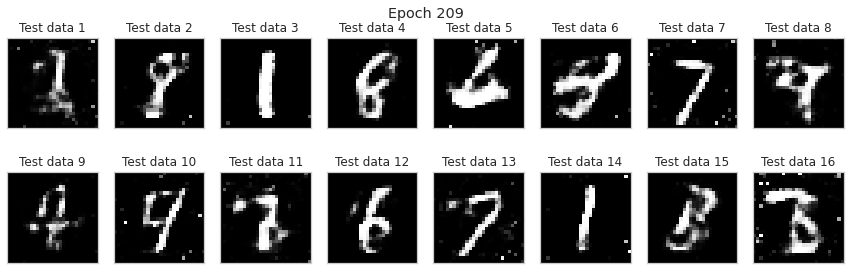

epoch: 210


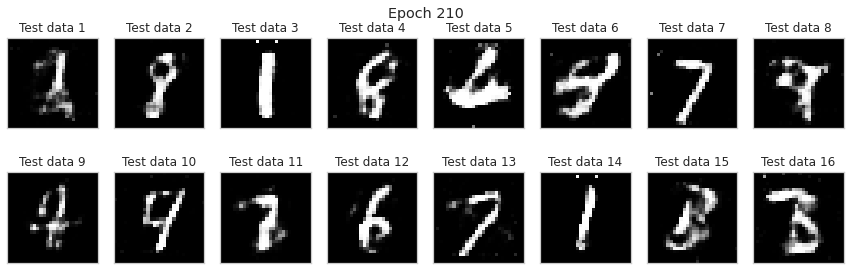

epoch: 211


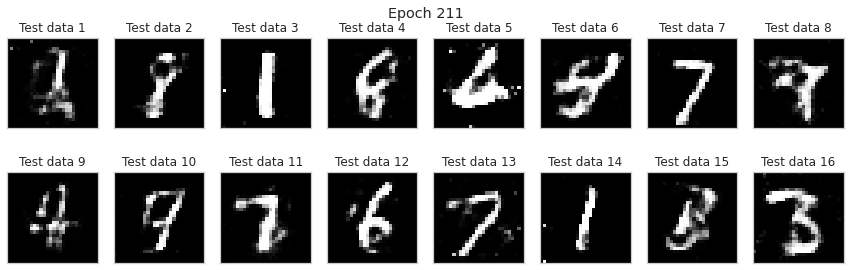

epoch: 212


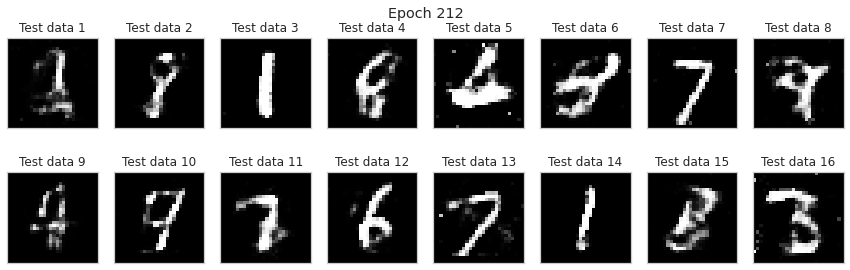

epoch: 213


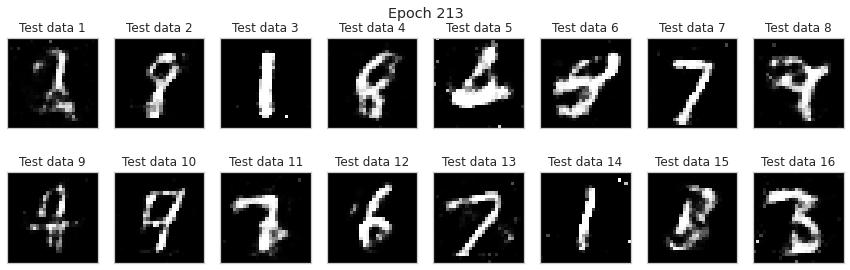

epoch: 214


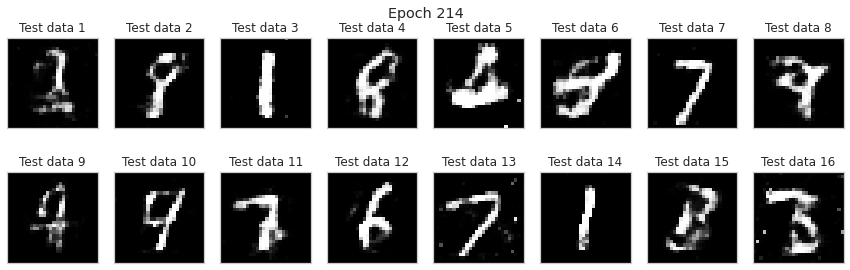

epoch: 215


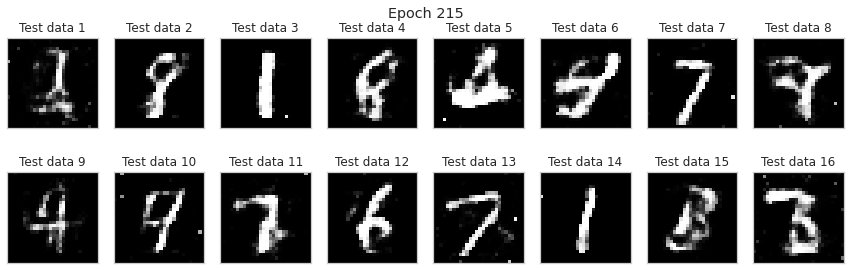

epoch: 216


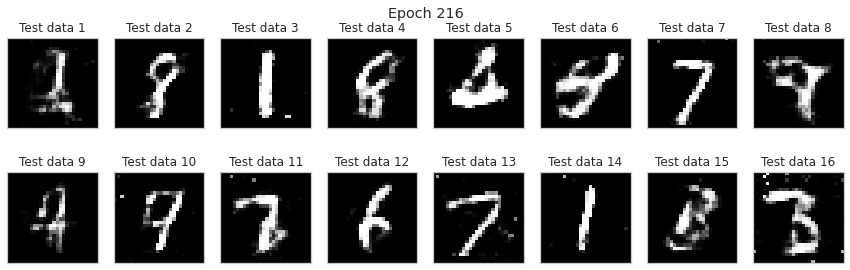

epoch: 217


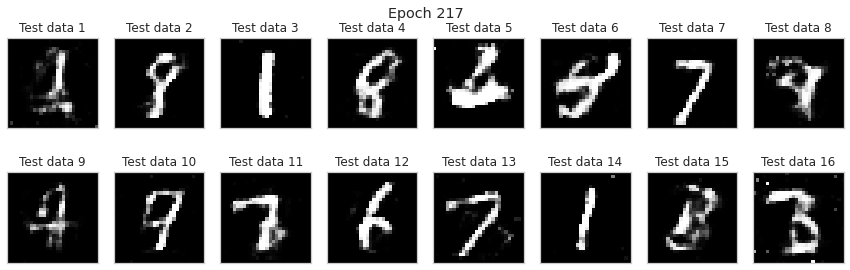

epoch: 218


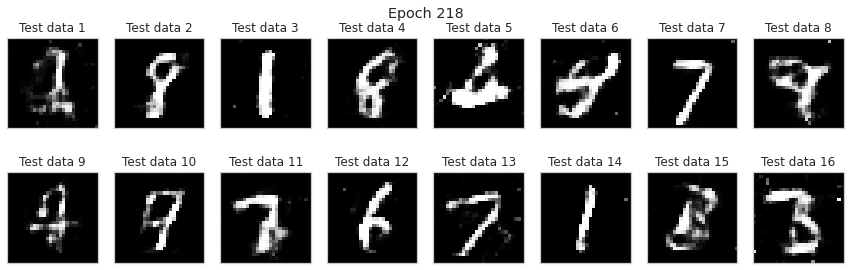

epoch: 219


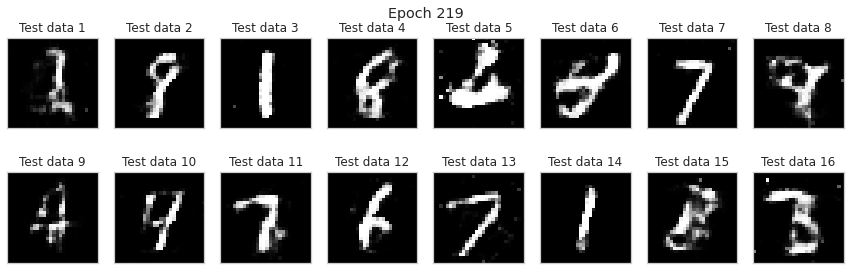

epoch: 220


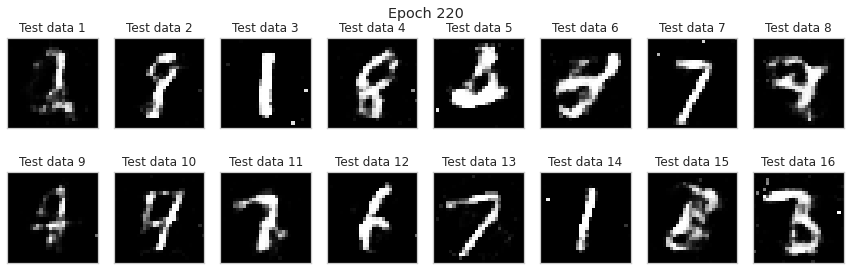

epoch: 221


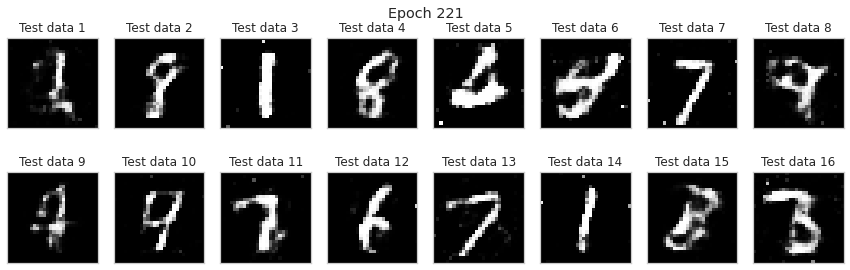

epoch: 222


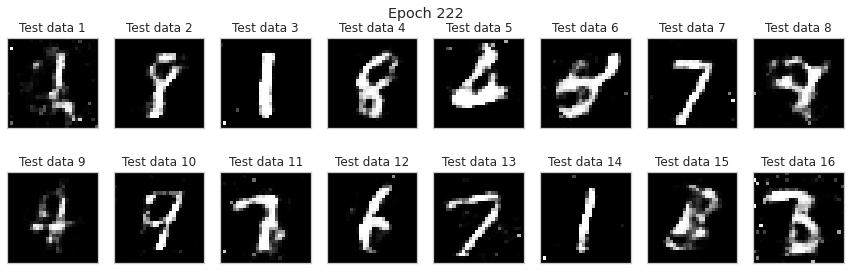

epoch: 223


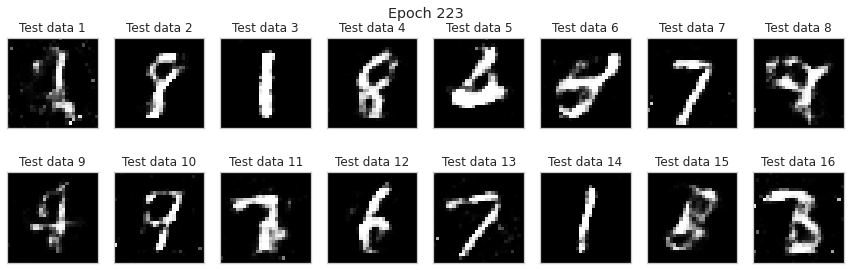

epoch: 224


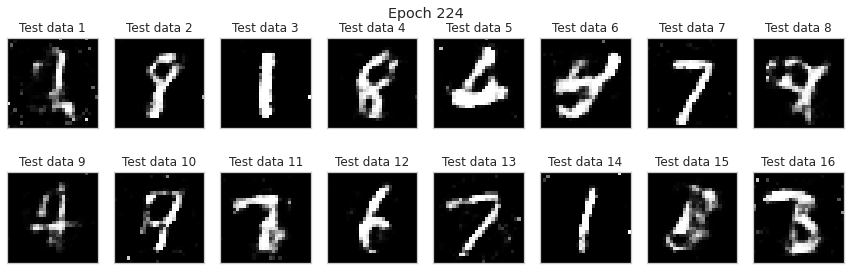

epoch: 225


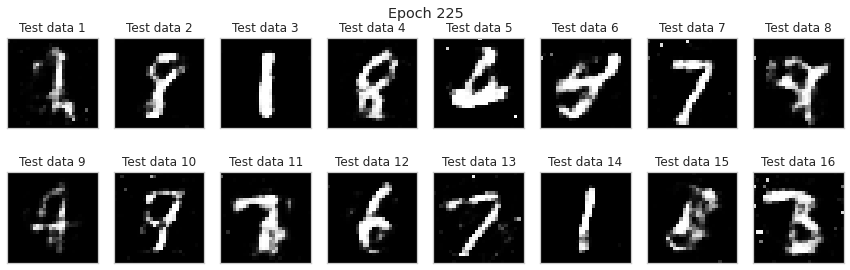

epoch: 226


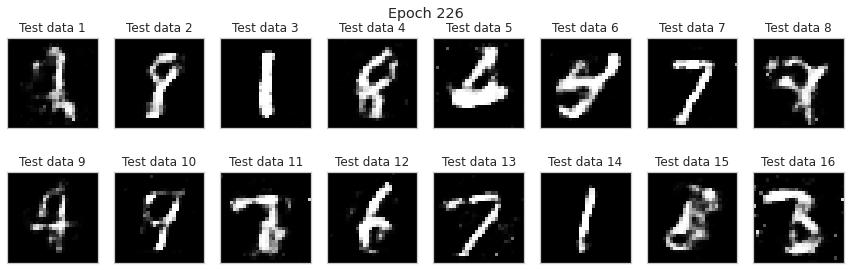

epoch: 227


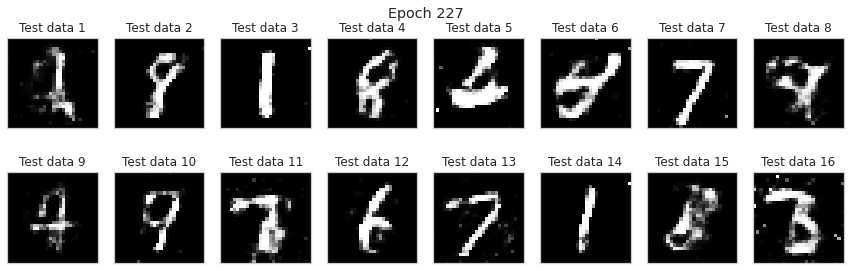

epoch: 228


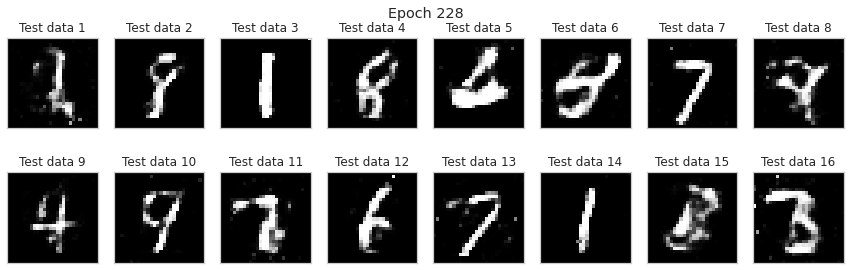

epoch: 229


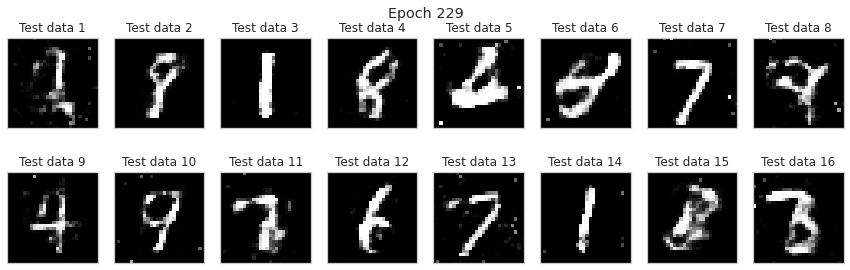

epoch: 230


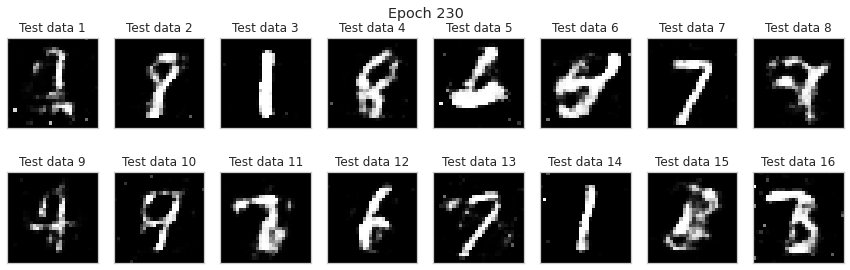

epoch: 231


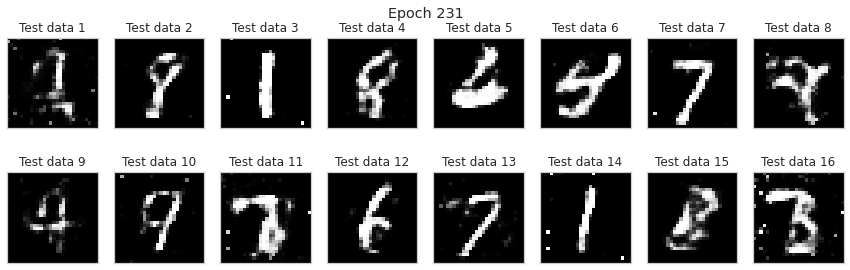

epoch: 232


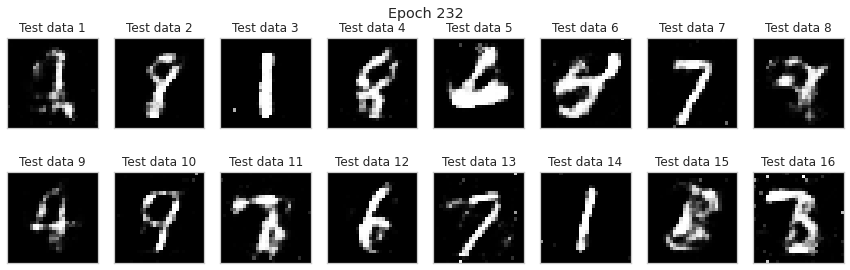

epoch: 233


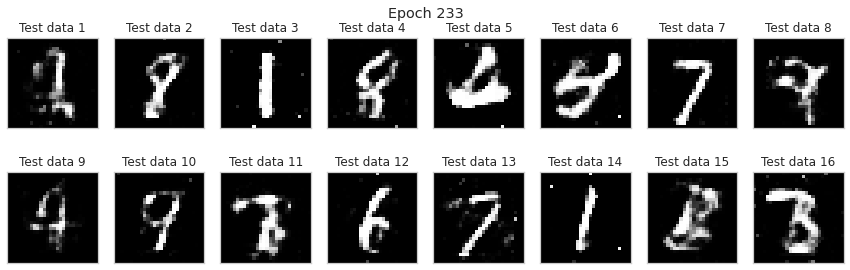

epoch: 234


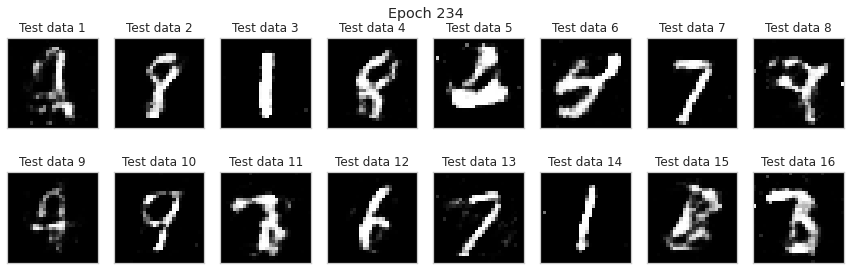

epoch: 235


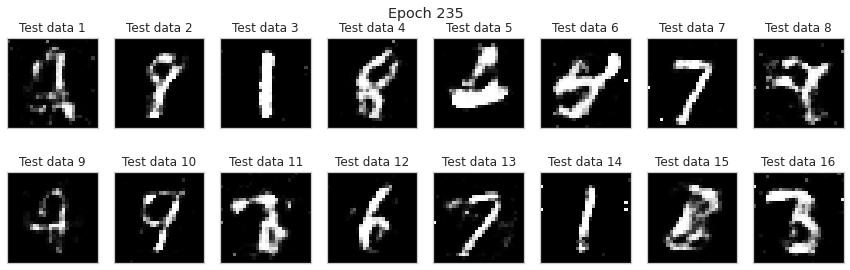

epoch: 236


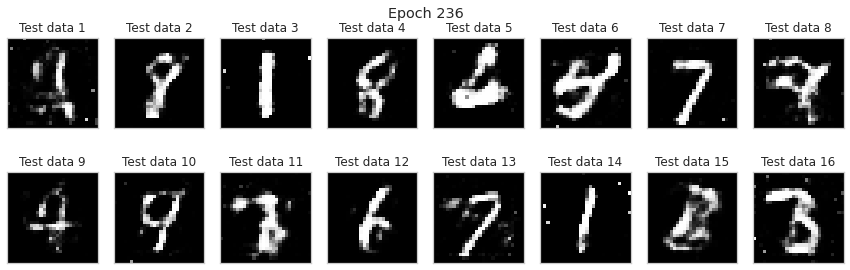

epoch: 237


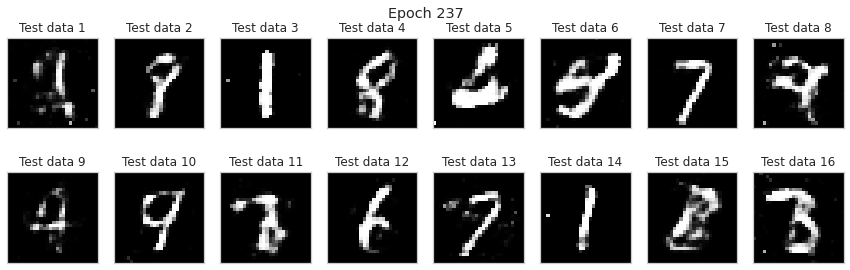

epoch: 238


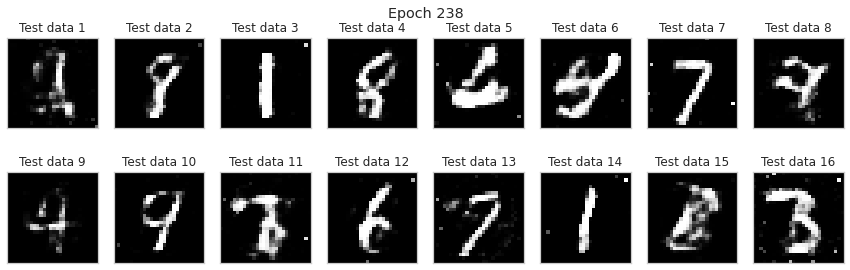

epoch: 239


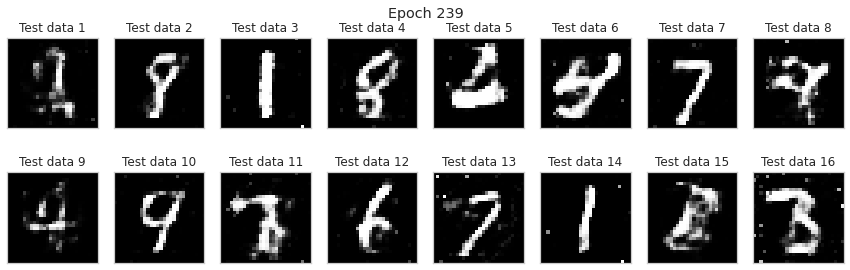

epoch: 240


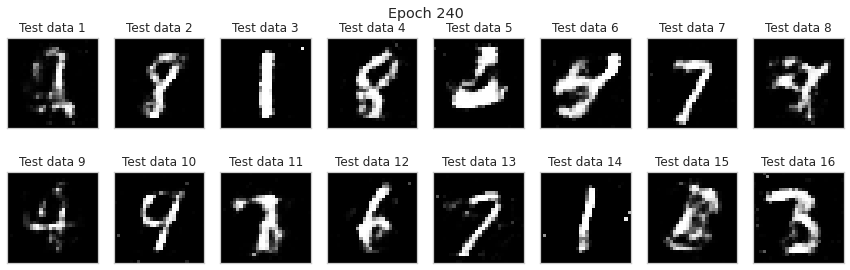

epoch: 241


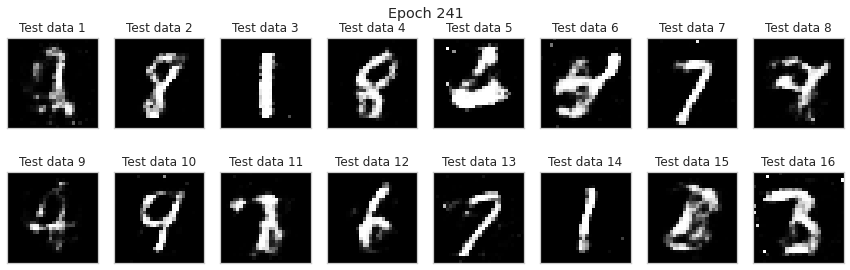

epoch: 242


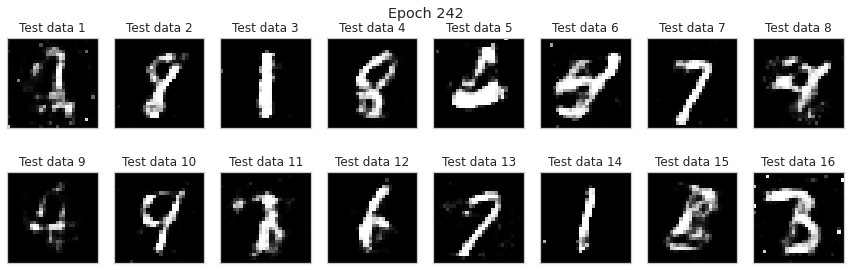

epoch: 243


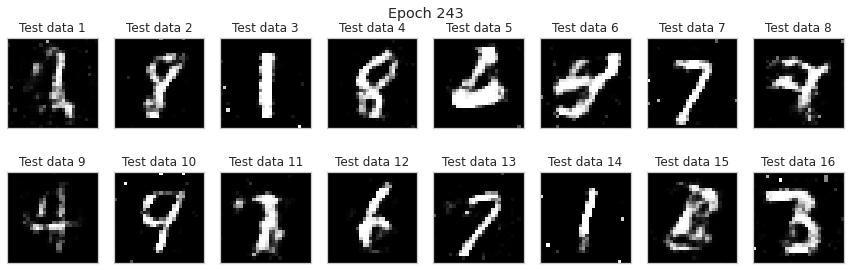

epoch: 244


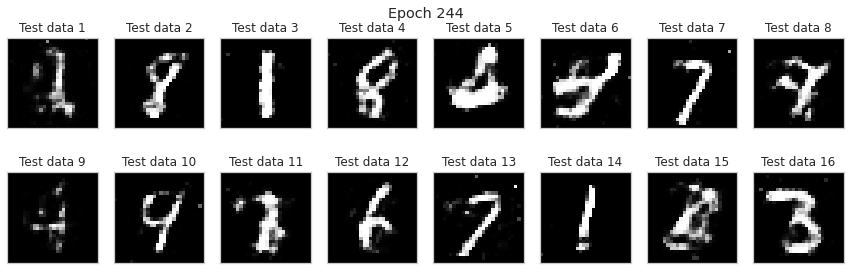

epoch: 245


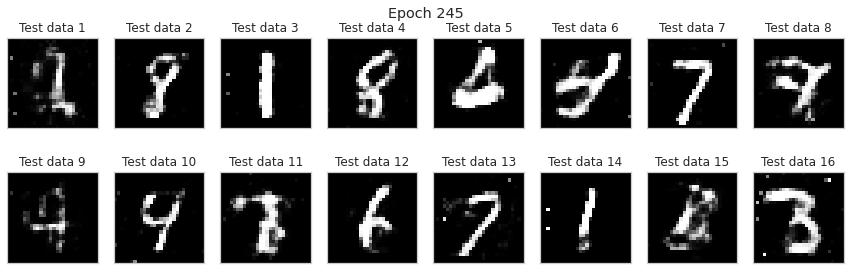

epoch: 246


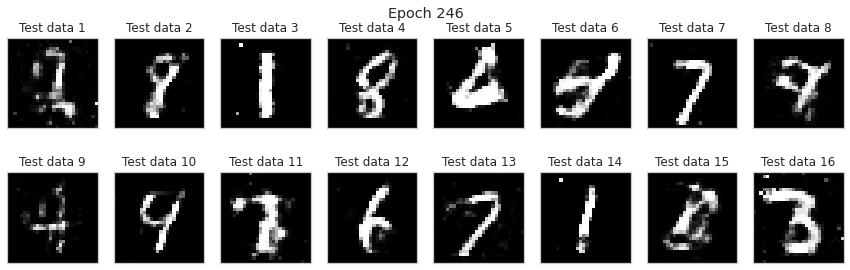

epoch: 247


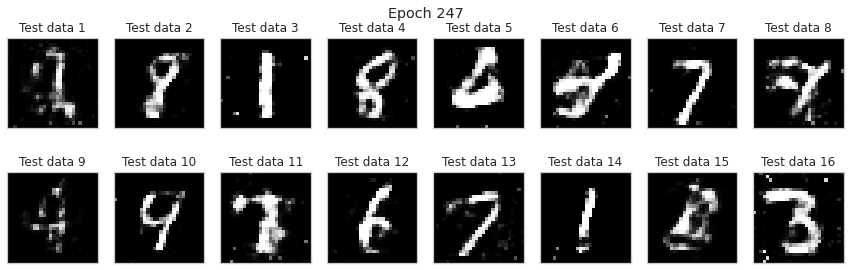

epoch: 248


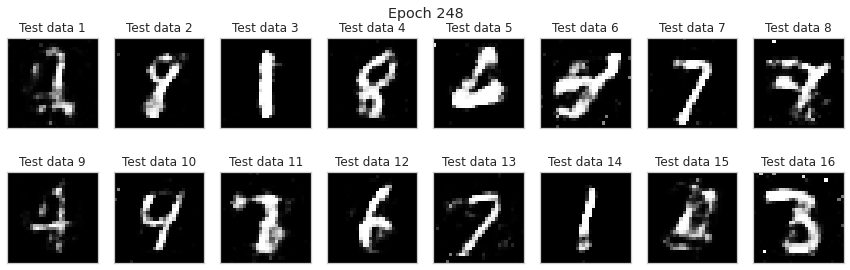

epoch: 249


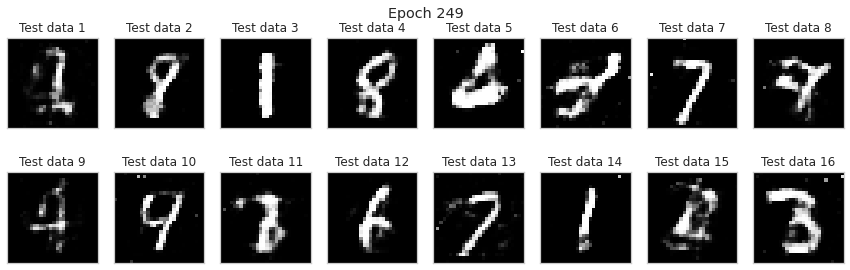

epoch: 250


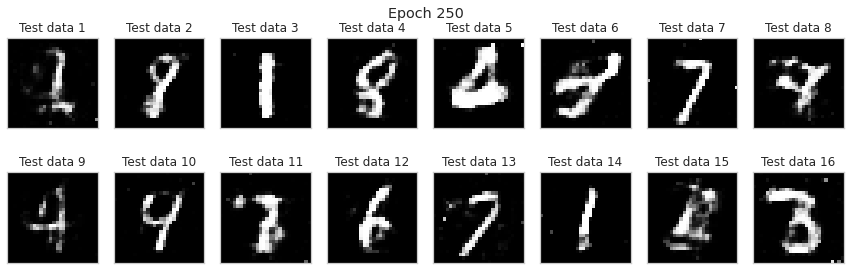

epoch: 251


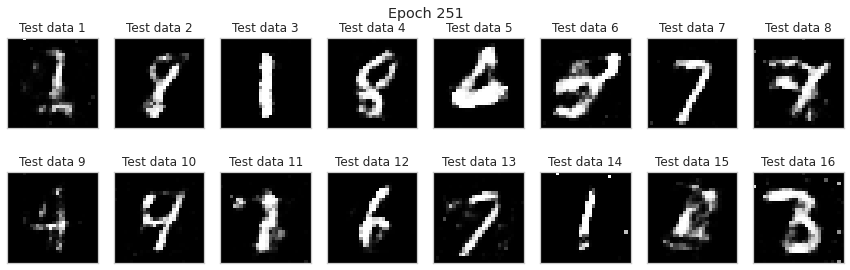

epoch: 252


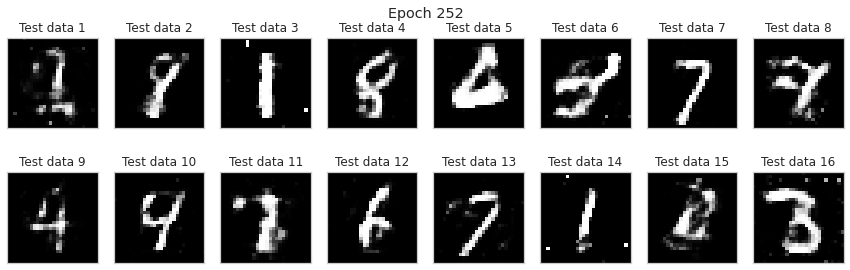

epoch: 253


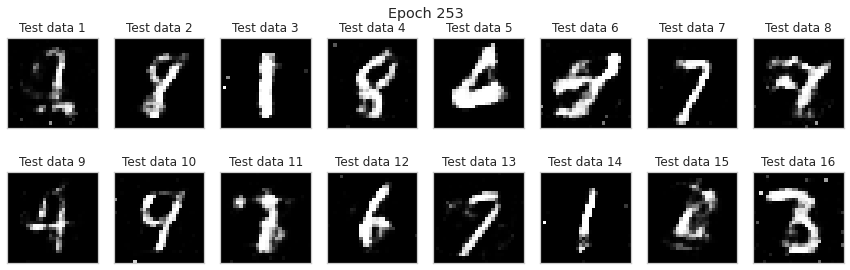

epoch: 254


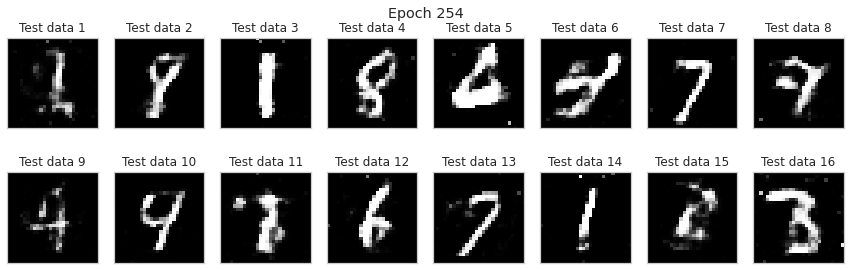

epoch: 255


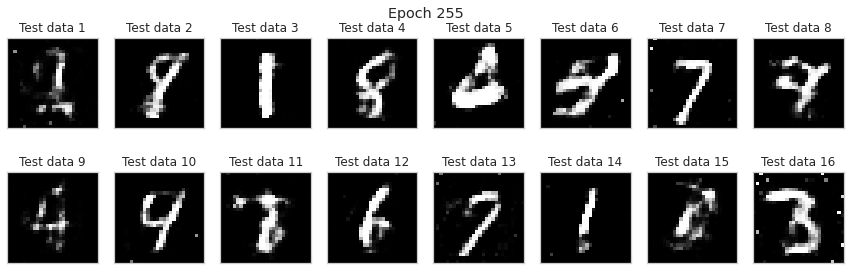

epoch: 256


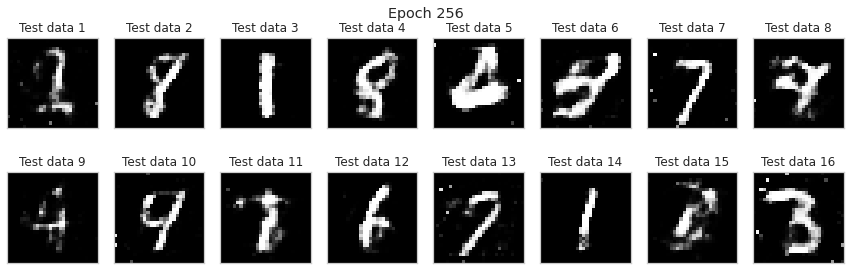

epoch: 257


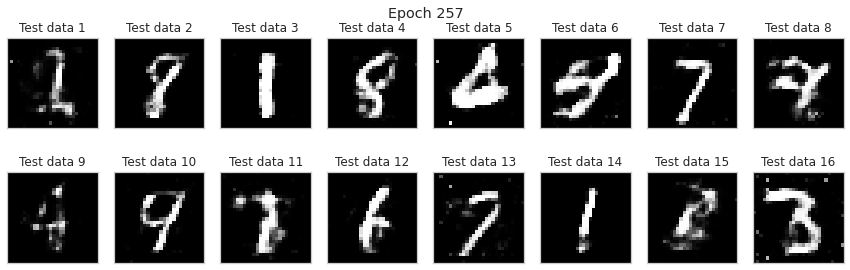

epoch: 258


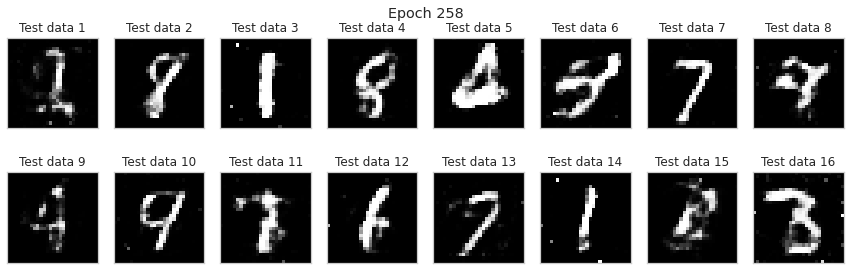

epoch: 259


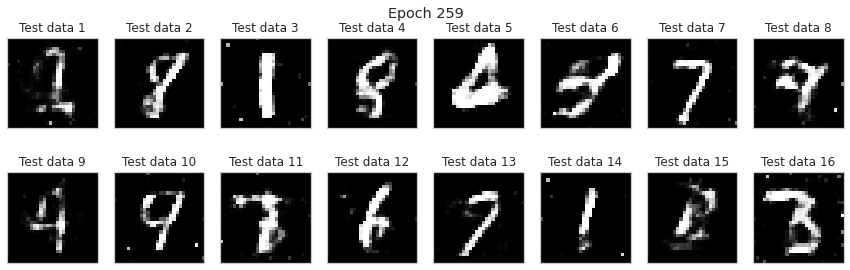

epoch: 260


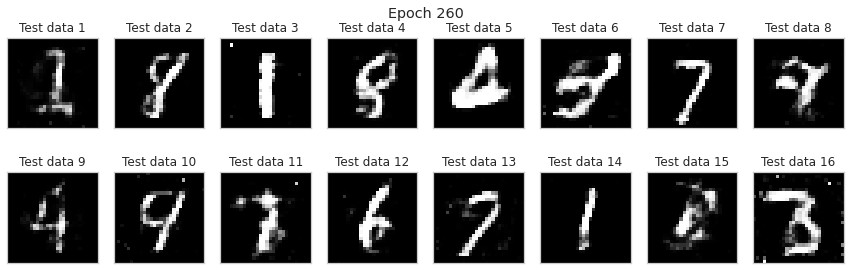

epoch: 261


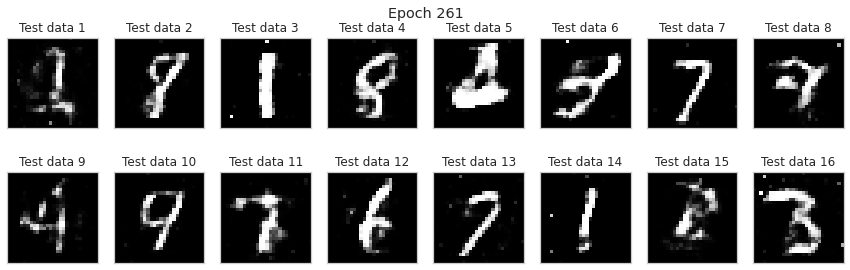

epoch: 262


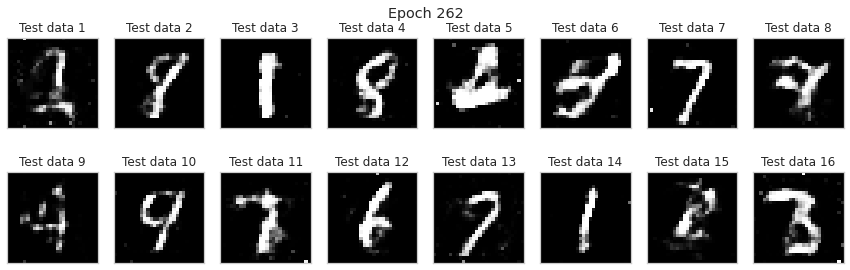

epoch: 263


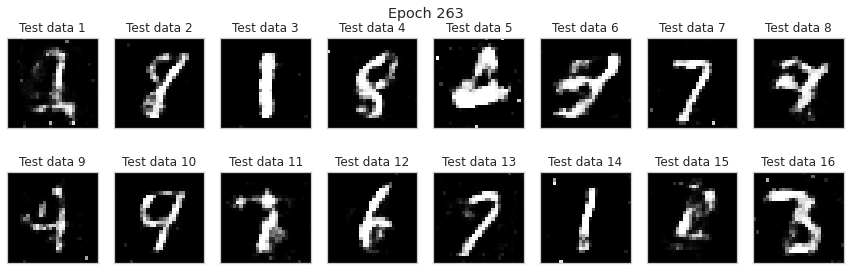

epoch: 264


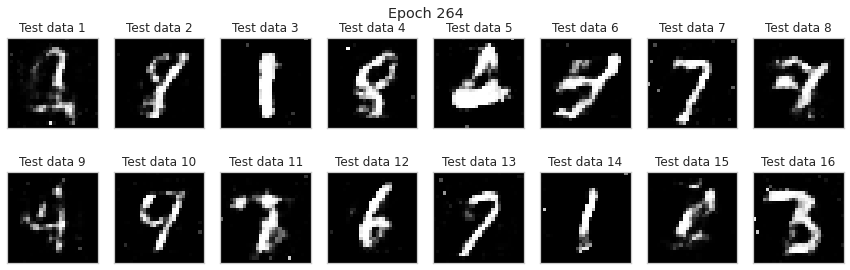

epoch: 265


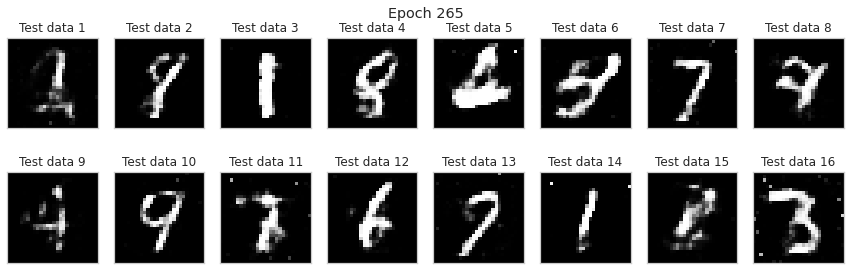

epoch: 266


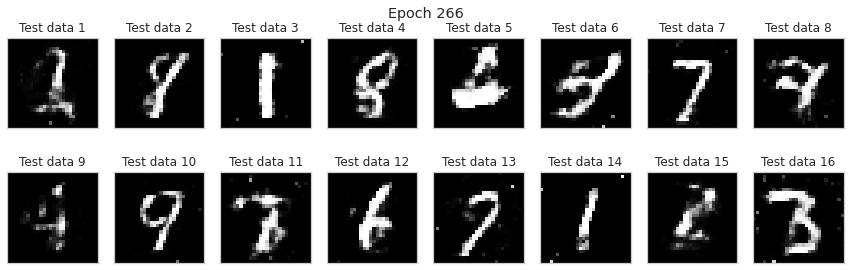

epoch: 267


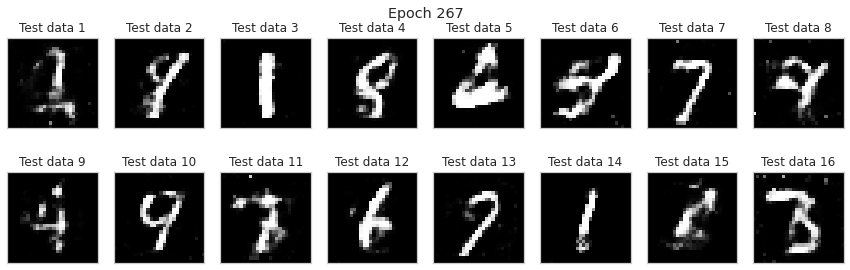

epoch: 268


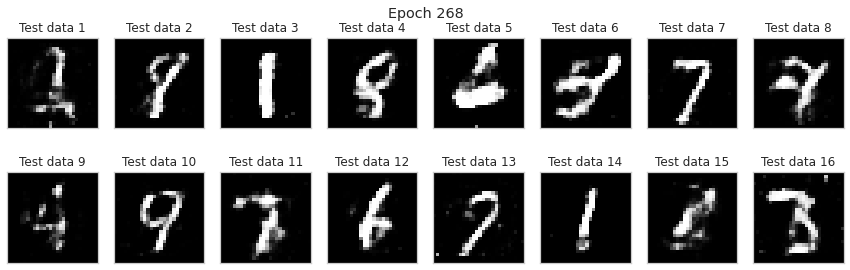

epoch: 269


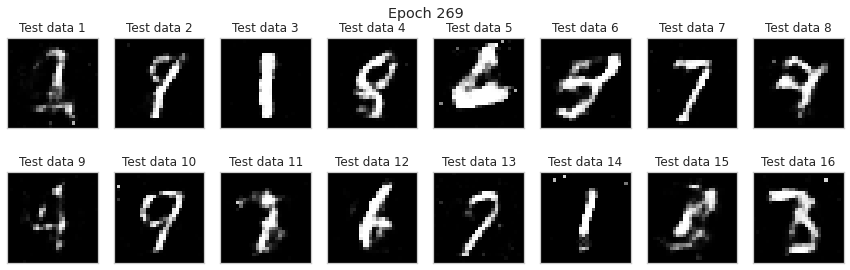

epoch: 270


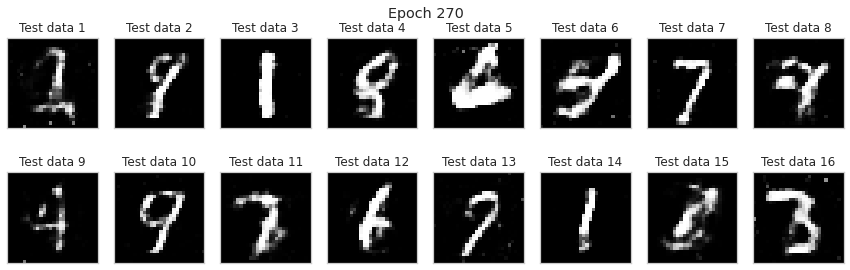

epoch: 271


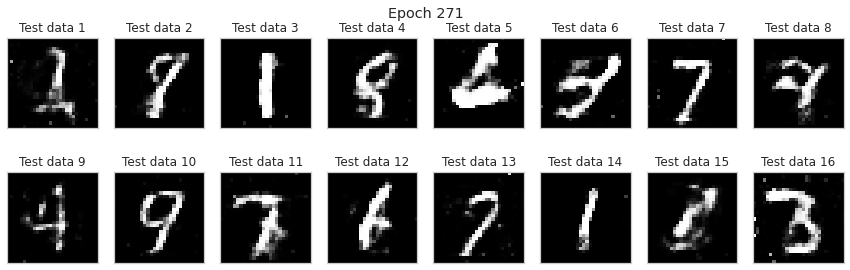

epoch: 272


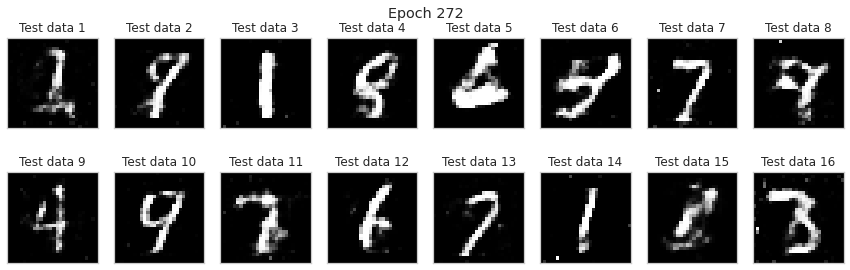

epoch: 273


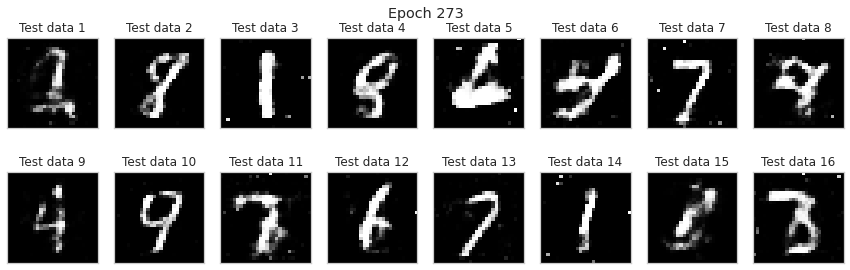

epoch: 274


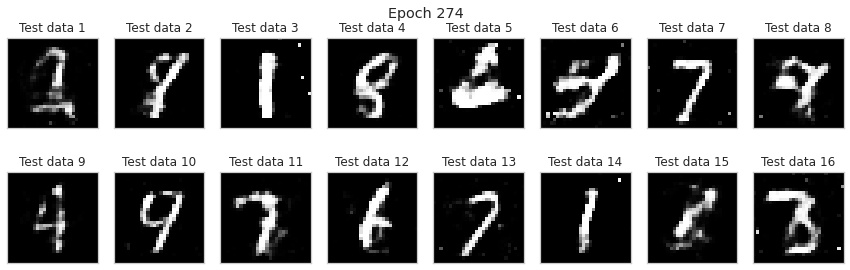

epoch: 275


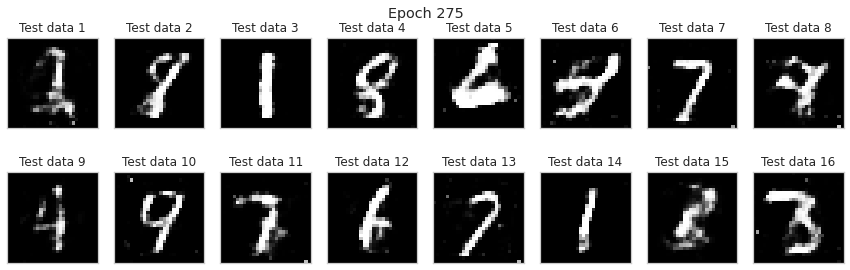

epoch: 276


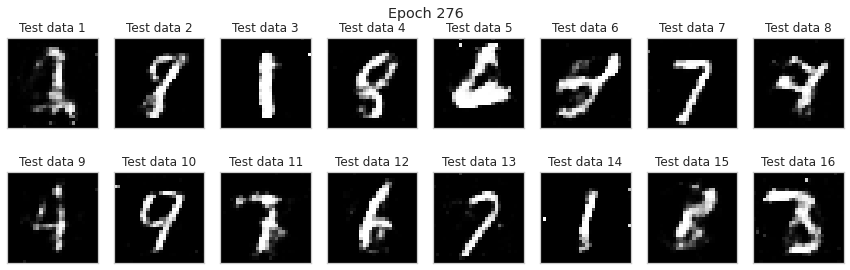

epoch: 277


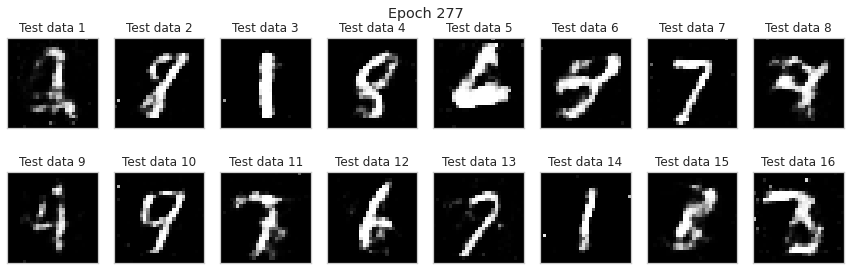

epoch: 278


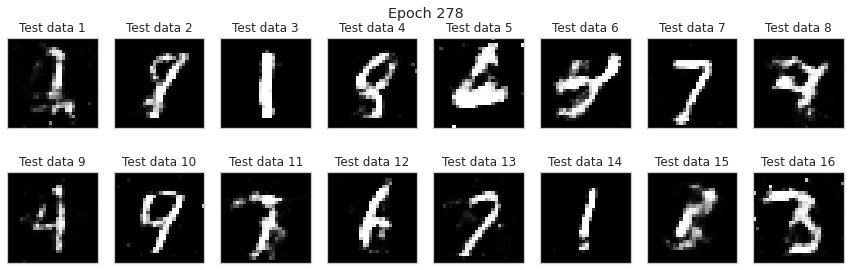

epoch: 279


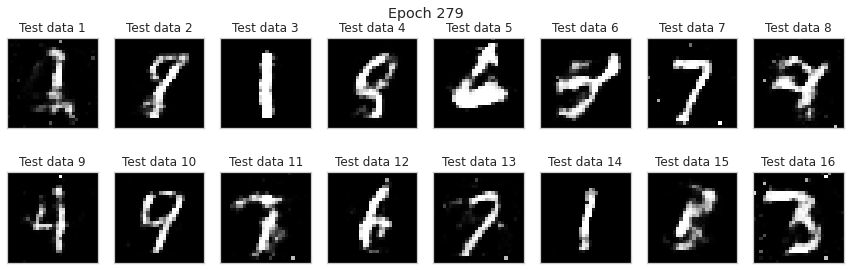

epoch: 280


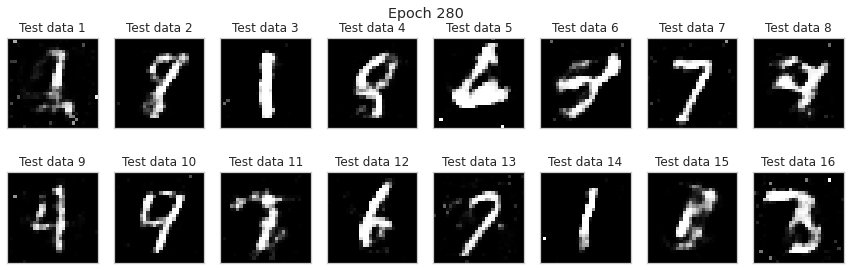

epoch: 281


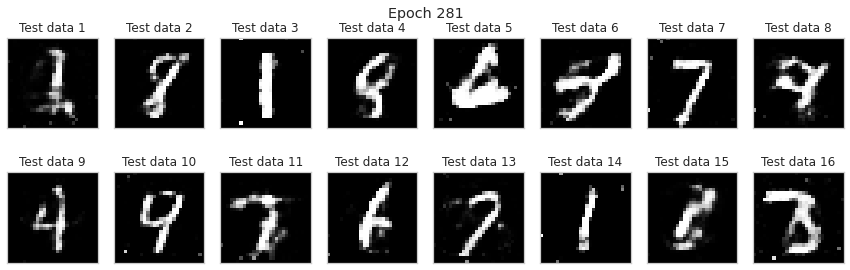

epoch: 282


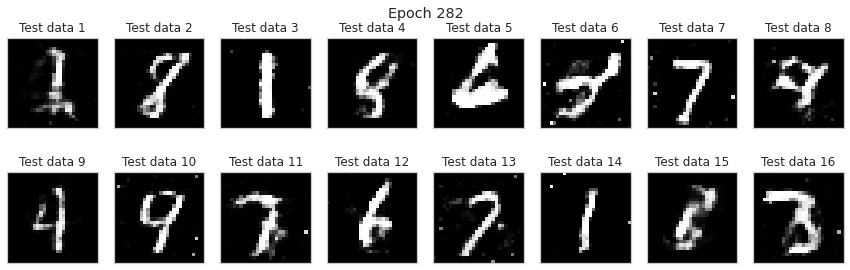

epoch: 283


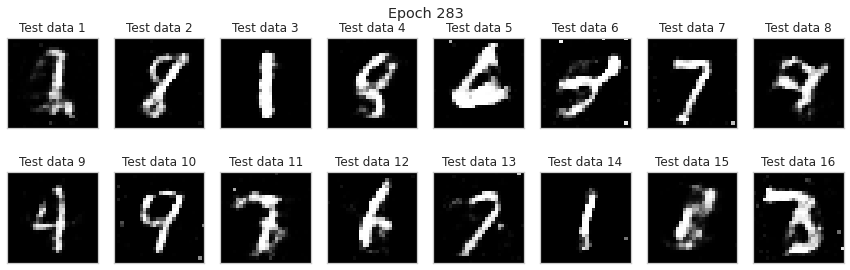

epoch: 284


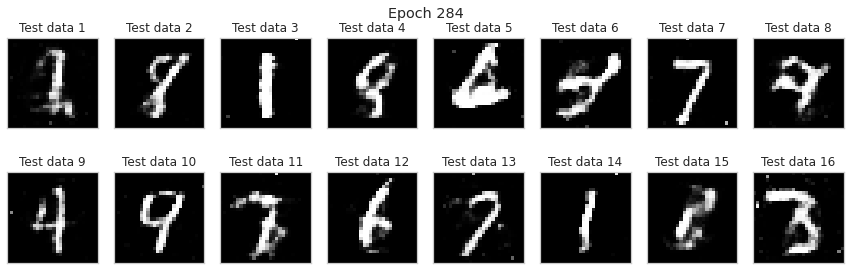

epoch: 285


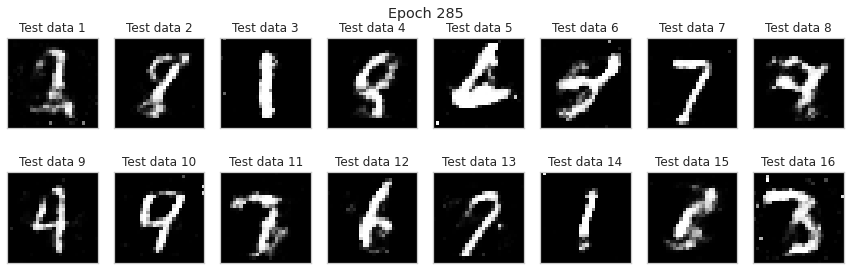

epoch: 286


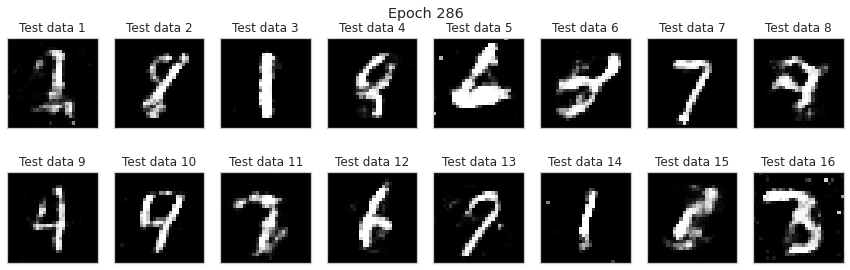

epoch: 287


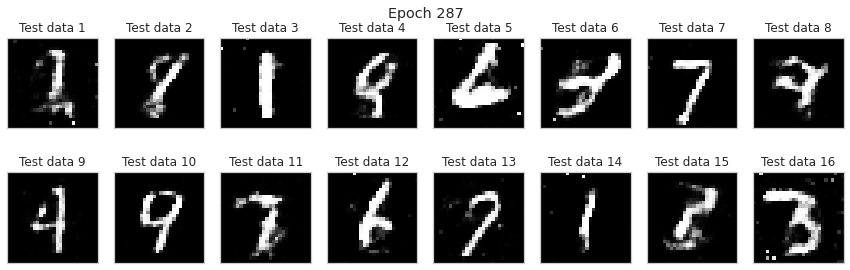

epoch: 288


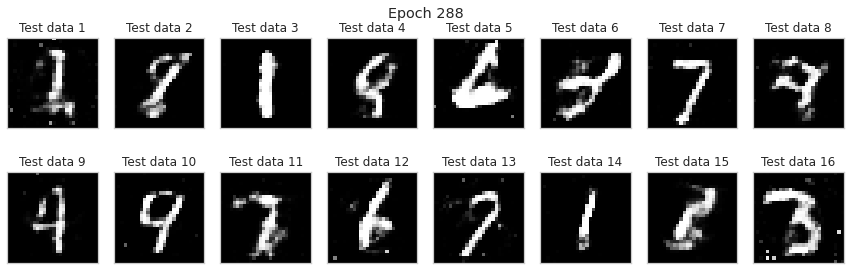

epoch: 289


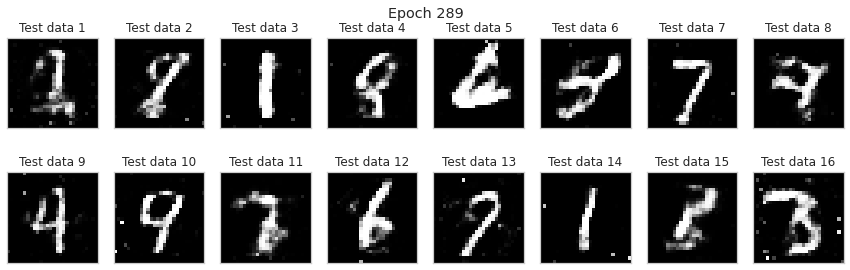

epoch: 290


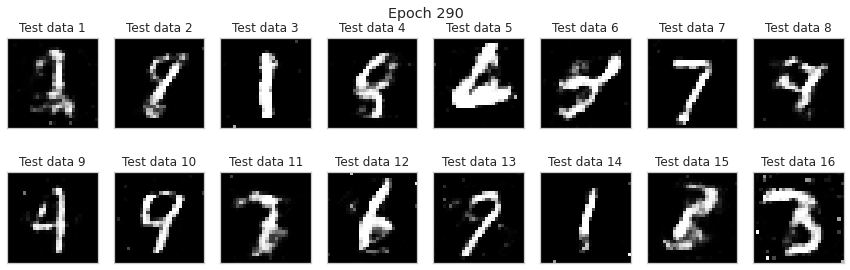

epoch: 291


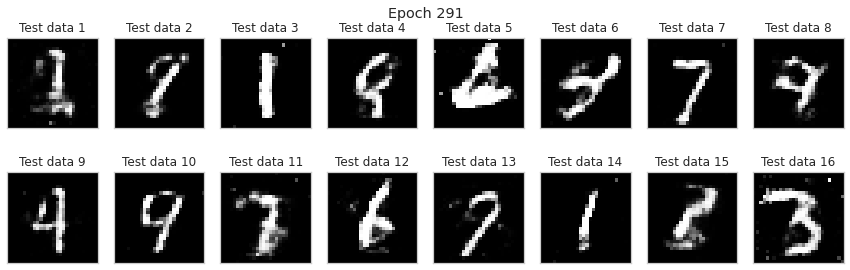

epoch: 292


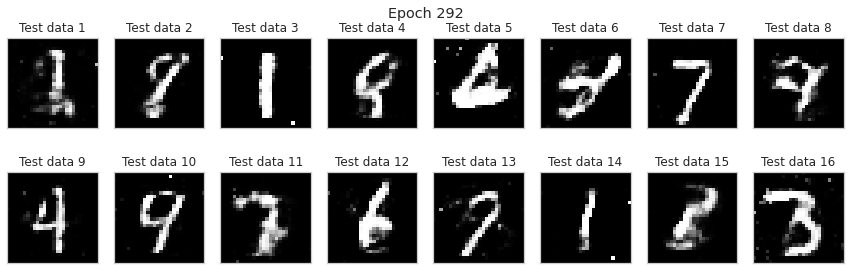

epoch: 293


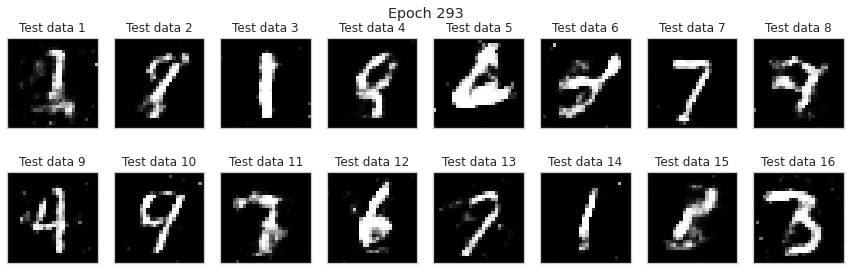

epoch: 294


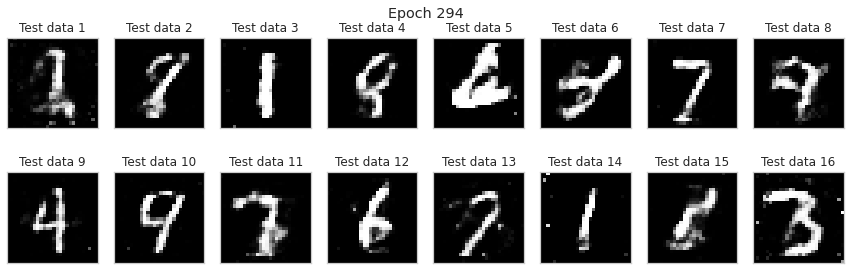

epoch: 295


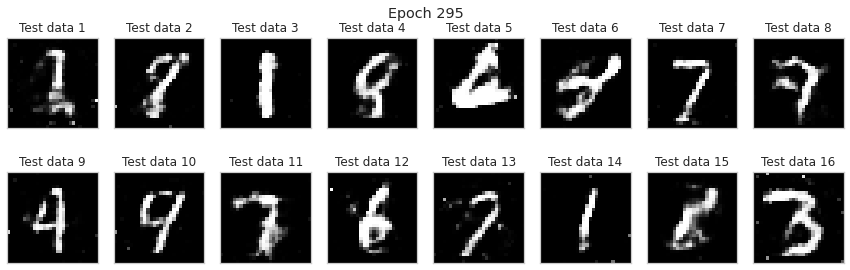

epoch: 296


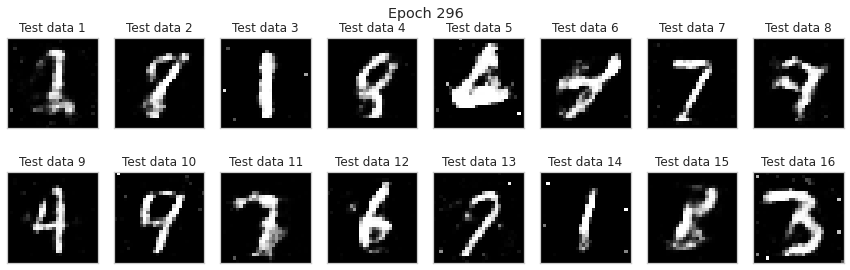

epoch: 297


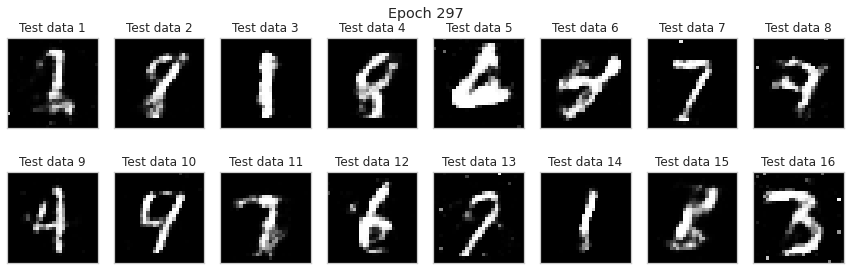

epoch: 298


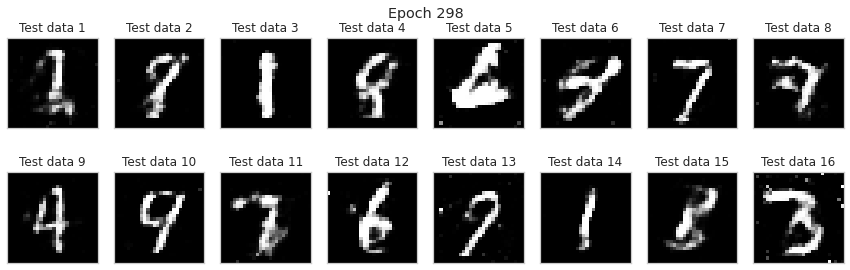

epoch: 299


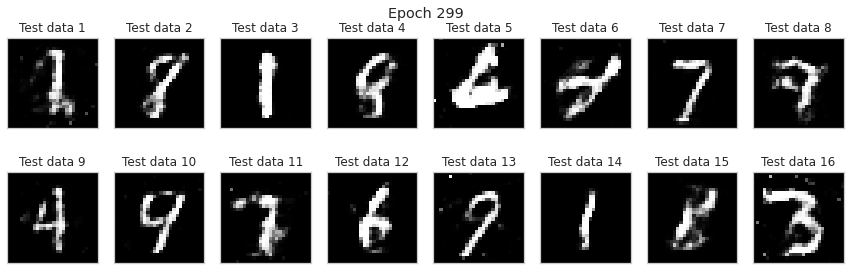

epoch: 300


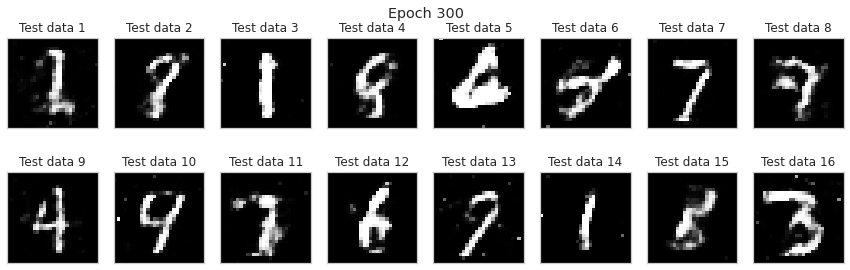

epoch: 301


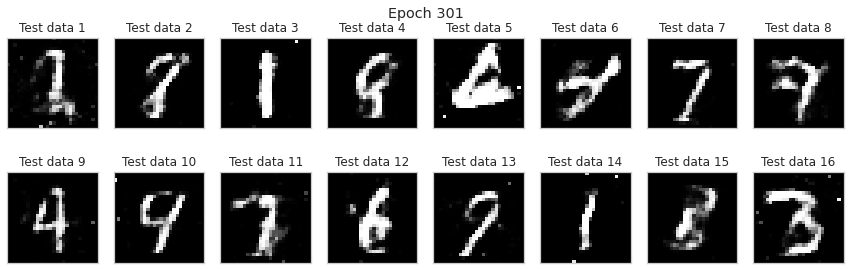

epoch: 302


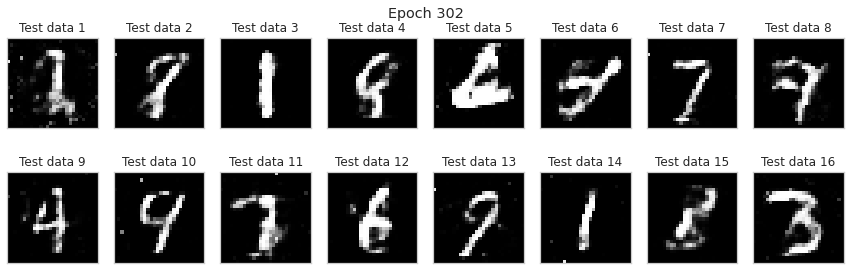

epoch: 303


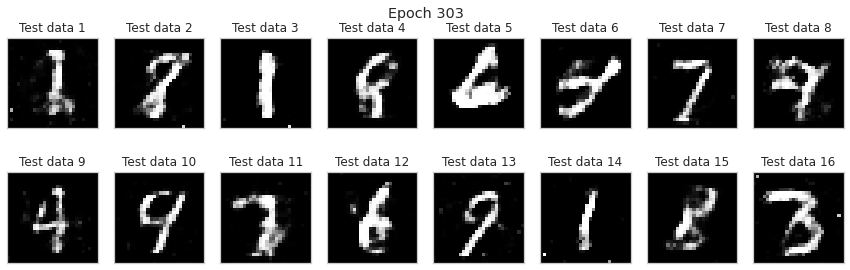

epoch: 304


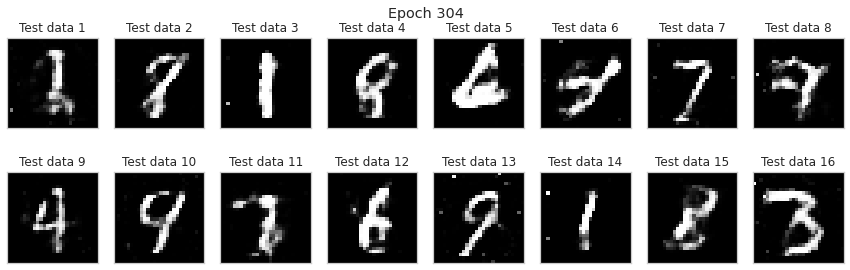

epoch: 305


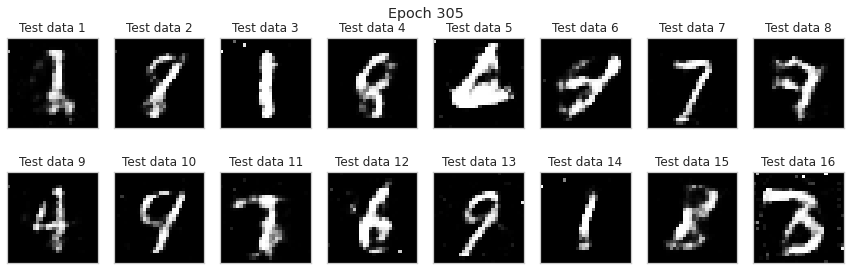

epoch: 306


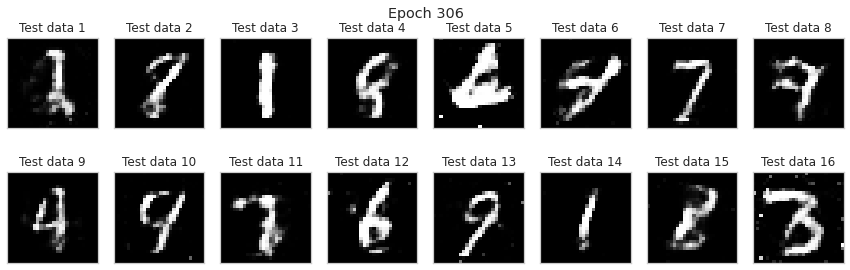

epoch: 307


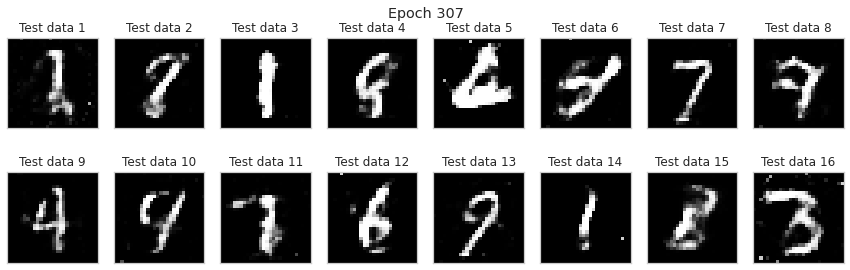

epoch: 308


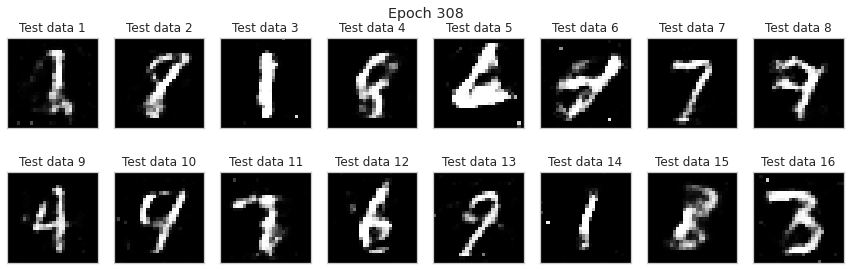

epoch: 309


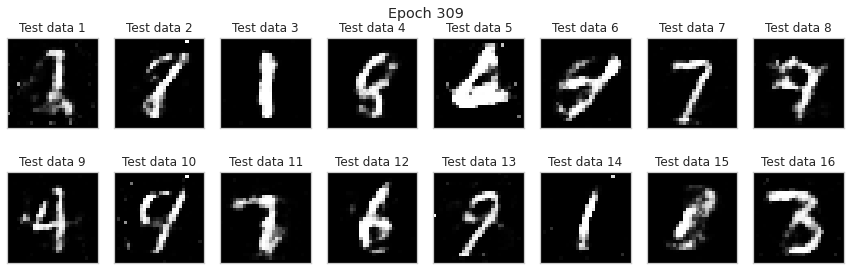

epoch: 310


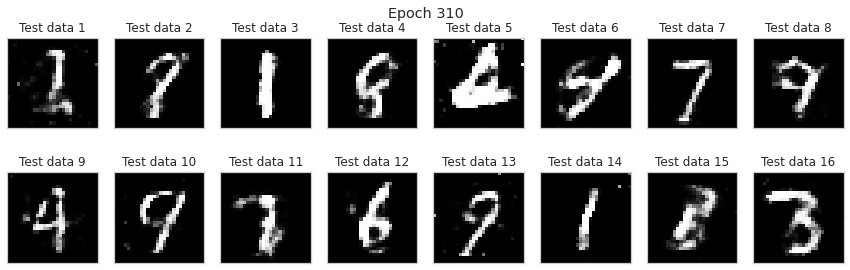

epoch: 311


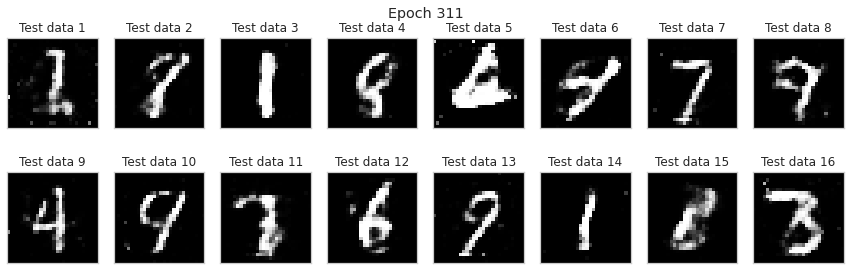

epoch: 312


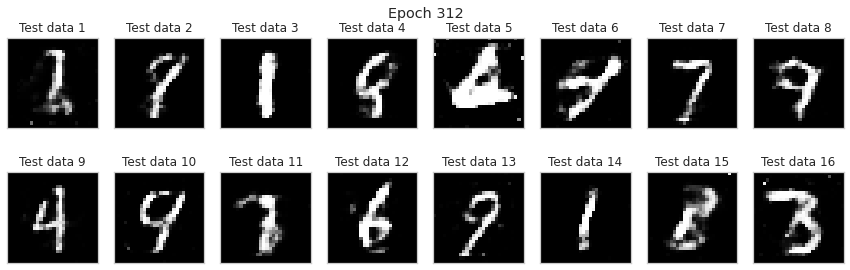

epoch: 313


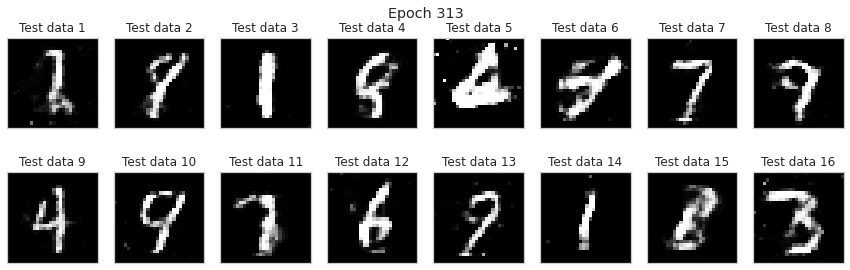

epoch: 314


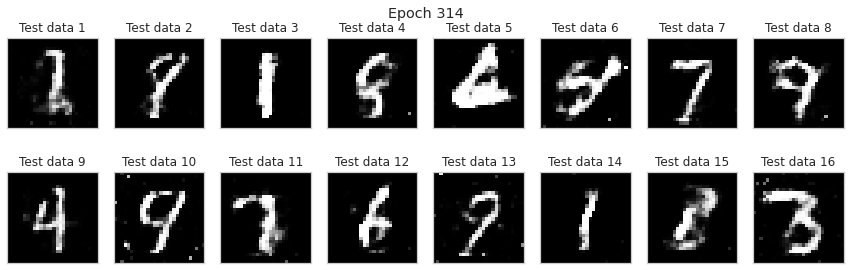

epoch: 315


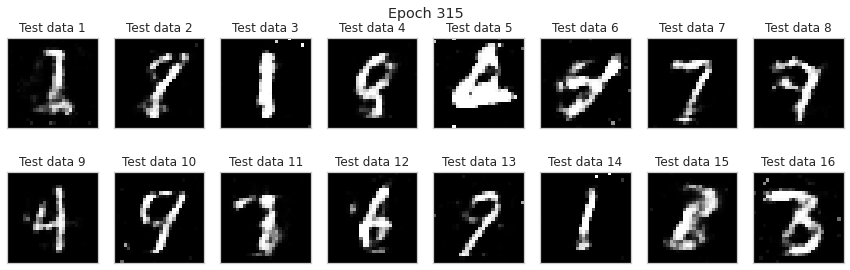

epoch: 316


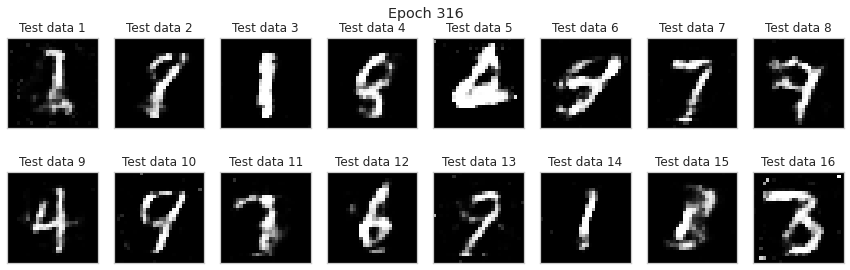

epoch: 317


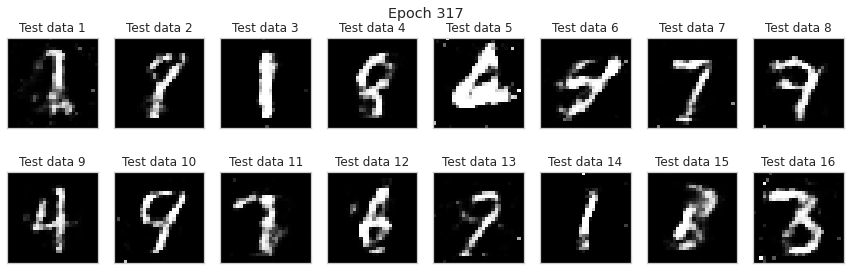

epoch: 318


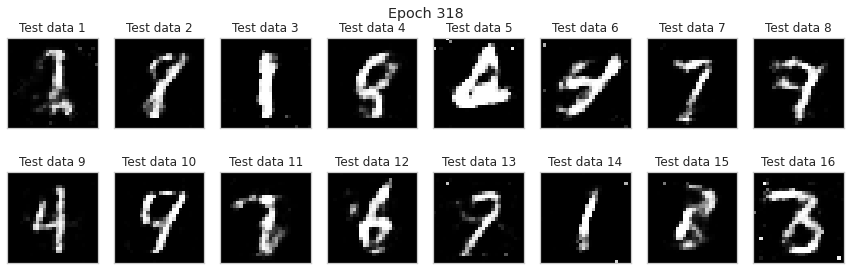

epoch: 319


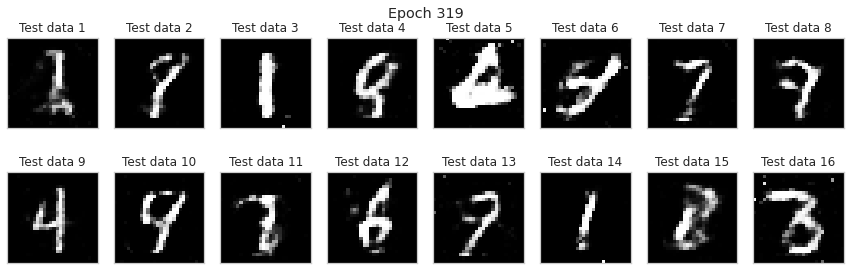

epoch: 320


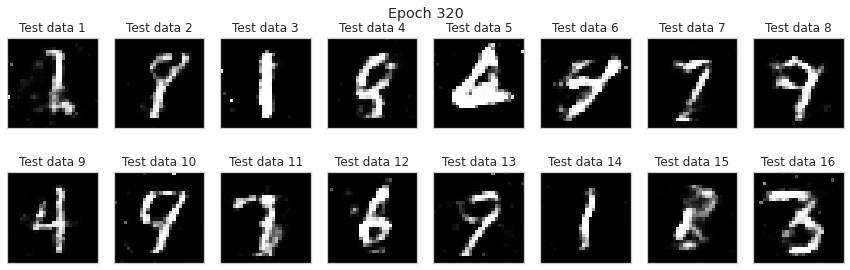

epoch: 321


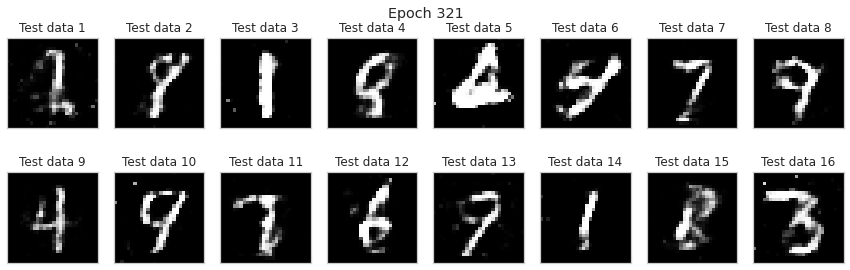

epoch: 322


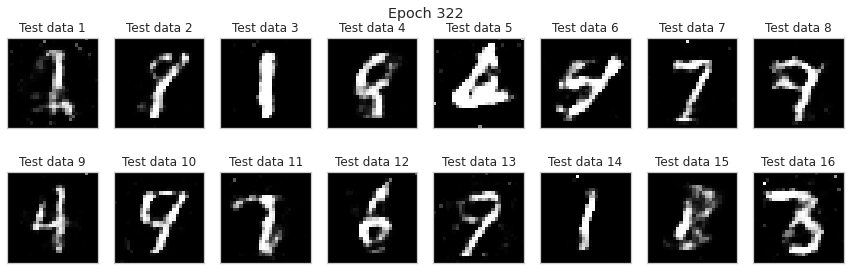

epoch: 323


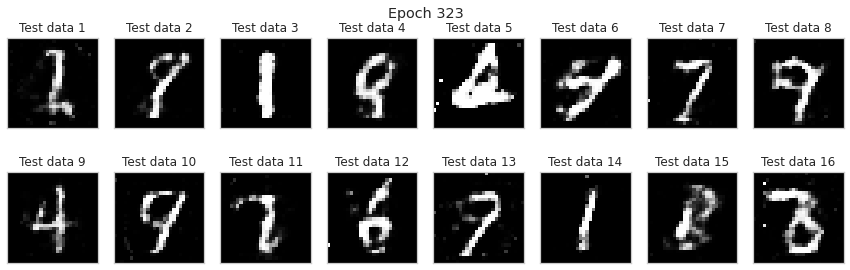

epoch: 324


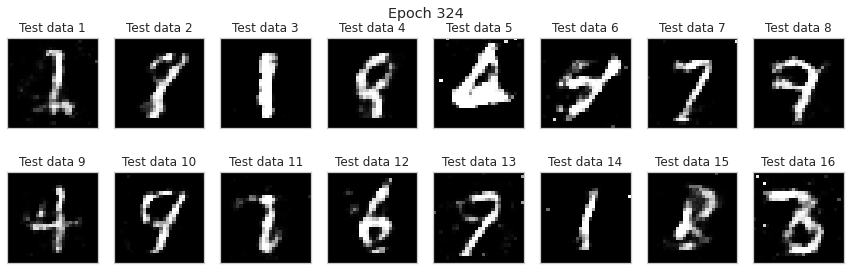

epoch: 325


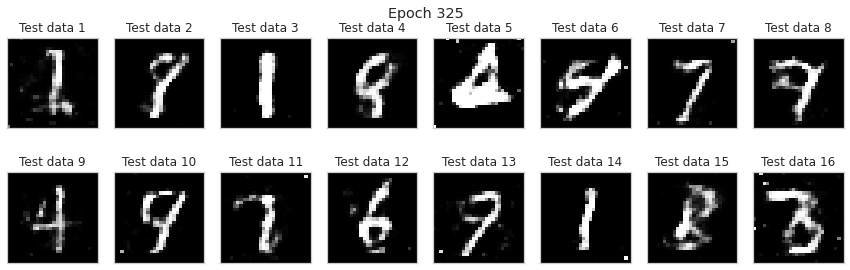

epoch: 326


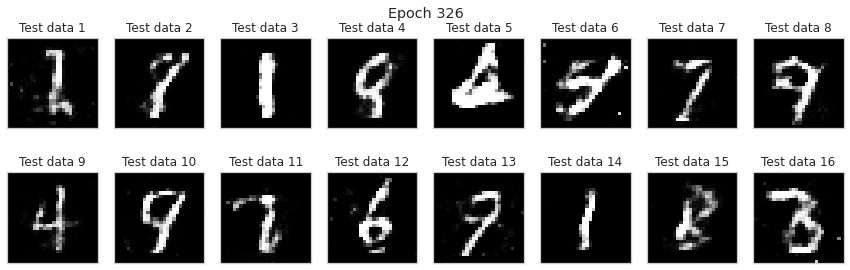

epoch: 327


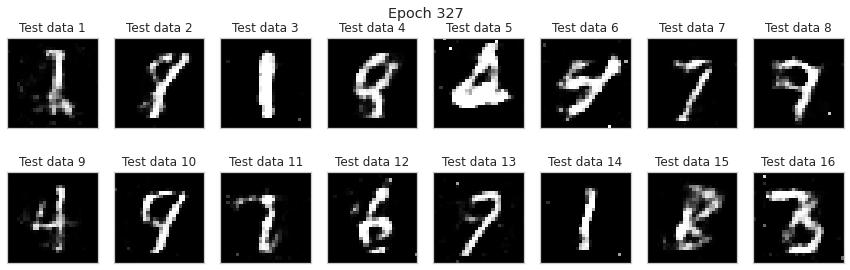

epoch: 328


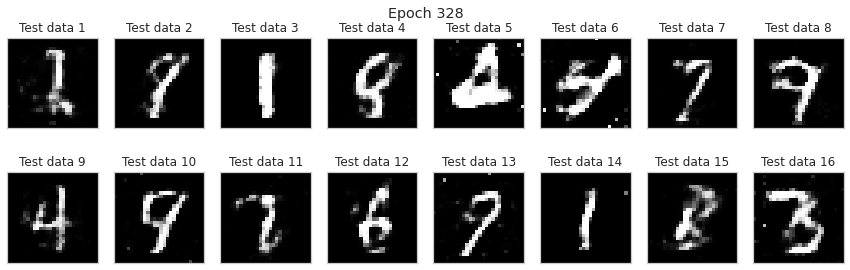

epoch: 329


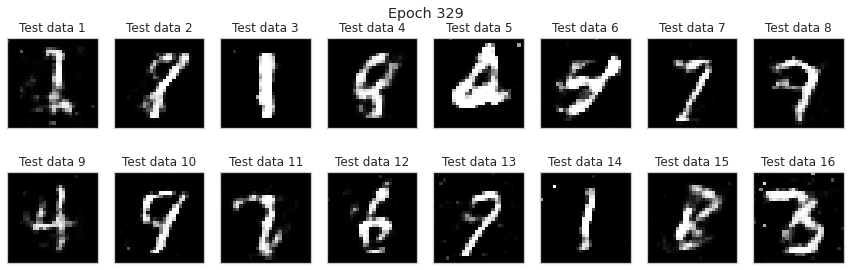

epoch: 330


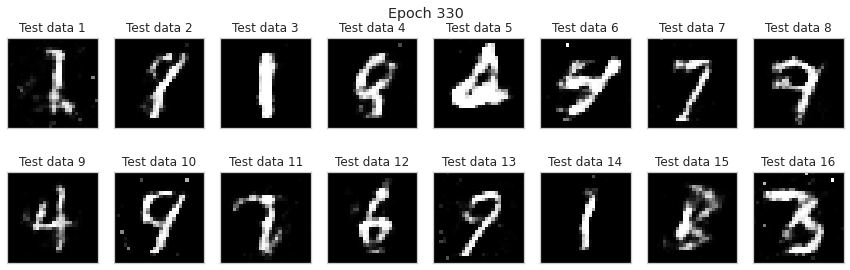

epoch: 331


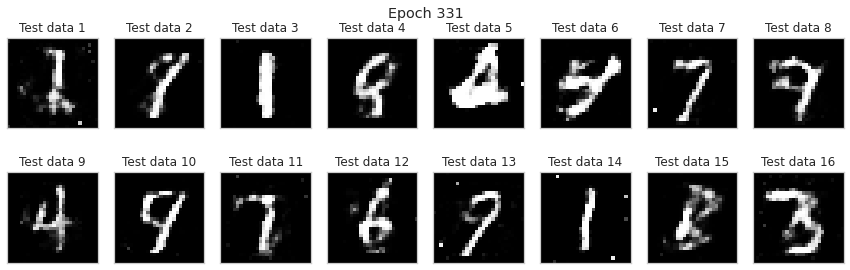

epoch: 332


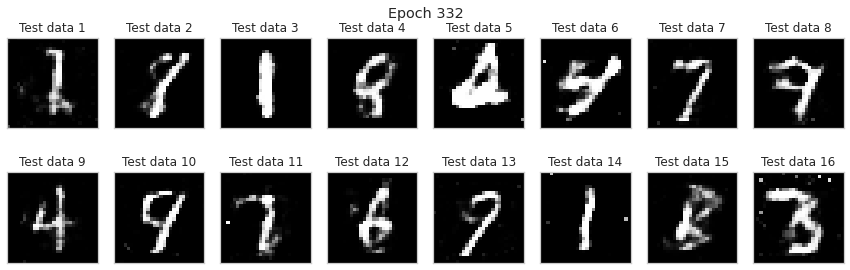

epoch: 333


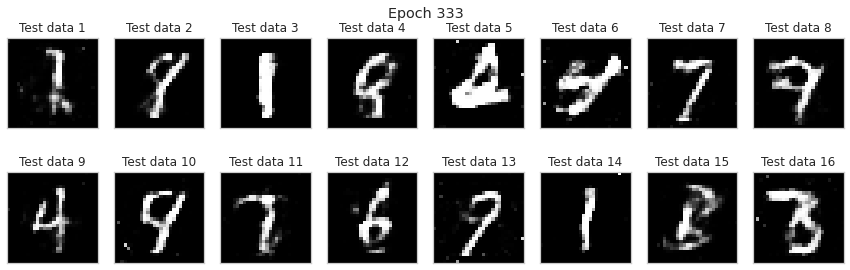

epoch: 334


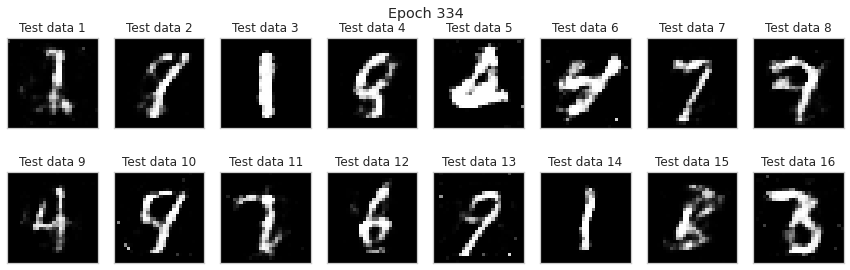

epoch: 335


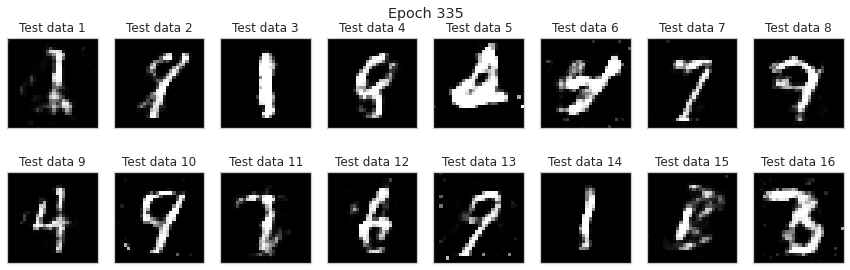

epoch: 336


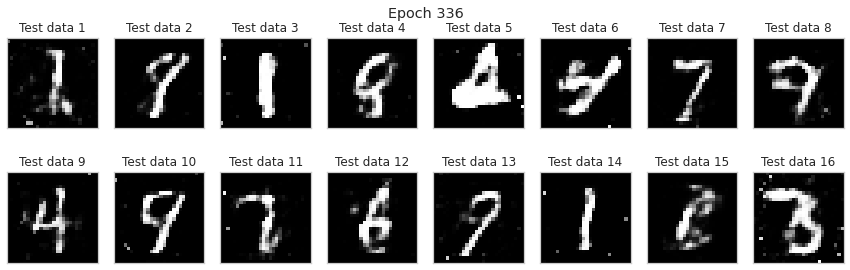

epoch: 337


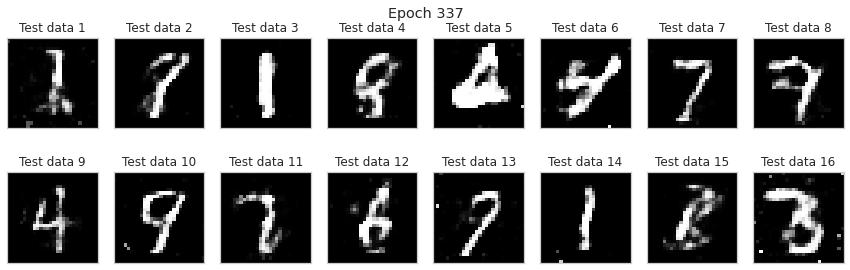

epoch: 338


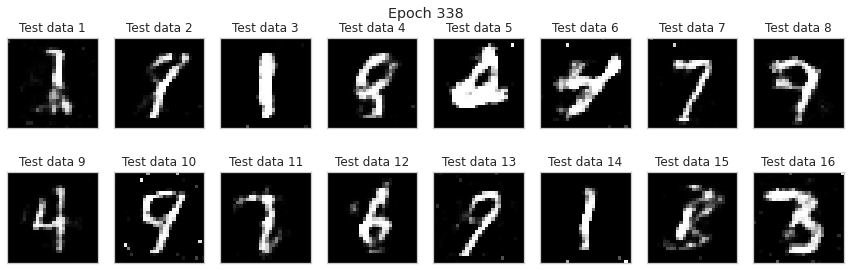

epoch: 339


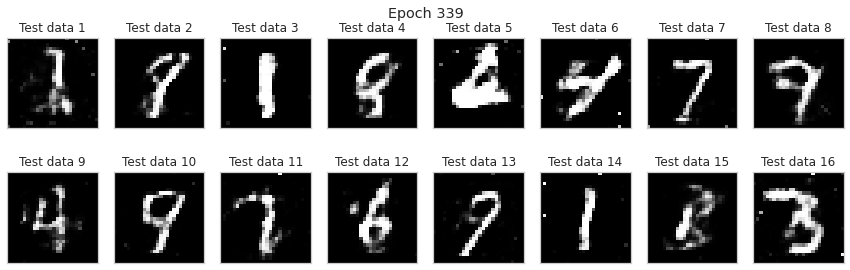

epoch: 340


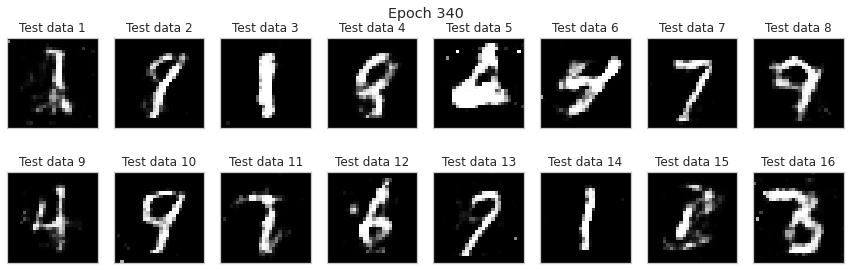

epoch: 341


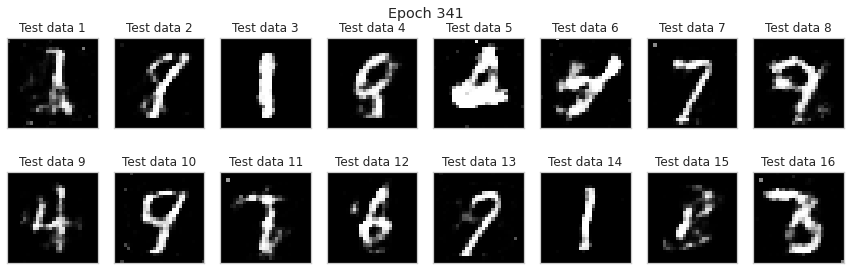

epoch: 342


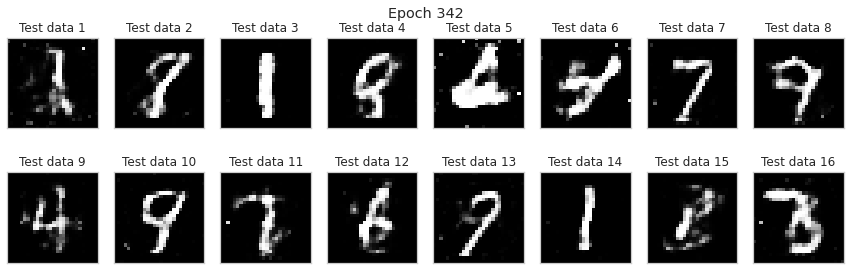

epoch: 343


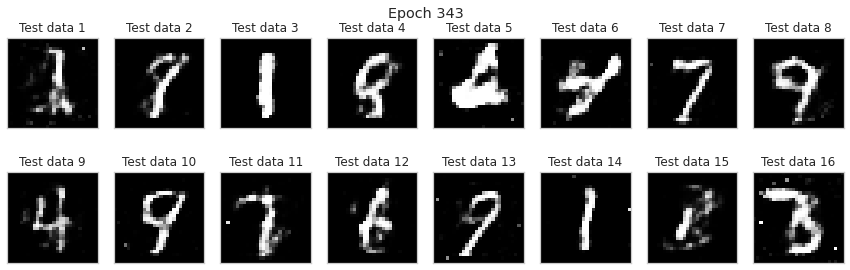

epoch: 344


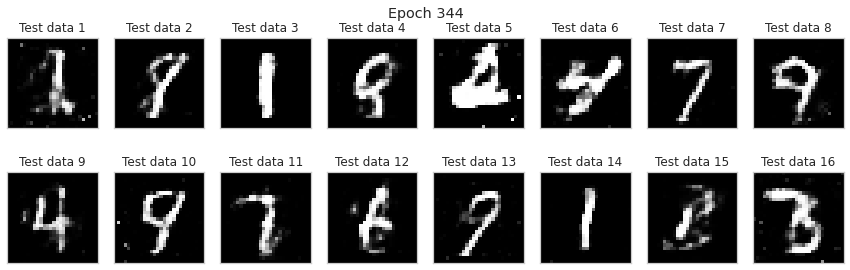

epoch: 345


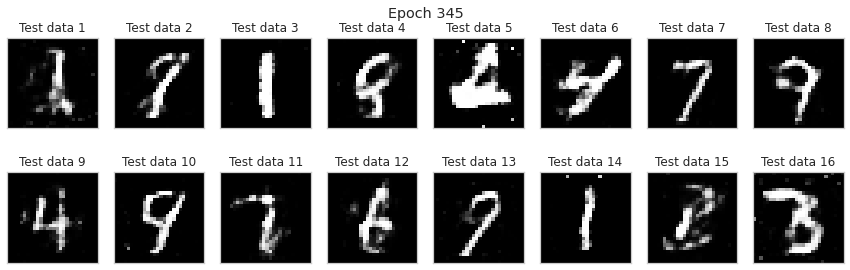

epoch: 346


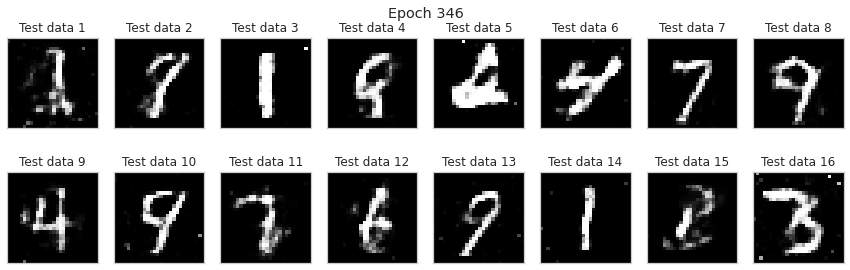

epoch: 347


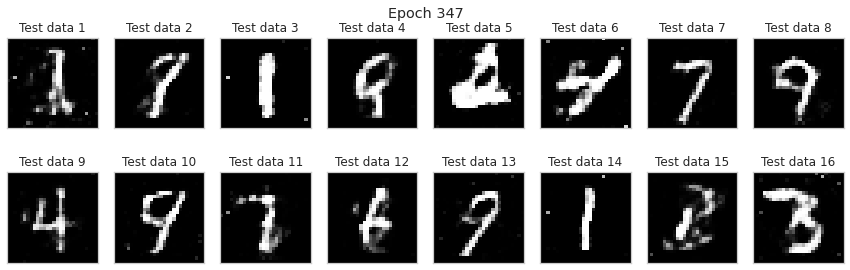

epoch: 348


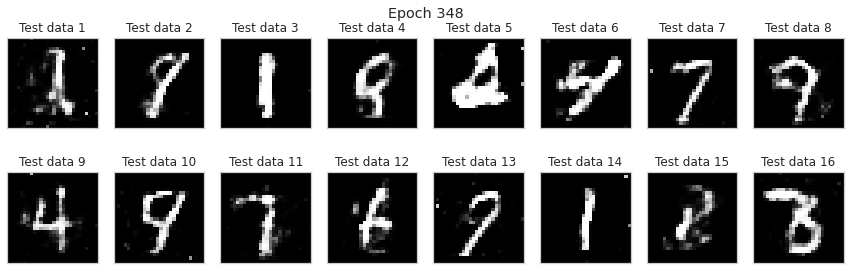

epoch: 349


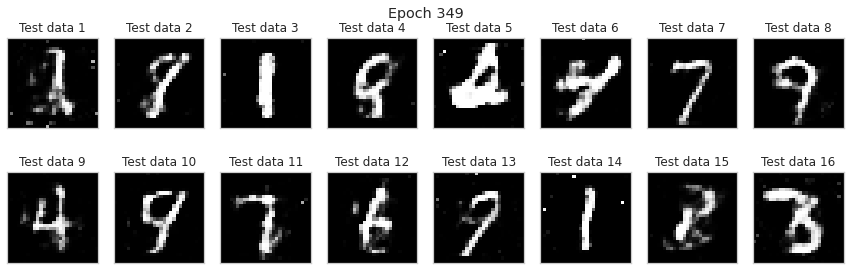

epoch: 350


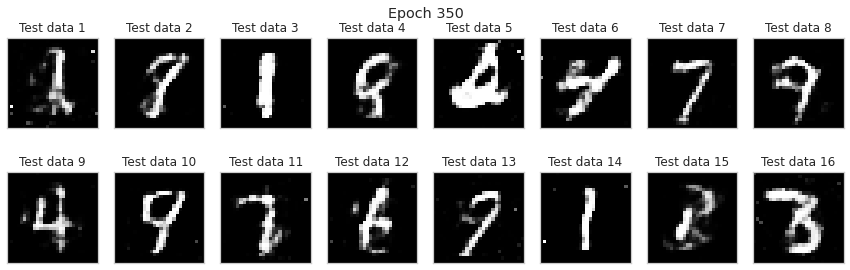

epoch: 351


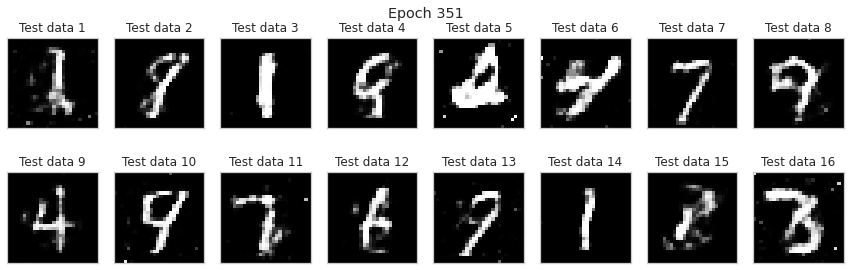

epoch: 352


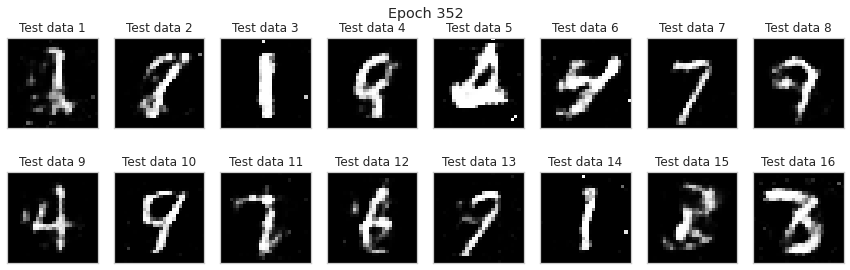

epoch: 353


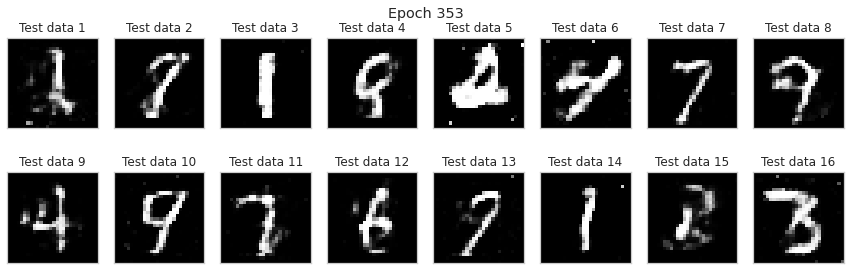

epoch: 354


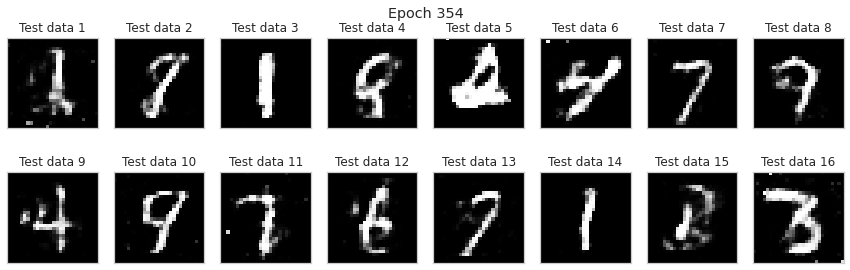

epoch: 355


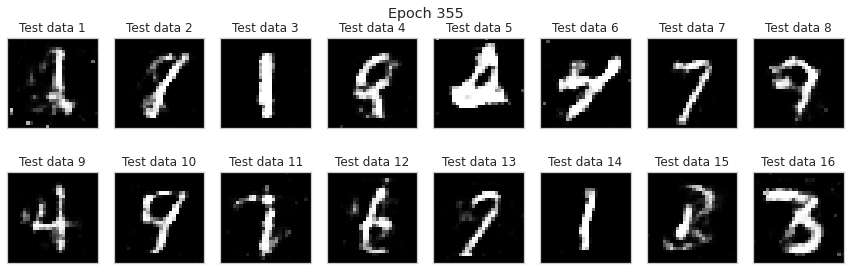

epoch: 356


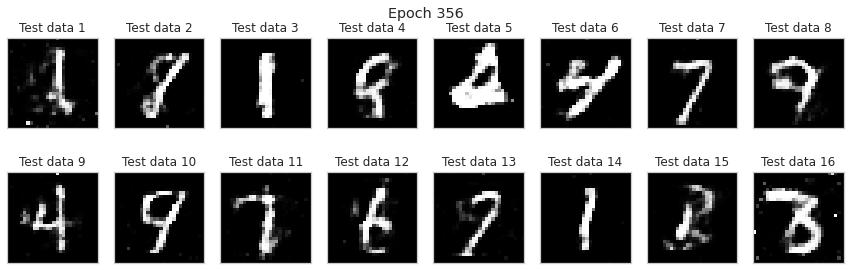

epoch: 357


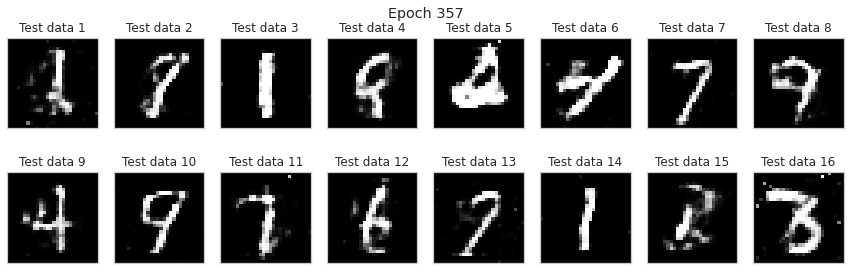

epoch: 358


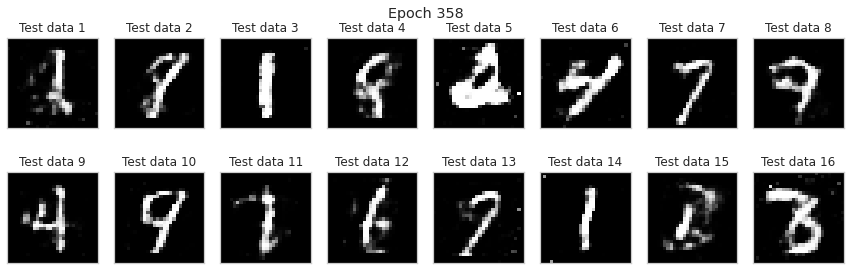

epoch: 359


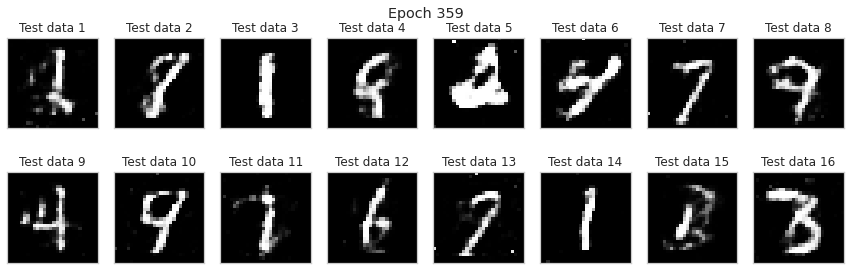

epoch: 360


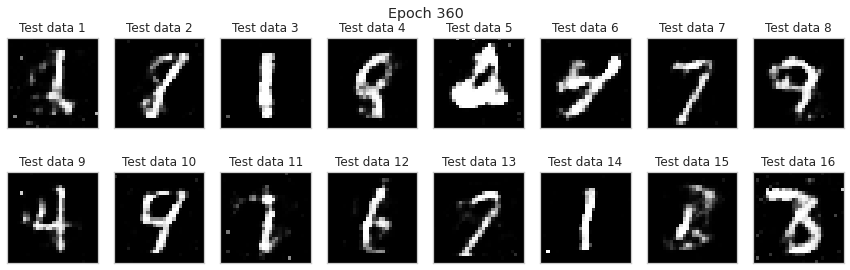

epoch: 361


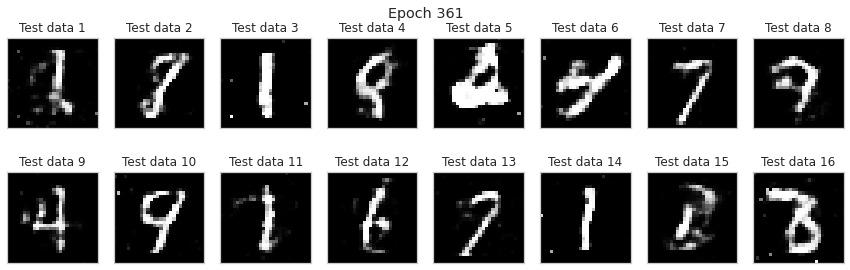

epoch: 362


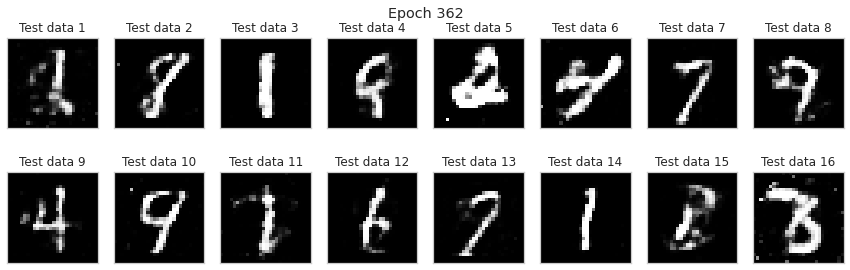

epoch: 363


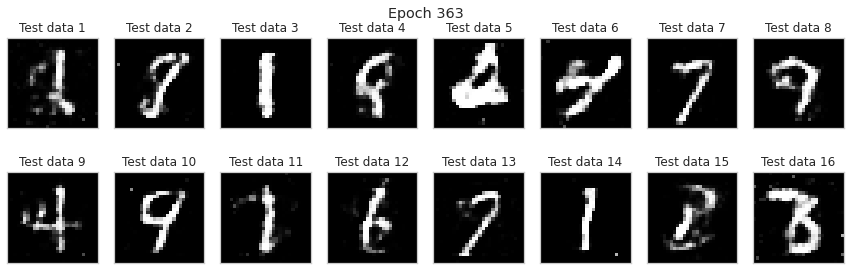

epoch: 364


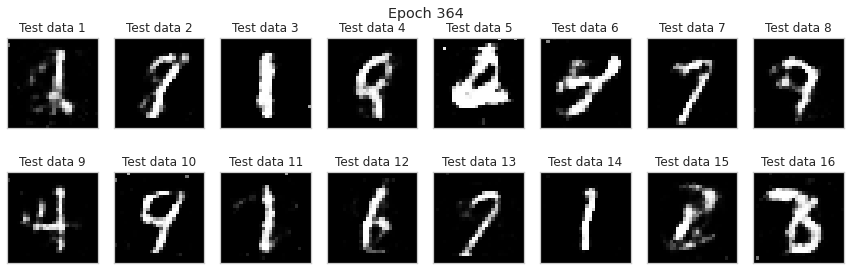

epoch: 365


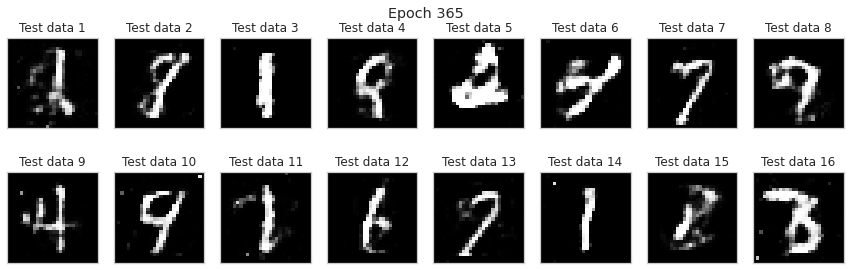

epoch: 366


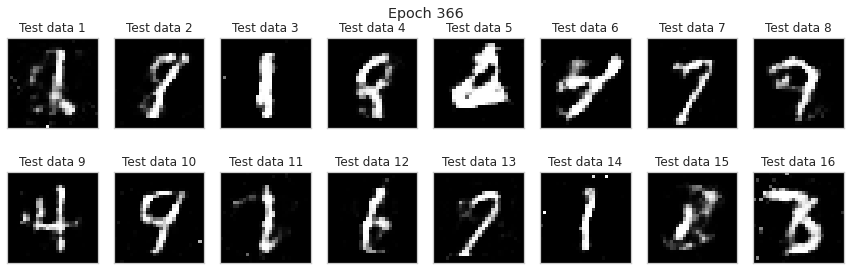

epoch: 367


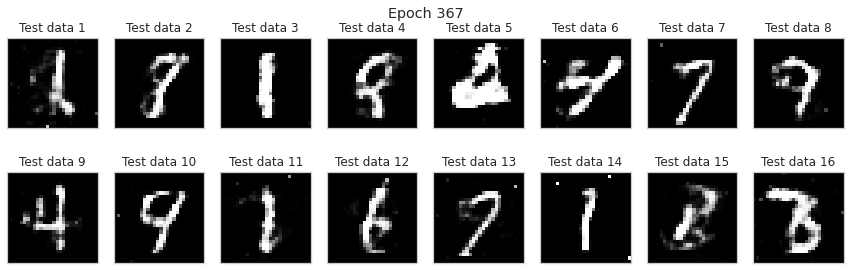

epoch: 368


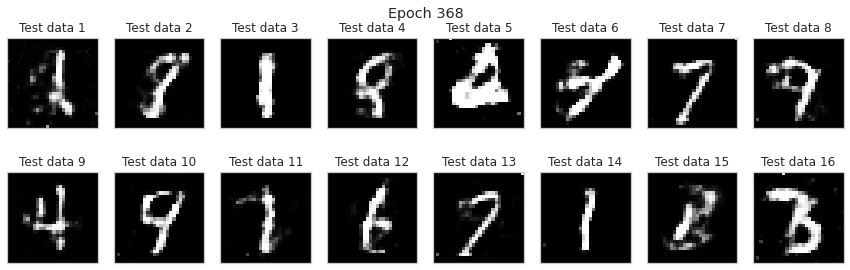

epoch: 369


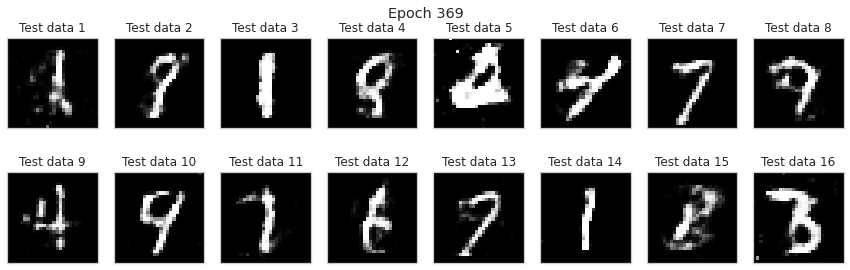

epoch: 370


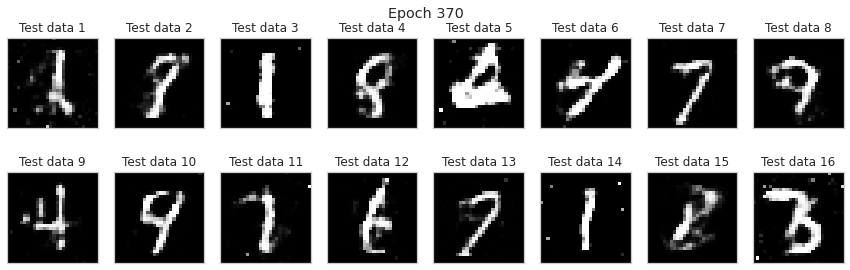

epoch: 371


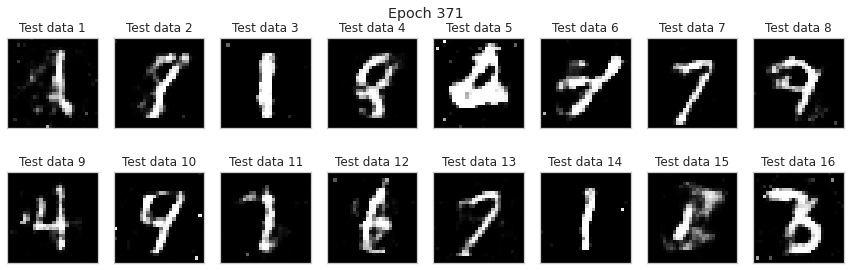

epoch: 372


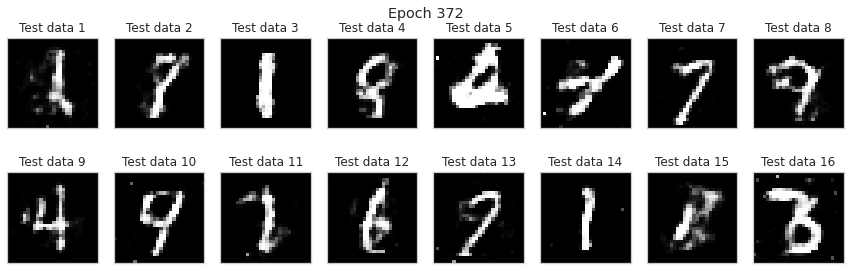

epoch: 373


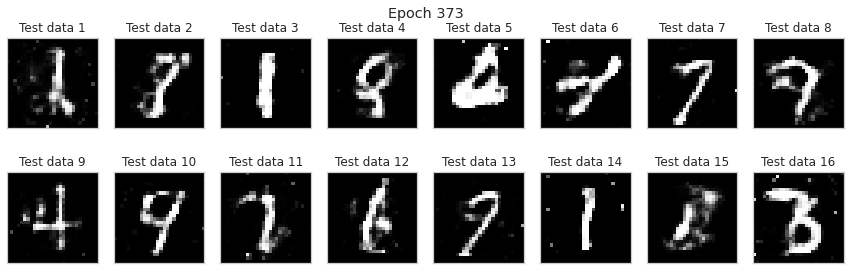

epoch: 374


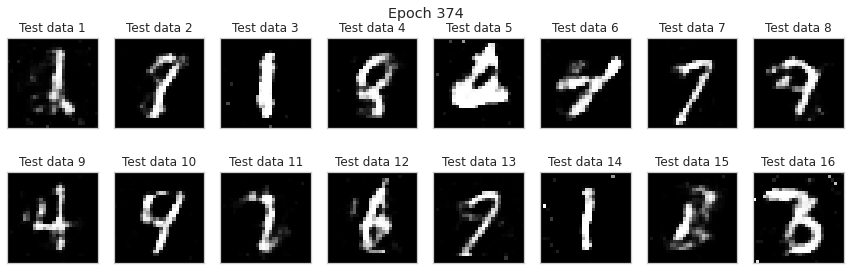

epoch: 375


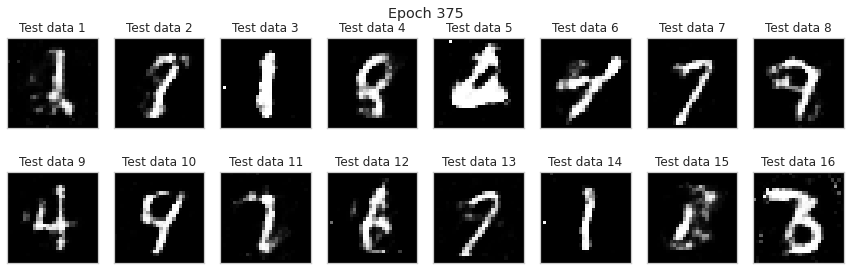

epoch: 376


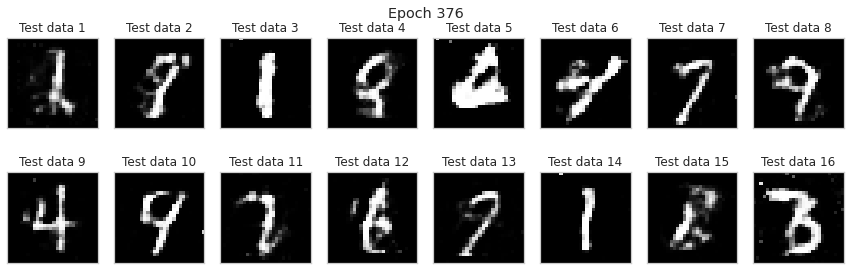

epoch: 377


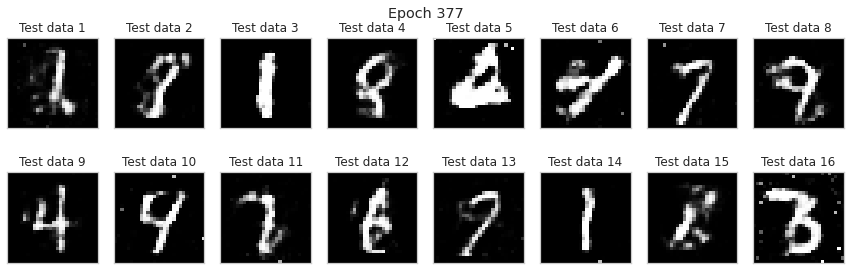

epoch: 378


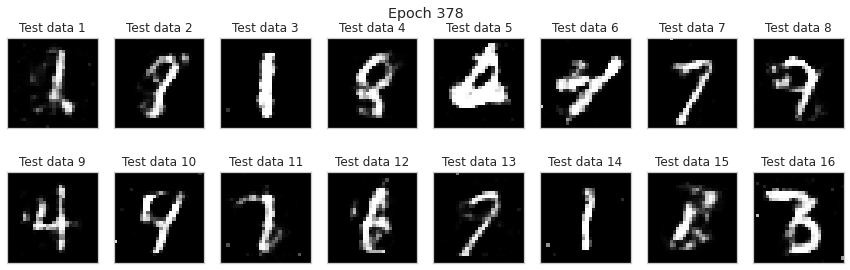

epoch: 379


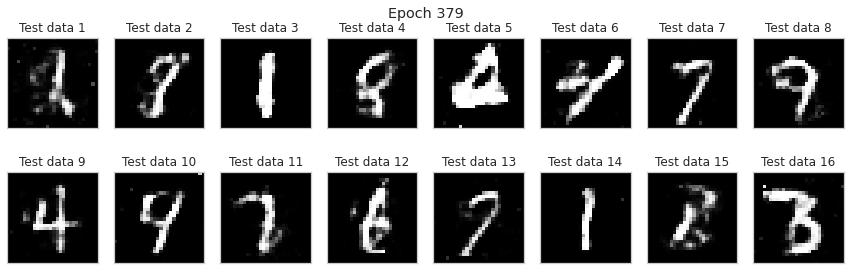

epoch: 380


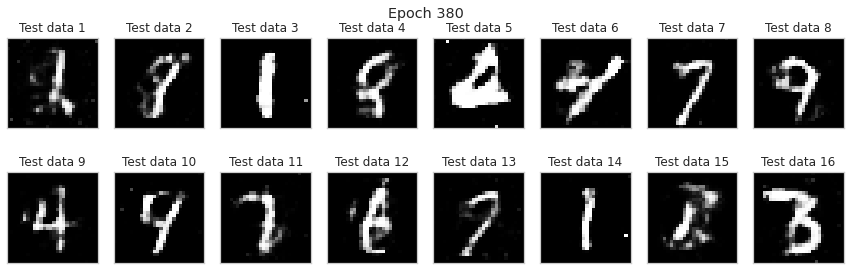

epoch: 381


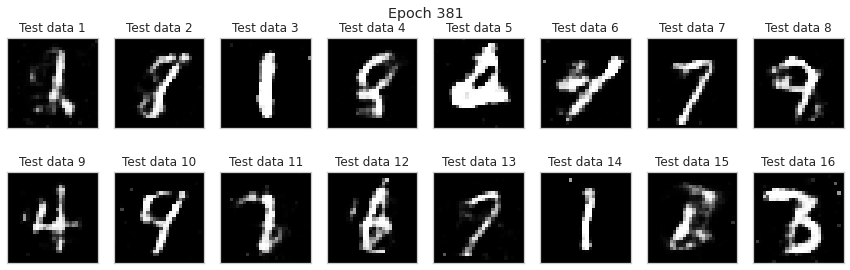

epoch: 382


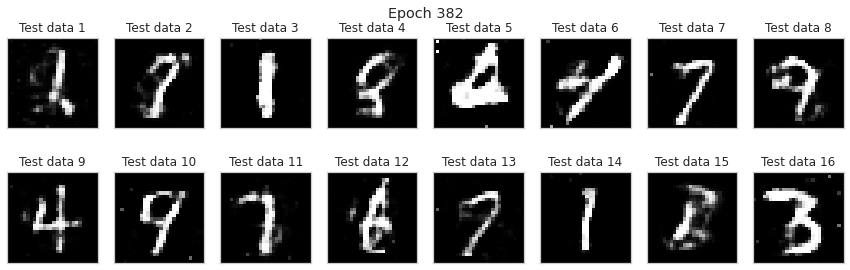

epoch: 383


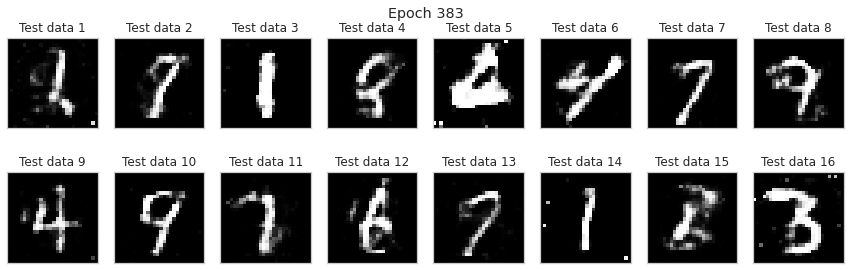

epoch: 384


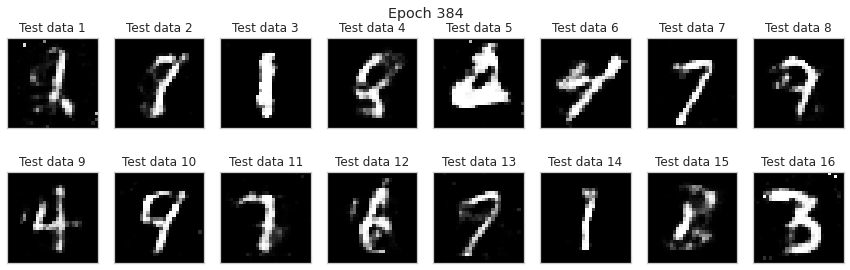

epoch: 385


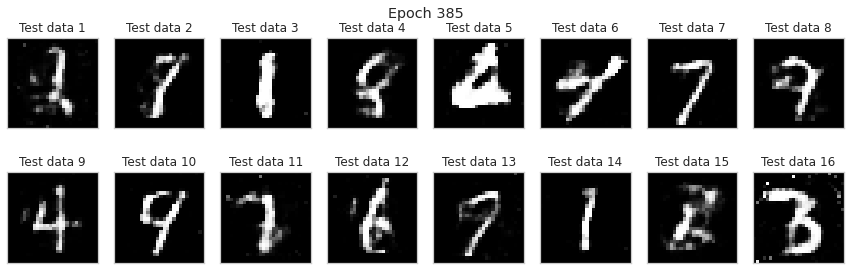

epoch: 386


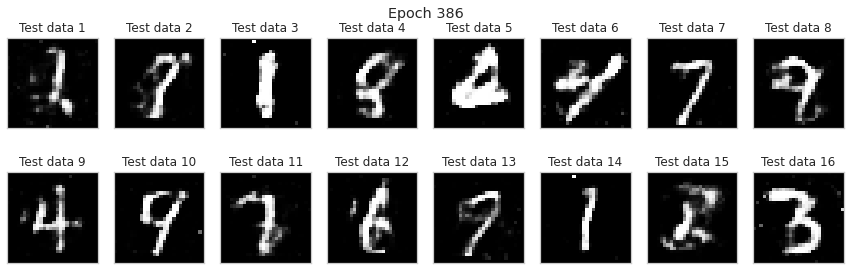

epoch: 387


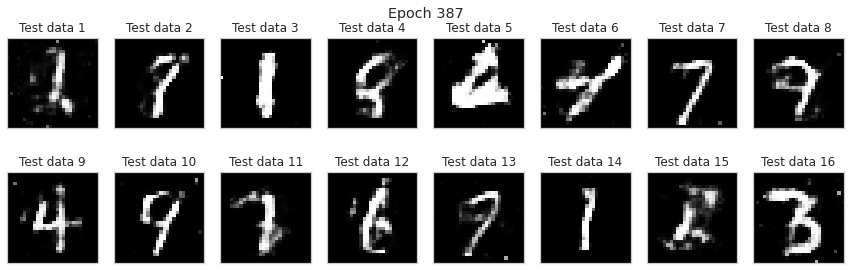

epoch: 388


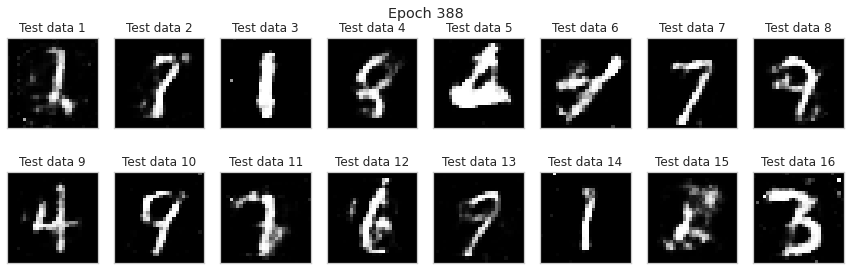

epoch: 389


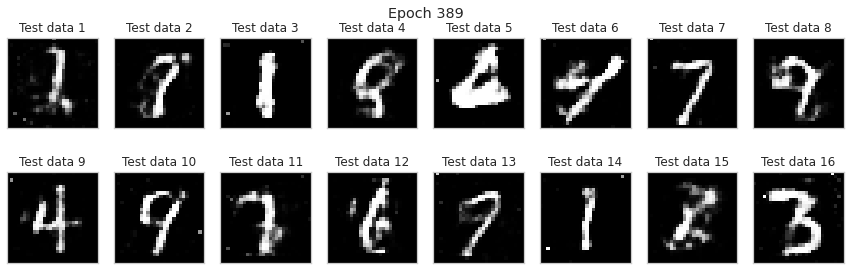

epoch: 390


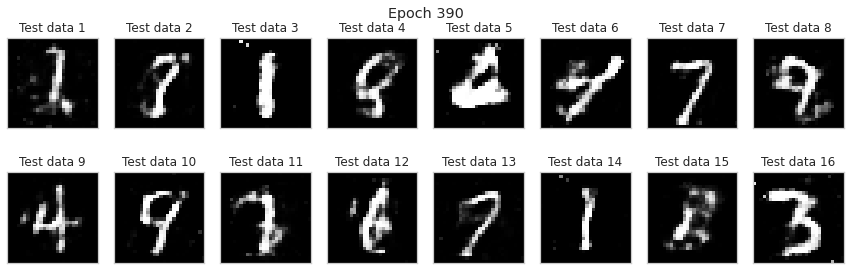

epoch: 391


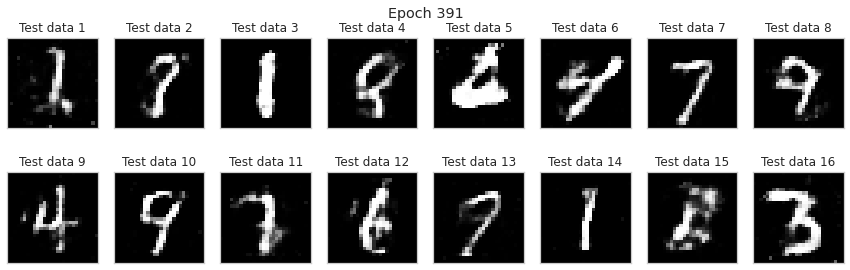

epoch: 392


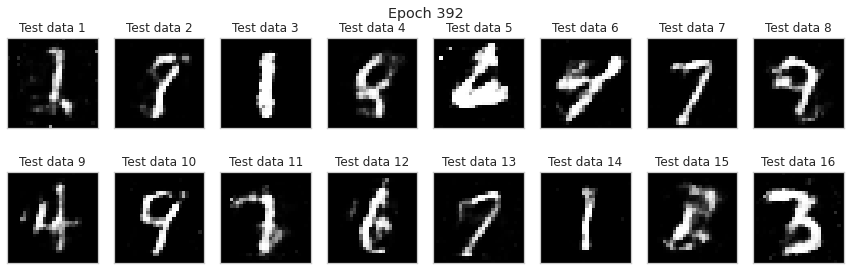

epoch: 393


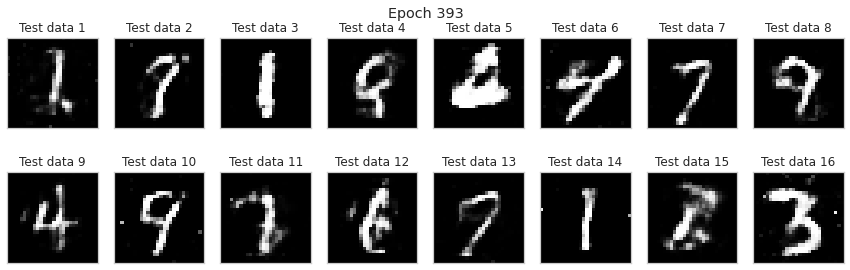

epoch: 394


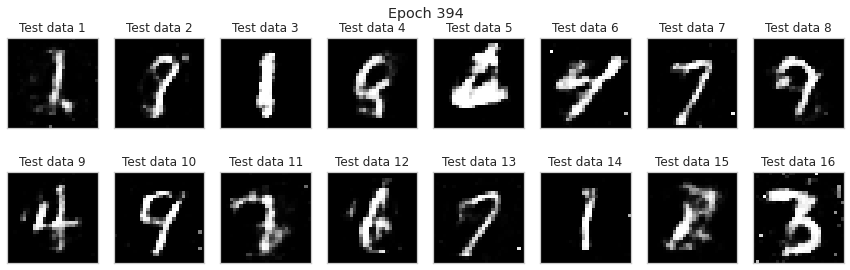

epoch: 395


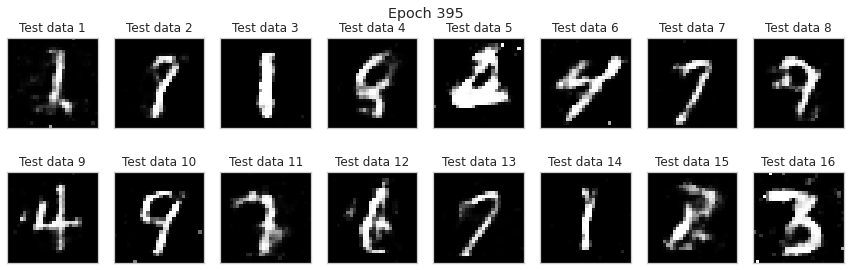

epoch: 396


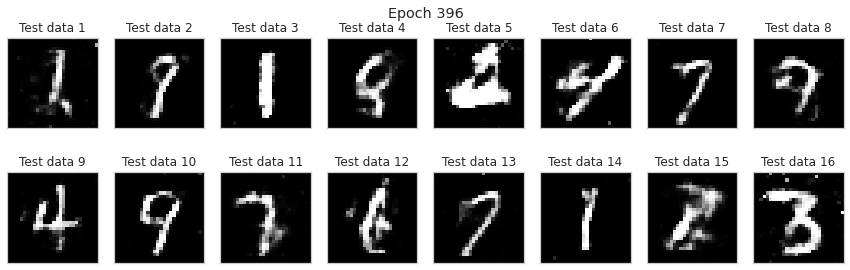

epoch: 397


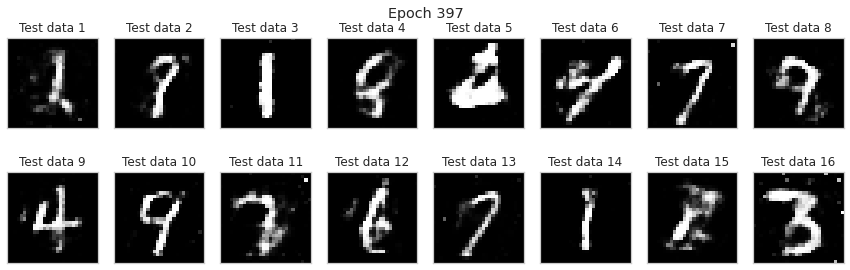

epoch: 398


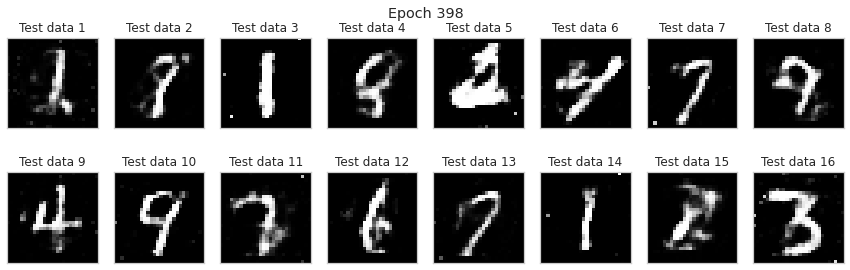

epoch: 399


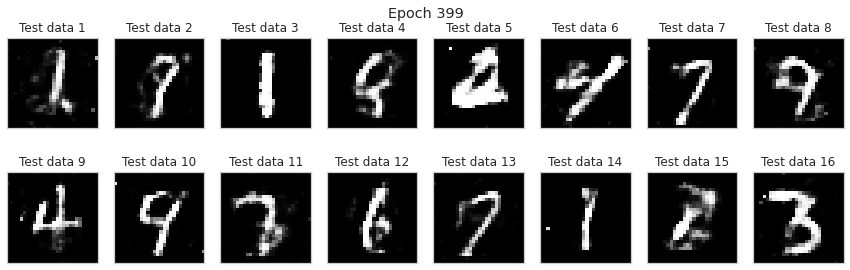

epoch: 400


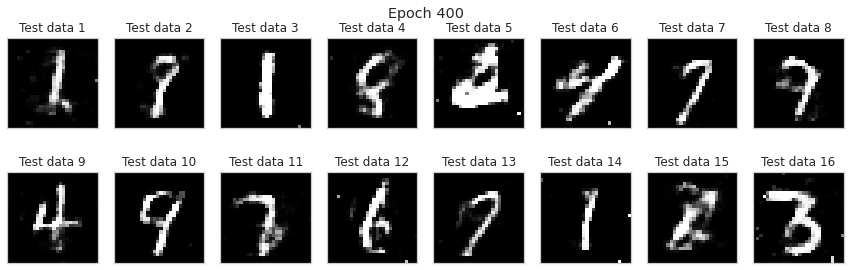

In [ ]:
num_epochs = 400
train_loss_d = []
train_loss_g = []
for epoch in range(num_epochs):
    print("epoch:",epoch+1)
    for n_batch, (real_batch,_) in enumerate(train_dataloader):
        N = real_batch.size(0)
        #print("N:",N)
        discriminator.train()
        generator.eval()
        # Train Discriminator
        real_data = real_batch.view(N, 784).to(device)
        fake_data = generator(gen_data(N,100)).detach()

        d_error, d_pred_real, d_pred_fake = train_discriminator(d_optimizer, real_data, fake_data)
        
        discriminator.eval()
        generator.train()
        # Train Generator
        # Generate fake data
        fake_data = generator(gen_data(N,100))
        
        g_error = train_generator(g_optimizer, fake_data)
        
        
    generator.eval()
    with torch.no_grad():
        test_images = generator(test_noise).view(generator(test_noise).size(0),1,28,28).detach().cpu().numpy()
    fig, axs = plt.subplots(2, 8, figsize=(12,4.1))
    axs = axs.ravel()
    fig.suptitle("Epoch %d" %(epoch + 1))
    fig.subplots_adjust(top=0.85)
    for i in range(16):
      axs[i].imshow(test_images[i][0], cmap='gray', interpolation='none')
      axs[i].set_title('Test data {}'.format(i+1))
      axs[i].grid()
      axs[i].xaxis.set_major_locator(plt.NullLocator())
      axs[i].yaxis.set_major_locator(plt.NullLocator())
    plt.tight_layout()
    
    os.makedirs(mydrive+'imgs/GAN', exist_ok=True)
    fig.savefig(mydrive+'imgs/GAN/epoch_%d.jpg' % (epoch + 1))
    plt.show()
    plt.close()
    train_loss_d.append(d_error)
    train_loss_g.append(g_error)

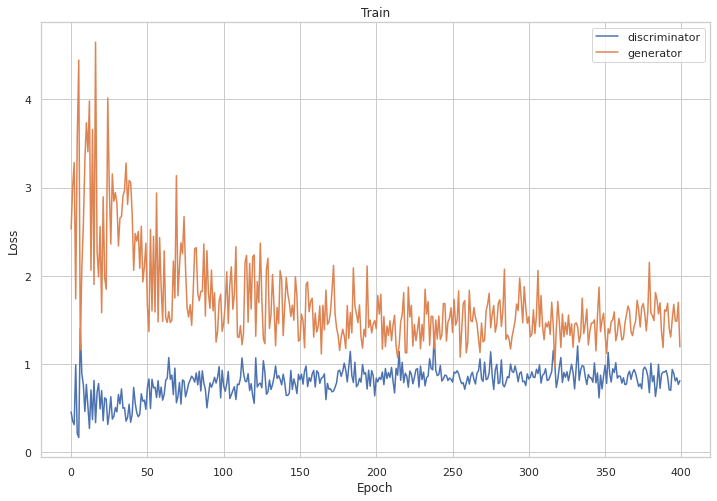

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.plot(train_loss_d , label='discriminator')
plt.plot(train_loss_g, label='generator')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Train")
plt.legend()
plt.show()
fig.savefig(mydrive+'loss GAN.png')

In [ ]:
folder = mydrive+'imgs/GAN' 
files = [f"{folder}/{file}" for file in os.listdir(folder)]
images = [imageio.imread(file) for file in files]
imageio.mimwrite(mydrive+'imgs/gan.gif', images, fps=20)